In [3]:
!conda activate savingsGameData

# Import libraries and dataframes from `dataframes.py`

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## dataframes file
from dataframes import *

C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/866451334.py:6: DtypeWarning: Columns (24,25,39,42,43,46,48,81,99,117,135,153,171,189,207,225,243,261,279,297,315,333,351,369,387,405,423,441,459,477,495,513,531,549,567,585,603,621,639,657,675,693,711,729,747,765,783,801,819,837,855,873,891,909,927,945,963,981,999,1017,1035,1053,1071,1089,1107,1125,1143,1161,1179,1197,1215,1233,1251,1269,1287,1305,1323,1341,1359,1377,1395,1413,1431,1449,1467,1485,1503,1521,1539,1557,1575,1593,1611,1629,1647,1665,1683,1701,1719,1737,1755,1773,1791,1809,1827,1845,1863,1881,1899,1917,1935,1953,1971,1989,2007,2025,2043,2061,2079,2097,2115,2133,2151,2169,2187,2205,2223,2417,2436,2445,2446,2525,2542,2559,2578,2579,2581) have mixed types.Specify dtype option on import or set low_memory=False.
  from dataframes import *


shape:  (1850, 2111)
participant, shape:  (1850, 41)
init, shape:  (1850, 140)
Questionnaire, shape:  (1850, 44)
BRET, shape:  (1850, 32)
lossAversion, shape:  (1850, 18)
riskPreferences, shape:  (1850, 18)
wisconsin, shape:  (1850, 22)
timePreferences, shape:  (1850, 56)
Finance, shape:  (1850, 36)
Inflation, shape:  (1850, 62)
Numeracy, shape:  (1850, 26)
task_Instructions, shape:  (1850, 43)
task, shape:  (1850, 1818)
task_questions, shape:  (1850, 23)
task_int_rl, shape:  (1850, 14)
task_int_cx, shape:  (1850, 39)
redirectapp, shape:  (1850, 15)
sessionResults, shape:  (1850, 20)
redirecttopayment, shape:  (1850, 14)
df_list len:  19
19
init.1.player.id_in_group
Questionnaire.1.player.id_in_group
BRET.1.player.id_in_group
lossAversion.1.player.id_in_group
riskPreferences.1.player.id_in_group
wisconsin.1.player.id_in_group
timePreferences.1.player.id_in_group
Finance.1.player.id_in_group
Inflation.1.player.id_in_group
Numeracy.1.player.id_in_group
task_Instructions.1.player.id_in_gr

c:\Users\nlawrenc\OneDrive - Université Paris II Pantheon-Assas\Documents\Programmation\savings-game-data\dataframes.py:258: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  new_timePreferences.dicts = new_timePreferences.delay_order.apply(json.loads)
c:\Users\nlawrenc\OneDrive - Université Paris II Pantheon-Assas\Documents\Programmation\savings-game-data\dataframes.py:321: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  new_riskPreferences.dicts = new_riskPreferences.responses.apply(json.loads)
c:\Users\nlawrenc\OneDrive - Université Paris II Pantheon-Assas\Documents\Programmation\savings-game-data\dataframes.py:373: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.

making decision now!


100%|██████████| 120/120 [00:32<00:00,  3.73it/s]

decision type:  <class 'int'>
done


# Create dict and list for results

In [5]:
metrics_list = []
metrics_dict = {}
results_dict = {}

# Filter `complete` by final payments row and remove extra columns

In [6]:
d = complete.copy()
d = d[~(d['participant._current_app_name'] != 'redirecttopayment')]
d = d.dropna(axis=1, how='all')
d = d[d.columns.drop(list(d.filter(regex=f'''id_in_session|session.config|redirecttopayment|sessionResults|session.|room|participant._is_bot|participant._index_in_pages|participant._max_page_index|participant._current_app_name|participant._current_page_name|participant.time_started_utc|participant.visited''')))]
# d.filter(regex=f'session.config|redirecttopayment|sessionResults')

# Sum total correct responses for knowledge

In [7]:
d['participant.remunerated_questions'] = d['participant.remunerated_questions'].apply(eval)
# d['participant.remunerated_questions']

In [8]:
for i in range(len(d.index)):
    x = sum(d['participant.remunerated_questions'].iloc[i])
    d['participant.remunerated_questions'].iloc[i] = x

# Filter `Questionnaire` columns

In [9]:
q = final_df_dict['Questionnaire'].copy()
q = q.sort_values('participant.label')
q = q[q.columns.drop(list(q.filter(regex=f'''player.id_in_group|payoff|responseTime|id_in_subsession|time_started_utc|participant.day''')))]
# q

# Filter behavioral task df columns

In [10]:
tasks = {
    'BRET':'boxes_collected',
    'lossAversion':'payoff',
    'riskPreferences':'payoff',
    'wisconsin':'num_correct'
}
behav_df = {}

for t in tasks:
    print(t, final_df_dict[t].shape)
    behav_df[t] = final_df_dict[t].copy()
    behav_df[t] = behav_df[t].filter(regex=f'{tasks[t]}|participant.label')
    behav_df[t].set_index('participant.label', inplace=True)
    print(t, behav_df[t].shape)

# bret = final_df_dict['BRET'].filter(regex='boxes_collected|participant.label')
# behav_df['wisconsin']

BRET (110, 32)
BRET (110, 2)
lossAversion (106, 24)
lossAversion (106, 1)
riskPreferences (108, 28)
riskPreferences (108, 1)
wisconsin (108, 171)
wisconsin (108, 2)


# Return number of errors in Instructions

In [11]:
inst = final_df_dict['task_Instructions'].copy()
inst = inst.filter(regex=f'_errors|label')
for col in inst.columns:
    try:
        inst[col] = inst[col].apply(pd.to_numeric)
    except:
        print(col)
        continue

participant.label


# Return average response time in `task`

In [12]:
time = final_df_dict['responseTime'].copy()

## create columns for each day's average
## (using last 120 columns)
time['mean'] = ''
time.insert(6, 'mean', time.pop('mean'))
time['var'] = ''
time.insert(7, 'var', time.pop('var'))

for n in range(len(time.index)):
    mean = time[time.columns[-120:]].iloc[n].mean(axis=0)
    var = time[time.columns[-120:]].iloc[n].var(axis=0)
    time['mean'].iloc[n] = mean
    time['var'].iloc[n] = var

time.sort_values(['participant.label','participant.day'], inplace=True)

avg_time = pd.DataFrame({'participant.label':time['participant.label']})
print(avg_time.shape)
avg_time.drop_duplicates(inplace=True)
print(avg_time.shape)

for n in range(len(time.index)):
    day = int(time['participant.day'].iloc[n])
    avg_time[f'day_{day}_mean'] = time['mean']
    avg_time[f'day_{day}_var'] = time['var']

# avg_time

(442, 1)
(122, 1)


# Return average response time `wisconsin` 

In [13]:
wTime = final_df_dict['wisconsin'].copy()
wTime = wTime.apply(pd.to_numeric, errors="coerce").fillna(wTime)

## create columns for average
wTime['wisc_mean'] = ''
wTime['wisc_var'] = ''

for n in range(1,31):
    wTime[f'avgRT_{n}'] = ''
    for i in range(len(wTime.index)):
        wTime[f'avgRT_{n}'].iloc[i] = (wTime[f'trial_{n}_answered_time'].iloc[i] - wTime[f'trial_{n}_displayed_time'].iloc[i]) / 1000

wTime = wTime.apply(pd.to_numeric, errors="coerce")

for n in range(len(wTime.index)):
    mean = wTime[wTime.columns[-30:]].iloc[n].mean(axis=0)
    var = wTime[wTime.columns[-30:]].iloc[n].var(axis=0)
    wTime['wisc_mean'].iloc[n] = mean
    wTime['wisc_var'].iloc[n] = var


## create columns for average
# wTime['mean'] = ''
# wTime.insert(3, 'mean', wTime.pop('mean'))
# wTime['var'] = ''
# wTime.insert(4, 'var', wTime.pop('var'))

wTime = wTime.apply(pd.to_numeric, errors="coerce").fillna(final_df_dict['wisconsin'])
wAvg = wTime.copy()
wAvg = wAvg[['participant.label','wisc_mean','wisc_var']]
wAvg.sort_values('participant.label', inplace=True)
# wAvg

C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/1581556663.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  wTime['wisc_mean'] = ''
C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/1581556663.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  wTime['wisc_var'] = ''
C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/1581556663.py:9: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once us

# `Wisconsin` response times

In [14]:
wiscrt = wTime[[c for c in wTime.columns.to_list() if ('time' in c) or ('label' in c)]].copy()
cols = wiscrt.columns.to_list()
del cols[1:3]
wiscrt = wiscrt[cols]

for t in range(1,31):
    wiscrt[f'trial_{t}_RT'] = wiscrt[f'trial_{t}_answered_time'] - wiscrt[f'trial_{t}_displayed_time']
    
wiscrt = wiscrt[[c for c in wiscrt.columns.to_list() if ('RT' in c) or ('label' in c)]]
wiscrt.columns

Index(['participant.label', 'trial_1_RT', 'trial_2_RT', 'trial_3_RT',
       'trial_4_RT', 'trial_5_RT', 'trial_6_RT', 'trial_7_RT', 'trial_8_RT',
       'trial_9_RT', 'trial_10_RT', 'trial_11_RT', 'trial_12_RT',
       'trial_13_RT', 'trial_14_RT', 'trial_15_RT', 'trial_16_RT',
       'trial_17_RT', 'trial_18_RT', 'trial_19_RT', 'trial_20_RT',
       'trial_21_RT', 'trial_22_RT', 'trial_23_RT', 'trial_24_RT',
       'trial_25_RT', 'trial_26_RT', 'trial_27_RT', 'trial_28_RT',
       'trial_29_RT', 'trial_30_RT'],
      dtype='object')

## Correlation matrix

In [15]:
df = pd.merge(wTime,wiscrt)
cols = df.columns.to_list()
print(cols)
cols = [c for c in cols if ('RT' in c) or ('correct' in c)]
df = df[cols]
df.dtypes

['participant.code', 'participant.label', 'participant.time_started_utc', 'participant.day_1', 'participant.day_2', 'participant.day_3', 'participant.day_4', 'participant.day', 'participant.day_room_number', 'wisconsin.1.player.id_in_group', 'wisconsin.1.player.payoff', 'wisconsin.1.player.num_trials', 'wisconsin.1.player.num_correct', 'wisconsin.1.player.num_correct_in_block', 'wisconsin.1.player.rule', 'wisconsin.1.player.layout', 'wisconsin.1.player.is_finished', 'wisconsin.1.player.response_time', 'wisconsin.1.group.id_in_subsession', 'wisconsin.1.subsession.round_number', 'participant.intervention', 'trial_1_trial_number', 'trial_1_rule', 'trial_1_correct', 'trial_1_displayed_time', 'trial_1_answered_time', 'trial_2_trial_number', 'trial_2_rule', 'trial_2_correct', 'trial_2_displayed_time', 'trial_2_answered_time', 'trial_3_trial_number', 'trial_3_rule', 'trial_3_correct', 'trial_3_displayed_time', 'trial_3_answered_time', 'trial_4_trial_number', 'trial_4_rule', 'trial_4_correct',

wisconsin.1.player.num_correct              int64
wisconsin.1.player.num_correct_in_block     int64
trial_1_correct                              bool
trial_2_correct                              bool
trial_3_correct                              bool
trial_4_correct                              bool
trial_5_correct                              bool
trial_6_correct                              bool
trial_7_correct                              bool
trial_8_correct                              bool
trial_9_correct                              bool
trial_10_correct                             bool
trial_11_correct                             bool
trial_12_correct                             bool
trial_13_correct                             bool
trial_14_correct                             bool
trial_15_correct                             bool
trial_16_correct                             bool
trial_17_correct                             bool
trial_18_correct                             bool


(108, 233)
(108, 62)
(108, 62)
(108, 62)
(62, 62)


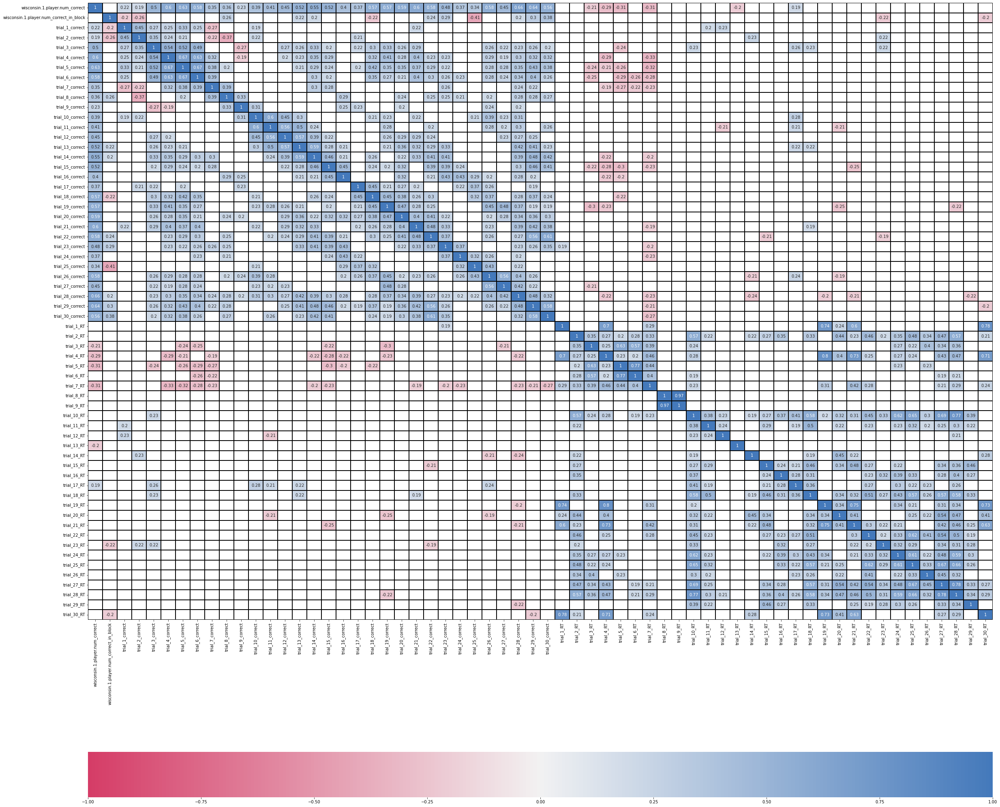

In [16]:
from scipy import stats

df = pd.merge(wTime,wiscrt)
cols = df.columns.to_list()
print(df.shape)
cols = [c for c in cols if ('_RT' in c) or ('correct' in c)]
df = df[cols]
print(df.shape)

cols = [c for c in cols if '_RT' in c]
for c in cols:
    df[c] = df[c].astype(float)

# df = df.loc[
#     df['participant.inflation'] != '430'
# ]

# for i in range(len(df)):
#     if df['participant.intervention'].iloc[i] == 'intervention':
#         df['participant.intervention'].iloc[i] = 1
#     else:
#         df['participant.intervention'].iloc[i] = 0

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


# cols = [#'participant.intervention', 'participant.day', 
#         'task.12.player.inf_estimate', 
#         'task.24.player.inf_estimate', 'task.36.player.inf_estimate', 
#         'task.48.player.inf_estimate', 'task.60.player.inf_estimate', 
#         'task.72.player.inf_estimate', 'task.84.player.inf_estimate', 
#         'task.96.player.inf_estimate', 'task.108.player.inf_estimate', 
#         'task.120.player.inf_estimate', 'percep_12', 'percep_24', 'percep_36', 
#         'percep_48', 'percep_60', 'percep_72', 'percep_84', 'percep_96', 
#         'percep_108', 'percep_120', 'mean_realPos', 'mean_realNeg', 
#         'task.12.player.responseTime', 'task.24.player.responseTime', 
#         'task.36.player.responseTime', 'task.48.player.responseTime', 
#         'task.60.player.responseTime', 'task.72.player.responseTime', 
#         'task.84.player.responseTime', 'task.96.player.responseTime', 
#         'task.108.player.responseTime', 'task.120.player.responseTime', 
#         'trial_1_RT', 'trial_2_RT',
#         'trial_3_RT', 'trial_4_RT', 'trial_5_RT', 'trial_6_RT', 'trial_7_RT',
#         'trial_8_RT', 'trial_9_RT', 'trial_10_RT', 'trial_11_RT', 'trial_12_RT',
#         'trial_13_RT', 'trial_14_RT', 'trial_15_RT', 'trial_16_RT',
#         'trial_17_RT', 'trial_18_RT', 'trial_19_RT', 'trial_20_RT',
#         'trial_21_RT', 'trial_22_RT', 'trial_23_RT', 'trial_24_RT',
#         'trial_25_RT', 'trial_26_RT', 'trial_27_RT', 'trial_28_RT',
#         'trial_29_RT', 'trial_30_RT']
# print(df.shape)
# df = df[cols]
print(df.shape)
# df = df.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)
print(df.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(df)                     # get p-Value
# mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
mask = np.invert(p_values<0.05)    # mask - only get significant corr
print(mask.shape)
plot_cor_matrix(corr,mask, cmap) 

# Numerically order list of strings containing numbers in middle

In [17]:
# import re

# def atoi(text):
#     return int(text) if text.isdigit() else text

# def natural_keys(text):
#     '''
#     alist.sort(key=natural_keys) sorts in human order
#     http://nedbatchelder.com/blog/200712/human_sorting.html
#     (See Toothy's implementation in the comments)
#     '''
#     return [ atoi(c) for c in re.split(r'(\d+)', text) ]


# cols = wiscrt.columns.to_list()

# cols.sort(key=natural_keys)
# print(cols)

# Return quantity at `t = 30` or `t = 12`, per inflation sequence

In [18]:
stock = final_df_dict['finalStock'].copy()
stock.sort_values('participant.label')

## create columns and move leftward
stock['diff'] = ''
stock.insert(6, 'diff', stock.pop('diff'))
stock['1012_pre'] = ''
stock.insert(7, '1012_pre', stock.pop('1012_pre'))
stock['1012_post'] = ''
stock.insert(8, '1012_post', stock.pop('1012_post'))
stock['430_pre'] = ''
stock.insert(9, '430_pre', stock.pop('430_pre'))
stock['430_post'] = ''
stock.insert(10, '430_post', stock.pop('430_post'))

## create separate df
stock_diff = stock.copy()
stock_diff = stock_diff[['participant.label','1012_pre','1012_post','430_pre','430_post']]
# stock_diff.drop_duplicates(inplace=True)

## calculate difference between stock at either
## t = 12 or t = 30 and that of optimal quantity, add to
for i in range(len(stock.index)):
    if stock['participant.inflation'].iloc[i] == '1012':
        if stock['participant.day'].iloc[i] < 3:
            stock_diff['1012_pre'].iloc[
                stock_diff['participant.label'] == stock['participant.label'].iloc[i]
            ] = stock['task.13.player.finalStock'].iloc[i] - 108
        else:
            stock_diff['1012_post'].iloc[
                stock_diff['participant.label'] == stock['participant.label'].iloc[i]
            ] = stock['task.13.player.finalStock'].iloc[i] - 108
    else:
        if stock['participant.day'].iloc[i] < 3:
            stock_diff['430_pre'].iloc[
                stock_diff['participant.label'] == stock['participant.label'].iloc[i]
            ] = stock['task.31.player.finalStock'].iloc[i] - 90
        else:
            stock_diff['430_post'].iloc[
                stock_diff['participant.label'] == stock['participant.label'].iloc[i]
            ] = stock['task.31.player.finalStock'].iloc[i] - 90    

# stock.sort_values('participant.label')

stock_diff.drop_duplicates(inplace=True)
# stock_diff.sort_values('participant.label')

# Convert intervention into Boolean

In [19]:
for i in range(len(d.index)):
    if d['participant.intervention'].iloc[i] == 'intervention':
        d['participant.intervention'].iloc[i] = 1
    else:
        d['participant.intervention'].iloc[i] = 0

# d = d[['participant.inflation','participant.day','participant.intervention','task.120.player.finalSavings']]
# d

# Combine with `Questionnaire` & `time`

In [20]:
# Sort by participant.label
c = d.copy()
q_copy = q.copy()
inst_copy = inst.copy()
at = avg_time.copy()
w = wAvg.copy()
s = stock_diff.copy()
c.sort_values('participant.label', inplace=True)
c.set_index('participant.label', inplace=True)
q_copy.set_index('participant.label', inplace=True)
inst_copy.set_index('participant.label', inplace=True)
# at = avg_time.sort_values(['participant.label'], inplace=True)
at.set_index(['participant.label'], inplace=True)
w.sort_values('participant.label', inplace=True)
w.set_index(['participant.label'], inplace=True)
s.sort_values('participant.label', inplace=True)
s.set_index(['participant.label'], inplace=True)

combined = pd.merge(c, q_copy, left_index=True, right_index=True)
combined = pd.merge(combined, inst_copy, left_index=True, right_index=True)
print(combined.shape)
combined = pd.merge(combined, at, left_index=True, right_index=True)
print(combined.shape)
combined = pd.merge(combined, w, left_index=True, right_index=True)
print(combined.shape)
combined = pd.merge(combined, s, left_index=True, right_index=True)
print(combined.shape)
for t in tasks:
    combined = pd.merge(combined, behav_df[t], left_index=True, right_index=True)
    print(combined.shape)

combined = combined.reset_index(level='participant.label')
combined = combined.drop('participant.intervention_y',axis=1)
# combined

## Add to list/dict of results for csv
metrics_list.append('combined')
results_dict['combined'] = combined

(104, 55)
(104, 63)
(104, 65)
(104, 69)
(104, 71)
(104, 72)
(104, 73)
(104, 75)


# Convert non-int numbers

In [21]:
combined = combined.apply(pd.to_numeric, errors="coerce")

# ## Correct responses for knowledge questions
# combined['participant.remunerated_questions'] = combined['participant.remunerated_questions'].apply(pd.to_numeric)

# ## Intervention Boolean
# combined['participant.intervention'] = combined['participant.intervention'].apply(pd.to_numeric)

# ## Errors in Instructions
# combined['participant.intervention'] = combined['participant.intervention'].apply(pd.to_numeric)

# ## Mean and variance of response times
# for n in range(1,5):
#     combined[f'day_{day}_mean'] = combined[f'day_{day}_mean'].apply(pd.to_numeric, errors = 'coerce')
#     for i in range(len(combined.index)):
#         print(n, type(combined[f'day_{n}_mean']))
#     combined[f'day_{day}_var'] = combined[f'day_{day}_var'].apply(pd.to_numeric, errors = 'coerce')

# combined

# Example: diagonal correlation matrix

In [22]:
stock_diff_2 = combined.copy()
stock_diff_2 = stock_diff_2.reindex(columns=['participant.intervention_x', '1012_pre', '1012_post', '430_pre', '430_post']) #,'day_1_mean','day_1_var','day_2_mean','day_2_var','day_3_mean','day_3_var','day_4_mean','day_4_var']]
# # stock_diff_2 = pd.merge(stock_diff_2, at, left_index=True, right_index=True)
# stock_diff_2.apply(pd.to_numeric, errors="coerce")
stock_diff_2['participant.intervention_x'] = stock_diff_2['participant.intervention_x'].astype(float)
# stock_diff_2 = stock_diff.apply(pd.to_numeric, errors="coerce", downcast='float')
# # combined[['participant.intervention_x', '1012_pre', '1012_post', '430_pre', '430_post']]
# stock_diff_2

In [23]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="dark")

# # Drop last row with Totals
# d = d.drop(d.tail(1).index)

# Compute the correlation matrix
corr = stock_diff_2.corr(method='pearson')
s = corr.unstack()
corr2 = combined.corr()
# so = s.sort_values(kind="quicksort")
# vmin = so[0]/2
# vmax = so[-1]/2

# print(so[0], so[-1], so.count()/(len(d.columns)-1), len(d.columns) - 2)
# corr = corr.dropna(axis=1, how='all')
# corr = corr.dropna(axis=0, how='all')
corr

,participant.intervention_x,1012_pre,1012_post,430_pre,430_post
participant.intervention_x,1.000000,-0.135871,-0.124500,-0.115049,-0.164334
1012_pre,-0.135871,1.000000,0.159228,0.176696,0.248994
1012_post,-0.124500,0.159228,1.000000,0.438064,0.694698
430_pre,-0.115049,0.176696,0.438064,1.000000,0.470399
430_post,-0.164334,0.248994,0.694698,0.470399,1.000000


<AxesSubplot:>

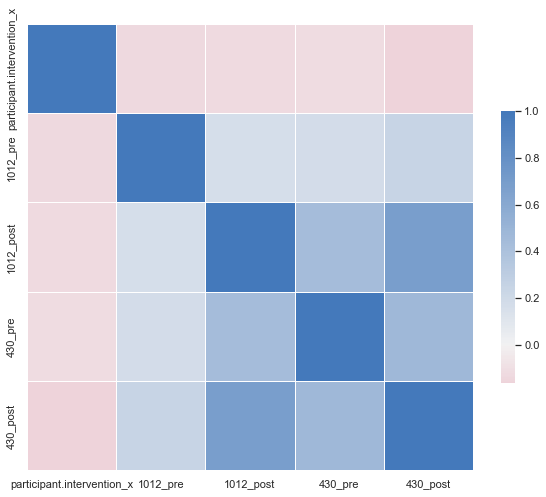

In [24]:
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,10))

# Generate a custom diverging colormap
# diverging_palette(h_neg, h_pos, s=75, l=50, sep=1, n=6, center='light', as_cmap=False)
# vmax = 1
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Draw the heatmap without mask
sns.heatmap(corr, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

<AxesSubplot:>

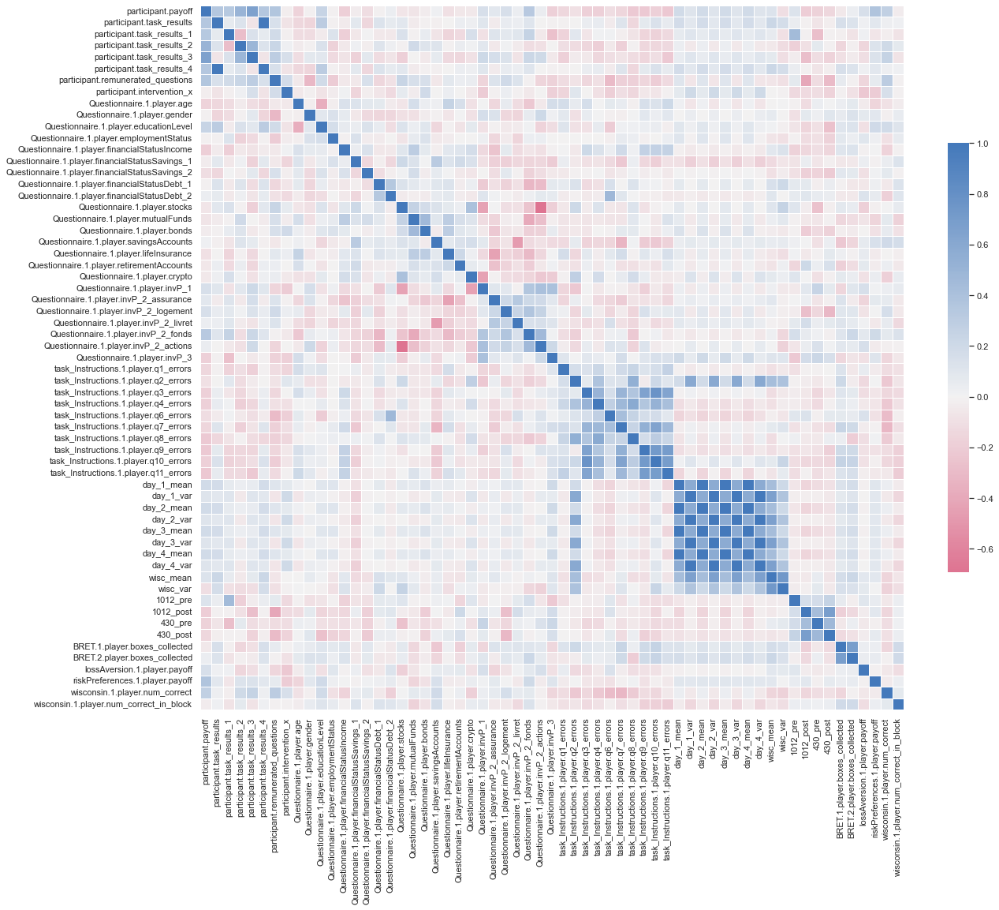

In [25]:

corr2 = corr2.dropna(axis=1, how='all')
corr2 = corr2.dropna(axis=0, how='all')

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr2, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20,20))

# Generate a custom diverging colormap
# diverging_palette(h_neg, h_pos, s=75, l=50, sep=1, n=6, center='light', as_cmap=False)
# vmax = 1
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr2, mask=mask, cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Draw the heatmap without mask
sns.heatmap(corr2, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Diagonal scatterplot matrices

In [26]:
# import matplotlib.pyplot as plt
# import seaborn as sns

# def corrdot(*args, **kwargs):
#     corr_r = args[0].corr(args[1], 'pearson')
#     corr_text = f"{corr_r:2.2f}".replace("0.", ".")
#     ax = plt.gca()
#     ax.set_axis_off()
#     marker_size = abs(corr_r) * 10000
#     ax.scatter([.5], [.5], marker_size, [corr_r], alpha=0.6, cmap="coolwarm",
#                vmin=-1, vmax=1, transform=ax.transAxes)
#     font_size = abs(corr_r) * 40 + 5
#     ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction",
#                 ha='center', va='center', fontsize=font_size)

# sns.set(style='white', font_scale=1.6)
# g = sns.PairGrid(cq, aspect=1.4, diag_sharey=False)
# g.map_lower(sns.regplot, lowess=True, ci=False, line_kws={'color': 'black'})
# g.map_diag(sns.distplot, kde_kws={'color': 'black'})
# g.map_upper(corrdot)

# Descriptive statistics

## Demographics

array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'gender'}>,
        <AxesSubplot:title={'center':'educationLevel'}>,
        <AxesSubplot:title={'center':'employmentStatus'}>],
       [<AxesSubplot:title={'center':'financialStatusIncome'}>,
        <AxesSubplot:title={'center':'financialStatusSavings_1'}>,
        <AxesSubplot:title={'center':'financialStatusSavings_2'}>,
        <AxesSubplot:title={'center':'financialStatusDebt_1'}>],
       [<AxesSubplot:title={'center':'financialStatusDebt_2'}>,
        <AxesSubplot:title={'center':'stocks'}>,
        <AxesSubplot:title={'center':'mutualFunds'}>,
        <AxesSubplot:title={'center':'bonds'}>],
       [<AxesSubplot:title={'center':'savingsAccounts'}>,
        <AxesSubplot:title={'center':'lifeInsurance'}>,
        <AxesSubplot:title={'center':'retirementAccounts'}>,
        <AxesSubplot:title={'center':'crypto'}>]], dtype=object)

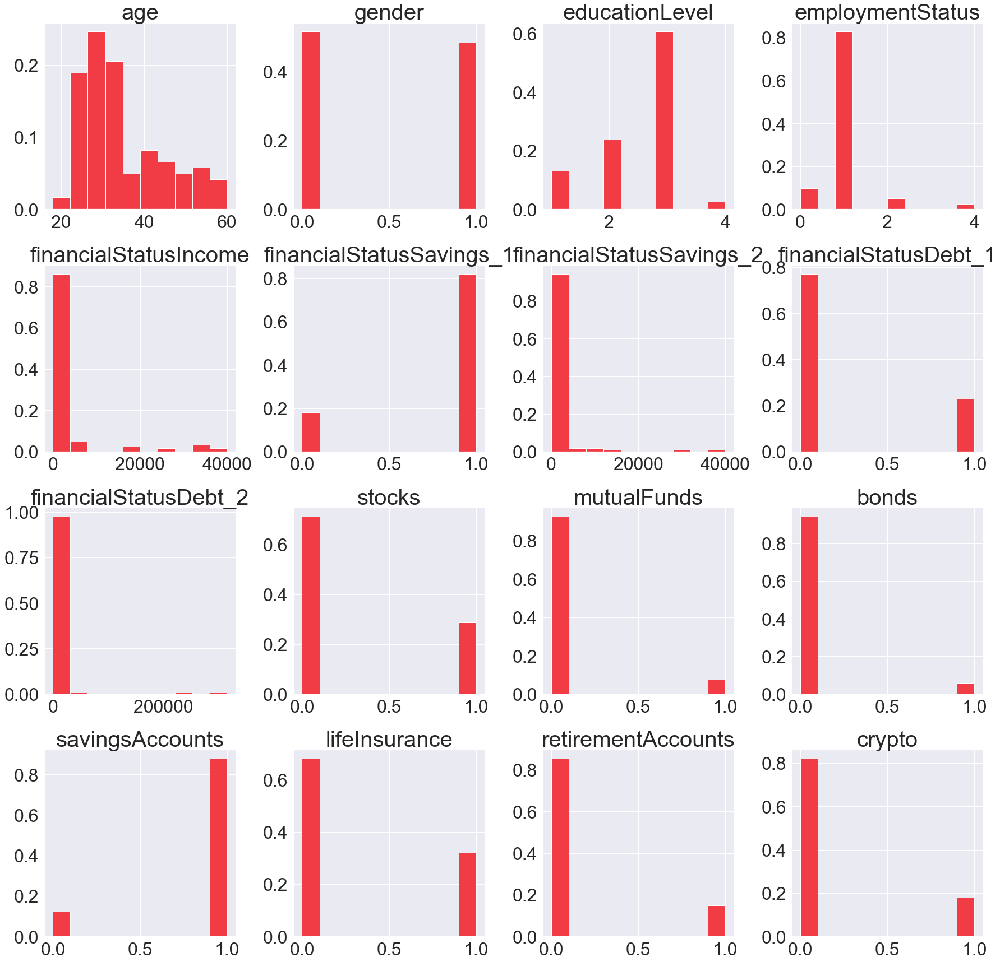

In [27]:
demo = final_df_dict['Questionnaire'].copy()

## Remove superfluous columns
cols = demo.columns.to_list()
del cols[2:4:1]
del cols[-2:]
demo = demo[cols]

## Remove extra text in column names
cols = [c.replace("Questionnaire.1.player.", "") for c in cols]
demo.columns = cols
results_demo = demo.describe()

## Add to list/dict of results for csv
result = 'demo'
metrics_list.append(result)
metrics_dict[result] = demo
results_dict[f'results_{result}'] = results_demo

# ### Key

# #### Gender
# 1 = female

# #### Education
# 1 = high_school
# 2 = undergraduate
# 3 = masters
# 4 = doctorate
# 0 = no_high_school
# 5 = I_do_not_know

# #### Employment
# 1 = employmentStatus_employed,
# 0 = employmentStatus_unemployed,
# 2 = employmentStatus_student,
# 3 = employmentStatus_retired,
# 4 = I_do_not_know

# #### `invP_1`
# `invP_1` = En matière de placements financiers, que préférez-vous ?
# 1 = invP_risky,
# 2 = invP_mostly_risky,
# 3 = invP_mostly_safe,
# 4 = invP_safe

# #### `invP_2`
# 1 = more_money, -1 = less_money,
# 0 = same_money, 9 = not_applicable

# #### `invP_3`
# `invP_3` = "Imaginez que vous recevez 500.000€. Que faites-vous avec cet argent ?"
# 0 = 3_spend_everything
# 1 = risky
# 2 = mostly_risky
# 3 = mostly_safe
# 4 = safe

cols = [
    c for c in final_df_dict['Questionnaire'].columns.to_list() if 'player' in c and \
    ('invP' not in c) and ('response' not in c) and ('id_' not in c) and ('payoff' not in c)
]

cols = [c.replace("Questionnaire.1.player.", "") for c in cols]

params = {'axes.titlesize':'40',
          'xtick.labelsize':'32',
          'ytick.labelsize':'32'}
plt.rcParams.update(params)

demo[cols].hist(figsize=(30,30), weights=np.ones(len(demo[cols]))/len(demo[cols]), color='#f13c46')

Index(['participant.code', 'participant.label', 'participant.time_started_utc',
       'participant.day_1', 'participant.day_2', 'participant.day_3',
       'participant.day_4', 'participant.day', 'participant.day_room_number',
       'Questionnaire.1.player.id_in_group', 'Questionnaire.1.player.payoff',
       'Questionnaire.1.player.age', 'Questionnaire.1.player.gender',
       'Questionnaire.1.player.educationLevel',
       'Questionnaire.1.player.employmentStatus',
       'Questionnaire.1.player.financialStatusIncome',
       'Questionnaire.1.player.financialStatusSavings_1',
       'Questionnaire.1.player.financialStatusSavings_2',
       'Questionnaire.1.player.financialStatusDebt_1',
       'Questionnaire.1.player.financialStatusDebt_2',
       'Questionnaire.1.player.stocks', 'Questionnaire.1.player.mutualFunds',
       'Questionnaire.1.player.bonds',
       'Questionnaire.1.player.savingsAccounts',
       'Questionnaire.1.player.lifeInsurance',
       'Questionnaire.1.player.r

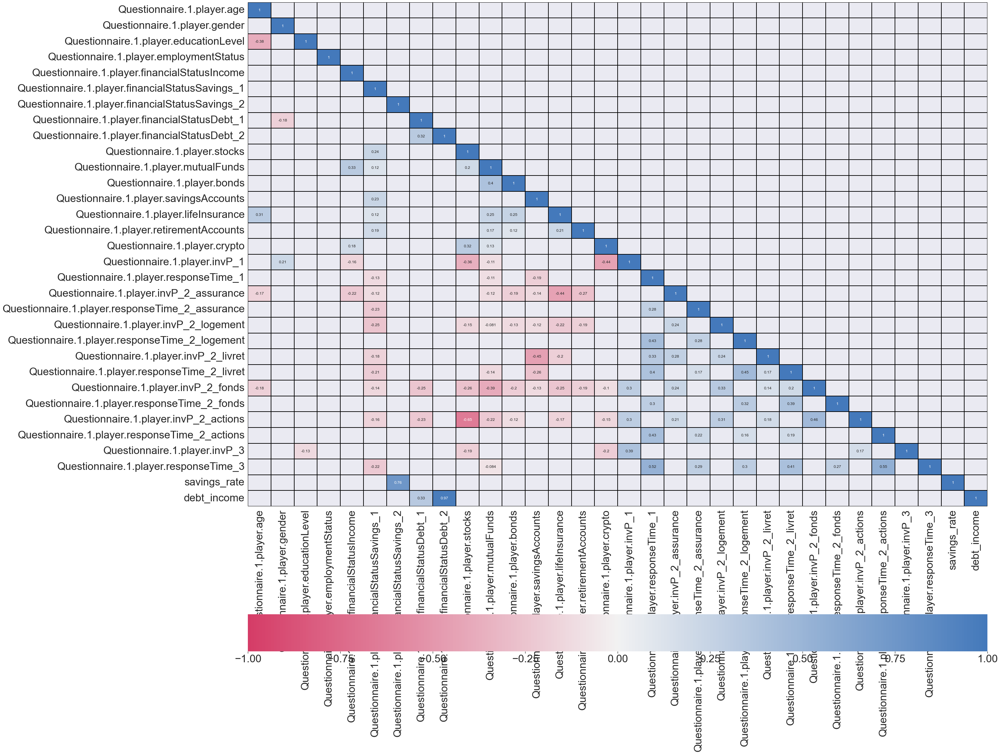

In [28]:
demo2 = final_df_dict['Questionnaire'].copy()
print(demo2.columns)


demo2['savings_rate'] = demo2['Questionnaire.1.player.financialStatusSavings_2'] /\
       demo2['Questionnaire.1.player.financialStatusIncome']
demo2['debt_income'] = demo2['Questionnaire.1.player.financialStatusDebt_2'] /\
       demo2['Questionnaire.1.player.financialStatusIncome']

demo2.replace([np.inf, -np.inf], np.nan, inplace=True)
demo2.dropna(how="all", inplace=True)

cols = demo2.columns.to_list()
del cols[0:11]
del cols[-5:-2]
print(cols)
demo2[cols]

df = demo2[cols]

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


cols = df.columns.to_list()
df = df.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(corr)                   # get p-Value
mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 

### Savings, income, and debt

In [29]:
finInfo = final_df_dict['Questionnaire'].copy()
finInfo =  finInfo[['participant.code', 
       'Questionnaire.1.player.financialStatusIncome',
       'Questionnaire.1.player.financialStatusSavings_1',
       'Questionnaire.1.player.financialStatusSavings_2',
       'Questionnaire.1.player.financialStatusDebt_1',
       'Questionnaire.1.player.financialStatusDebt_2',
       'Questionnaire.1.player.stocks', 'Questionnaire.1.player.mutualFunds',
       'Questionnaire.1.player.bonds',
       'Questionnaire.1.player.savingsAccounts',
       'Questionnaire.1.player.lifeInsurance',
       'Questionnaire.1.player.retirementAccounts',
       'Questionnaire.1.player.crypto']]

finInfo['savings_rate'] = finInfo['Questionnaire.1.player.financialStatusSavings_2'] /\
       finInfo['Questionnaire.1.player.financialStatusIncome']
finInfo['debt_income'] = finInfo['Questionnaire.1.player.financialStatusDebt_2'] /\
       finInfo['Questionnaire.1.player.financialStatusIncome']

finInfo.dropna(axis=0).describe().T
finInfo.replace([np.inf, -np.inf], np.nan, inplace=True)
finInfo.dropna(how="all", inplace=True)

finInfo[finInfo['savings_rate'].isin([np.inf,-np.inf]) == True]

finInfo[['Questionnaire.1.player.financialStatusIncome',
       'Questionnaire.1.player.financialStatusSavings_2',
       'Questionnaire.1.player.financialStatusDebt_2',
       'savings_rate',
       'debt_income'
       ]].quantile([x * .1 for x in range(1,11)],)
# finInfo.describe().T

,Questionnaire.1.player.financialStatusIncome,Questionnaire.1.player.financialStatusSavings_2,Questionnaire.1.player.financialStatusDebt_2,savings_rate,debt_income
0.1,1000.0,11.0,0.0,0.005034,0.000000
0.2,1500.0,100.0,0.0,0.043214,0.000000
0.3,1700.0,200.0,0.0,0.075000,0.000000
0.4,1900.0,300.0,0.0,0.137931,0.000000
0.5,2000.0,500.0,0.0,0.200000,0.000000
0.6,2400.0,700.0,0.0,0.279365,0.000000
0.7,2700.0,1000.0,0.0,0.435855,0.000000
0.8,3080.0,1300.0,1000.0,0.610437,0.364103
0.9,5980.0,2000.0,6080.0,0.894410,3.187500
1.0,40000.0,40000.0,315000.0,10.000000,185.294118


array([[<AxesSubplot:title={'center':'Questionnaire.1.player.financialStatusIncome'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.financialStatusSavings_1'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.financialStatusSavings_2'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.financialStatusDebt_1'}>],
       [<AxesSubplot:title={'center':'Questionnaire.1.player.financialStatusDebt_2'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.stocks'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.mutualFunds'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.bonds'}>],
       [<AxesSubplot:title={'center':'Questionnaire.1.player.savingsAccounts'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.lifeInsurance'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.retirementAccounts'}>,
        <AxesSubplot:title={'center':'Questionnaire.1.player.crypto'}>],
       [<AxesSubplot

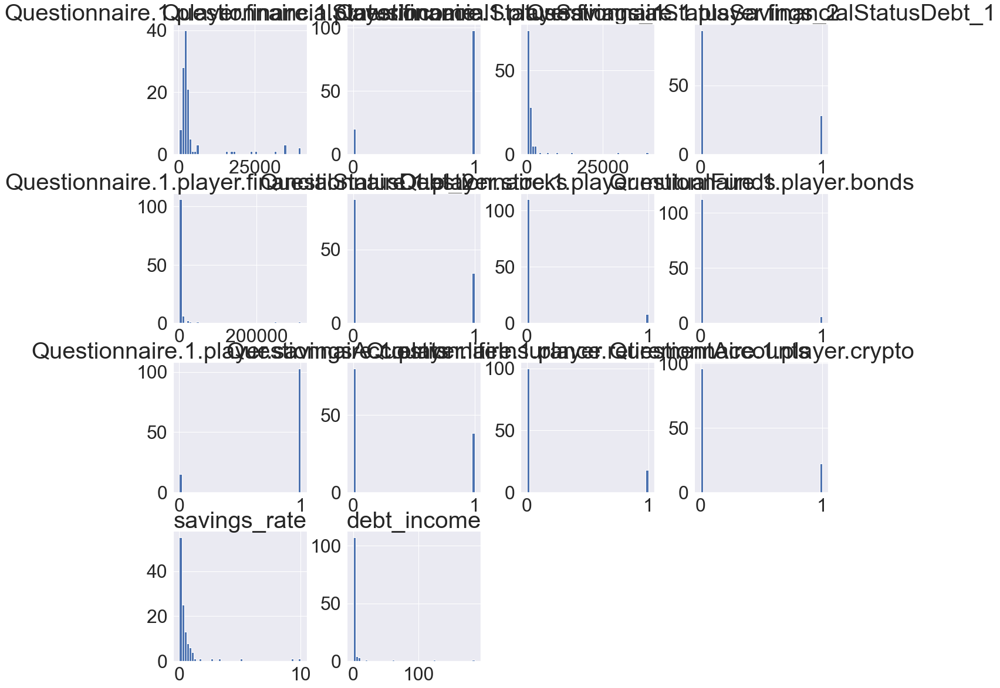

In [30]:
finInfo.dropna(axis=0).hist(figsize=(20,20), bins=50)

#### Correlation matrix

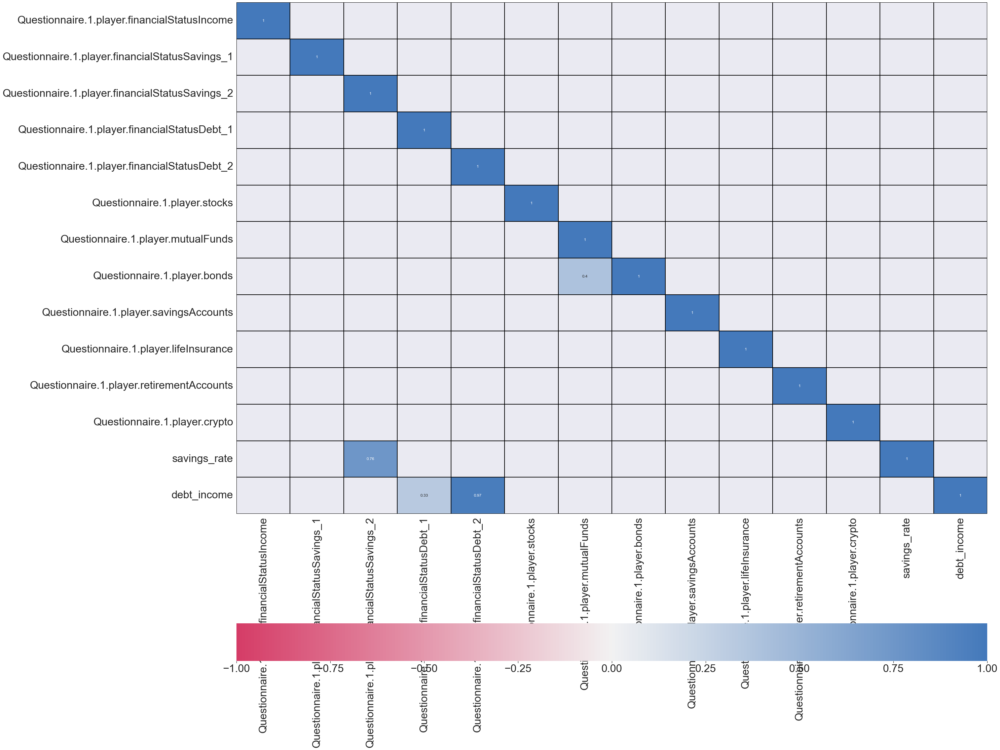

In [31]:
df = finInfo

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


cols = df.columns.to_list()
# corr = corr.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(corr)                     # get p-Value
mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 

## Financial literacy

In [32]:
finLit = final_df_dict['Finance'].copy()
finLit.drop(list(finLit.filter(regex='day_|payoff|group|subsession')), axis=1, inplace=True)

## Remove superfluous columns
cols = finLit.columns.to_list()
finLit = finLit[cols]

## Remove extra text in column names
cols = [c.replace("Finance.1.player.", "") for c in cols]
finLit.columns = cols
finLit.groupby('participant.label')

# ## Booleanize intervention
# for i in range(len(finLit.index)):
#     if finLit['participant.intervention'].iloc[i] == 'intervention':
#         finLit['participant.intervention'].iloc[i] = 1
#     else:
#         finLit['participant.intervention'].iloc[i] = 0

results_finLit = finLit.groupby(['participant.day','participant.intervention']).describe().T

### Calculate financial literacy score

In [33]:
finLit[['scoreBig3','scoreArrondel','literateBig3','literateArrondel',
        'literate']] = 0

for i in range(len(finLit.index)):
    if finLit['finK_1'].iloc[i] == 1:
        finLit['scoreBig3'].iloc[i] += 1
        finLit['scoreArrondel'].iloc[i] += 1
    if finLit['finK_2'].iloc[i] == -1:
        finLit['scoreBig3'].iloc[i] += 1
        finLit['scoreArrondel'].iloc[i] += 1
    if finLit['finK_9'].iloc[i] == 1:
        finLit['scoreBig3'].iloc[i] += 1
    if finLit['finK_4'].iloc[i] == 4:
        finLit['scoreArrondel'].iloc[i] += 1

for i in range(len(finLit.index)):
    if finLit['scoreBig3'].iloc[i] == 3:
        finLit['literateBig3'].iloc[i] = 1
    if finLit['scoreArrondel'].iloc[i] == 3:
        finLit['literateArrondel'].iloc[i] = 1

for i in range(len(finLit.index)):
    if finLit['literateArrondel'].iloc[i] == 1 or finLit['literateBig3'].iloc[i] == 1:
        if finLit['scoreArrondel'].iloc[i] > 1 and finLit['scoreBig3'].iloc[i] > 1:
            finLit['literate'].iloc[i] = 1

diff_finLit = finLit[['participant.label','participant.intervention']]
diff_finLit[['scoreBig3_2','scoreBig3_4','scoreArrondel_2','scoreArrondel_4','literateBig3_2',
            'literateArrondel_2','literateBig3_4',
            'literateArrondel_4','literate_2','literate_4']] = 0
diff_finLit.drop_duplicates(inplace=True)

for i in range(len(finLit.index)):
    day = int(finLit['participant.day'].iloc[i])
    diff_finLit[f'scoreBig3_{day}'].loc[
        diff_finLit['participant.label'] == finLit['participant.label'].iloc[i]
    ] = finLit['scoreBig3'].iloc[i]
    diff_finLit[f'scoreArrondel_{day}'].loc[
        diff_finLit['participant.label'] == finLit['participant.label'].iloc[i]
    ] = finLit['scoreArrondel'].iloc[i]
    diff_finLit[f'literateBig3_{day}'].loc[
        diff_finLit['participant.label'] == finLit['participant.label'].iloc[i]
    ] = finLit['literateBig3'].iloc[i]
    diff_finLit[f'literateArrondel_{day}'].loc[
        diff_finLit['participant.label'] == finLit['participant.label'].iloc[i]
    ] = finLit['literateArrondel'].iloc[i]
    diff_finLit[f'literate_{day}'].loc[
        diff_finLit['participant.label'] == finLit['participant.label'].iloc[i]
    ] = finLit['literate'].iloc[i]
diff_finLit.groupby('participant.intervention').describe().T

## Add to list/dict of results for csv
result = 'finLit'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = finLit
results_dict[f'results_{result}'] = results_finLit

# finLit

finLit
['combined', 'demo', 'finLit']


## Numeracy

In [34]:
numeracy = final_df_dict['Numeracy'].copy()
numeracy.drop(list(numeracy.filter(regex='day_|payoff|group|subsession')), axis=1, inplace=True)

## Remove superfluous columns
cols = numeracy.columns.to_list()

numeracy = numeracy[cols]

## Remove extra text in column names
cols = [c.replace("Numeracy.1.player.", "") for c in cols]
numeracy.columns = cols
numeracy.groupby('participant.label')
numeracy['numerate'] = 0

for i in range(len(numeracy)):
    if numeracy['num_2b'].iloc[i] == 20 or numeracy['num_3'].iloc[i] == 50:
        numeracy['numerate'].iloc[i] = 1

# ## Booleanize intervention
# for i in range(len(numeracy.index)):
#     if numeracy['participant.intervention'].iloc[i] == 'intervention':
#         numeracy['participant.intervention'].iloc[i] = 1
#     else:
#         numeracy['participant.intervention'].iloc[i] = 0

results_numeracy = numeracy.groupby(['participant.day','participant.intervention']).describe().T

## Add to list/dict of results for csv
result = 'numeracy'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = numeracy
results_dict[f'results_{result}'] = results_numeracy

numeracy
['combined', 'demo', 'finLit', 'numeracy']


In [35]:
numeracy2 = final_df_dict['Numeracy'].copy()
numeracy2.drop(list(numeracy2.filter(regex='day_|payoff|group|subsession')), axis=1, inplace=True)

## Remove superfluous columns
cols = numeracy2.columns.to_list()

numeracy2 = numeracy2[cols]

## Remove extra text in column names
cols = [c.replace("Numeracy.1.player.", "") for c in cols]
numeracy2.columns = cols
numeracy2.groupby('participant.label')
numeracy2['numerate2'] = 0

for i in range(len(numeracy2)):
    if pd.isnull(numeracy2['num_2b'].iloc[i]) == True:
        numeracy2['numerate2'].iloc[i] = 0
        
    else:
        numeracy2['numerate2'].iloc[i] = 1

# ## Booleanize intervention
# for i in range(len(numeracy2.index)):
#     if numeracy2['participant.intervention'].iloc[i] == 'intervention':
#         numeracy2['participant.intervention'].iloc[i] = 1
#     else:
#         numeracy2['participant.intervention'].iloc[i] = 0

results_numeracy2 = numeracy2.groupby(['participant.day']).describe().T

## Add to list/dict of results for csv
result = 'numeracy2'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = numeracy2
results_dict[f'results_{result}'] = results_numeracy2
numeracy2.describe().T


numeracy2
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2']


,count,mean,std,min,25%,50%,75%,max
participant.day,214.0,2.971963,1.001951,2.0,2.00,2.0,4.00,4.0
num_1,214.0,25.200935,14.137879,1.0,10.00,25.0,33.00,70.0
num_2a,137.0,31.204380,17.475251,3.0,25.00,30.0,30.00,150.0
num_2b,77.0,23.792208,7.729536,9.0,20.00,22.0,23.00,50.0
num_3,44.0,26.795455,24.019933,1.0,4.00,20.0,50.00,80.0
responseTime_1,214.0,78441.934579,102000.907936,4288.0,29218.25,50728.5,85689.00,921025.0
responseTime_2a,214.0,28815.471963,50726.777908,0.0,0.00,14392.0,33493.25,410316.0
responseTime_2b,214.0,36763.771028,126849.397864,0.0,0.00,0.0,36029.75,1632207.0
responseTime_3,214.0,32340.887850,87207.996205,0.0,0.00,0.0,0.00,576870.0
numatt_1,214.0,3.224299,1.115898,1.0,3.00,3.0,4.00,5.0


In [36]:

numeracy.describe().T

,count,mean,std,min,25%,50%,75%,max
participant.day,214.0,2.971963,1.001951,2.0,2.00,2.0,4.00,4.0
num_1,214.0,25.200935,14.137879,1.0,10.00,25.0,33.00,70.0
num_2a,137.0,31.204380,17.475251,3.0,25.00,30.0,30.00,150.0
num_2b,77.0,23.792208,7.729536,9.0,20.00,22.0,23.00,50.0
num_3,44.0,26.795455,24.019933,1.0,4.00,20.0,50.00,80.0
responseTime_1,214.0,78441.934579,102000.907936,4288.0,29218.25,50728.5,85689.00,921025.0
responseTime_2a,214.0,28815.471963,50726.777908,0.0,0.00,14392.0,33493.25,410316.0
responseTime_2b,214.0,36763.771028,126849.397864,0.0,0.00,0.0,36029.75,1632207.0
responseTime_3,214.0,32340.887850,87207.996205,0.0,0.00,0.0,0.00,576870.0
numatt_1,214.0,3.224299,1.115898,1.0,3.00,3.0,4.00,5.0


### Compound intererst accuracy

In [37]:
## Correct answers
answers = [1100, 2, 2, 32000]

compInt = final_df_dict['Inflation'].copy()
cols = compInt.columns.to_list()
cols = [x for x in cols if ('CI' in x) or ('participant' in x)]
del cols[2:7]
del cols[3]
compInt = compInt[cols]

compInt['infCI_1_accuracy'] = np.nan
compInt['infCI_4_accuracy'] = np.nan
for n in range(1,5):
    compInt[f'CI_{n}_correct'] = np.nan

for n in range(1,5):
    for i in range(len(compInt)):
        if compInt[f'Inflation.1.player.infCI_{n}'].iloc[i] == answers[n - 1]:
            compInt[f'CI_{n}_correct'].iloc[i] = 1
        else:
            compInt[f'CI_{n}_correct'].iloc[i] = 0
        if n == 1 or n == 4:
            if compInt[f'Inflation.1.player.infCI_{n}'].iloc[i] - answers[n - 1] != 0:
                compInt[f'infCI_{n}_accuracy'].iloc[i] = 1 / (compInt[f'Inflation.1.player.infCI_{n}'].iloc[i] - \
                    answers[n - 1])
            else:
                compInt[f'infCI_{n}_accuracy'].iloc[i] = 1


summ_compInt = compInt[['participant.label','participant.intervention']].copy()

cols = [ 'Inflation.1.player.responseTime_CI1', 
        'Inflation.1.player.responseTime_CI2', 
        'Inflation.1.player.responseTime_CI3', 
        'Inflation.1.player.responseTime_CI4',
        'infCI_1_accuracy', 'infCI_4_accuracy',
        'CI_1_correct', 'CI_2_correct', 'CI_3_correct', 'CI_4_correct']

sum_cols = [f'{x}_{d}' for x in cols for d in ['pre','post']]
summ_compInt[sum_cols] = np.nan

summ_compInt.drop_duplicates(inplace=True)

for i in tqdm(range(len(compInt))):
    interv = 'pre' if compInt['participant.day'].iloc[i] < 3 else 'post'
    for c in cols:
        summ_compInt[f'{c}_{interv}'].loc[
            summ_compInt['participant.label'] == compInt['participant.label'].iloc[i]
        ] = compInt[c].iloc[i]

# summ_compInt

# # summ_compInt.drop('participant.intervention', axis=1)

# corr = compInt.corr()
# corr
# from scipy import stats

# def corr_sig(df=None):
#     p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
#     for col in df.columns:
#         for col2 in df.drop(col,axis=1).columns:
#             _ , p = stats.pearsonr(df[col],df[col2])
#             p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
#     return p_matrix

# def plot_cor_matrix(corr, mask=None, cmap=None):
#     f, ax = plt.subplots(figsize=(40,40))
#     sns.heatmap(corr, ax=ax,
#                 mask=mask,
#                 # cosmetics
#                 annot=True, vmin=-1, vmax=1, center=0,
#                 cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


# corr = corr.dropna(axis=0)

# # Plotting with significance filter
# cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
# corr = corr.corr()                            # get correlation
# p_values = corr_sig(corr)                     # get p-Value
# mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
# plot_cor_matrix(corr,mask, cmap) 

100%|██████████| 214/214 [00:00<00:00, 227.25it/s]


## Inflation awareness

In [38]:
inflation = final_df_dict['Inflation'].copy()
inflation.drop(list(inflation.filter(regex='day_|payoff|group|subsession')), axis=1, inplace=True)

## Remove superfluous columns
cols = inflation.columns.to_list()

inflation = inflation[cols]

## Remove extra text in column names
cols = [c.replace("Inflation.1.player.", "") for c in cols]
inflation.columns = cols
inflation.groupby('participant.label')

inflation['infK_mean'] = (inflation['infK_3'] + inflation['infK_4'] + \
                          inflation['infK_5']) / 3

## Booleanize intervention
for i in range(len(inflation.index)):
    if inflation['participant.intervention'].iloc[i] == 'intervention':
        inflation['participant.intervention'].iloc[i] = 1
    else:
        inflation['participant.intervention'].iloc[i] = 0

results_inflation = inflation.groupby('participant.day').describe().T

## Add to list/dict of results for csv
result = 'inflation'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = inflation
results_dict[f'results_{result}'] = results_inflation
# inflation

## infK_1: taux plus élevé, 30 dernières années
## infK_2: taux plus bas, 30 dernières années
## infK_3: taux pendant 12 dernières mois
## infK_4: taux actuel
## infK_5: taux pendant 12 dernières mois
## infK_6: taux anticipé

inflation
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation']


In [39]:
cols = inflation.columns.to_list()
cols = cols[31:52]
infBehave = inflation[['participant.label']].copy()
infBehave.drop_duplicates(inplace=True)

for c in cols:
    infBehave[c] = 0



for i in range(len(infBehave)):
    for c in cols:
        if c != 'inf_10' or c != 'inf_11' or c != 'inf_12':
            infBehave[c].loc[
                infBehave['participant.label'] == inflation['participant.label'].iloc[i]
            ] += inflation[c].iloc[i]
        else:
            infBehave[c].loc[
                infBehave['participant.label'] == inflation['participant.label'].iloc[i]
            ] = inflation[c].iloc[i]



infBehave.columns

Index(['participant.label', 'inf_9_cheaper', 'inf_9_lessInflated',
       'inf_9_quantity', 'inf_9_stockMaintained', 'inf_9_leisure',
       'inf_9_subscription', 'inf_9_insurance', 'inf_9_realEstate',
       'inf_9_livret', 'inf_9_mutualFunds', 'inf_9_stocks',
       'inf_9_indexedBonds', 'inf_9_checkingAccount', 'inf_9_move',
       'inf_9_income', 'inf_9_job', 'inf_9_energy', 'inf_9_transportation',
       'inf_10', 'inf_11', 'inf_12'],
      dtype='object')

## Count frequency of each response for each behavior

['inf_9_cheaper', 'inf_9_lessInflated', 'inf_9_quantity', 'inf_9_stockMaintained', 'inf_9_leisure', 'inf_9_subscription', 'inf_9_insurance', 'inf_9_realEstate', 'inf_9_livret', 'inf_9_mutualFunds', 'inf_9_stocks', 'inf_9_indexedBonds', 'inf_9_checkingAccount', 'inf_9_move', 'inf_9_income', 'inf_9_job', 'inf_9_energy', 'inf_9_transportation']


C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/2270188483.py:17: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  inflation[cols2].hist(ax=ax,color='#f13c46')


array([[<AxesSubplot:title={'center':'cheaper'}>,
        <AxesSubplot:title={'center':'lessInflated'}>,
        <AxesSubplot:title={'center':'quantity'}>,
        <AxesSubplot:title={'center':'stockMaintained'}>],
       [<AxesSubplot:title={'center':'leisure'}>,
        <AxesSubplot:title={'center':'subscription'}>,
        <AxesSubplot:title={'center':'insurance'}>,
        <AxesSubplot:title={'center':'realEstate'}>],
       [<AxesSubplot:title={'center':'livret'}>,
        <AxesSubplot:title={'center':'mutualFunds'}>,
        <AxesSubplot:title={'center':'stocks'}>,
        <AxesSubplot:title={'center':'indexedBonds'}>],
       [<AxesSubplot:title={'center':'checkingAccount'}>,
        <AxesSubplot:title={'center':'move'}>,
        <AxesSubplot:title={'center':'income'}>,
        <AxesSubplot:title={'center':'job'}>],
       [<AxesSubplot:title={'center':'energy'}>,
        <AxesSubplot:title={'center':'transportation'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

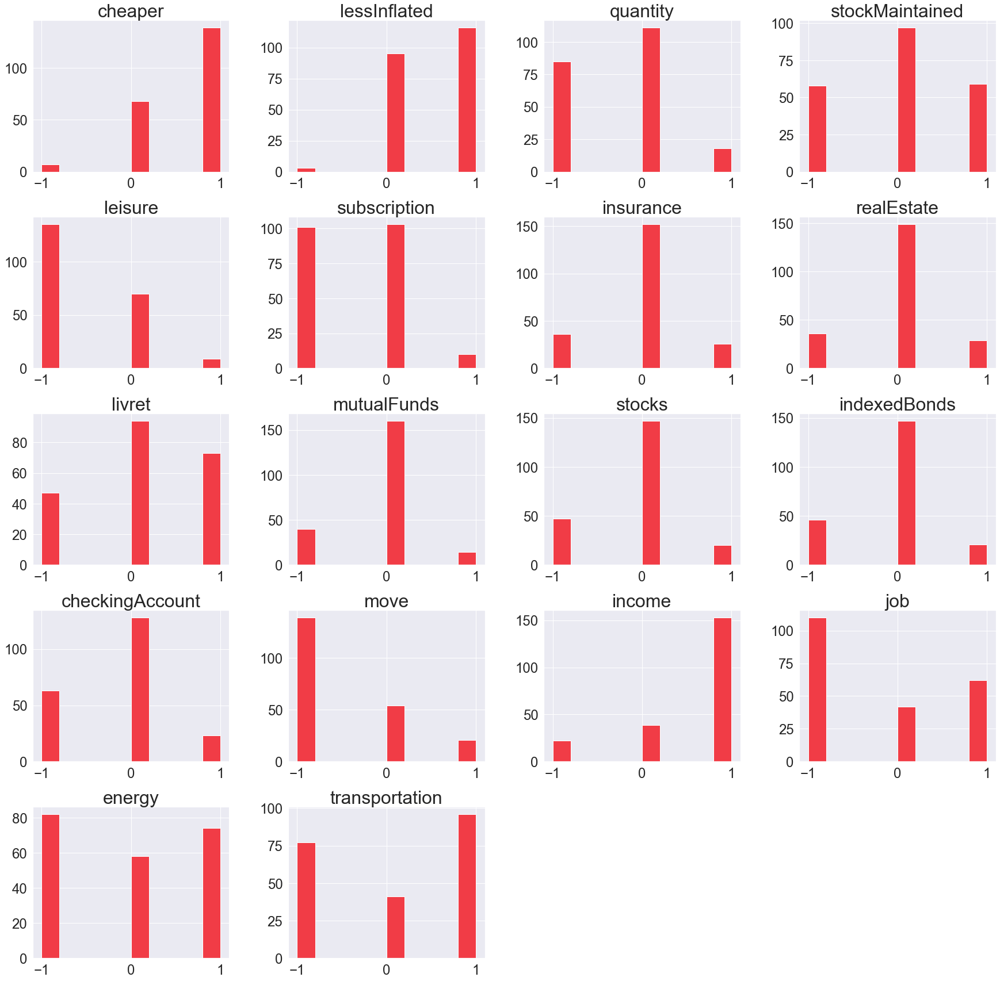

In [41]:
# cols = inflation.columns.to_list()
# cols = [c for c in cols if ('_9_' in c) or ('_10_' in c) or ('_11_' in c)]
# print(cols)
# inflation = inflation[cols]
# cols2 = [c.replace('inf_9_','') for c in cols]
# # print(inflation[cols].columns)
# inflation.columns = cols2
# # print(inflation[cols].columns)


params = {'axes.titlesize':'32',
          'xtick.labelsize':'24',
          'ytick.labelsize':'24'}
plt.rcParams.update(params)
fig = plt.figure(figsize = (30,30))
ax = fig.gca()
inflation[cols2].hist(ax=ax,color='#f13c46')

# Cronbach's alpha

In [42]:
## From https://towardsdatascience.com/cronbachs-alpha-theory-and-application-in-python-d2915dd63586

def cronbach_alpha(df):
    # 1. Transform the df into a correlation matrix
    df_corr = df.corr()
    print(df_corr)
    
    # 2.1 Calculate N
    # The number of variables equals the number of columns in the df
    N = df.shape[1]
    print('N', N)
    
    # 2.2 Calculate R
    # For this, we'll loop through the columns and append every
    # relevant correlation to an array calles "r_s". Then, we'll
    # calculate the mean of "r_s"
    rs = np.array([])
    for i, col in enumerate(df_corr.columns):
        sum_ = df_corr[col][i+1:].values
        rs = np.append(sum_, rs)
    mean_r = np.mean(rs)
    
   # 3. Use the formula to calculate Cronbach's Alpha 
    cronbach_alpha = (N * mean_r) / (1 + (N - 1) * mean_r)
    return cronbach_alpha

cronbach_alpha(infBehave[['participant.label', 'inf_9_cheaper', 'inf_9_lessInflated',
       'inf_9_quantity', 'inf_9_stockMaintained', 'inf_9_leisure',
       'inf_9_subscription', 'inf_9_insurance', 'inf_9_realEstate',
       'inf_9_livret', 'inf_9_mutualFunds', 'inf_9_stocks',
       'inf_9_indexedBonds', 'inf_9_checkingAccount']])

                       inf_9_cheaper  inf_9_lessInflated  inf_9_quantity  \
inf_9_cheaper               1.000000            0.674592       -0.248883   
inf_9_lessInflated          0.674592            1.000000       -0.222806   
inf_9_quantity             -0.248883           -0.222806        1.000000   
inf_9_stockMaintained       0.145875            0.158964        0.327455   
inf_9_leisure              -0.375326           -0.398011        0.563745   
inf_9_subscription         -0.396762           -0.292410        0.410004   
inf_9_insurance             0.053532           -0.101101        0.174314   
inf_9_realEstate            0.238235            0.038048        0.009227   
inf_9_livret                0.135442            0.129645       -0.171109   
inf_9_mutualFunds           0.097975           -0.121537        0.252926   
inf_9_stocks                0.062423           -0.139278        0.101217   
inf_9_indexedBonds         -0.046380           -0.194761        0.251375   
inf_9_checki

0.7922793293314806

# Within-subject results

## Change in performance over time

In [43]:
performance = final_df_dict['finalSavings'].copy()
cols = performance.columns.to_list()
del cols[7:len(cols) - 1]
performance = performance[cols]
performance.sort_values(['participant.label','participant.day'])

trials = performance[['participant.label','participant.intervention']]
trials['1012_pre'] = np.nan
trials['430_pre'] = np.nan
trials['1012_post'] = np.nan
trials['430_post'] = np.nan
trials['1012_diff'] = ''
trials['430_diff'] = ''
print(1, trials.shape)
trials.drop_duplicates(subset=['participant.label'], inplace=True)
print(2, trials.shape)

## Assign results from each trial to respective columns (per inflation condition
## and pre-/post-intervention)
for i in range(len(performance.index)):
    infl = '1012' if performance['participant.inflation'].iloc[i] == '1012' else '430'
    day = 'pre' if performance['participant.day'].iloc[i] < 3 else 'post'
    trials[f'{infl}_{day}'].loc[
            trials['participant.label'] == performance['participant.label'].iloc[i]
        ] = performance['task.120.player.finalSavings'].iloc[i]

print(3, trials.shape)
trials.dropna(inplace=True)
print(4, trials.shape)

## Calculate change in performance between pre- and post-intervention for
## each inflation condition
trials['1012_diff'] = trials['1012_post'] - trials['1012_pre']
trials['430_diff'] = trials['430_post'] - trials['430_pre']

# ## Booleanize intervention
# for i in range(len(trials.index)):
#     if trials['participant.intervention'].iloc[i] == 'intervention':
#         trials['participant.intervention'].iloc[i] = 1
#     else:
#         trials['participant.intervention'].iloc[i] = 0

## Shift intervention column to right
trials.insert(2, '1012_diff',
              trials.pop('1012_diff'))
trials.insert(3, '430_diff',
              trials.pop('430_diff'))

results_trials = trials.groupby('participant.intervention').describe().T

## Add to list/dict of results for csv
result = 'trials'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = trials
results_dict[f'results_{result}'] = results_trials

1 (442, 8)
2 (122, 8)
3 (122, 8)
4 (104, 8)
trials
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials']


### Calculate A values

In [44]:
quantity = final_df_dict['decision'].copy()
stock = final_df_dict['finalStock'].copy()
full_decision = pd.concat([quantity, stock], axis=1)
cols = full_decision.columns.to_list()
full_decision = full_decision[cols]

## Remove duplicate columns
full_decision = full_decision.loc[:,~full_decision.columns.duplicated()].copy()

decision = full_decision[['participant.label', 'participant.code', 'participant.day', 'participant.inflation', 'participant.intervention', 'participant.time_started_utc']]

## Add columns of relevant months
for month in range(1,121):
    if month == 1 or month % 30 == 0 or month % 30 == 1 or month % 12 == 0 or month % 12 == 1:
        decision[[f'task.{month}.player.decision', 
                f'task.{month}.player.finalStock']] = full_decision[[f'task.{month}.player.decision', 
                f'task.{month}.player.finalStock']]
        decision[f'{month}.A*'] = 121 - month - decision[f'task.{month}.player.finalStock']
        
        decision[f'{month}.A'] = decision[f'task.{month}.player.decision'] / decision[f'{month}.A*'].replace({ 0 : -1 })

## Remove extra columns
colsA = decision.columns.to_list()
colsA = [x for x in colsA if 'task' not in x]
colsA = [x for x in colsA if '*' not in x]

A_vals = decision[colsA]

## Convert to int
colsA = [x for x in colsA if 'A' in x]
A_vals[colsA] = A_vals[colsA].apply(pd.to_numeric, errors="coerce")

A_vals.sort_values(['participant.label','participant.inflation'])

## Caclulate within-subject changes
sum_A_vals = A_vals[['participant.label','participant.intervention']]
sum_A_vals.drop_duplicates(inplace=True)

periods = ['1012_pre','1012_post','430_pre','430_post']

for col in colsA:
    for p in periods:
        sum_A_vals[f'{col}_{p}'] = np.nan

for i in range(len(A_vals.index)):
    for col in colsA:
            inf = '430' if A_vals['participant.inflation'].iloc[i] == '430' else '1012'
            p = 'pre' if A_vals['participant.day'].iloc[i] < 3 else 'post'
            sum_A_vals[f'{col}_{inf}_{p}'].loc[
                sum_A_vals['participant.label'] == A_vals['participant.label'].iloc[i]
            ] = A_vals[col].iloc[i]


sum_A_vals


results_sum_A_vals = sum_A_vals.groupby(['participant.intervention',]).mean().T

## Add to list/dict of results for csv
result = 'sum_A_vals'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = sum_A_vals
results_dict[f'results_{result}'] = results_sum_A_vals

# results_sum_A_vals[results_sum_A_vals['participant.intervention'].str.contains("430")]
# sum_A_vals

sum_A_vals
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals']


### Calculate B values

In [45]:
optimal_430 = [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,89,88,87,86,85,84,83,82,81,80,79,78,77,76,75,74,73,72,71,70,69,68,67,66,65,64,63,62,61,60,59,58,57,56,55,54,53,52,51,50,49,48,47,46,45,44,43,42,41,40,39,38,37,36,35,34,33,32,31,30,29,28,27,26,25,24,23,22,21,20,19,18,17,16,15,14,13,12,11,10,9,8,7,6,5,4,3,2,1,0]
len(optimal_430)

optimal_1012 = [
    0,0,0,0,0,0,0,0,0,0,0,0,107,106,105,104,103,102,101,100,99,98,97,96,95,94,93,92,91,90,89,88,87,86,85,84,83,82,81,80,79,78,77,76,75,74,73,72,71,70,69,68,67,66,65,64,63,62,61,60,59,58,57,56,55,54,53,52,51,50,49,48,47,46,45,44,43,42,41,40,39,38,37,36,35,34,33,32,31,30,29,28,27,26,25,24,23,22,21,20,19,18,17,16,15,14,13,12,11,10,9,8,7,6,5,4,3,2,1,0
]
len(optimal_1012)


120

In [46]:
quantity = final_df_dict['decision'].copy()
stock = final_df_dict['finalStock'].copy()
full_decision = pd.concat([quantity, stock], axis=1)
cols = full_decision.columns.to_list()
# cols = sorted(cols)
# cols
full_decision = full_decision[cols]

## Remove duplicate columns
full_decision = full_decision.loc[:,~full_decision.columns.duplicated()].copy()

decision = full_decision[['participant.label', 'participant.code', 'participant.day', 'participant.inflation', 'participant.intervention', 'participant.time_started_utc']]
decision_430 = decision[decision['participant.inflation'] == '430']
decision_1012 = decision[decision['participant.inflation'] == '1012']

## Add columns of relevant months
for month in range(1,121):
    decision_430[[f'task.{month}.player.decision', 
            f'task.{month}.player.finalStock']] = full_decision[[f'task.{month}.player.decision', 
            f'task.{month}.player.finalStock']]
    decision_430[f'{month}.optimal'] = optimal_430[month - 1]
    decision_430[f'{month}.diff'] = decision_430[f'task.{month}.player.decision'] - optimal_430[month - 1] 
    decision_1012[[f'task.{month}.player.decision', 
            f'task.{month}.player.finalStock']] = full_decision[[f'task.{month}.player.decision', 
            f'task.{month}.player.finalStock']]
    decision_1012[f'{month}.optimal'] = optimal_1012[month - 1]
    decision_1012[f'{month}.diff'] = decision_1012[f'task.{month}.player.decision'] - optimal_1012[month - 1]
        
decision_1012.sort_values('participant.label')

## Generate stats
cols = decision_430.columns.to_list()
cols = [x for x in cols if ('diff' in x or 'decision' in x)]
decision_430[cols] = decision_430[cols].astype(float)
decision_1012[cols] = decision_1012[cols].astype(float)
results_decision_430 = decision_430.groupby('participant.intervention').mean().T
results_decision_1012 = decision_1012.groupby('participant.intervention').mean().T

## Add to list/dict of results for csv
result = 'decision_430'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = decision_430
results_dict[f'results_{result}'] = results_decision_430
result = 'decision_1012'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = decision_1012
results_dict[f'results_{result}'] = results_decision_1012

c:\Users\nlawrenc\anaconda3\lib\site-packages\pandas\core\frame.py:3641: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self[k1] = value[k2]
C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/2982615406.py:21: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  decision_430[f'{month}.optimal'] = optimal_430[month - 1]
C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/2982615406.py:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  C

decision_430
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430']
decision_1012
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012']


### Calculate C values

In [47]:
quantity = final_df_dict['decision'].copy()
# stock = final_df_dict['finalStock'].copy()
# full_decision = pd.concat([quantity, stock], axis=1)
# cols = full_decision.columns.to_list()
# cols = sorted(cols)
# cols
# full_decision = full_decision[cols]

# ## Remove duplicate columns
# full_decision = full_decision.loc[:,~full_decision.columns.duplicated()].copy()


## Remove extra text in column names
cols = quantity.columns.to_list()
cols = [c.replace("task.", "") for c in cols]
cols = [c.replace(".player.decision", "") for c in cols]
quantity.columns = cols


mean_430 = quantity[quantity['participant.inflation'] == '430']
mean_1012 =quantity[quantity['participant.inflation'] == '1012']

## Add columns for inflation phase average quantities purchased
for n in range(1,11):
    start = 6 + (12 * (n - 1))
    end = 17 + (12 * (n - 1))
    mean_1012[f'mean.{n}'] = mean_1012.iloc[:,start:end+1].mean(axis=1)

for n in range(1,10):
    mean_1012[f'diff.mean.{n + 1}'] = mean_1012[f'mean.{n + 1}'] - mean_1012[f'mean.{n}']

## Remove extra columns
cols = mean_1012.columns.to_list()
cols = [x for x in cols if '.' in x]   
mean_1012 = mean_1012[cols]

for n in range(1,5):
    start = 6 + (30 * (n - 1))
    end = 35 + (30 * (n - 1))
    print(mean_430.columns[start], mean_430.columns[end])
    mean_430[f'mean.{n}'] = mean_430.iloc[:,start:end+1].mean(axis=1)

for n in range(1,4):
    mean_430[f'diff.mean.{n + 1}'] = mean_430[f'mean.{n + 1}'] - mean_430[f'mean.{n}']

## Remove extra columns
cols = mean_430.columns.to_list()
cols = [x for x in cols if '.' in x]   
mean_430 = mean_430[cols]

mean_430['profile'] = np.nan
for i in range(len(mean_430)):
    if mean_430['diff.mean.2'].iloc[i] > 0:
        if mean_430['diff.mean.3'].iloc[i] < 0:
            if mean_430['diff.mean.4'].iloc[i] > mean_430['diff.mean.3'].iloc[i]:
                mean_430['profile'].iloc[i] = 4
            else:
                mean_430['profile'].iloc[i] = 3
        elif mean_430['diff.mean.4'].iloc[i] > mean_430['diff.mean.3'].iloc[i]:
            mean_430['profile'].iloc[i] = 3
        else:
            mean_430['profile'].iloc[i] = 2
    elif (mean_430['diff.mean.4'].iloc[i] > mean_430['diff.mean.3'].iloc[i]) or (
        mean_430['diff.mean.2'].iloc[i] > mean_430['diff.mean.3'].iloc[i]
    ):
        mean_430['profile'].iloc[i] = 3
    else:
        mean_430['profile'].iloc[i] = 1

results_mean_1012 = mean_1012.groupby(['participant.intervention','participant.day',]).mean().T
results_mean_430 = mean_430.groupby(['participant.intervention','participant.day',]).mean().T

## Add to list/dict of results for csv
result = 'mean_430'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = mean_430
results_dict[f'results_{result}'] = results_mean_430

result = 'mean_1012'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = mean_1012
results_dict[f'results_{result}'] = results_mean_1012

mean_430.sort_values(['profile', 'participant.label','participant.day'], ascending=False)
mean_430.groupby(['participant.intervention','participant.day',]).describe().T

1 30
31 60
61 90
91 120
mean_430
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430']
mean_1012
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012']


participant.intervention    control                                   \
participant.day                 1.0        2.0        3.0        4.0   
mean.1      count         28.000000  31.000000  21.000000  31.000000   
            mean           1.995238   3.162366   2.834921   3.023656   
            std            1.145243   1.007922   1.158182   1.099164   
            min            0.000000   1.000000   1.000000   1.000000   
            25%            1.233333   2.650000   1.966667   2.083333   
            50%            2.000000   3.566667   3.233333   3.533333   
            75%            2.558333   3.966667   3.966667   4.000000   
            max            4.033333   4.633333   4.000000   4.066667   
mean.2      count         28.000000  31.000000  21.000000  31.000000   
            mean           1.054762   0.640860   0.711111   0.816129   
            std            0.774714   0.708661   0.744486   0.942568   
            min            0.000000   0.000000   0.000000   0.000000   
            25%            0.025000   0.000000   0.000000   0.000000   
            50%            1.233333   0.466667   0.733333   0.700000   
            75%            1.500000   1.016667   1.233333   1.366667   
            max            2.500000   2.833333   2.366667   3.066667   
mean.3      count         28.000000  31.000000  21.000000  31.000000   
            mean           0.504762   0.188172   0.326984   0.209677   
            std            0.616222   0.353139   0.454804   0.359443   
            min            0.000000   0.000000   0.000000   0.000000   
            25%            0.000000   0.000000   0.000000   0.000000   
            50%            0.000000   0.000000   0.000000   0.000000   
            75%            1.075000   0.133333   0.700000   0.266667   
            max            1.700000   1.066667   1.233333   1.000000   
mean.4      count         28.000000  31.000000  21.000000  31.000000   
            mean           0.209524   0.190323   0.226984   0.089247   
            std            0.287297   0.341043   0.322597   0.230681   
            min            0.000000   0.000000   0.000000   0.000000   
            25%            0.000000   0.000000   0.000000   0.000000   
            50%            0.033333   0.033333   0.033333   0.000000   
            75%            0.325000   0.150000   0.300000   0.033333   
            max            1.000000   1.100000   1.000000   1.000000   
diff.mean.2 count         28.000000  31.000000  21.000000  31.000000   
            mean          -0.940476  -2.521505  -2.123810  -2.207527   
            std            1.505145   1.608486   1.792985   1.947338   
            min           -4.033333  -4.166667  -4.000000  -4.066667   
            25%           -1.200000  -3.966667  -3.966667  -4.000000   
            50%           -0.433333  -3.066667  -2.466667  -2.466667   
            75%            0.008333  -1.533333  -0.133333  -0.500000   
            max            1.033333   1.666667   0.600000   2.033333   
diff.mean.3 count         28.000000  31.000000  21.000000  31.000000   
            mean          -0.550000  -0.452688  -0.384127  -0.606452   
            std            0.871662   0.678767   0.613335   0.908659   
            min           -2.500000  -2.833333  -1.933333  -3.066667   
            25%           -1.158333  -0.650000  -0.733333  -0.933333   
            50%           -0.050000  -0.233333   0.000000  -0.066667   
            75%            0.000000   0.000000   0.000000   0.000000   
            max            0.500000   0.033333   0.233333   0.000000   
diff.mean.4 count         28.000000  31.000000  21.000000  31.000000   
            mean          -0.295238   0.002151  -0.100000  -0.120430   
            std            0.506071   0.263303   0.344158   0.262139   
            min           -1.300000  -0.900000  -0.900000  -0.900000   
            25%           -0.708333   0.000000  -0.133333  -0.050000   
            50%            0.000000   0.

### Patterns in decision lists? <https://stackoverflow.com/questions/38770606/finding-patterns-in-list>

In [48]:
def pattern(seq):
        storage = {}
        for length in range(1,int(len(seq)/2)+1):
                valid_strings = {}
                for start in range(0,len(seq)-length+1):
                        valid_strings[start] = tuple(seq[start:start+length])
                candidates = set(valid_strings.values())
                if len(candidates) != len(valid_strings):
                        # print("Pattern found for " + str(length))
                        storage = valid_strings
                else:
                        # print("No pattern found for " + str(length))
                        break
        return set(v for v in storage.values() if list(storage.values()).count(v) > 1)

### Decision list

In [49]:
ideal_430 = [66.75, 877.484375]
ideal_1012 = [96.3, 1132.3275]

In [50]:
decision_list = quantity.copy()
df_stock = final_df_dict['finalStock'].copy()

decision_list = decision_list[['participant.label', 'participant.code', 'participant.day', 'participant.inflation', 'participant.intervention', 'participant.time_started_utc']]
decision_list['decision'] = ''
decision_list['stock'] = ''
decision_list['var_decision'] = ''
decision_list['var_stock'] = ''
decision_list['patterns_decision'] = ''

## Create columns for lists of decision and stock
for i in range(len(quantity)):
    decision = quantity.iloc[i].to_list()
    decision = decision[6:126]
    stock = df_stock.iloc[i].to_list()
    stock = stock[6:126]
    ## Convert stock values to int
    stock = [int(i) for i in stock]
    decision_list['decision'].iloc[i] = decision
    decision_list['stock'].iloc[i] = stock

## Calculate variance of decision
for i in range(len(decision_list)):
    decision_list['var_decision'].iloc[i] = np.var(decision_list['decision'].iloc[i])
    decision_list['var_stock'].iloc[i] = np.var(decision_list['stock'].iloc[i])

## extract patterns
for i in range(len(decision_list)):
    decision_list['patterns_decision'].iloc[i] = pattern(decision_list['decision'].iloc[i])

decision_list[decision_list['participant.inflation'] != ''].sort_values(['participant.label','participant.day'],ascending=True)#['var_stock'],ascending=False)

decision_combined = pd.concat([decision_list,performance],axis=1)
decision_combined

## Remove duplicate/extra columns
decision_combined = decision_combined.loc[:,~decision_combined.columns.duplicated()].copy()
decision_combined = decision_combined.drop('task.1.player.finalSavings',axis=1)

## Calculate ratio var_stock:var_decision
decision_combined['ratio'] = decision_list['var_stock'] / decision_list['var_decision']

## Remove non-finishers
decision_combined = decision_combined.drop(decision_combined[
    (decision_combined['var_decision'] == 0) & (decision_combined['task.120.player.finalSavings'] == 0)].index)

decision_combined.sort_values('ratio', ascending=False)

decision_combined[['var_decision','var_stock','ratio']] = decision_combined[['var_decision','var_stock','ratio']].astype(float)
print('ideal_1012',ideal_1012,(ideal_1012[1]/ideal_1012[0]),'\nideal_430',ideal_430,(ideal_430[1]/ideal_430[0]))

results_decision_combined = decision_combined.groupby(['participant.inflation','participant.intervention','participant.day']).describe().T

## Add to list/dict of results for csv
result = 'decision_combined'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = decision_combined
results_dict[f'results_{result}'] = results_decision_combined
# decision_combined

ideal_1012 [96.3, 1132.3275] 11.758333333333335 
ideal_430 [66.75, 877.484375] 13.145833333333334
decision_combined
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined']


#### FFT

In [51]:
def fft_row_magnitudes(row):
    fft = np.fft.fft(row)
    magnitudes = np.abs(fft)
    # power_spectrum = np.abs(fft)**2

decision_list['fft_magnitudes'] = ''

for i in range(len(decision_list)):
    fft = np.fft.fft(decision_list['decision'].iloc[i])
    decision_list['fft_magnitudes'].iloc[i] = np.abs(fft)
    # power_spectrum = np.abs(fft)**2

# decision_list['fft_magnitudes'] = decision_list['decision'].apply(fft_row_magnitudes)

## Frequencies of each curve
N = len(decision_list['fft_magnitudes'].iloc[1])  # length of the magnitude list
sampling_rate = 1  # assuming a sampling rate of 1
frequencies = [(i / N) * sampling_rate for i in range(N)]
periodicities = [1 / i for i in frequencies if i != 0]
# print(frequencies, len(frequencies))
# print(periodicities, len(frequencies))
N = len(decision_list['fft_magnitudes'].iloc[2])  # length of the magnitude list
sampling_rate = 1  # assuming a sampling rate of 1
frequencies = [(i / N) * sampling_rate for i in range(N)]
periodicities = [1 / i for i in frequencies if i != 0]
# print(frequencies, len(frequencies))
# print(periodicities, len(frequencies))

# decision_list

#### Clustering

(437, 1)


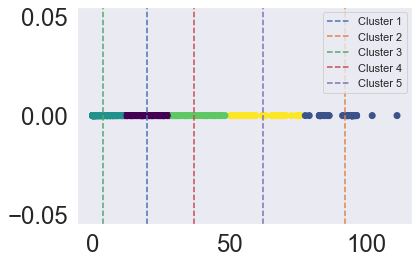

In [52]:
from sklearn.cluster import KMeans


## convert list of lists to numpy array
X = decision_combined['var_decision'].to_numpy().reshape(-1, 1)

## define # of clusters
k = 5

## initialize k-means algorithm
kmeans = KMeans(n_clusters=k, random_state=0)

## fit to data
kmeans.fit(X)

## retrieve cluster assignments for each participant
cluster_assignments = kmeans.labels_

## add cluster assignment to df
decision_combined['cluster'] = cluster_assignments

import matplotlib.pyplot as plt

# create a scatter plot of the purchase frequency data
print(X.shape)
plt.scatter(X, [0] * len(X), c=cluster_assignments, cmap='viridis')

## retrieve cluster centers
cluster_centers = kmeans.cluster_centers_

# plot the cluster centers as vertical lines with different colors
for i, center in enumerate(cluster_centers):
    plt.axvline(x=center, c='C'+str(i), linestyle='--', label=f'Cluster {i+1}')

plt.legend()
plt.show()


# decision_list

## Change in financial literacy, numeracy, and inflation awareness

## Change in choice confidence 

In [53]:
metacog = final_df_dict['current_choiceConfidence'].copy()
cols = metacog.columns.to_list()
cols = [c.replace(".player.current_choiceConfidence", "") for c in cols]
cols = [c.replace("task.", "month ") for c in cols]
metacog.columns = cols

results_metacog = metacog.groupby(['participant.day','participant.inflation','participant.intervention']).describe().T

## Add to list/dict of results for csv
result = 'metacog'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = metacog
results_dict[f'results_{result}'] = results_metacog

metacog
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined', 'metacog']


## Change in inflation perception (`priceMemory`)

In [54]:
inf_430 = [1,225,1,225]
inf_1012 = [68,68,114,103]
priceMemory = final_df_dict['task_questions'].copy()
priceMemory.drop(list(priceMemory.filter(regex='day_|payoff|group|subsession|time_')), axis=1, inplace=True)

## Remove extra text in column names
cols = priceMemory.columns.to_list()
cols = [c.replace("task_questions.1.player.", "") for c in cols]
priceMemory.columns = cols

## Retrieve day's inflation conditions
priceMemory['participant.inflation'] = priceMemory['participant.inflation'].apply(eval)
for i in range(len(priceMemory.index)):
    idx = int(priceMemory['participant.day'].iloc[i])
    priceMemory['participant.inflation'].iloc[i] = priceMemory['participant.inflation'].iloc[i][idx - 1]

## Calculate inflation rates between priceMemory periods
for n in range(1,5):
    priceMemory[f'{n}-{n + 1}'] = (
        ((priceMemory[f'priceMemory_{n + 1}'] - priceMemory[f'priceMemory_{n}'])\
            / priceMemory[f'priceMemory_{n}']) * 100
    )  
priceMemory['1-5'] = (
    ((priceMemory['priceMemory_5'] - priceMemory['priceMemory_1'])\
        / priceMemory['priceMemory_1']) * 100
)

## Calculate difference between estimate and actual
for n in range(2,6):
    priceMemory[f'factor_{n}'] = np.nan
for i in range(len(priceMemory.index)):
    for n in range(2,6):
        if priceMemory['participant.inflation'].iloc[i] == '1012':
            priceMemory[f'factor_{n}'].iloc[i] = priceMemory[f'{n - 1}-{n}'].iloc[i] /\
            inf_1012[n - 2]
        else:
            priceMemory[f'factor_{n}'].iloc[i] = priceMemory[f'{n - 1}-{n}'].iloc[i] /\
            inf_430[n - 2]

# ## Drop NaNs
# print(3, priceMemory.shape)
# priceMemory.dropna(inplace=True)
# print(4, priceMemory.shape)

# ## Drop inflation rates of 0%
# priceMemory = priceMemory.drop(priceMemory[(priceMemory['1-5'] <= 0) | (priceMemory['priceMemory_1'] >= 1000)].index)

## Reorder columns
cols = priceMemory.columns.to_list()

## Move id/groupby columns back to left
priceMemory.insert(4, '1-2',
              priceMemory.pop('1-2'))
priceMemory.insert(5, '2-3',
              priceMemory.pop('2-3'))
priceMemory.insert(6, '3-4',
              priceMemory.pop('3-4'))
priceMemory.insert(7, '4-5',
              priceMemory.pop('4-5'))
priceMemory.insert(4, '1-5',
              priceMemory.pop('1-5'))

stats_priceMemory = priceMemory.drop(list(priceMemory.filter(regex='inflationEstimation')), axis=1)

results_stats_priceMemory = stats_priceMemory.groupby(['participant.inflation','participant.day']).describe().T

## Add to list/dict of results for csv
result = 'stats_priceMemory'
print(result)
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = stats_priceMemory
results_dict[f'results_{result}'] = results_stats_priceMemory

stats_priceMemory
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined', 'metacog', 'stats_priceMemory']


## Change in inflation perception (`inflationEstimation`)

In [55]:
infEst = priceMemory.copy()
infEst.drop(list(infEst.filter(regex='priceMemory|2|4')), axis=1, inplace=True)

## Calculate difference between price memory and overal inflation estimate
infEst['diff_memory'] = infEst['1-5'] - infEst['inflationEstimation']

## Calculate divergence from actual inflation rate
infEst['est-actual'] = np.nan
for i in range(len(infEst.index)):
    if infEst['participant.inflation'].iloc[i] == '430':
        infEst['est-actual'].iloc[i] = 1123 - infEst['inflationEstimation'].iloc[i]
    else:
        infEst['est-actual'].iloc[i] = 1229 - infEst['inflationEstimation'].iloc[i]
        
## Summary df across sessions
sum_infEst = infEst[['participant.label','participant.intervention']]
inf = ['1012','430']
interv = ['pre','post']
for n in range(2):
    for j in range(2):
        sum_infEst[f'infEst_{inf[n]}_{interv[j]}'] = np.nan
        sum_infEst[f'est-actual_{inf[n]}_{interv[j]}'] = np.nan
        sum_infEst[f'1-5_{inf[n]}_{interv[j]}'] = np.nan
        sum_infEst[f'diff_mem_{inf[n]}_{interv[j]}'] = np.nan

print(1, sum_infEst.shape)
sum_infEst.drop_duplicates(subset=['participant.label'], inplace=True)
print(2, sum_infEst.shape)

## Fill summary df
for i in range(len(infEst.index)):
    inf = infEst['participant.inflation'].iloc[i]
    interv = 'pre' if infEst['participant.day'].iloc[i] < 3 else 'post'
    sum_infEst[f'infEst_{inf}_{interv}'].loc[
        sum_infEst['participant.label'] == infEst['participant.label'].iloc[i]
    ] = infEst['inflationEstimation'].iloc[i]
    sum_infEst[f'est-actual_{inf}_{interv}'].loc[
        sum_infEst['participant.label'] == infEst['participant.label'].iloc[i]
    ] = infEst['est-actual'].iloc[i]
    sum_infEst[f'1-5_{inf}_{interv}'].loc[
        sum_infEst['participant.label'] == infEst['participant.label'].iloc[i]
    ] = infEst['1-5'].iloc[i]
    sum_infEst[f'diff_mem_{inf}_{interv}'].loc[
        sum_infEst['participant.label'] == infEst['participant.label'].iloc[i]
    ] = infEst['diff_memory'].iloc[i]

## Calculate change in estimation pre- and post-intervention
sum_infEst['diff_1012'] = sum_infEst['infEst_1012_post'] - sum_infEst['infEst_1012_pre']
sum_infEst['diff_430'] = sum_infEst['infEst_430_post'] - sum_infEst['infEst_430_pre']
sum_infEst['diff_est-act_1012'] = sum_infEst['est-actual_1012_post'] - sum_infEst['est-actual_1012_pre']
sum_infEst['diff_est-act_430'] = sum_infEst['est-actual_430_post'] - sum_infEst['est-actual_430_pre']

# print(3, sum_infEst.shape)
# sum_infEst.dropna(inplace=True)
# print(4, sum_infEst.shape)

# infEst
infEst = sum_infEst
results_infEst = sum_infEst.groupby(['participant.intervention']).describe().T

## Add to list/dict of results for csv
result = 'infEst'
print('result')
metrics_list.append(result)
print(metrics_list)
metrics_dict[result] = infEst
results_dict[f'results_{result}'] = results_infEst

# infEst

1 (442, 18)
2 (122, 18)
result
['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined', 'metacog', 'stats_priceMemory', 'infEst']


## Change in inflation estimate from `inf_estimate`

In [56]:
inf_1012 = [0.45, 60.79, 0.45, 60.79, 0.45, 60.79, 0.45, 60.79, 0.45, 60.79]
inf_430 = [0.38, 0.47, 26.85, 55.49, 64.18, 0.38, 0.47, 26.85, 55.49, 64.18]
infEst_task = 0
infEst_task = final_df_dict['inf_estimate'].copy()

## Add columns to calculate difference between estimate and actual inflation
for t in range(1,11):
    infEst_task[f'factor_{t * 12}'] = np.nan
    
for i in range(len(infEst_task.index)):
    for t in range(1,11):
        if infEst_task['participant.inflation'].iloc[i] == '1012':
            infEst_task[f'factor_{t * 12}'].iloc[i] = (infEst_task[
                f'task.{t * 12}.player.inf_estimate'].iloc[i]) / inf_1012[t - 1]
        else:
            infEst_task[f'factor_{t * 12}'].iloc[i] = (infEst_task[
                f'task.{t * 12}.player.inf_estimate'].iloc[i]) / inf_430[t - 1]



infEst_task.sort_values(['participant.label','participant.day'])
result_infEst_task = infEst_task.groupby(['participant.intervention','participant.inflation','participant.day',]).describe().T

perceptions = infEst_task.drop(list(infEst_task.filter(regex='task')),axis=1)
perceptions['task_infAccuracy'] = 0
for i in range(len(perceptions)):
    perceptions['task_infAccuracy'].iloc[i] = perceptions[['factor_12','factor_24','factor_36','factor_48','factor_60','factor_72',
                                              'factor_84','factor_96','factor_108','factor_120']].iloc[i].mean()

## Add to list/dict of results for csv
result = 'perceptions'
print(result)
metrics_list.append(result)
print('metrics_list: ', metrics_list)
metrics_dict[result] = perceptions
results_dict[f'results_{result}'] = result_infEst_task

# perceptions

perceptions
metrics_list:  ['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined', 'metacog', 'stats_priceMemory', 'infEst', 'perceptions']


# Average Inflation Perception divergence

In [57]:
from tqdm import tqdm

inf_1012 = [0.45, 60.79, 0.45, 60.79, 0.45, 60.79, 0.45, 60.79, 0.45, 60.79]
inf_430 = [0.38, 0.47, 26.85, 55.49, 64.18, 0.38, 0.47, 26.85, 55.49, 64.18]
infPercep = final_df_dict['inf_estimate'].copy()

## Create new columns
for n in range(1,11):
        infPercep[f'percep_{n * 12}'] = np.nan
infPercep['mean_realPos'] = np.nan
infPercep['mean_realNeg'] = np.nan

cols = infPercep.columns.to_list()
print(cols[-10:-2:5]+cols[-9:-2:5]+cols[-8:-2:5])#[6::5]+cols[7::5])

## Difference between perception and actual rate
for i in range(len(infPercep)):
    inf = inf_1012 if infPercep['participant.inflation'].iloc[i] == '1012' else inf_430
    for n in range(1,11):
        # if infPercep[f'task.{n * 12}.player.inf_estimate'].iloc[i] - inf[n - 1] == 0:
        #      infPercep[f'percep_{n * 12}'].iloc[i] = 1
        # else:
        infPercep[f'percep_{n * 12}'].iloc[i] = 1 / (infPercep[
                f'task.{n * 12}.player.inf_estimate'].iloc[i] - inf[n - 1])

## Sum(Difference) / (6 | 5) for negative six or five real rate phases
## Sum(Difference) / (4 | 5) for positive four or five real rate phases
percep_dict = {'1012': {'denom':5,'colsPos':cols[-12:-2:2],'colsNeg':cols[-11:-2:2]},
 '430': {'denom':4,'colsPos':cols[-12:-2:5]+cols[-11:-2:5],
         'colsNeg':cols[-10:-2:5]+cols[-9:-2:5]+cols[-8:-2:5]}}

for i in tqdm(range(len(infPercep))):
    inf = infPercep['participant.inflation'].iloc[i]
    for n in range(1,11):
        infPercep['mean_realPos'].iloc[i] = infPercep[percep_dict[inf]['colsPos']].iloc[i].mean()
        infPercep['mean_realNeg'].iloc[i] = infPercep[percep_dict[inf]['colsNeg']].iloc[i].mean()

infPercep.groupby(['participant.inflation']).describe().T

['percep_36', 'percep_96', 'percep_48', 'percep_108', 'percep_60', 'percep_120']


100%|██████████| 442/442 [00:10<00:00, 43.47it/s]


participant.inflation                     1012         430
participant.day              count  220.000000  222.000000
                             mean     2.409091    2.459459
                             std      1.137131    1.119824
                             min      1.000000    1.000000
                             25%      1.000000    1.000000
                             50%      2.000000    2.000000
                             75%      3.000000    3.000000
                             max      4.000000    4.000000
task.12.player.inf_estimate  count  218.000000  218.000000
                             mean     3.793578    3.366972
                             std     10.507340   11.866120
                             min    -26.000000  -69.000000
                             25%      1.000000    1.000000
                             50%      1.000000    1.000000
                             75%      4.000000    3.000000
                             max     81.000000   92.000000
task.24.player.inf_estimate  count  218.000000  217.000000
                             mean    22.316514    4.290323
                             std     23.147808   11.454562
                             min    -30.000000  -37.000000
                             25%      5.000000    1.000000
                             50%     11.500000    2.000000
                             75%     40.000000    4.000000
                             max     90.000000   92.000000
task.36.player.inf_estimate  count  218.000000  217.000000
                             mean    10.917431   12.599078
                             std     17.810124   15.352361
                             min    -43.000000  -49.000000
                             25%      1.000000    3.000000
                             50%      5.000000    9.000000
                             75%     12.750000   20.000000
                             max     93.000000   93.000000
task.48.player.inf_estimate  count  218.000000  217.000000
                             mean    25.977064   19.981567
                             std     24.642783   21.707432
                             min    -76.000000  -87.000000
                             25%      7.000000    6.000000
                             50%     18.000000   12.000000
                             75%     44.750000   30.000000
                             max    100.000000  100.000000
task.60.player.inf_estimate  count  218.000000  217.000000
                             mean    14.894495   28.672811
                             std     24.771078   28.804077
                             min    -83.000000  -51.000000
                             25%      1.000000    7.000000
                             50%      5.000000   17.000000
                             75%     16.000000   50.000000
                             max    100.000000  100.000000
task.72.player.inf_estimate  count  218.000000  217.000000
                             mean    27.784404   14.313364
                             std     26.712056   24.813442
                             min    -44.000000  -42.000000
                             25%      6.250000    1.000000
                             50%     20.000000    5.000000
                             75%     44.000000   17.000000
                             max    100.000000  100.000000
task.84.player.inf_estimate  count  218.000000  217.000000
                             mean    15.467890   13.746544
                             std     24.564246   25.712176
                             min    -67.000000  -74.000000
                             25%      1.250000    1.000000
                             50%      5.500000    4.000000
                             75%     18.000000   15.000000
                             max    100.000000  100.000000
task.96.player.inf_estimate  count  217.000000  217.000000
                             mean    33.543779   19.986175
                             std     27.907904 

## Real life

In [58]:
from tqdm import tqdm

infK = ['infK_1','infK_2','infK_3','infK_4','infK_5','infK_6',]
## infK_1: taux plus élevé, 30 dernières années
## infK_2: taux plus bas, 30 dernières années
## infK_3: taux pendant 12 dernières mois
## infK_4: taux actuel
## infK_5: taux pendant 12 dernières mois
## infK_6: taux anticipé

cols = [f'Inflation.1.player.{k}' for k in infK]
cols.append('participant.label')
cols.append('participant.day')
print(cols)

inf_real = {
     'infK_1':6.3,
     'infK_2':0,
     'infK_3':6,
     'infK_4':6,
     'infK_5':6,
     'infK_6':5.9
}
# inf_430 = [0.38, 0.47, 26.85, 55.49, 64.18, 0.38, 0.47, 26.85, 55.49, 64.18]
lifePercep = final_df_dict['Inflation'][cols].copy()

## Create new columns
for n in range(1,7):
        lifePercep[f'percep_infK_{n}'] = np.nan
lifePercep['mean_percep'] = np.nan

cols = lifePercep.columns.to_list()
# print(cols[-10:-2:5]+cols[-9:-2:5]+cols[-8:-2:5])#[6::5]+cols[7::5])

## Accuracy (i.e. inverse) of difference between perception and actual rate
for i in tqdm(range(len(lifePercep)), desc='Accuracy'):
    # inf = inf_1012 if lifePercep['participant.inflation'].iloc[i] == '1012' else inf_430
    for k in infK:
        if lifePercep[f'Inflation.1.player.{k}'].iloc[i] - inf_real[k] != 0:
            lifePercep[f'percep_{k}'].iloc[i] = 1 / (lifePercep[f'Inflation.1.player.{k}'].iloc[i] - \
            inf_real[k])
        else:
            lifePercep[f'percep_{k}'].iloc[i] = 10

# ## Sum(Difference) / (6 | 5) for negative six or five real rate phases
# ## Sum(Difference) / (4 | 5) for positive four or five real rate phases
# percep_dict = {'1012': {'denom':5,'colsPos':cols[-12:-2:2],'colsNeg':cols[-11:-2:2]},
#  '430': {'denom':4,'colsPos':cols[-12:-2:5]+cols[-11:-2:5],
#          'colsNeg':cols[-10:-2:5]+cols[-9:-2:5]+cols[-8:-2:5]}}

for i in tqdm(range(len(lifePercep)), desc='Mean accuracy\t'):
    # inf = lifePercep['participant.inflation'].iloc[i]
    lifePercep['mean_percep'].iloc[i] = lifePercep[
         ['percep_infK_3','percep_infK_4','percep_infK_5',]].iloc[i].mean()

# lifePercep.groupby(['participant.inflation']).mean().T
lifePercep.describe().T

['Inflation.1.player.infK_1', 'Inflation.1.player.infK_2', 'Inflation.1.player.infK_3', 'Inflation.1.player.infK_4', 'Inflation.1.player.infK_5', 'Inflation.1.player.infK_6', 'participant.label', 'participant.day']


Mean accuracy	: 100%|██████████| 214/214 [00:00<00:00, 922.06it/s]


,count,mean,std,min,25%,50%,75%,max
Inflation.1.player.infK_1,214.0,16.957477,17.455537,-34.900000,7.725000,11.400000,17.400000,100.000000
Inflation.1.player.infK_2,214.0,0.177570,12.843722,-85.300000,-0.175000,0.600000,1.900000,95.600000
Inflation.1.player.infK_3,214.0,11.064486,14.335420,-32.800000,5.725000,7.100000,10.075000,91.000000
Inflation.1.player.infK_4,214.0,9.453738,11.689177,0.000000,5.600000,6.500000,8.200000,96.100000
Inflation.1.player.infK_5,214.0,15.571963,16.796519,-2.800000,6.900000,10.300000,17.650000,100.000000
Inflation.1.player.infK_6,214.0,14.095327,16.235930,0.000000,5.300000,9.250000,15.000000,98.200000
participant.day,214.0,2.971963,1.001951,2.000000,2.000000,2.000000,4.000000,4.000000
percep_infK_1,214.0,0.390366,1.945109,-10.000000,0.041195,0.116279,0.312500,10.000000
percep_infK_2,214.0,1.376962,3.035448,-10.000000,-0.011765,0.513158,1.607143,10.000000
percep_infK_3,214.0,0.575665,2.714446,-10.000000,-0.223646,0.227390,0.714286,10.000000


In [59]:
lifePercep.loc[lifePercep['participant.label'] == 'KBY81Cw']

,Inflation.1.player.infK_1,Inflation.1.player.infK_2,Inflation.1.player.infK_3,Inflation.1.player.infK_4,Inflation.1.player.infK_5,Inflation.1.player.infK_6,participant.label,participant.day,percep_infK_1,percep_infK_2,percep_infK_3,percep_infK_4,percep_infK_5,percep_infK_6,mean_percep
2505,7.9,1.3,7.9,7.9,4.8,4.8,KBY81Cw,2.0,0.625,0.769231,0.526316,0.526316,-0.833333,-0.909091,0.073099
3479,7.9,4.0,7.9,7.9,77.1,6.1,KBY81Cw,4.0,0.625,0.250000,0.526316,0.526316,0.014065,5.000000,0.355565


## Compare to response time for corresponding month

['430', '1012', '1012', '430'] [1.0, 3.0, 2.0, 4.0]


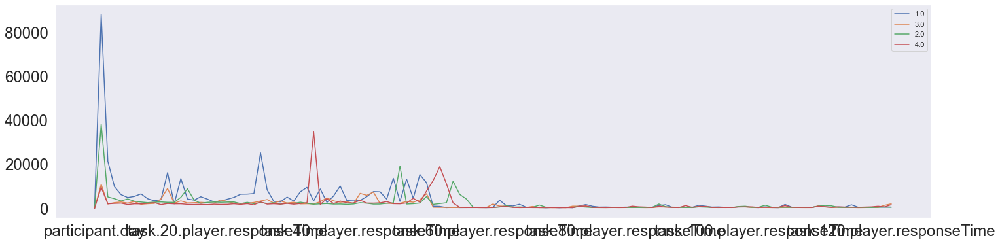

(442, 11)
['participant.code', 'participant.label', 'participant.time_started_utc', 'participant.inflation', 'participant.intervention', 'participant.day', 'task.12.player.inf_estimate', 'task.24.player.inf_estimate', 'task.36.player.inf_estimate', 'task.48.player.inf_estimate', 'task.60.player.inf_estimate', 'task.72.player.inf_estimate', 'task.84.player.inf_estimate', 'task.96.player.inf_estimate', 'task.108.player.inf_estimate', 'task.120.player.inf_estimate', 'percep_12', 'percep_24', 'percep_36', 'percep_48', 'percep_60', 'percep_72', 'percep_84', 'percep_96', 'percep_108', 'percep_120', 'mean_realPos', 'mean_realNeg', 'task.12.player.responseTime', 'task.24.player.responseTime', 'task.36.player.responseTime', 'task.48.player.responseTime', 'task.60.player.responseTime', 'task.72.player.responseTime', 'task.84.player.responseTime', 'task.96.player.responseTime', 'task.108.player.responseTime', 'task.120.player.responseTime']


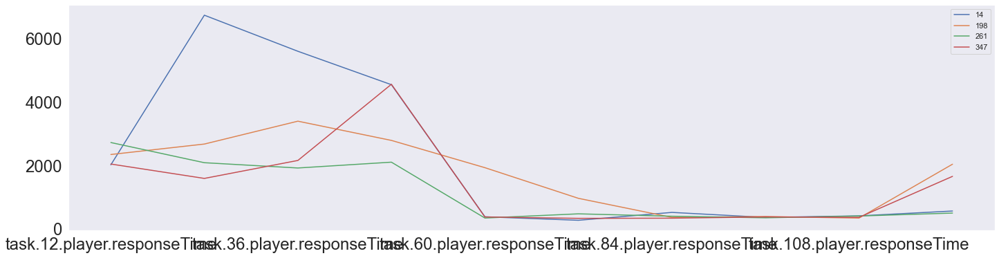

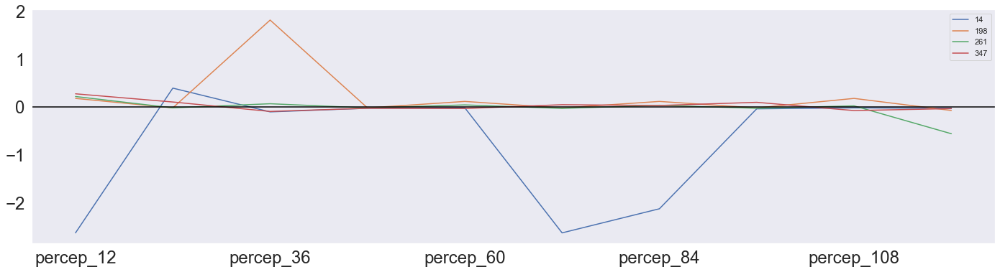

In [60]:
responseTime = final_df_dict['responseTime'].copy()
initCols = responseTime.columns.to_list()

person = '66vJtXT'

fig, ax = plt.subplots(figsize=(24, 6))
responseTime[initCols[5:]].loc[
    responseTime['participant.label'] == person
].T.plot(ax=ax)
plt.legend([x for x in responseTime['participant.day'].loc[
    responseTime['participant.label'] == person
]])
# day_dict = {}
# for i in tqdm(range(len(responseTime))):
#     day_dict[responseTime['participant.label'].iloc[i]] = {}
#     day_dict[responseTime['participant.label'].iloc[i]][
#         responseTime['participant.day'].iloc[i]
#     ] = responseTime['participant.inflation'].iloc[i]
# print(day_dict[person])


print([x for x in responseTime['participant.inflation'].loc[
    responseTime['participant.label'] == person]],
    [x for x in responseTime['participant.day'].loc[
    responseTime['participant.label'] == person]])
plt.show()

cols = [f'task.{x}.player.responseTime' for x in range(12, 121, 12)]
cols.insert(0, 'participant.code')
responseTime = responseTime[cols]
print(responseTime.shape)

responseTime = pd.merge(infPercep, responseTime)


responseTime[cols[1:]].loc[
    responseTime['participant.label'] == person
].T.plot(figsize=(24, 6))#ax=ax)

percepCols = responseTime.columns.to_list()
print(percepCols)
percepCols = [x for x in percepCols if 'percep_' in x]

fig, ax = plt.subplots(figsize=(24, 6))
responseTime[percepCols].loc[
    responseTime['participant.label'] == person
].T.plot(ax=ax)#plot(ax=ax, secondary_y=True)
plt.axhline(y=0.0, color='black', linestyle='-')
# plt.legend([x for x in responseTime['participant.day'].loc[
#     responseTime['participant.label'] == person
# ]])

plt.show()

## Correlation matrix

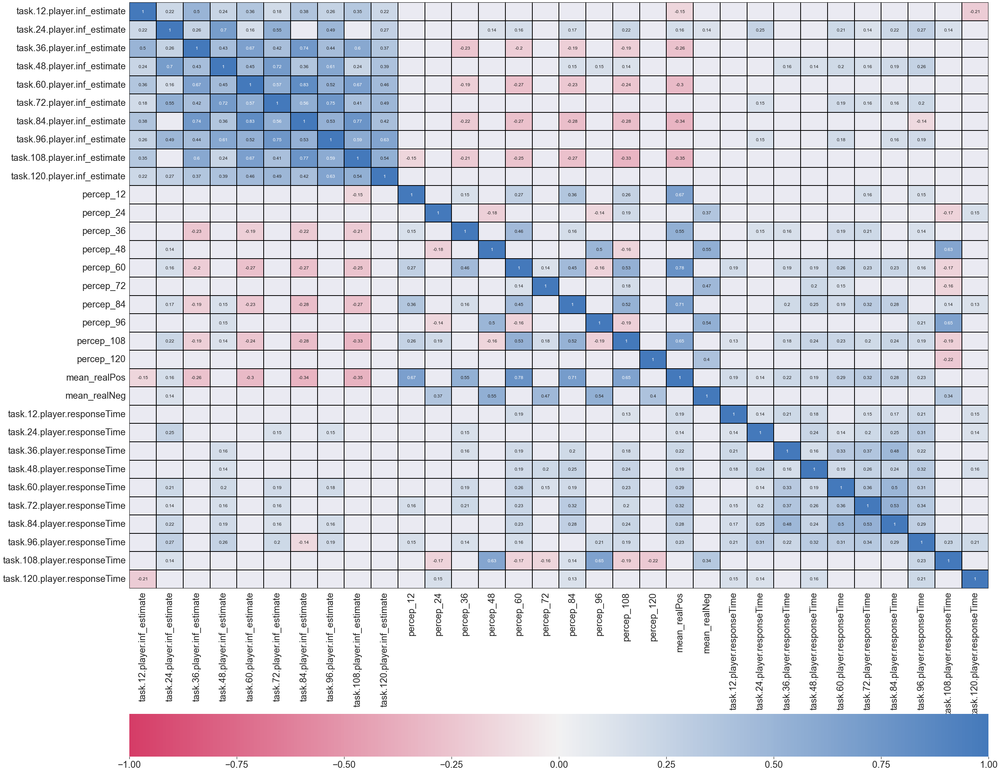

In [61]:
from scipy import stats

responseTimeCorr = responseTime.copy()
responseTimeCorr = responseTimeCorr.loc[
    responseTimeCorr['participant.inflation'] != '430'
]

for i in range(len(responseTimeCorr)):
    if responseTimeCorr['participant.intervention'].iloc[i] == 'intervention':
        responseTimeCorr['participant.intervention'].iloc[i] = 1
    else:
        responseTimeCorr['participant.intervention'].iloc[i] = 0

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


cols = [#'participant.intervention', 'participant.day', 
        'task.12.player.inf_estimate', 
        'task.24.player.inf_estimate', 'task.36.player.inf_estimate', 
        'task.48.player.inf_estimate', 'task.60.player.inf_estimate', 
        'task.72.player.inf_estimate', 'task.84.player.inf_estimate', 
        'task.96.player.inf_estimate', 'task.108.player.inf_estimate', 
        'task.120.player.inf_estimate', 'percep_12', 'percep_24', 'percep_36', 
        'percep_48', 'percep_60', 'percep_72', 'percep_84', 'percep_96', 
        'percep_108', 'percep_120', 'mean_realPos', 'mean_realNeg', 
        'task.12.player.responseTime', 'task.24.player.responseTime', 
        'task.36.player.responseTime', 'task.48.player.responseTime', 
        'task.60.player.responseTime', 'task.72.player.responseTime', 
        'task.84.player.responseTime', 'task.96.player.responseTime', 
        'task.108.player.responseTime', 'task.120.player.responseTime']
responseTimeCorr = responseTimeCorr[cols]
# responseTimeCorr = responseTimeCorr.replace([np.inf, -np.inf], 1)
responseTimeCorr = responseTimeCorr.dropna(axis=0)
responseTimeCorr.dtypes

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = responseTimeCorr.corr()                            # get correlation
p_values = corr_sig(responseTimeCorr)                     # get p-Value
mask = np.invert((p_values<0.05))    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 

# Price memory and strategies

In [62]:
prices_430 = [8.07, 8.16614434923746, 28.2112406111089, 28.5609992578939, 98.6685010329734]
prices_1012 = [8.07, 13.57, 22.82, 50.79, 107.22]

stratpricememory = priceMemory.copy()
stratpricememory = stratpricememory[['participant.code', 'participant.label', 
'participant.inflation', 'participant.day', 'priceMemory_1', 'priceMemory_2', 'priceMemory_3', 
'priceMemory_4', 'priceMemory_5',]]
for n in range(1,6):
    stratpricememory[f'accuracy_{n}'] = np.nan

# cols = [f'task.{x}.player.responseTime' for x in range(30, 121, 30)]
# cols.insert(0, 'task.1.player.responseTime')
# cols.insert(0, 'participant.inflation')
# cols.insert(0, 'participant.code')

# print(cols)
# stratpricememory = stratpricememory[cols]

# for i in range(len(priceMemory)):
#     for n in range(1,6):
#         stratpricememory[f'priceMemory_{n}'].loc[
#             stratpricememory['participant.code'] == priceMemory['participant.code'].iloc[i]
#         ] = priceMemory[f'priceMemory_{n}'].iloc[i]

for i in range(len(stratpricememory)):
    for n in range(1,6):
        price = prices_430 if stratpricememory['participant.inflation'].iloc[i] == '430' else prices_1012
        # stratpricememory[f'accuracy_{n}'].iloc[i] = abs(stratpricememory[f'priceMemory_{n}'].iloc[i] - price[n - 1])
        if priceMemory[f'priceMemory_{n}'].iloc[i] - price[n - 1] == 0:
            stratpricememory[f'accuracy_{n}'].iloc[i] = 1000
        else:
            stratpricememory[f'accuracy_{n}'].iloc[i] = 1 / \
            (priceMemory[f'priceMemory_{n}'].iloc[i] - price[n - 1])

# stratpricememory.groupby('participant.inflation').describe().T
# stratpricememory.groupby('participant.inflation').hist(figsize=(20,20))

print('stratpricememory.shape', stratpricememory.shape)

stratpricememory.describe()

summMemory = stratpricememory.copy()
# summMemory = summMemory['participant.label']
cols = ['participant.label']
for n in tqdm(range(1,6)):
    for day in ['pre','post']:
        for inf in ['1012','430']:
            summMemory[f'{inf}_{day}_accuracy_{n}'] = np.nan
            cols.append(f'{inf}_{day}_accuracy_{n}')
print(cols)
print(summMemory.shape)
summMemory = summMemory.drop_duplicates(subset=['participant.label'])
print(summMemory.shape)
summMemory = summMemory[cols]

for i in range(len(stratpricememory)):
    day = 'pre' if stratpricememory['participant.day'].iloc[i] < 3 else 'post'
    inf = '1012' if stratpricememory['participant.inflation'].iloc[i] == '1012' else '430'
    for n in range(1,6):
        summMemory[f'{inf}_{day}_accuracy_{n}'].loc[
            summMemory['participant.label'] == stratpricememory['participant.label'].iloc[i]
        ] = stratpricememory[f'accuracy_{n}'].iloc[i]



summMemory.describe().T

stratpricememory.shape (442, 14)


100%|██████████| 5/5 [00:00<00:00, 310.83it/s]

['participant.label', '1012_pre_accuracy_1', '430_pre_accuracy_1', '1012_post_accuracy_1', '430_post_accuracy_1', '1012_pre_accuracy_2', '430_pre_accuracy_2', '1012_post_accuracy_2', '430_post_accuracy_2', '1012_pre_accuracy_3', '430_pre_accuracy_3', '1012_post_accuracy_3', '430_post_accuracy_3', '1012_pre_accuracy_4', '430_pre_accuracy_4', '1012_post_accuracy_4', '430_post_accuracy_4', '1012_pre_accuracy_5', '430_pre_accuracy_5', '1012_post_accuracy_5', '430_post_accuracy_5']
(442, 34)
(122, 34)


,count,mean,std,min,25%,50%,75%,max
1012_pre_accuracy_1,113.0,200.030857,407.089654,-100.000000,-14.285714,-0.245700,25.000000,1000.000000
430_pre_accuracy_1,112.0,227.287847,427.682885,-100.000000,-14.285714,-0.325733,100.000000,1000.000000
1012_post_accuracy_1,105.0,455.980507,502.303578,-100.000000,-14.285714,100.000000,1000.000000,1000.000000
430_post_accuracy_1,105.0,502.842962,504.713541,-50.000000,-14.285714,1000.000000,1000.000000,1000.000000
1012_pre_accuracy_2,113.0,45.774532,206.495686,-14.285714,-0.116686,0.087489,0.411523,1000.000000
430_pre_accuracy_2,112.0,14.894928,58.896169,-6.018863,0.084503,0.146330,0.545299,259.359590
1012_post_accuracy_2,105.0,239.397443,427.463798,-14.285714,-0.280112,0.225734,100.000000,1000.000000
430_post_accuracy_2,105.0,67.501115,113.498114,-6.018863,0.127651,0.545299,259.359590,259.359590
1012_pre_accuracy_3,113.0,44.537558,206.502056,-3.125000,0.026896,0.045086,0.139276,1000.000000
430_pre_accuracy_3,112.0,-57.840266,208.454003,-806.054365,-0.255946,0.033097,0.102158,2.951948


# RTs and price memory

In [63]:
prices_430 = [8.07, 8.16614434923746, 28.2112406111089, 28.5609992578939, 98.6685010329734]
prices_1012 = [8.07, 13.57, 22.82, 50.79, 107.22]

['participant.code', 'participant.inflation', 'task.1.player.responseTime', 'task.30.player.responseTime', 'task.60.player.responseTime', 'task.90.player.responseTime', 'task.120.player.responseTime']


participant.inflation
1012    [[AxesSubplot(0.125,0.725918;0.158163x0.154082...
430     [[AxesSubplot(0.125,0.725918;0.158163x0.154082...
dtype: object

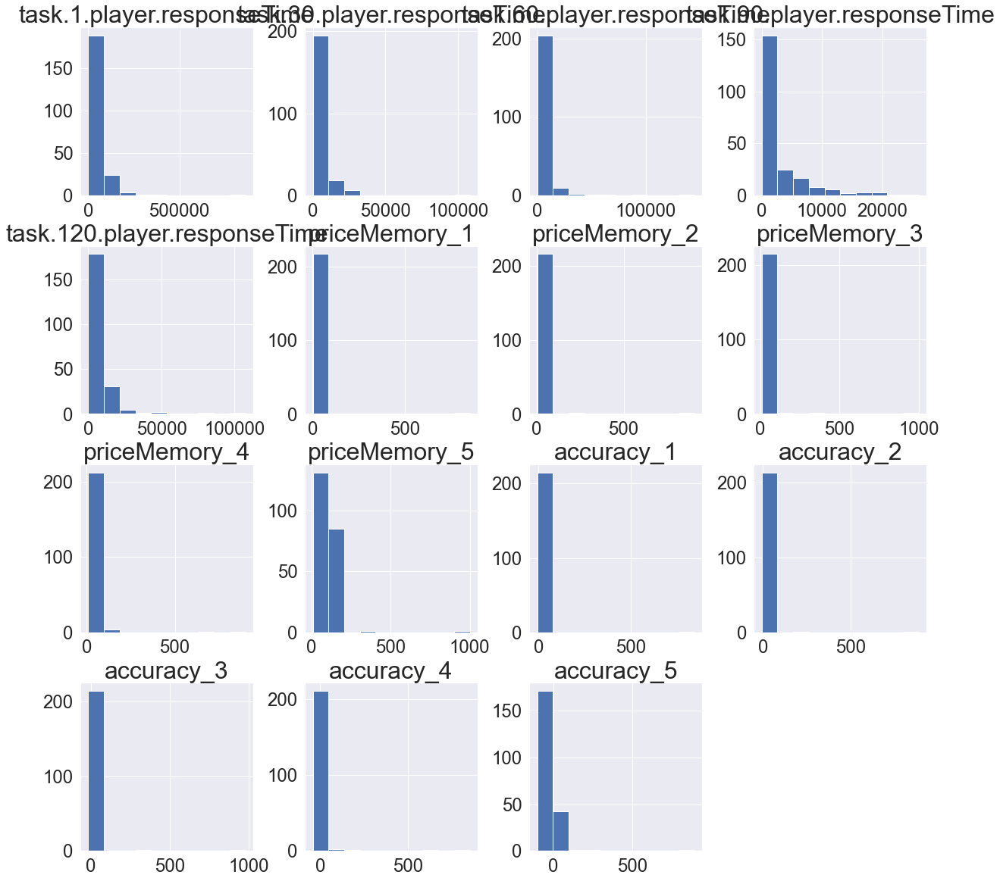

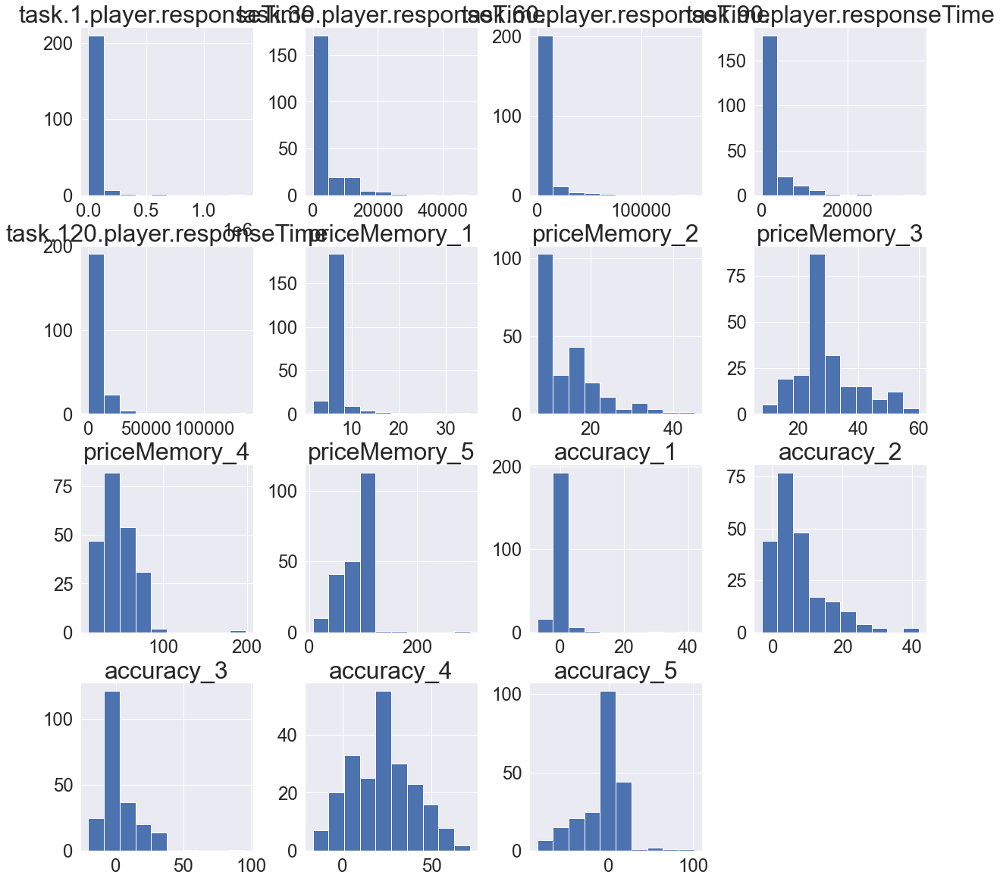

In [64]:
priceMemoryRT = final_df_dict['responseTime'].copy()

cols = [f'task.{x}.player.responseTime' for x in range(30, 121, 30)]
cols.insert(0, 'task.1.player.responseTime')
cols.insert(0, 'participant.inflation')
cols.insert(0, 'participant.code')

print(cols)
priceMemoryRT = priceMemoryRT[cols]

for n in range(1,6):
    priceMemoryRT[f'priceMemory_{n}'] = np.nan
for n in range(1,6):
    priceMemoryRT[f'accuracy_{n}'] = np.nan

for i in range(len(priceMemory)):
    for n in range(1,6):
        priceMemoryRT[f'priceMemory_{n}'].loc[
            priceMemoryRT['participant.code'] == priceMemory['participant.code'].iloc[i]
        ] = priceMemory[f'priceMemory_{n}'].iloc[i]

for i in range(len(priceMemoryRT)):
    for n in range(1,6):
        price = prices_430 if priceMemoryRT['participant.inflation'].iloc[i] == '430' else prices_1012
        priceMemoryRT[f'accuracy_{n}'].iloc[i] = priceMemory[f'priceMemory_{n}'].iloc[i] - price[n - 1]
        # if priceMemory[f'priceMemory_{n}'].iloc[i] - price[n - 1] == 0:
        #     priceMemoryRT[f'accuracy_{n}'].iloc[i] = 1000
        # else:
        #     priceMemoryRT[f'accuracy_{n}'].iloc[i] = 1 / \
        #     (priceMemory[f'priceMemory_{n}'].iloc[i] - price[n - 1])

priceMemoryRT.groupby('participant.inflation').describe().T
priceMemoryRT.groupby('participant.inflation').hist(figsize=(20,20))

### Correlation matrix

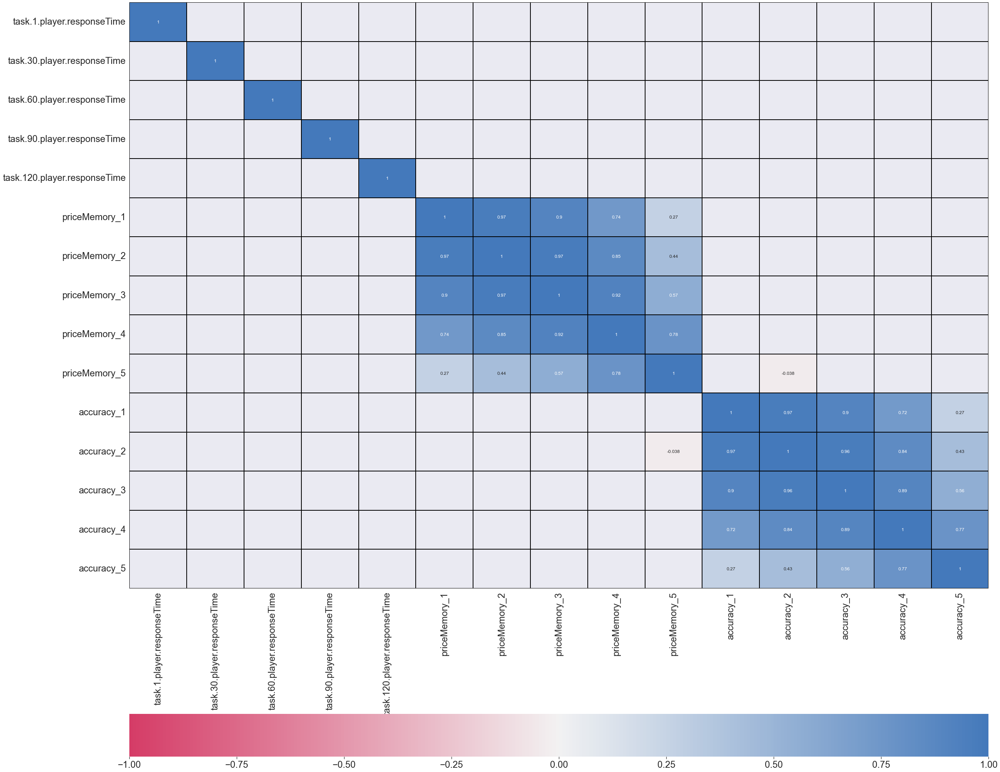

In [65]:
df = priceMemoryRT

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


cols = df.columns.to_list()
# corr = corr.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(corr)                     # get p-Value
mask = np.invert(p_values<0.05)            # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 

# Distribution of RTs

participant.inflation
1012    [[AxesSubplot(0.125,0.826071;0.0553571x0.05392...
430     [[AxesSubplot(0.125,0.826071;0.0553571x0.05392...
dtype: object

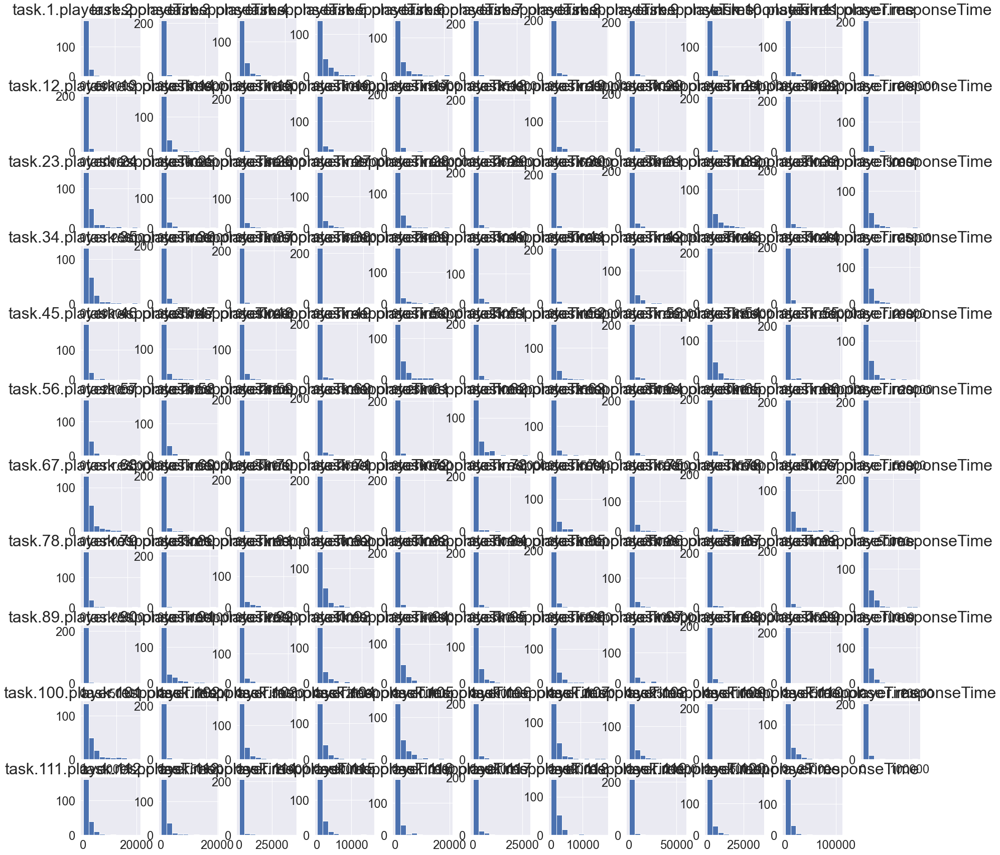

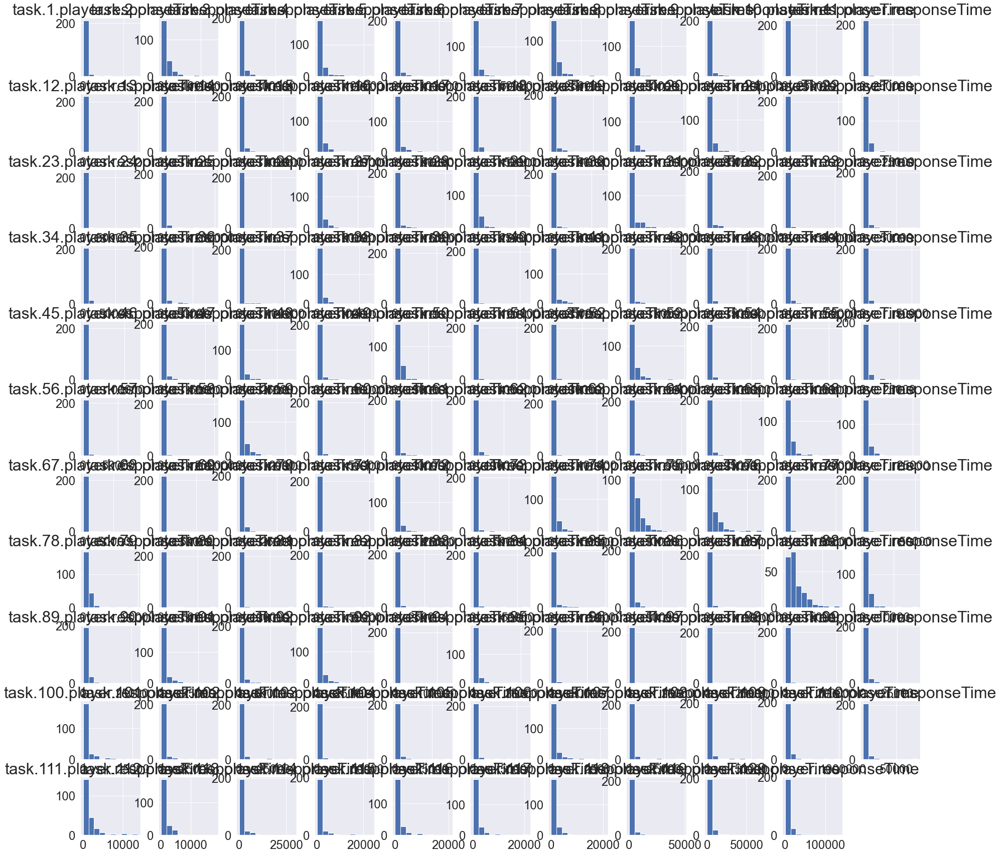

In [66]:
rts = final_df_dict['responseTime'].copy()
rts[[c for c in rts.columns.to_list() if ('Time' in c) | ('inflation' in c)]].groupby(['participant.inflation']).hist(figsize=(30,30))

## Remove outliers

In [67]:
def remove_outliers(df,columns,n_std):
    for col in columns:
        # print('Working on column: {}'.format(col))
        
        mean = df[col].mean()
        sd = df[col].std()
        
        df = df[(df[col] <= mean+(n_std*sd))]
        
    return df

<AxesSubplot:>

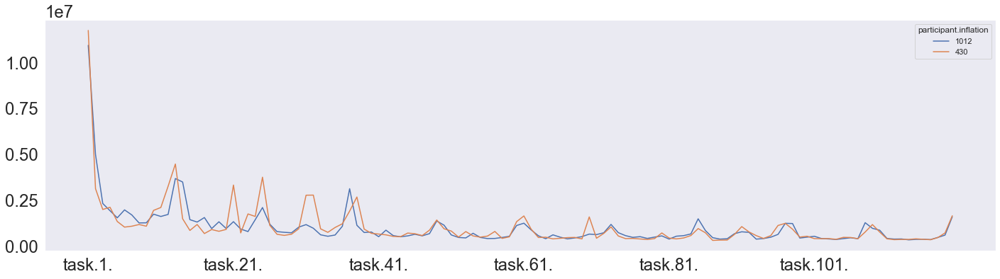

In [68]:
# remove_outliers(rts,[c for c in rts.columns.to_list() if 'Time' in c], 3)

cols = rts.columns.to_list()
cols = [c.replace('player.responseTime', '') for c in cols]
rts.columns = cols

fig, ax = plt.subplots(figsize=(24, 6))
rts[[c for c in rts.columns.to_list() if ('participant' not in c) or ('inflation' in c)]
    ].groupby('participant.inflation').sum().T.plot(ax=ax, legend=True)#plot(ax=ax, secondary_y=True)

# Average RTs during each inflation phase

In [69]:
for n in range(0,10):
    print(rts.columns.to_list()[(6 + (n * 30)):(36 + (n * 30))], (6 + (n * 12)), (36 + (n * 12)))
# print(rts.columns.to_list()[6:18])
# print(rts.columns.to_list()[19:])

['task.1.', 'task.2.', 'task.3.', 'task.4.', 'task.5.', 'task.6.', 'task.7.', 'task.8.', 'task.9.', 'task.10.', 'task.11.', 'task.12.', 'task.13.', 'task.14.', 'task.15.', 'task.16.', 'task.17.', 'task.18.', 'task.19.', 'task.20.', 'task.21.', 'task.22.', 'task.23.', 'task.24.', 'task.25.', 'task.26.', 'task.27.', 'task.28.', 'task.29.', 'task.30.'] 6 36
['task.31.', 'task.32.', 'task.33.', 'task.34.', 'task.35.', 'task.36.', 'task.37.', 'task.38.', 'task.39.', 'task.40.', 'task.41.', 'task.42.', 'task.43.', 'task.44.', 'task.45.', 'task.46.', 'task.47.', 'task.48.', 'task.49.', 'task.50.', 'task.51.', 'task.52.', 'task.53.', 'task.54.', 'task.55.', 'task.56.', 'task.57.', 'task.58.', 'task.59.', 'task.60.'] 18 48
['task.61.', 'task.62.', 'task.63.', 'task.64.', 'task.65.', 'task.66.', 'task.67.', 'task.68.', 'task.69.', 'task.70.', 'task.71.', 'task.72.', 'task.73.', 'task.74.', 'task.75.', 'task.76.', 'task.77.', 'task.78.', 'task.79.', 'task.80.', 'task.81.', 'task.82.', 'task.83.',

In [70]:
avgrts = rts[[c for c in rts.columns.to_list() if 'participant' in c]].copy()
avgrts[[f'avgRT_{n}' for n in range(1,11)]] = np.nan

print('rts', rts.shape, 'avgrts', avgrts.shape)

for i in range(len(rts)):
    if rts['participant.inflation'].iloc[i] == '1012':
        for n in range(0,10):
            avgrts[f'avgRT_{n + 1}'].loc[
                avgrts['participant.code'] == rts['participant.code'].iloc[i]
            ] = rts[rts.columns.to_list()[(6 + (n * 12)):(18 + (n * 12))]].iloc[i].mean()
    else:
        for n in range(0,5):
            avgrts[f'avgRT_{n + 1}'].loc[
                avgrts['participant.code'] == rts['participant.code'].iloc[i]
            ] = rts[rts.columns.to_list()[(6 + (n * 30)):(36 + (n * 30))]].iloc[i].mean()

print('rts', rts.shape, 'avgrts', avgrts.shape)

summRTs = avgrts[['participant.label']].copy()

cols430 = [f'430_avgRT_{n}_{day}' for n in range(1,5) for day in ['pre','post']]
cols1012 = [f'1012_avgRT_{n}_{day}' for n in range(1,11) for day in ['pre','post']]

summRTs[cols430 + cols1012] = np.nan
summRTs.drop_duplicates(inplace=True)

for i in range(len(avgrts)):
    if avgrts['participant.day'].iloc[i] < 3:
        day = 'pre'
    else:
        day = 'post'
    if avgrts['participant.inflation'].iloc[i] == '1012':
        inf = '1012'
        for n in range(1,11):
            summRTs[f'1012_avgRT_{n}_{day}'].loc[
                summRTs['participant.label'] == avgrts['participant.label'].iloc[i]
            ] = avgrts[f'avgRT_{n}'].iloc[i]
    else:
        inf = '430'
        for n in range(1,5):
            summRTs[f'430_avgRT_{n}_{day}'].loc[
                summRTs['participant.label'] == avgrts['participant.label'].iloc[i]
            ] = avgrts[f'avgRT_{n}'].iloc[i]

print(summRTs.shape)

# avgrts.loc[avgrts['participant.inflation'] == '1012']

summRTs[summRTs.isna().any(axis=1)]

# summRTs.dropna(inplace=True)

# print(summRTs.shape)

rts (442, 126) avgrts (442, 16)
rts (442, 126) avgrts (442, 16)
(122, 29)


,participant.label,430_avgRT_1_pre,430_avgRT_1_post,430_avgRT_2_pre,430_avgRT_2_post,430_avgRT_3_pre,430_avgRT_3_post,430_avgRT_4_pre,430_avgRT_4_post,1012_avgRT_1_pre,1012_avgRT_1_post,1012_avgRT_2_pre,1012_avgRT_2_post,1012_avgRT_3_pre,1012_avgRT_3_post,1012_avgRT_4_pre,1012_avgRT_4_post,1012_avgRT_5_pre,1012_avgRT_5_post,1012_avgRT_6_pre,1012_avgRT_6_post,1012_avgRT_7_pre,1012_avgRT_7_post,1012_avgRT_8_pre,1012_avgRT_8_post,1012_avgRT_9_pre,1012_avgRT_9_post,1012_avgRT_10_pre,1012_avgRT_10_post
41,KHnGrPN,6278.633333,7298.333333,1566.133333,2902.066667,1363.300000,2023.466667,1408.600000,2607.733333,22553.916667,NaN,4394.166667,NaN,941.750000,NaN,1360.250000,NaN,966.500000,NaN,1077.916667,NaN,750.500000,NaN,1760.500000,NaN,1625.500000,NaN,2044.916667,NaN
42,0phpDYg,13838.966667,NaN,12291.366667,NaN,1839.633333,NaN,1613.733333,NaN,20602.250000,NaN,18862.000000,NaN,2983.666667,NaN,5465.000000,NaN,4892.750000,NaN,1973.750000,NaN,1241.500000,NaN,4481.166667,NaN,1660.166667,NaN,4896.416667,NaN
46,M7pxjVg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7821.000000,NaN,15732.666667,NaN,7622.583333,NaN,4134.416667,NaN,6226.833333,NaN,5716.333333,NaN,5074.500000,NaN,8753.416667,NaN,7219.333333,NaN,1450.916667,NaN
53,k8znGpd,4972.433333,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54,Q5txdbr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16993.416667,NaN,7378.250000,NaN,1308.166667,NaN,2015.000000,NaN,654.750000,NaN,966.083333,NaN,968.166667,NaN,994.000000,NaN,879.583333,NaN,817.750000,NaN
64,mlm11yH,225696.866667,NaN,21349.266667,NaN,9011.733333,NaN,4880.533333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
81,j8Y829M,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92,shV5hCW,15500.766667,NaN,4405.733333,NaN,2612.633333,NaN,2679.066667,NaN,17807.916667,NaN,1299.416667,NaN,1906.500000,NaN,1162.250000,NaN,670.416667,NaN,3232.500000,NaN,1064.083333,NaN,869.000000,NaN,994.000000,NaN,1078.083333,NaN
99,MKnr7n0,4826.666667,NaN,5174.166667,NaN,3517.600000,NaN,4167.500000,NaN,20687.166667,NaN,25974.083333,NaN,24324.500000,NaN,4094.833333,NaN,7374.166667,NaN,28046.083333,NaN,8082.500000,NaN,5610.666667,NaN,5673.000000,NaN,1844.333333,NaN
100,0NPQFH3,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# RTs and divergence from optimal

In [71]:
# particip_dict[particip_list[1]]

# Combine `task` and `Wisconsin` RTs

In [72]:
responseTimeWisc = responseTime.copy()

for t in range(1,31):
    responseTimeWisc[f'trial_{t}_RT'] = np.nan

for i in range(len(wiscrt)):
    for t in range(1,31):
        responseTimeWisc[f'trial_{t}_RT'].loc[
            responseTimeWisc['participant.label'] == wiscrt['participant.label'].iloc[i]
        ] = wiscrt[f'trial_{t}_RT'].iloc[i]

# responseTimeWisc.loc[(responseTimeWisc['participant.label'] == 'dMp0jM8') | (responseTimeWisc['participant.label'] == 'qh30DYL')].sort_values('participant.label')

## Correlation matrix

(442, 68)
(442, 62)
(424, 62)


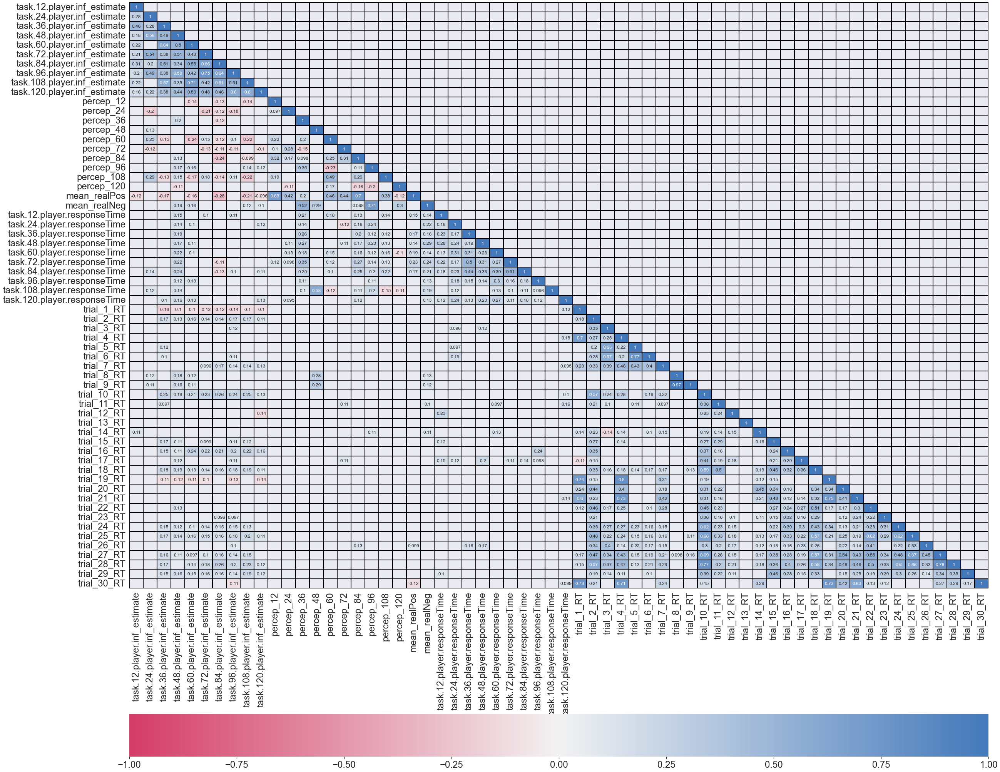

In [73]:
from scipy import stats

df = responseTimeWisc.copy()
# df = df.loc[
#     df['participant.inflation'] != '430'
# ]

for i in range(len(df)):
    if df['participant.intervention'].iloc[i] == 'intervention':
        df['participant.intervention'].iloc[i] = 1
    else:
        df['participant.intervention'].iloc[i] = 0

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


cols = [#'participant.intervention', 'participant.day', 
        'task.12.player.inf_estimate', 
        'task.24.player.inf_estimate', 'task.36.player.inf_estimate', 
        'task.48.player.inf_estimate', 'task.60.player.inf_estimate', 
        'task.72.player.inf_estimate', 'task.84.player.inf_estimate', 
        'task.96.player.inf_estimate', 'task.108.player.inf_estimate', 
        'task.120.player.inf_estimate', 'percep_12', 'percep_24', 'percep_36', 
        'percep_48', 'percep_60', 'percep_72', 'percep_84', 'percep_96', 
        'percep_108', 'percep_120', 'mean_realPos', 'mean_realNeg', 
        'task.12.player.responseTime', 'task.24.player.responseTime', 
        'task.36.player.responseTime', 'task.48.player.responseTime', 
        'task.60.player.responseTime', 'task.72.player.responseTime', 
        'task.84.player.responseTime', 'task.96.player.responseTime', 
        'task.108.player.responseTime', 'task.120.player.responseTime', 
        'trial_1_RT', 'trial_2_RT',
        'trial_3_RT', 'trial_4_RT', 'trial_5_RT', 'trial_6_RT', 'trial_7_RT',
        'trial_8_RT', 'trial_9_RT', 'trial_10_RT', 'trial_11_RT', 'trial_12_RT',
        'trial_13_RT', 'trial_14_RT', 'trial_15_RT', 'trial_16_RT',
        'trial_17_RT', 'trial_18_RT', 'trial_19_RT', 'trial_20_RT',
        'trial_21_RT', 'trial_22_RT', 'trial_23_RT', 'trial_24_RT',
        'trial_25_RT', 'trial_26_RT', 'trial_27_RT', 'trial_28_RT',
        'trial_29_RT', 'trial_30_RT']
print(df.shape)
df = df[cols]
print(df.shape)
# df = df.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)
print(df.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(df)                     # get p-Value
mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 

## Group by participant

In [74]:
## Summary df across sessions
summ_infPercep = infPercep[['participant.label','participant.intervention']].copy()
summ_infPercep.drop_duplicates(subset=['participant.label'], inplace=True)
inf = ['1012','430']
interv = ['pre','post']
for n in range(2):
    for j in range(2):
        summ_infPercep[f'mean_realPos_{inf[n]}_{interv[j]}'] = np.nan
        summ_infPercep[f'mean_realNeg_{inf[n]}_{interv[j]}'] = np.nan
        # if n == 1:
        #     summ_infPercep[f'mean_low_{inf[n]}_{interv[j]}'] = np.nan
        #     summ_infPercep[f'mean_high_{inf[n]}_{interv[j]}'] = np.nan

## Fill summary df
for i in range(len(infPercep.index)):
    inf = infPercep['participant.inflation'].iloc[i]
    interv = 'pre' if infPercep['participant.day'].iloc[i] < 3 else 'post'
    summ_infPercep[f'mean_realPos_{inf}_{interv}'].loc[
        summ_infPercep['participant.label'] == infPercep['participant.label'].iloc[i]
    ] = infPercep['mean_realPos'].iloc[i]
    summ_infPercep[f'mean_realNeg_{inf}_{interv}'].loc[
        summ_infPercep['participant.label'] == infPercep['participant.label'].iloc[i]
    ] = infPercep['mean_realNeg'].iloc[i]
    # if inf == '430':
    #     summ_infPercep[f'mean_low_{inf}_{interv}'].loc[
    #         summ_infPercep['participant.label'] == infPercep['participant.label'].iloc[i]
    #     ] = infPercep['mean_low'].iloc[i]
    #     summ_infPercep[f'mean_high_{inf}_{interv}'].loc[
    #         summ_infPercep['participant.label'] == infPercep['participant.label'].iloc[i]
    #     ] = infPercep['mean_high'].iloc[i]


# summ_infPercep

# Average Expected Inflation divergence

In [75]:
from tqdm import tqdm

inf_1012 = [60.79, 0.45, 60.79, 0.45, 60.79, 0.45, 60.79, 0.45, 60.79]
inf_430 = [0.47, 26.85, 55.49, 64.18, 0.38, 0.47, 26.85, 55.49, 64.18]
infExp = final_df_dict['inf_expectation'].copy()

## Create new columns
for n in range(1,10):
        infExp[f'expect_{n * 12}'] = np.nan
infExp['mean_increase'] = np.nan
infExp['mean_decrease'] = np.nan
infExp['mean_low'] = np.nan
infExp['mean_high'] = np.nan

## Difference between expectation and actual rate
for i in tqdm(range(len(infExp)), desc='Difference between expectation and actual rate\t'):
    inf = inf_1012 if infExp['participant.inflation'].iloc[i] == '1012' else inf_430
    for n in range(1,10):
        infExp[f'expect_{n * 12}'].iloc[i] = 1 / (infExp[f'task.{n * 12}.player.inf_expectation'].iloc[i] - \
        inf[n - 1])

## mean_increase = Sum(Difference) / 4 for four phases of increase
## mean_decrease = Sum(Difference) for one phase of decrease
## mean_low = Sum(Difference) / 2 for two phase of decrease
## mean_high = Sum(Difference) / 2 for two phases of increase
expect_dict = {
     '1012': {
     'colsIncrease':['expect_12', 'expect_36', 'expect_60', 'expect_84', 'expect_108'],
     'colsDecrease':['expect_24', 'expect_48', 'expect_72', 'expect_96'],},
     '430': {
     'colsIncrease':['expect_24', 'expect_36', 'expect_84', 'expect_96'],
     'colsDecrease':['expect_60'],
     'colsLow':['expect_12','expect_72'],
     'colsHigh':['expect_48','expect_108'],
     }
}

for i in tqdm(range(len(infExp)), desc='add 430 change phases\t\t'):
    pass
    inf = infExp['participant.inflation'].iloc[i]
    for n in range(1,11):
        infExp['mean_increase'].iloc[i] = infExp[expect_dict[inf]['colsIncrease']].iloc[i].mean()
        infExp['mean_decrease'].iloc[i] = infExp[expect_dict[inf]['colsDecrease']].iloc[i].mean()
        if inf == '430':
                infExp['mean_low'].iloc[i] = infExp[expect_dict[inf]['colsLow']].iloc[i].mean()
                infExp['mean_high'].iloc[i] = infExp[expect_dict[inf]['colsHigh']].iloc[i].mean()
        else:
             pass

infExp.describe().T

add 430 change phases		: 100%|██████████| 442/442 [00:11<00:00, 38.78it/s]


,count,mean,std,min,25%,50%,75%,max
participant.day,442.0,2.434389,1.127473,1.000000,1.000000,2.000000,3.000000,4.000000
task.12.player.inf_expectation,436.0,12.433486,17.218479,-53.000000,3.000000,6.000000,15.000000,93.000000
task.24.player.inf_expectation,435.0,18.211494,24.269538,-100.000000,4.000000,10.000000,24.000000,100.000000
task.36.player.inf_expectation,435.0,21.694253,21.817548,-24.000000,6.000000,14.000000,30.000000,100.000000
task.48.player.inf_expectation,435.0,23.193103,22.975833,-43.000000,7.000000,15.000000,34.000000,100.000000
task.60.player.inf_expectation,435.0,28.096552,27.588815,-64.000000,9.000000,20.000000,40.000000,100.000000
task.72.player.inf_expectation,435.0,24.786207,26.910978,-44.000000,5.000000,15.000000,35.000000,100.000000
task.84.player.inf_expectation,435.0,27.029885,27.166775,-68.000000,7.000000,18.000000,40.500000,100.000000
task.96.player.inf_expectation,434.0,26.497696,27.780669,-33.000000,6.000000,16.000000,39.000000,100.000000
task.108.player.inf_expectation,434.0,33.223502,30.629550,-87.000000,10.000000,24.000000,53.000000,100.000000


## Group by participant

In [76]:
## Summary df across sessions
summ_infExp = infExp[['participant.label','participant.intervention']].copy()
summ_infExp.drop_duplicates(subset=['participant.label'], inplace=True)
inf = ['1012','430']
interv = ['pre','post']
for n in range(2):
    for j in range(2):
        summ_infExp[f'mean_increase_{inf[n]}_{interv[j]}'] = np.nan
        summ_infExp[f'mean_decrease_{inf[n]}_{interv[j]}'] = np.nan
        if n == 1:
            summ_infExp[f'mean_low_{inf[n]}_{interv[j]}'] = np.nan
            summ_infExp[f'mean_high_{inf[n]}_{interv[j]}'] = np.nan

## Fill summary df
for i in range(len(infExp.index)):
    inf = infExp['participant.inflation'].iloc[i]
    interv = 'pre' if infExp['participant.day'].iloc[i] < 3 else 'post'
    summ_infExp[f'mean_increase_{inf}_{interv}'].loc[
        summ_infExp['participant.label'] == infExp['participant.label'].iloc[i]
    ] = infExp['mean_increase'].iloc[i]
    summ_infExp[f'mean_decrease_{inf}_{interv}'].loc[
        summ_infExp['participant.label'] == infExp['participant.label'].iloc[i]
    ] = infExp['mean_decrease'].iloc[i]
    if inf == '430':
        summ_infExp[f'mean_low_{inf}_{interv}'].loc[
            summ_infExp['participant.label'] == infExp['participant.label'].iloc[i]
        ] = infExp['mean_low'].iloc[i]
        summ_infExp[f'mean_high_{inf}_{interv}'].loc[
            summ_infExp['participant.label'] == infExp['participant.label'].iloc[i]
        ] = infExp['mean_high'].iloc[i]


summ_infExp.groupby(['participant.intervention']).mean().T


participant.intervention,control,intervention
mean_increase_1012_pre,-0.032075,-0.008335
mean_decrease_1012_pre,0.065727,0.156686
mean_increase_1012_post,-0.042581,0.008537
mean_decrease_1012_post,0.250487,0.307487
mean_increase_430_pre,-0.012733,-0.027083
mean_decrease_430_pre,-0.017131,0.046241
mean_low_430_pre,-0.026701,0.188322
mean_high_430_pre,-0.048674,-0.024624
mean_increase_430_post,-0.000536,0.039281
mean_decrease_430_post,0.004619,0.196659


In [77]:
participant_perceptions = perceptions[['participant.label']]
participant_perceptions['1'] = 0
participant_perceptions['2'] = 0
participant_perceptions['3'] = 0
participant_perceptions['4'] = 0
participant_perceptions['avg_acrcy'] = 0

for i in range(len(participant_perceptions)):
    n = int(perceptions['participant.day'].iloc[i])
    participant_perceptions[f'{n}'].loc[
        participant_perceptions['participant.label'] == perceptions[
        'participant.label'].iloc[i]
    ] = perceptions['task_infAccuracy'].iloc[i]

for i in range(len(participant_perceptions)):
    participant_perceptions['avg_acrcy'].iloc[i] = participant_perceptions[[
        '1','2','3','4'
    ]].iloc[i].mean()


participant_perceptions

,participant.label,1,2,3,4,avg_acrcy
0,dMp0jM8,66.873791,22.562894,49.023633,14.905104,38.341356
2,djCNFmS,1.817280,10.295955,1.876186,1.326609,3.829007
3,znPs75L,3.183111,10.189176,3.927473,1.640527,4.735072
4,B0Cgp9s,19.362797,16.191408,30.042624,7.436489,18.258330
6,yPcSWVY,4.266637,4.836805,4.027965,4.177254,4.327165
7,KDKrtBd,36.049204,2.907706,12.628685,7.165864,14.687865
8,twBMSC8,1.888763,9.068195,10.493913,1.532379,5.745813
15,GHMv98j,4.830085,7.832063,7.835353,6.762119,6.814905
16,vDhX5Hj,1.530588,3.684613,1.167041,1.038542,1.855196
17,DmHj8gn,2.034399,11.855326,16.187531,3.805436,8.470673


# Inflation estimate precision

In [78]:
inf_430 = [1,225,1,225]
inf_1012 = [68,68,114,103]

In [79]:
infEst = priceMemory.copy()
cols = infEst.columns.to_list()
print(perceptions.shape)
infEst = priceMemory.copy()
cols = infEst.columns.to_list()
print(infEst.shape)
for n in range(4,len(cols)):
    perceptions[cols[n]] = np.nan
for i in range(len(infEst.index)):
    for n in range(4,len(cols)):
        perceptions[cols[n]].loc[
            (perceptions['participant.label'] == infEst['participant.label'].iloc[i]) & (
            perceptions['participant.day'] == infEst['participant.day'].iloc[i])
        ] = infEst[cols[n]].iloc[i]
print(perceptions.shape)

## Get real life inflation perceptions/expectations
realLife = final_df_dict['Inflation'].copy()

## Filter for only certain columns
realLife = realLife.filter(regex='label|code|day|infK')

## Drop extra day_ columns
realLife = realLife.drop(list(realLife.filter(regex='day_')), axis=1)

## Replace names
cols = realLife.columns.to_list()
cols = ['participant.code',
 'participant.label',
 'participant.day',
 'highest_30',
 'lowest_30',
 'last_12',
 'current',
 'last_12_2',
 'expected']

realLife.columns = cols

for n in range(3,len(cols)):
    perceptions[cols[n]] = np.nan
for i in range(len(realLife.index)):
    for n in range(3,len(cols)):
        perceptions[cols[n]].loc[
            (perceptions['participant.label'] == realLife['participant.label'].iloc[i]) & (
            perceptions['participant.day'] == realLife['participant.day'].iloc[i])
        ] = realLife[cols[n]].iloc[i]
print(perceptions.shape)

## Remove inf
perceptions.replace([np.inf, -np.inf], np.nan,inplace=True)

perceptions.sort_values(['participant.label','participant.inflation','participant.day'])

results_perceptions = perceptions.groupby(['participant.inflation']).mean().T
# perceptions

## Add to list/dict of results for csv
result = 'perceptions'
print(result)
metrics_list.append(result)
print('metrics_list: ', metrics_list)
metrics_dict[result] = perceptions
results_dict[f'results_{result}'] = results_perceptions

(442, 17)
(442, 20)
(442, 32)
(442, 38)
perceptions
metrics_list:  ['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined', 'metacog', 'stats_priceMemory', 'infEst', 'perceptions', 'perceptions']


## Change in expectations from `inf_expectation`

In [80]:
inf_1012 = [0.45, 60.79, 0.45, 60.79, 0.45, 60.79, 0.45, 60.79, 0.45, 60.79]
inf_430 = [0.38, 0.47, 26.85, 55.49, 64.18, 0.38, 0.47, 26.85, 55.49, 64.18]

infExp_task = final_df_dict['inf_expectation'].copy()

## Add columns to calculate difference between estimate and actual inflation
for t in range(1,10):
    infExp_task[f'diffExp_{t * 12}'] = np.nan
    
for i in range(len(infExp_task.index)):
    for t in range(1,10):
        if infExp_task['participant.inflation'].iloc[i] == '1012':
            try:
                infExp_task[f'diffExp_{t * 12}'].iloc[i] = 1 / (inf_1012[t]  - \
                    infExp_task[f'task.{t * 12}.player.inf_expectation'].iloc[i])
            except:
                pass
        else:
            try:
                infExp_task[f'diffExp_{t * 12}'].iloc[i] = 1 / (inf_430[t] - \
                    infExp_task[f'task.{t * 12}.player.inf_expectation'].iloc[i])
            except:
                pass

## Remove inf
infExp_task.replace([np.inf, -np.inf], np.nan,inplace=True)

infExp_task.sort_values(['participant.label','participant.day'])
result_infExp_task = infExp_task.groupby(['participant.intervention','participant.inflation','participant.day',]).describe().T

## Add to list/dict of results for csv
result = 'infExp_task'
print(result)
metrics_list.append(result)
print('metrics_list: ', metrics_list)
metrics_dict[result] = infExp_task
results_dict[f'results_{result}'] = result_infExp_task

# infExp_task.to_csv('infexp.csv')


infExp_task
metrics_list:  ['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined', 'metacog', 'stats_priceMemory', 'infEst', 'perceptions', 'perceptions', 'infExp_task']


## Correlation matrices

### Booleanize intervention

In [81]:
for i in range(len(decision_combined.index)):
    if decision_combined['participant.intervention'].iloc[i] == 'intervention':
        decision_combined['participant.intervention'].iloc[i] = 1
    else:
        decision_combined['participant.intervention'].iloc[i] = 0

decision_combined[['participant.intervention','var_decision','var_stock','ratio']] = decision_combined[
    ['participant.intervention','var_decision','var_stock','ratio']].astype(float)
decision_combined.dtypes

participant.label                       object
participant.code                        object
participant.day                        float64
participant.inflation                   object
participant.intervention               float64
participant.time_started_utc    datetime64[ns]
decision                                object
stock                                   object
var_decision                           float64
var_stock                              float64
patterns_decision                       object
task.120.player.finalSavings           float64
ratio                                  float64
cluster                                  int32
dtype: object

In [82]:
for i in range(len(perceptions.index)):
    if perceptions['participant.intervention'].iloc[i] == 'intervention':
        perceptions['participant.intervention'].iloc[i] = 1
    else:
        perceptions['participant.intervention'].iloc[i] = 0
    if perceptions['participant.inflation'].iloc[i] == '1012':
        perceptions['participant.inflation'].iloc[i] = 1
    else:
        perceptions['participant.inflation'].iloc[i] = 0

perceptions[['participant.intervention','participant.inflation']] = perceptions[['participant.intervention','participant.inflation']].astype(float)

## combine with task performance
combo = pd.merge(perceptions, decision_combined[['var_decision','var_stock','ratio','task.120.player.finalSavings']], left_index=True, right_index=True)
combo.dtypes

participant.code                        object
participant.label                       object
participant.time_started_utc    datetime64[ns]
participant.inflation                  float64
participant.intervention               float64
participant.day                        float64
factor_12                              float64
factor_24                              float64
factor_36                              float64
factor_48                              float64
factor_60                              float64
factor_72                              float64
factor_84                              float64
factor_96                              float64
factor_108                             float64
factor_120                             float64
task_infAccuracy                       float64
1-5                                    float64
1-2                                    float64
2-3                                    float64
3-4                                    float64
4-5          

<AxesSubplot:>

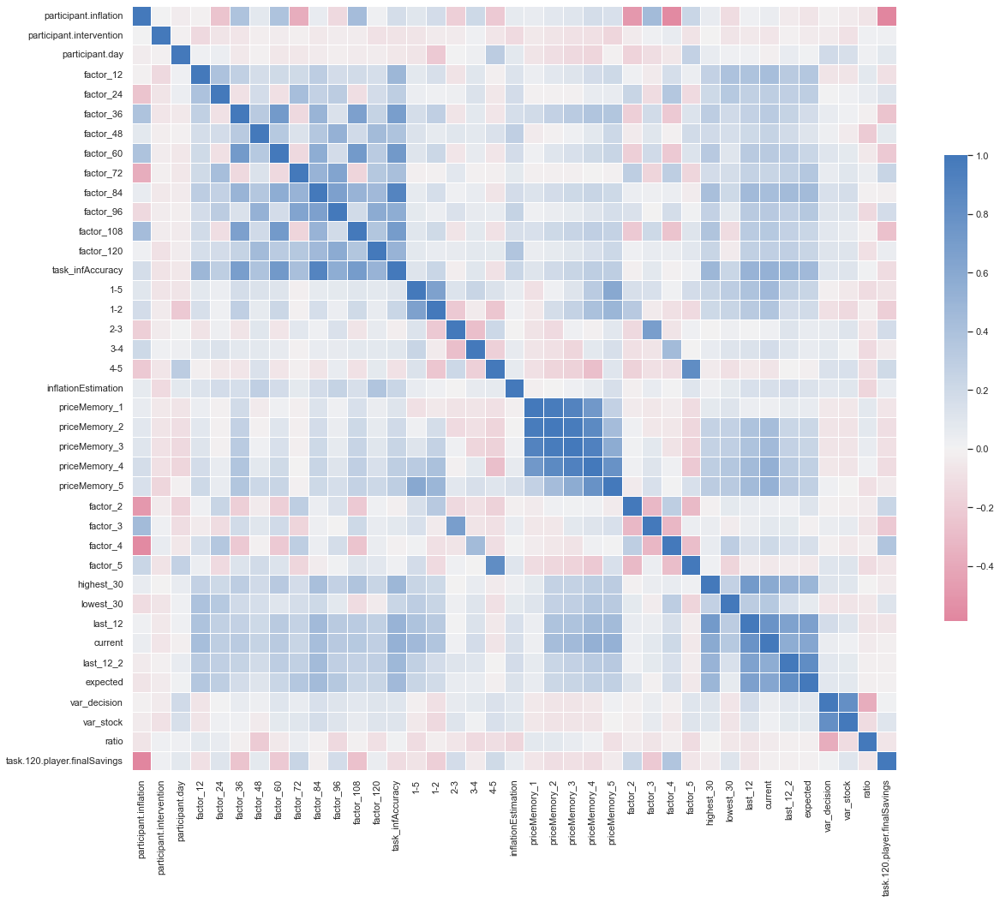

In [83]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="dark")

# # Drop last row with Totals
# d = d.drop(d.tail(1).index)

# Compute the correlation matrix
# corr = trials.corr(method='pearson')
corr = combo.corr()
s = corr.unstack()
corr2 = combined.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20,20))

# Generate a custom diverging colormap
# diverging_palette(h_neg, h_pos, s=75, l=50, sep=1, n=6, center='light', as_cmap=False)
# vmax = 1
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Draw the heatmap without mask
sns.heatmap(corr, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Behavioral tests

## `wisconsin`

In [84]:
wisc = final_df_dict['wisconsin'].copy()
wisc['wisc.n_cat'] = (wisc['wisconsin.1.player.num_correct'] - wisc['wisconsin.1.player.num_correct_in_block']) //\
    6

for t in range(2,31):
    wisc[f'wisc.{t}.n_PE'] = 0
    wisc[f'wisc.{t}.n_SE'] = 0

for i in range(len(wisc['wisconsin.1.player.response_time'].index)):
    for t in range(2,31):
        oldRule = wisc[f'trial_{t - 1}_rule'].iloc[i]
        oldCorrect = wisc[f'trial_{t - 1}_correct'].iloc[i]
        rule = wisc[f'trial_{t}_rule'].iloc[i]
        correct = wisc[f'trial_{t}_correct'].iloc[i]
        if rule == oldRule and oldCorrect == True and correct == False:
            if t > 2 and oldRule != wisc[f'trial_{t - 2}_rule'].iloc[i]:
                wisc[f'wisc.{t}.n_PE'].iloc[i] += 1
            else:
                ##  TODO: NEED TO FIND WAY TO CONTINUE COUNTING n_SE AFTER 1ST INSTANCE
                ## I.E. oldCorrect = False AFTER 1ST
                ## May need to add columns for each trial to track status
                wisc[f'wisc.{t}.n_SE'].iloc[i] += 1
        elif rule != oldRule and oldCorrect == True and correct == False:
            wisc[f'wisc.{t}.n_PE'].iloc[i] += 1
        elif t > 2 and wisc[f'wisc.{t - 1}.n_PE'].iloc[i] == 1 and correct == False:
            wisc[f'wisc.{t}.n_PE'].iloc[i] += 1
        elif t > 2 and wisc[f'wisc.{t - 1}.n_SE'].iloc[i] == 1 and correct == False:
            wisc[f'wisc.{t}.n_SE'].iloc[i] += 1
        # if t > 2:
            #  print(t, oldRule, rule, 'oldCorrect', oldCorrect, correct, 
            #        ((rule == oldRule and oldCorrect == True and correct == False) and (t > 2 and oldRule != wisc[f'trial_{t - 2}_rule'].iloc[i])), 
            #        (rule != oldRule and oldCorrect == True and correct == False), wisc[f'wisc.{t}.n_PE'].iloc[i], wisc[f'wisc.{t}.n_SE'].iloc[i])
            #  print(t, wisc[f'wisc.{t}.n_PE'].iloc[i], wisc[f'wisc.{t}.n_SE'].iloc[i])

wisc['wisc.n_PE'] = wisc[[col for col in wisc.columns if col.endswith('n_PE')]].sum(axis=1)
wisc['wisc.n_SE'] = wisc[[col for col in wisc.columns if col.endswith('n_SE')]].sum(axis=1)


participants = wisc[['participant.code','participant.label',
                     'wisconsin.1.player.num_correct','wisc.n_cat','wisc.n_PE',
                     'wisc.n_SE']]
participants.rename(columns={'wisconsin.1.player.num_correct':'wisc.n_corr'}, 
                    inplace=True)
# participants[['wisc.n_poss_PE','wisc.n_poss_SE']] = np.nan
# participants['sum'] = participants[['wisc.n_corr','wisc.n_PE','wisc.n_SE']].sum(axis=1)
participants.sort_values([f'wisc.n_corr','wisc.n_PE',], ascending=False)

## Calculate z scores for linear combinations (Knopp et al., 2021)
cols = participants.columns.to_list()

for c in range(2, len(cols)):
    participants[f'z({cols[c]})'] = (participants[cols[c]] - participants[cols[c]].mean()) / \
    participants[cols[c]].std()
    
participants['n_PE+n_SE'] = -1 * (participants['z(wisc.n_PE)'] + participants['z(wisc.n_SE)'])
participants['n_corr+n_cat'] = participants['z(wisc.n_corr)'] + participants['z(wisc.n_cat)']
participants['n_corr+n_PE'] = -1 * (participants['z(wisc.n_PE)']) + participants['z(wisc.n_corr)']
participants['n_corr+n_SE'] = participants['z(wisc.n_corr)'] + -1 * (participants['z(wisc.n_SE)'])
participants['n_corr+n_PE+n_SE'] = participants['z(wisc.n_corr)'] + \
    -1 * (participants['z(wisc.n_PE)'] + participants['z(wisc.n_SE)'])
participants['n_cat+n_PE'] = -1 * (participants['z(wisc.n_PE)']) + participants['z(wisc.n_cat)']
participants['n_cat+n_SE'] = participants['z(wisc.n_cat)'] + -1 * (participants['z(wisc.n_SE)'])
participants['n_cat+n_PE+n_SE'] = participants['z(wisc.n_cat)'] + \
    -1 * (participants['z(wisc.n_PE)'] + participants['z(wisc.n_SE)'])
participants['n_cat+n_cat+n_PE+n_SE'] = participants['z(wisc.n_corr)'] + participants['z(wisc.n_cat)'] + \
    -1 * (participants['z(wisc.n_PE)'] + participants['z(wisc.n_SE)'])


participants = pd.concat([participants, wisc['participant.intervention']], axis=1)

## Add intervention column 
participants.sort_values([f'wisc.n_corr','wisc.n_PE',], ascending=False)

participants[cols[2:6]].describe().T

,count,mean,std,min,25%,50%,75%,max
wisc.n_corr,108.0,15.629630,7.044044,0.0,10.0,18.0,22.00,25.0
wisc.n_cat,108.0,2.240741,1.190856,0.0,1.0,3.0,3.00,4.0
wisc.n_PE,108.0,5.962963,4.166905,0.0,4.0,5.5,7.25,19.0
wisc.n_SE,108.0,4.935185,6.164828,0.0,0.0,2.0,9.00,23.0


## `riskPreferences`

In [85]:
risk = final_df_dict['riskPreferences'].copy()
cols = risk.columns.to_list()
print(len(cols))
del cols[3:12]
print(len(cols))
del cols[4:8]
print(len(cols))
del cols[0:1]
risk = risk[cols]
risk['risk.n_safe'] = risk[cols[5:]].sum(axis=1)
risk.describe().T

28
19
15


,count,mean,std,min,25%,50%,75%,max
risk.n_safe,108.0,5.231481,2.035234,0.0,4.0,5.0,7.0,9.0


## `lossAversion`

In [86]:
loss = final_df_dict['lossAversion'].copy()
cols = loss.columns.to_list()
del cols[3:12]
del cols[3:9]
loss = loss[cols]

loss['loss.n_toss'] = loss[cols[3:]].sum(axis=1)
loss['loss.n_switch'] = 0
loss['loss.biggest'] = 0

for i in range(len(loss.index)):
    for c in range(3,len(cols)):
        if c > 3 and loss[cols[c]].iloc[i] != loss[cols[c - 1]].iloc[i]:
            loss['loss.n_switch'].iloc[i] += 1
        if loss[cols[c]].iloc[i] == True:
            loss['loss.biggest'].iloc[i] = (c - 1) * 200

cols = loss.columns.to_list()
del cols[0:1]
loss = loss[cols]
# del cols[1:len(cols) - 1]
loss_cols = cols
loss.describe().T

,count,mean,std,min,25%,50%,75%,max
loss.n_toss,106.0,2.132075,1.366786,0.0,1.0,2.0,3.0,5.0
loss.n_switch,106.0,1.075472,0.671858,0.0,1.0,1.0,1.0,4.0
loss.biggest,106.0,667.924528,381.362762,0.0,400.0,600.0,1000.0,1400.0


## `BRET`

In [87]:
bret = final_df_dict['BRET'].copy()

cols = bret.columns.to_list()
print(cols)
del cols[2:13]
print(cols)
del cols[4:9]
del cols[0:3:2]
del cols[2:7]
del cols[3:]
print(cols)

bret = bret[cols]

cols = [c.replace("player.boxes_collected", "n_collect") for c in cols]
print(cols)
bret.columns = cols

bret['BRET.1.deviation32'] = 1 / (32 - bret['BRET.1.n_collect'])
bret['BRET.2.deviation32'] = 1 / (32 - bret['BRET.2.n_collect'])
bret['BRET.1.deviation16'] = 1 / (16 - bret['BRET.1.n_collect'])
bret['BRET.2.deviation16'] = 1 / (16 - bret['BRET.2.n_collect'])

bret.replace([np.inf, -np.inf], [2,-2], inplace=True)
cols = bret.columns.to_list()
print(cols)

bret.describe().T

['participant.code', 'participant.label', 'participant.time_started_utc', 'participant.day_1', 'participant.day_2', 'participant.day_3', 'participant.day_4', 'participant.day', 'participant.day_room_number', 'BRET.1.player.id_in_group', 'BRET.1.player.payoff', 'BRET.1.player.bomb', 'BRET.1.player.bomb_row', 'BRET.1.player.bomb_col', 'BRET.1.player.boxes_collected', 'BRET.1.player.pay_this_round', 'BRET.1.player.round_result', 'BRET.1.player.responseTime', 'BRET.1.group.id_in_subsession', 'BRET.1.subsession.round_number', 'BRET.2.player.id_in_group', 'BRET.2.player.payoff', 'BRET.2.player.bomb', 'BRET.2.player.bomb_row', 'BRET.2.player.bomb_col', 'BRET.2.player.boxes_collected', 'BRET.2.player.pay_this_round', 'BRET.2.player.round_result', 'BRET.2.player.responseTime', 'BRET.2.group.id_in_subsession', 'BRET.2.subsession.round_number', 'participant.intervention']
['participant.code', 'participant.label', 'BRET.1.player.bomb_col', 'BRET.1.player.boxes_collected', 'BRET.1.player.pay_this_r

,count,mean,std,min,25%,50%,75%,max
BRET.1.n_collect,110.0,23.209091,13.395943,2.0,13.000000,21.000000,32.000000,64.0
BRET.2.n_collect,110.0,23.863636,13.457699,4.0,13.250000,20.000000,32.000000,64.0
BRET.1.deviation32,110.0,0.238802,0.580835,-0.5,0.040417,0.058824,0.125000,2.0
BRET.2.deviation32,110.0,0.070778,0.433857,-1.0,0.037037,0.057190,0.089015,2.0
BRET.1.deviation16,110.0,0.138592,0.506386,-1.0,-0.100000,-0.038462,0.191667,2.0
BRET.2.deviation16,110.0,0.024618,0.386801,-1.0,-0.138393,-0.055556,0.111111,2.0


## Time preferences

In [88]:
tPref = final_df_dict['timePreferences'].copy()
cols = tPref.columns.to_list()
del cols[-3:]
del cols[38:42]
del cols[23:27]
del cols[2:12]
tPref = tPref[cols]
cols = [c.replace("timePreferences.", "") for c in cols]
cols = [c.replace("player.", "") for c in cols]
tPref.columns = cols

## Get count of present choices for each delay
tPref['3.n_present'] = np.nan
tPref['5.n_present'] = np.nan
tPref['6.n_present'] = np.nan

for i in range(len(tPref)):
    for n in range(1,4):
        delay = tPref[f'{n}.delay'].iloc[i]
        count = 0
        for m in range(1,11):
            if tPref[f'{n}.q{m}'].iloc[i] == 1:
                count += 1
        tPref[f'{delay}.n_present'].iloc[i] = count

## Get count of switches for each delay
tPref['3.n_switches'] = np.nan
tPref['5.n_switches'] = np.nan
tPref['6.n_switches'] = np.nan

for i in range(len(tPref)):
    for n in range(1,4):
        delay = tPref[f'{n}.delay'].iloc[i]
        count = 0
        for m in range(10,0,-1):
            if m < 10 and tPref[f'{n}.q{m}'].iloc[i] > tPref[f'{n}.q{m + 1}'].iloc[i]:
                count += 1
        tPref[f'{delay}.n_switches'].iloc[i] = count

cols = tPref.columns.to_list()
del cols[2:35]
print(cols)
tPref = tPref[cols]


['participant.code', 'participant.label', '3.n_present', '5.n_present', '6.n_present', '3.n_switches', '5.n_switches', '6.n_switches']


## Combine with task performances

(108, 20)
(108, 21)
(108, 24)
(108, 30)
Index(['participant.code', 'participant.label', 'wisc.n_corr', 'wisc.n_cat',
       'wisc.n_PE', 'wisc.n_SE', 'z(wisc.n_corr)', 'z(wisc.n_cat)',
       'z(wisc.n_PE)', 'z(wisc.n_SE)', 'n_PE+n_SE', 'n_corr+n_cat',
       'n_corr+n_PE', 'n_corr+n_SE', 'n_corr+n_PE+n_SE', 'n_cat+n_PE',
       'n_cat+n_SE', 'n_cat+n_PE+n_SE', 'n_cat+n_cat+n_PE+n_SE',
       'participant.intervention', 'risk.n_safe', 'loss.n_toss',
       'loss.n_switch', 'loss.biggest', 'BRET.1.n_collect', 'BRET.2.n_collect',
       'BRET.1.deviation32', 'BRET.2.deviation32', 'BRET.1.deviation16',
       'BRET.2.deviation16', '3.n_present', '5.n_present', '6.n_present',
       '3.n_switches', '5.n_switches', '6.n_switches'],
      dtype='object')
(108, 40)
['participant.code', 'participant.label', 'wisc.n_corr', 'wisc.n_cat', 'wisc.n_PE', 'wisc.n_SE', 'z(wisc.n_corr)', 'z(wisc.n_cat)', 'z(wisc.n_PE)', 'z(wisc.n_SE)', 'n_PE+n_SE', 'n_corr+n_cat', 'n_corr+n_PE', 'n_corr+n_SE', 'n_corr+

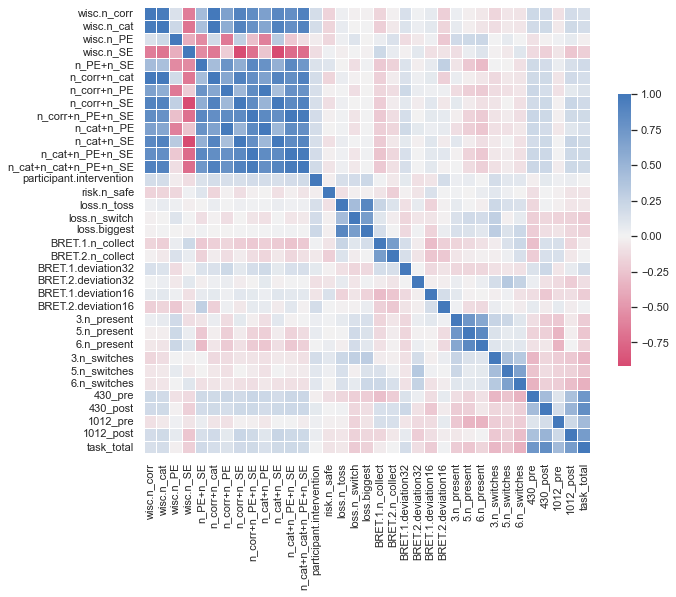

In [89]:
print(participants.shape)
risk_cols = risk.columns.to_list()
participants = participants.merge(risk[['participant.label','risk.n_safe']], how='left')
print(participants.shape)
participants = participants.merge(loss[['participant.label','loss.n_toss','loss.n_switch','loss.biggest']], how='left')
print(participants.shape)
participants = participants.merge(bret[['participant.label', 'BRET.1.n_collect', 'BRET.2.n_collect', 'BRET.1.deviation32', 'BRET.2.deviation32', 'BRET.1.deviation16', 'BRET.2.deviation16']], how='left')
print(participants.shape)
participants = participants.merge(tPref[['participant.label', '3.n_present', '5.n_present', '6.n_present', '3.n_switches', '5.n_switches', '6.n_switches']], how='left')

print(participants.columns)

## Add task results
participants['430_pre'] = np.nan
participants['430_post'] = np.nan
participants['1012_pre'] = np.nan
participants['1012_post'] = np.nan
print(participants.shape)
for i in range(len(decision_combined.index)):
    phase = 'pre' if decision_combined['participant.day'].iloc[i] < 3 else 'post'
    inf = '1012' if decision_combined['participant.inflation'].iloc[i] == '1012' else '430'
    participants[f'{inf}_{phase}'].loc[
        participants['participant.label'] == decision_combined['participant.label'].iloc[i]
    ] = decision_combined['task.120.player.finalSavings'].iloc[i]

cols = participants.columns.to_list()

## Calculate total task savings
participants['task_total'] = participants[cols[-4:]].sum(axis=1)

## Booleanize interventions
for i in range(len(participants.index)):
    if participants['participant.intervention'].iloc[i] == 'intervention':
        participants['participant.intervention'].iloc[i] = 1
    else:
        participants['participant.intervention'].iloc[i] = 0

participants[['participant.intervention']] = participants[
    ['participant.intervention']].astype(float)

## Make correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="dark")

# # Drop last row with Totals
# d = d.drop(d.tail(1).index)

# Compute the correlation matrix
cols = participants.columns.to_list()
print(cols)
del cols[6:10]
print(cols)
newcols = cols[2:6] + cols[-6:]
print(newcols)
corrParticipants = participants[cols].corr()
s = corr.unstack()
corr2 = combined.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10,10))

# Generate a custom diverging colormap
# diverging_palette(h_neg, h_pos, s=75, l=50, sep=1, n=6, center='light', as_cmap=False)
# vmax = 1
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corrParticipants, mask=mask, cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Draw the heatmap without mask
sns.heatmap(corrParticipants, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

## Add to list/dict of results for csv
result = 'corrParticipants'
print(result)
metrics_list.append(result)
print('metrics_list: ', metrics_list)
metrics_dict[result] = corrParticipants

In [90]:
results_participants = participants[
    ['participant.code', 'participant.label', 'participant.intervention', 
     'wisc.n_corr', 'wisc.n_cat', 'wisc.n_PE', 'wisc.n_SE',  'risk.n_safe', 
     'loss.n_toss', 'loss.n_switch', 'loss.biggest', 'BRET.1.n_collect', 
     '3.n_present', '5.n_present', '6.n_present', 
     'BRET.2.n_collect', '430_pre', '430_post', '1012_pre', '1012_post', 
     'task_total']].describe().T

## Add to list/dict of results for csv
result = 'participants'
print(result)
metrics_list.append(result)
print('metrics_list: ', metrics_list)
metrics_dict[result] = participants
results_dict[f'results_{result}'] = results_participants

results_participants

participants
metrics_list:  ['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined', 'metacog', 'stats_priceMemory', 'infEst', 'perceptions', 'perceptions', 'infExp_task', 'corrParticipants', 'participants']


,count,mean,std,min,25%,50%,75%,max
participant.intervention,108.0,0.509259,0.502245,0.00,0.000,1.000,1.0000,1.00
wisc.n_corr,108.0,15.629630,7.044044,0.00,10.000,18.000,22.0000,25.00
wisc.n_cat,108.0,2.240741,1.190856,0.00,1.000,3.000,3.0000,4.00
wisc.n_PE,108.0,5.962963,4.166905,0.00,4.000,5.500,7.2500,19.00
wisc.n_SE,108.0,4.935185,6.164828,0.00,0.000,2.000,9.0000,23.00
risk.n_safe,106.0,5.235849,2.054273,0.00,4.000,5.000,7.0000,9.00
loss.n_toss,106.0,2.132075,1.366786,0.00,1.000,2.000,3.0000,5.00
loss.n_switch,106.0,1.075472,0.671858,0.00,1.000,1.000,1.0000,4.00
loss.biggest,106.0,667.924528,381.362762,0.00,400.000,600.000,1000.0000,1400.00
BRET.1.n_collect,106.0,23.160377,13.439910,2.00,13.000,20.500,32.0000,64.00


# Between-subject results

## Difference between intervention and control

## Difference between "financially literate" and non-literate

## Difference between high numeracy and low numeracy

## Difference between inflation-aware and inflation-unaware 

## Difference between precise inflation perceptions and imprecise inflation perceptions

## Difference between strong `wisconsin` performance and weak

# Opportunity cost

In [92]:
oppCost_session = pd.read_csv('results/perform_summary - Copie.csv')
all_oppCost = pd.read_excel('results/participant_perform - Copie.xlsx')
all_oppCost.pop('Unnamed: 0')
# for inf in ['1012','430',]:
#     for p in ['pre','post']:
#         all_oppCost[f're-pre_{inf}_{p}'] = all_oppCost[f'retard_{inf}_{p}'] - \
#         all_oppCost[f'precoce_{inf}_{p}']
oppCost_session.reset_index(inplace=True, drop=True)
# all_oppCost
# all_oppCost.groupby('participant.intervention').mean().T

In [93]:

opp = participants.merge(all_oppCost, left_on='participant.label',right_on='participant.label')
# # pd.concat([participants,oppCost_session], axis=1)
# opp.pop(['participant.code','z(wisc.n_corr)','z(wisc.n_cat)','z(wisc.n_PE)','z(wisc.n_SE)','n_PE+n_SE','n_corr+n_cat','n_corr+n_PE','n_corr+n_SE','n_corr+n_PE+n_SE','n_cat+n_PE','n_cat+n_SE','n_cat+n_PE+n_SE','n_cat+n_cat+n_PE+n_SE'])

cols = opp.columns.to_list()
print(cols)
del cols[6:19]
del cols[0]
cols = [x for x in cols if 'deviation' not in x]
opp = opp[cols]
opp.pop('participant.intervention_y')
opp.pop('loss.biggest')
opp.insert(1,'participant.intervention_x', opp.pop('participant.intervention_x'))
opp.drop(list(opp.filter(regex='finalSavings')), axis=1, inplace=True)
# opp['diff_re/(ex+pr)_430'] = opp['re/(ex+pr)_430_post'] - opp['re/(ex+pr)_430_pre']
# opp['diff_re/(ex+pr)_1012'] = opp['re/(ex+pr)_1012_post'] - opp['re/(ex+pr)_1012_pre']
opp = opp.rename({'participant.intervention_x': 'participant.intervention'}, axis=1)

['participant.code', 'participant.label', 'wisc.n_corr', 'wisc.n_cat', 'wisc.n_PE', 'wisc.n_SE', 'z(wisc.n_corr)', 'z(wisc.n_cat)', 'z(wisc.n_PE)', 'z(wisc.n_SE)', 'n_PE+n_SE', 'n_corr+n_cat', 'n_corr+n_PE', 'n_corr+n_SE', 'n_corr+n_PE+n_SE', 'n_cat+n_PE', 'n_cat+n_SE', 'n_cat+n_PE+n_SE', 'n_cat+n_cat+n_PE+n_SE', 'participant.intervention_x', 'risk.n_safe', 'loss.n_toss', 'loss.n_switch', 'loss.biggest', 'BRET.1.n_collect', 'BRET.2.n_collect', 'BRET.1.deviation32', 'BRET.2.deviation32', 'BRET.1.deviation16', 'BRET.2.deviation16', '3.n_present', '5.n_present', '6.n_present', '3.n_switches', '5.n_switches', '6.n_switches', '430_pre', '430_post', '1012_pre', '1012_post', 'task_total', 'participant.intervention_y', 'task.1.player.finalSavings_1012_pre', 'task.1.player.finalSavings_1012_post', 'task.1.player.finalSavings_430_pre', 'task.1.player.finalSavings_430_post', 'task.120.player.finalSavings_1012_pre', 'task.120.player.finalSavings_1012_post', 'task.120.player.finalSavings_430_pre', 

In [94]:
# opp.groupby(['participant.inflation','participant.intervention','participant.day']).mean().T
opp.mean().T

C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/1537883512.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  opp.mean().T


participant.intervention       0.509259
wisc.n_corr                   15.629630
wisc.n_cat                     2.240741
wisc.n_PE                      5.962963
wisc.n_SE                      4.935185
risk.n_safe                    5.235849
loss.n_toss                    2.132075
loss.n_switch                  1.075472
BRET.1.n_collect              23.160377
BRET.2.n_collect              24.264151
3.n_present                    2.660377
5.n_present                    3.764151
6.n_present                    4.547170
3.n_switches                   0.056604
5.n_switches                   0.075472
6.n_switches                   0.066038
430_pre                     1969.445701
430_post                    2144.953524
1012_pre                     849.852407
1012_post                    994.197524
task_total                  5853.014907
exces_1012_pre               143.564980
exces_1012_post              116.714654
exces_430_pre                342.545917
exces_430_post               221.617136


# Combine opp cost and behavioral with knowledge

In [95]:
opp.columns

Index(['participant.label', 'participant.intervention', 'wisc.n_corr',
       'wisc.n_cat', 'wisc.n_PE', 'wisc.n_SE', 'risk.n_safe', 'loss.n_toss',
       'loss.n_switch', 'BRET.1.n_collect', 'BRET.2.n_collect', '3.n_present',
       '5.n_present', '6.n_present', '3.n_switches', '5.n_switches',
       '6.n_switches', '430_pre', '430_post', '1012_pre', '1012_post',
       'task_total', 'exces_1012_pre', 'exces_1012_post', 'exces_430_pre',
       'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post',
       'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre',
       'retard_1012_post', 'retard_430_pre', 'retard_430_post',
       'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre',
       'opp_cost_430_post', 're/(ex+pr)_430_pre', 're/(ex+pr)_430_post',
       're/(ex+pr)_1012_pre', 're/(ex+pr)_1012_post'],
      dtype='object')

NameError: name 'summary' is not defined

In [113]:
summary = opp.copy()

summary['excess_pre'] = summary['exces_1012_pre'] + summary['exces_430_pre']
summary['excess_post'] = summary['exces_1012_post'] + summary['exces_430_post']
summary['excess_total'] = summary['excess_pre'] + summary['excess_post']

summary['early_pre'] = summary['precoce_1012_pre'] + summary['precoce_430_pre']
summary['early_post'] = summary['precoce_1012_post'] + summary['precoce_430_post']
summary['early_total'] = summary['early_pre'] + summary['early_post']

summary['late_pre'] = summary['retard_1012_pre'] + summary['retard_430_pre']
summary['late_post'] = summary['retard_1012_post'] + summary['retard_430_post']
summary['late_total'] = summary['late_pre'] + summary['late_post']

cols = [c for c in summary.columns.to_list() if ('precoce_pre' not in c) and ('precoce_post' not in c) and ('precoce_total' not in c)]
# print(cols)
summary = summary[cols]

print(summary.shape)
summary.drop_duplicates(inplace=True)
print(summary.shape)
summary

# summary['excess_pre'] = summary[['exces_1012_pre', 'exces_430_pre',]].sum()
# summary['excess_post'] = summary[['exces_1012_post', 'exces_430_post',]].sum()
# summary['excess_total'] = summary[['excess_pre', 'excess_post']].sum()

# summary['precoce_pre'] = summary[['precoce_1012_pre', 'precoce_430_pre',]].sum()
# summary['precoce_post'] = summary[['precoce_1012_post', 'precoce_430_post',]].sum()
# summary['precoce_total'] = summary[['precoce_pre', 'precoce_post']].sum()

# summary['late_pre'] = summary[['retard_1012_pre', 'retard_430_pre',]].sum()
# summary['late_post'] = summary[['retard_1012_post', 'retard_430_post',]].sum()
# summary['late_total'] = summary[['late_pre', 'late_post']].sum()



summary = summary.merge(infBehave, left_on='participant.label',right_on='participant.label')

tests = {'finLit':'literate',
         'demo':'financialStatusIncome',
         'numeracy':'numerate',
         'numeracy2':'numerate2',
         'inflation':'infK_mean'}

summary['finLit_2'] = np.nan
summary['finLit_4'] = np.nan
summary['numeracy_2'] = np.nan
summary['numeracy_4'] = np.nan
summary['numeracy2_2'] = np.nan
summary['numeracy2_4'] = np.nan
summary['inflation_2'] = np.nan
summary['inflation_4'] = np.nan
summary['demo_1'] = np.nan
summary['avg_acrcy'] = 0

for k, v in tests.items():
    for i in range(len(metrics_dict[k])):
        day = int(metrics_dict[k]['participant.day'].iloc[i])
        summary[f'{k}_{day}'].loc[
            summary['participant.label'] == metrics_dict[k]['participant.label'].iloc[i]
        ] = metrics_dict[k][v].iloc[i]

for i in range(len(summary)):
    for n in range(1,3):
        # summary[f'numeracy_{n * 2}'].iloc[i] = 1 if summary[f'numeracy_{n * 2}'].iloc[i] == 20 else 0
        ## Inflation to within 20% for either January or February 2023 (5.9% or 6.3% respectively)
        if (5.9 * .8) <= summary[f'inflation_{n * 2}'].iloc[i] <= (6.3 * 1.2):
            summary[f'inflation_{n * 2}'].iloc[i] = 1
        else:
            summary[f'inflation_{n * 2}'].iloc[i] = 0

for i in range(len(summary)):
    summary['avg_acrcy'].loc[
        summary['participant.label'] == participant_perceptions[
        'participant.label'].iloc[i]
    ] = participant_perceptions['avg_acrcy'].iloc[i]

results_summary = summary.describe().T

## Add to list/dict of results for csv
result = 'summary'
print(result)
metrics_list.append(result)
print('metrics_list: ', metrics_list)
metrics_dict[result] = summary
results_dict[f'results_{result}'] = results_summary

# # summary.to_csv('summaryWithAvgAcrcy.csv')
# mean = summary.mean().T
# mean.to_csv('mean.csv')

(108, 51)
(108, 51)
summary
metrics_list:  ['combined', 'demo', 'finLit', 'numeracy', 'numeracy2', 'inflation', 'trials', 'sum_A_vals', 'decision_430', 'decision_1012', 'mean_430', 'mean_1012', 'decision_combined', 'metacog', 'stats_priceMemory', 'infEst', 'perceptions', 'perceptions', 'infExp_task', 'corrParticipants', 'participants', 'summary', 'summary']


# Convert performance to %

In [114]:
summary[[c for c in summary.columns.to_list() if 'numer' in c]]

,numeracy_2,numeracy_4,numeracy2_2,numeracy2_4
0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0
5,1.0,1.0,1.0,1.0
6,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0
8,0.0,0.0,1.0,0.0
9,0.0,0.0,1.0,1.0


In [115]:
summary_percent = summary.copy()

cols = ['430_pre',
       '430_post', '1012_pre', '1012_post', 'task_total',
       'exces_1012_pre', 'exces_1012_post', 'exces_430_pre',
       'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post',
       'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre',
       'retard_1012_post', 'retard_430_pre', 'retard_430_post',
       'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre',
       'opp_cost_430_post']

for c in cols:
    if '430' in c:
        summary_percent[c] = summary_percent[c] / 4119.29
    elif '1012' in c:
        summary_percent[c] = summary_percent[c] / 2420.94
    else:
        print('hi')
        summary_percent[c] = summary_percent[c] / 13080.46


# summary_percent

hi


In [116]:
summary['finLit'] = 0
summary['numerate'] = 0
summary['numerate2'] = 0
summary['infAware'] = 0



for i in range(len(summary.index)):
    # if summary['participant.intervention'].iloc[i] == 1:
    #     summary['participant.intervention'].iloc[i] = 'intervention'
    # elif summary['participant.intervention'].iloc[i] == 0:
    #     summary['participant.intervention'].iloc[i] = 'control'
    if summary['finLit_2'].iloc[i] == 1 or summary['finLit_4'].iloc[i] == 1:
        summary['finLit'].iloc[i] = 1
    elif summary['finLit_2'].iloc[i] == 0 and summary['finLit_4'].iloc[i] == 0:
        summary['finLit'].iloc[i] = 0
    if summary['numeracy_2'].iloc[i] == 1 or summary['numeracy_4'].iloc[i] == 1:
        summary['numerate'].iloc[i] = 1
    elif summary['numeracy_2'].iloc[i] == 0 and summary['numeracy_4'].iloc[i] == 0:
        summary['numerate'].iloc[i] = 0
    if summary['numeracy2_2'].iloc[i] == 1 or summary['numeracy2_4'].iloc[i] == 1:
        summary['numerate2'].iloc[i] = 1
    elif summary['numeracy2_2'].iloc[i] == 0 and summary['numeracy2_4'].iloc[i] == 0:
        summary['numerate2'].iloc[i] = 0
    if summary['inflation_2'].iloc[i] == 1 or summary['inflation_4'].iloc[i] == 1:
        summary['infAware'].iloc[i] = 1
    elif summary['inflation_2'].iloc[i] == 0 and summary['inflation_4'].iloc[i] == 0:
        summary['infAware'].iloc[i] = 0



results_infAware = summary.groupby(['infAware']).mean().T
results_numerate = summary.groupby(['numerate']).mean().T
results_finLit = summary.groupby(['finLit']).mean().T

# results_infAware.to_csv('results_infAware2.csv')
# results_numerate.to_csv('results_numerate2.csv')
# results_finLit.to_csv('results_finLit2.csv')

In [117]:
results_intervention = summary.groupby(['participant.intervention']).mean().T
# results_intervention.to_csv('results_intervention.csv')

In [118]:
# summary.groupby(['infAware']).describe().T
# summary.groupby(['numerate']).describe().T
# summary.groupby(['finLit']).describe().T

# Perception correlations

In [119]:
# inf_corr = summary[['participant.label','inflation_2','inflation_4','infAware']].copy()
# inf_corr['inf_accuracy_estimate'] = np.nan
# inf_corr['inf_accuracy_priceMemory'] = np.nan

# # for i in range(len(inf_corr)):
# #     inf_corr['inf_accuracy_estimate'].loc[
# #         inf_corr['participant.label'] == inflation['participant'].iloc[i]
# #     ] = 

# # inf_corr

# Correlation matrix with opp cost

In [120]:
# import numpy as np
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# sns.set_theme(style="dark")

# # # Drop last row with Totals
# # d = d.drop(d.tail(1).index)

# # Compute the correlation matrix
# # corr = trials.corr(method='pearson')
# corr = summary.corr()
# s = corr.unstack()

# # Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(corr, dtype=bool))

# # Set up the matplotlib figure
# f, ax = plt.subplots(figsize=(40,40))

# # Generate a custom diverging colormap
# # diverging_palette(h_neg, h_pos, s=75, l=50, sep=1, n=6, center='light', as_cmap=False)
# # vmax = 1
# cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

# # # Draw the heatmap without mask
# # sns.heatmap(corr, cmap=cmap, annot=True, center=0,
# #             square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [121]:
# summary.dtypes

In [122]:
# summary2 = summary[[#'430_pre', '430_post', '1012_pre', '1012_post', 
#                     'task_total',
#                     'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 
#                     'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 
#                     'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 
#                     'retard_1012_post', 'retard_430_pre', 'retard_430_post', 
#                     'finLit', 'numerate', 'infAware',
#                     'wisc.n_corr', 'risk.n_safe', 'loss.n_toss', 
#                     'BRET.1.n_collect', 'BRET.2.n_collect', '3.n_present', 
#                     '5.n_present', '6.n_present', 'demo_1']].copy()

In [123]:
# from scipy import stats

# def corr_sig(df=None):
#     p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
#     for col in df.columns:
#         for col2 in df.drop(col,axis=1).columns:
#             _ , p = stats.pearsonr(df[col],df[col2])
#             p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
#     return p_matrix

# def plot_cor_matrix(corr, mask=None, cmap=None):
#     f, ax = plt.subplots(figsize=(40,40))
#     sns.heatmap(corr, ax=ax,
#                 mask=mask,
#                 # cosmetics
#                 annot=True, vmin=-1, vmax=1, center=0,
#                 cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


# cols = summary2.columns.to_list()
# print(cols)
# del cols[0]
# print(cols)
# summary2 = summary2[cols]
# summary2.dtypes
# # summary2 = summary2.replace([np.inf, -np.inf], 1000)
# summary2 = summary2.dropna(axis=0)

# # Plotting with significance filter
# cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
# corr = summary2.corr()                            # get correlation
# p_values = corr_sig(summary2)                     # get p-Value
# mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
# plot_cor_matrix(corr,mask, cmap)  

In [124]:
# print(summary2.isnull().values.any())
# count = np.isinf(summary2).values.sum()
# count

In [125]:
# summary2.loc[summary2.isnull().any(axis=1)]

In [126]:
# cols

# Correlations: Inflation behavior

['430_pre', '430_post', '1012_pre', '1012_post', 'task_total', 'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 'retard_1012_post', 'retard_430_pre', 'retard_430_post', 'finLit', 'numerate', 'infAware', 'inf_9_cheaper', 'inf_9_lessInflated', 'inf_9_quantity', 'inf_9_stockMaintained', 'inf_9_leisure', 'inf_9_subscription', 'inf_9_insurance', 'inf_9_realEstate', 'inf_9_livret', 'inf_9_mutualFunds', 'inf_9_stocks', 'inf_9_indexedBonds', 'inf_9_checkingAccount', 'inf_9_move', 'inf_9_income', 'inf_9_job', 'inf_9_energy', 'inf_9_transportation', 'inf_10', 'inf_11', 'inf_12', 'demo_1']
['430_post', '1012_pre', '1012_post', 'task_total', 'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 'retard_1012_post', 'retard_430_pre', 'retard_430_post', 'finLit', 'n

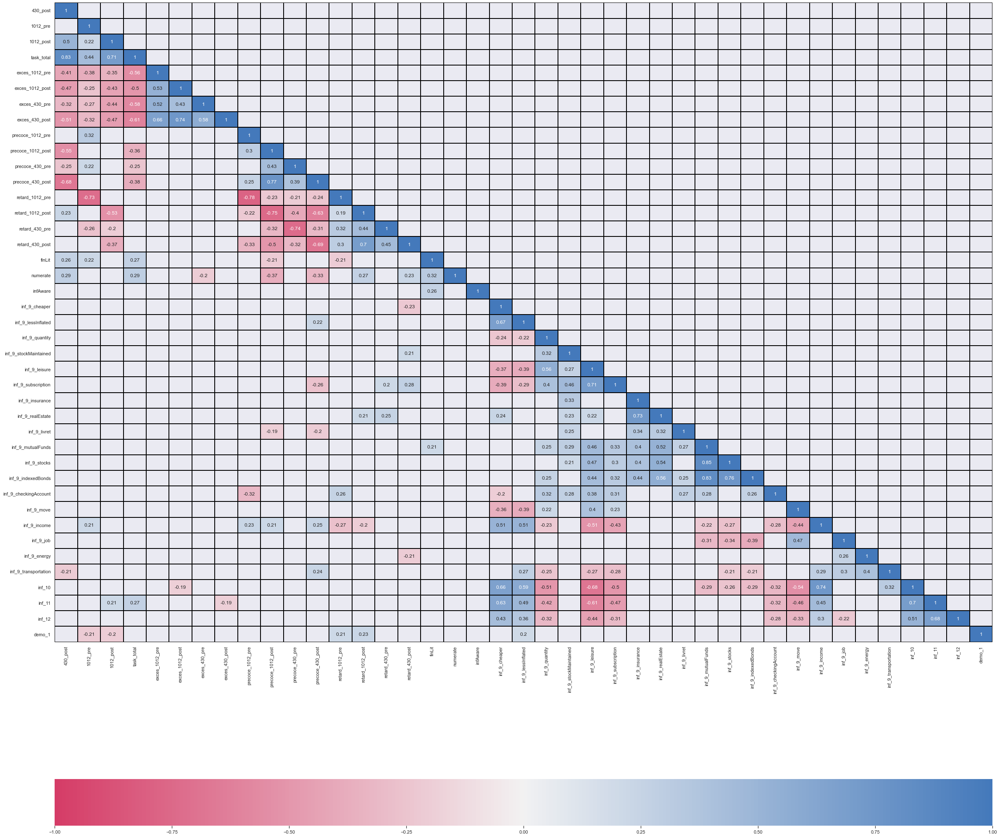

In [127]:
summaryInflation = summary[['430_pre', '430_post', '1012_pre', '1012_post', 
                    'task_total',
                    'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 
                    'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 
                    'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 
                    'retard_1012_post', 'retard_430_pre', 'retard_430_post', 
                    'finLit', 'numerate', 'infAware','inf_9_cheaper',
                    'inf_9_lessInflated',
                    'inf_9_quantity',
                    'inf_9_stockMaintained',
                    'inf_9_leisure',
                    'inf_9_subscription',
                    'inf_9_insurance',
                    'inf_9_realEstate',
                    'inf_9_livret',
                    'inf_9_mutualFunds',
                    'inf_9_stocks',
                    'inf_9_indexedBonds',
                    'inf_9_checkingAccount',
                    'inf_9_move',
                    'inf_9_income',
                    'inf_9_job',
                    'inf_9_energy',
                    'inf_9_transportation',
                    'inf_10',
                    'inf_11',
                    'inf_12','demo_1']].copy()

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


cols = summaryInflation.columns.to_list()
print(cols)
del cols[0]
print(cols)
summaryInflation = summaryInflation[cols]
summaryInflation.dtypes
# summaryInflation = summaryInflation.replace([np.inf, -np.inf], 1000)
summaryInflation = summaryInflation.dropna(axis=0)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = summaryInflation.corr()                            # get correlation
p_values = corr_sig(summaryInflation)                     # get p-Value
mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap)  

# Correlations % performance

In [128]:
summary_percent = summary.copy()

cols = ['430_pre',
       '430_post', '1012_pre', '1012_post', 'task_total',
       'exces_1012_pre', 'exces_1012_post', 'exces_430_pre',
       'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post',
       'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre',
       'retard_1012_post', 'retard_430_pre', 'retard_430_post',
       'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre',
       'opp_cost_430_post',]

for c in cols:
    if '430' in c:
        summary_percent[c] = summary_percent[c] / 4119.29
    elif '1012' in c:
        summary_percent[c] = summary_percent[c] / 2420.94
    else:
        print('hi')
        summary_percent[c] = summary_percent[c] / 13080.46



hi


In [129]:
# import numpy as np
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# sns.set_theme(style="dark")

# sum_perc2 = summary_percent[['430_pre', '430_post', '1012_pre', '1012_post', 
#                     'task_total',
#                     'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 
#                     'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 
#                     'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 
#                     'retard_1012_post', 'retard_430_pre', 'retard_430_post','inf_9_cheaper',
#                     'inf_9_lessInflated',
#                     'inf_9_quantity',
#                     'inf_9_stockMaintained',
#                     'inf_9_leisure',
#                     'inf_9_subscription',
#                     'inf_9_insurance',
#                     'inf_9_realEstate',
#                     'inf_9_livret',
#                     'inf_9_mutualFunds',
#                     'inf_9_stocks',
#                     'inf_9_indexedBonds',
#                     'inf_9_checkingAccount',
#                     'inf_9_move',
#                     'inf_9_income',
#                     'inf_9_job',
#                     'inf_9_energy',
#                     'inf_9_transportation',
#                     'inf_10',
#                     'inf_11',
#                     'inf_12','demo_1']].copy()

# # # Drop last row with Totals
# # d = d.drop(d.tail(1).index)

# # Compute the correlation matrix
# # corr = trials.corr(method='pearson')
# corr = sum_perc2.corr()
# s = corr.unstack()

# # Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(corr, dtype=bool))

# # Set up the matplotlib figure
# f, ax = plt.subplots(figsize=(50,50))

# # Generate a custom diverging colormap
# # diverging_palette(h_neg, h_pos, s=75, l=50, sep=1, n=6, center='light', as_cmap=False)
# # vmax = 1
# cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

# # # Draw the heatmap without mask
# # sns.heatmap(corr, cmap=cmap, annot=True, center=0,
# #             square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Opportunity cost efficiency of late purchase 

In [134]:
## Opp cost when unit purchased in last possible month (i.e. unit = month)
latest_430 = [75.58929192, 74.20909047, 72.84074551, 71.50317824, 70.18606586, 68.88296443, 67.62068313, 66.40187744, 65.19165053, 64.01801967, 62.84899271, 61.70361157, 60.60375168, 59.49805056, 58.41437535, 57.35170871, 56.31810379, 55.3037467, 54.28732773, 53.28947162, 52.32230764, 51.37525124, 50.43403058, 49.51432034, 48.60344813, 47.73273316, 46.86429444, 46.02042087, 45.17488545, 44.34355988, 46.20403035, 48.1625909, 49.00646576, 48.2455151, 49.52237999, 50.13544188, 50.19004774, 50.71363834, 52.89356221, 53.88200651, 55.12131385, 57.0910243, 58.46336925, 58.95281339, 59.72725291, 61.88915691, 62.19111744, 63.4605706, 65.28180395, 65.84869027, 68.00952334, 70.07680657, 72.41271823, 75.11153134, 77.55382282, 80.30193402, 81.72290097, 84.16282107, 84.9327055, 87.15611303, 85.57382687, 84.01131561, 82.46222696, 80.94798139, 79.45689259, 77.98166544, 76.55265031, 75.17285346, 73.80276855, 72.47411364, 71.15067075, 69.85399704, 68.60885745, 67.35710507, 66.13028799, 64.92725448, 63.75712143, 62.60877865, 61.45810163, 60.32843942, 59.23352345, 58.16137105, 57.09582525, 56.05463114, 55.02344248, 54.0377154, 53.05456523, 52.09922502, 51.14200343, 50.20086867, 52.30708733, 54.52435273, 55.47969442, 54.61823033, 56.06375539, 56.75779618, 56.81961489, 57.41236618, 59.88023463, 60.99924182, 62.40224837, 64.63213645, 66.18575346, 66.73984791, 67.6165826, 70.06405094, 70.40589721, 71.84303152, 73.90483027, 74.54659619, 76.99285214, 79.33320132, 81.97766186, 85.03295924, 87.79785124, 90.90895847, 92.51761991, 95.2798273, 96.15140521, 98.66850103]

latest_1012 = [75.58929192, 74.21070993, 72.83882911, 71.5236431, 70.23738239, 68.95034055, 67.70595608, 66.45403358, 65.22416308, 64.0495856, 62.88126456, 61.74679625, 62.90501336, 66.33149713, 69.59621405, 69.57371836, 72.59281325, 73.16803366, 74.76657874, 76.15550553, 75.95565658, 78.23168363, 79.14582203, 82.25087733, 80.7692833, 79.29622969, 77.83033648, 76.42502325, 75.05061753, 73.67537714, 72.34571735, 71.00800297, 69.69385176, 68.43878271, 67.19039884, 65.97818756, 67.2157751, 70.87706933, 74.36551113, 74.34147386, 77.56746161, 78.18210079, 79.89019115, 81.37429846, 81.16075424, 83.59275312, 84.5695357, 87.88737458, 86.30424971, 84.73025052, 83.16390241, 81.66228572, 80.19369457, 78.72421156, 77.3034327, 75.87404728, 74.46983977, 73.1287632, 71.79482995, 70.49954811, 71.82194519, 75.734141, 79.46163913, 79.43595463, 82.88301322, 83.53977246, 85.36491503, 86.95072541, 86.72254742, 89.32120659, 90.36492623, 93.91013033, 92.21851691, 90.53665453, 88.86296754, 87.2584479, 85.68921698, 84.11903307, 82.60089092, 81.07355241, 79.57311721, 78.1401392, 76.71479402, 75.33074897, 76.74376742, 80.92405862, 84.90699515, 84.87955054, 88.56282955, 89.26459526, 91.2148114, 92.90929437, 92.66547977, 95.44222014, 96.55746392, 100.3456142, 98.53807767, 96.74096044, 94.95257884, 93.2381045, 91.56133714, 89.8835515, 88.26137393, 86.62936981, 85.02611262, 83.49493533, 81.97191394, 80.49302289, 82.00287283, 86.46963149, 90.72551114, 90.6961858, 94.63187296, 95.38172935, 97.46559012, 99.27619281, 99.01567005, 101.9826952, 103.1743645, 107.2221095]

## Optimal price
optPrice_430 = 8.670236665
optPrice_1012 = 8.415378425

## Interest rate
int_rate = 0.0189775

## Prices of Food per month
price_430 = [8.07, 8.073000156, 8.07452212, 8.076670902, 8.078347577, 8.078822364, 8.081284165, 8.086224185, 8.089505789, 8.094627041, 8.097622448, 8.100920707, 8.107517622, 8.110651149, 8.11404323, 8.117616616, 8.122594879, 8.127667312, 8.129698178, 8.131711585, 8.135645885, 8.139986793, 8.142504617, 8.145725158, 8.147617006, 8.153506506, 8.157081413, 8.162212449, 8.164300155, 8.166144349, 8.670236665, 9.209276829, 9.548467277, 9.578595263, 10.0186909, 10.33520062, 10.54280727, 10.85495487, 11.53640951, 11.97501875, 12.48293179, 13.17435816, 13.74706752, 14.12522439, 14.58236467, 15.39694561, 15.7656893, 16.39280114, 17.18327495, 17.66141633, 18.58714609, 19.51559867, 20.54882628, 21.71917782, 22.85096627, 24.10970846, 25.00197536, 26.23707561, 26.97954963, 28.21124061, 28.22473546, 28.23522847, 28.24055153, 28.24806687, 28.25393102, 28.25559158, 28.26420171, 28.28147937, 28.29295674, 28.31086826, 28.32134467, 28.33288029, 28.35595293, 28.36691241, 28.37877617, 28.39127405, 28.40868547, 28.42642625, 28.43352918, 28.44057105, 28.45433122, 28.4695135, 28.47831956, 28.48958336, 28.49620008, 28.51679854, 28.52930174, 28.54724748, 28.55454921, 28.56099926, 30.32405654, 32.20934353, 33.39565836, 33.50103066, 35.04026028, 36.1472495, 36.87335146, 37.96508423, 40.34846427, 41.88249522, 43.65891542, 46.07717149, 48.08021612, 49.40281558, 51.00165865, 53.85064642, 55.14032342, 57.33364012, 60.09831348, 61.77060765, 65.00833722, 68.25558982, 71.86929191, 75.96258345, 79.92100101, 84.32343783, 87.44413142, 91.76388085, 94.36067549, 98.66850103]
price_1012 = [8.07, 8.073176332, 8.074309684, 8.078982519, 8.08425406, 8.086724459, 8.091475056, 8.092575606, 8.093540208, 8.09861833, 8.101780435, 8.106590321, 8.415378425, 9.042172448, 9.667255467, 9.847531746, 10.46984848, 10.7530768, 11.19653047, 11.62095603, 11.81041802, 12.39516803, 12.77798371, 13.53129834, 13.53972221, 13.54505141, 13.54695293, 13.55479294, 13.56363745, 13.56778225, 13.57575273, 13.57759922, 13.57921761, 13.58773761, 13.59304294, 13.60111289, 14.11919284, 15.17081823, 16.21957293, 16.52203771, 17.56615117, 18.0413473, 18.78536707, 19.49746177, 19.81533819, 20.79642278, 21.43870507, 22.7026048, 22.71673824, 22.72567949, 22.72886983, 22.74202368, 22.75686286, 22.76381694, 22.77718969, 22.78028769, 22.78300301, 22.79729773, 22.80619893, 22.81973858, 23.68896516, 25.45336612, 27.21295067, 27.72042143, 29.47221899, 30.26949577, 31.51780072, 32.71254228, 33.24587046, 34.89191914, 35.9695305, 38.09008208, 38.11379495, 38.12879645, 38.13414916, 38.15621848, 38.18111544, 38.19278288, 38.21521947, 38.22041726, 38.22497298, 38.24895643, 38.26389074, 38.28660735, 39.74498237, 42.70526724, 45.65747121, 46.50889786, 49.44803693, 50.78569568, 52.88008259, 54.88460165, 55.77941148, 58.54112672, 60.34912653, 63.90695544, 63.94674053, 63.97190981, 63.9808905, 64.01791808, 64.05968981, 64.07926527, 64.11690904, 64.1256298, 64.13327332, 64.17351239, 64.19856894, 64.23668251, 66.68352177, 71.6502423, 76.60340484, 78.03191542, 82.96315787, 85.20746119, 88.72139143, 92.08454275, 93.58584097, 98.21940442, 101.2528388, 107.2221095]




In [135]:
particip_dict = {}
particip_list = []
particip_late_dict = {}
stock = final_df_dict['finalStock'].copy()

for i in range(len(stock)):
    particip_list.append(stock['participant.code'].iloc[i])

In [136]:
from time import sleep
from tqdm.notebook import tqdm

xls = pd.ExcelFile('results/performance_20230405-151029.xlsx')
print('length', len(particip_list))

for x in tqdm(particip_list):
    # sleep(.01)
    particip_dict[x] = pd.read_excel(xls, f'{x}')

length 442


  0%|          | 0/442 [00:00<?, ?it/s]

In [137]:
rows = [r for r in range(0,119)]

for x in tqdm(particip_list):
    # sleep(.001)
    # particip_dict[x] = pd.read_excel(xls, f'{x}')
    particip_late_dict[x] = particip_dict[x].copy()
    # particip_late_dict[x].drop(rows, inplace=True)

  0%|          | 0/442 [00:00<?, ?it/s]

In [138]:
## =IF(AND(EA1>30|12;EA252>0);EA254/EA256;0)
## (c_{mois} + coût_optimal{mois}) / (max(c_{mois}, coût{mois = unité}) - c_opt)

from tqdm.notebook import trange, tqdm

for p in tqdm(particip_list, desc=f'processing {p}'):
    inf = stock['participant.inflation'][stock['participant.code'] == p].values[0]
    latest_cost = latest_1012 if inf == '1012' else latest_430
    for c in range(1, 121):
        particip_late_dict[p][f'mesure_{c}'] = 0
        if c >= 31 and inf == '430':
            if particip_late_dict[p][c].sum() < 0:
                late = (optPrice_430 * (1 + int_rate) ** (120 - 31)) + \
                particip_late_dict[p][f'c_{c}'].iloc[119]
                particip_late_dict[p][f'mesure_{c}'].iloc[119] = \
                    particip_late_dict[p][f'c_{c}'].iloc[119] / (max([
                    latest_430[c - 1], late]) -\
                        (optPrice_430 * (1 + int_rate) ** (120 - 31)))
        if c >= 13 and inf == '1012':
            if particip_late_dict[p][c].sum() < 0:
                late = (optPrice_1012 * (1 + int_rate) ** (120 - 13)) + \
                particip_late_dict[p][f'c_{c}'].iloc[119]
                particip_late_dict[p][f'mesure_{c}'].iloc[119] = \
                    particip_late_dict[p][f'c_{c}'].iloc[119] / (max([
                    latest_1012[c - 1], late]) -\
                        (optPrice_1012 * (1 + int_rate) ** (120 - 13)))
            
cols = particip_late_dict['jajtnn91'].columns.to_list()
displayCols = cols[-120:]#85:95] + cols[-40:]

particip_late_dict['jajtnn91'][displayCols].iloc[118:120]

processing post:   0%|          | 0/442 [00:00<?, ?it/s]

C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/1055613923.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  particip_late_dict[p][f'mesure_{c}'] = 0


,mesure_1,mesure_2,mesure_3,mesure_4,mesure_5,mesure_6,mesure_7,mesure_8,mesure_9,mesure_10,mesure_11,mesure_12,mesure_13,mesure_14,mesure_15,mesure_16,mesure_17,mesure_18,mesure_19,mesure_20,mesure_21,mesure_22,mesure_23,mesure_24,mesure_25,mesure_26,mesure_27,mesure_28,mesure_29,mesure_30,mesure_31,mesure_32,mesure_33,mesure_34,mesure_35,mesure_36,mesure_37,mesure_38,mesure_39,mesure_40,mesure_41,mesure_42,mesure_43,mesure_44,mesure_45,mesure_46,mesure_47,mesure_48,mesure_49,mesure_50,mesure_51,mesure_52,mesure_53,mesure_54,mesure_55,mesure_56,mesure_57,mesure_58,mesure_59,mesure_60,mesure_61,mesure_62,mesure_63,mesure_64,mesure_65,mesure_66,mesure_67,mesure_68,mesure_69,mesure_70,mesure_71,mesure_72,mesure_73,mesure_74,mesure_75,mesure_76,mesure_77,mesure_78,mesure_79,mesure_80,mesure_81,mesure_82,mesure_83,mesure_84,mesure_85,mesure_86,mesure_87,mesure_88,mesure_89,mesure_90,mesure_91,mesure_92,mesure_93,mesure_94,mesure_95,mesure_96,mesure_97,mesure_98,mesure_99,mesure_100,mesure_101,mesure_102,mesure_103,mesure_104,mesure_105,mesure_106,mesure_107,mesure_108,mesure_109,mesure_110,mesure_111,mesure_112,mesure_113,mesure_114,mesure_115,mesure_116,mesure_117,mesure_118,mesure_119,mesure_120
118,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
119,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.144829,0.124867,0.122509,0.113497,0.102662,0.099699,0.12852,0.11739,0.106928,0.096945,0.089392,0.082188,0.0789,0.073828,0.072361,0.068432,0.071182,0.074124,0.056304,0.058758,0.061393,0.064243,0.067268,0.070472,0.242385,0.254644,0.268154,0.282856,0.298575,0.316244,0.335714,0.357285,0.381103,0.40778,0.438541,0.473615,0.513415,0.55945,0.614181,0.679099,0.758501,0.853944,0.976498,1.0,1.0,1.0,1.0,0.803999,0.721192,0.795029,0.67847,0.633853,0.630161,0.596835,0.489137,0.452142,0.412979,0.363007,0.334783,0.325749,0.312412,0.280366,0.276406,0.260912,0.277175,0.270899,0.249375,0.231759,0.214627,0.197739,0.184594,0.171748,0.165782,0.156451,0.153721,0.552161


In [139]:
particip_late_dict['awxoclyf']['exces'].loc[119]

0

## Adjusted measure
(c_{mois} - coût_optimal{mois}) / (max(c_{mois}, coût{mois = unité}) - c_opt) --> (c_{mois} - coût_optimal{mois}) / (coût{mois = unité} - c_opt)

In [140]:
## =IF(AND(EA1>30|12;EA252>0);EA254/EA256;0)
## (c_{mois} - coût_optimal{mois}) / (coût{mois = unité} - c_opt)

from tqdm.notebook import tqdm

for p in tqdm(particip_list, desc=f'processing {p}'):
    inf = stock['participant.inflation'][stock['participant.code'] == p].values[0]
    latest_cost = latest_1012 if inf == '1012' else latest_430
    for c in range(1, 121):
        particip_late_dict[p][f'mesure_{c}'] = 0
        if c >= 31 and inf == '430':
            if particip_late_dict[p][c].sum() < 0:
                late = (optPrice_430 * (1 + int_rate) ** (120 - 31)) + \
                particip_late_dict[p][f'c_{c}'].iloc[119]
                particip_late_dict[p][f'mesure_{c}'].iloc[119] = \
                    particip_late_dict[p][f'c_{c}'].iloc[119] / (latest_430[c - 1] -\
                        (optPrice_430 * (1 + int_rate) ** (120 - 31)))
        if c >= 13 and inf == '1012':
            if particip_late_dict[p][c].sum() < 0:
                late = (optPrice_1012 * (1 + int_rate) ** (120 - 13)) + \
                particip_late_dict[p][f'c_{c}'].iloc[119]
                particip_late_dict[p][f'mesure_{c}'].iloc[119] = \
                    particip_late_dict[p][f'c_{c}'].iloc[119] / (latest_1012[c - 1] -\
                        (optPrice_1012 * (1 + int_rate) ** (120 - 13)))
            
cols = particip_late_dict['jajtnn91'].columns.to_list()
displayCols = cols[-120:]#85:95] + cols[-40:]

particip_late_dict['jajtnn91'][displayCols].iloc[118:120]

processing 1u3edpsn:   0%|          | 0/442 [00:00<?, ?it/s]

,mesure_1,mesure_2,mesure_3,mesure_4,mesure_5,mesure_6,mesure_7,mesure_8,mesure_9,mesure_10,mesure_11,mesure_12,mesure_13,mesure_14,mesure_15,mesure_16,mesure_17,mesure_18,mesure_19,mesure_20,mesure_21,mesure_22,mesure_23,mesure_24,mesure_25,mesure_26,mesure_27,mesure_28,mesure_29,mesure_30,mesure_31,mesure_32,mesure_33,mesure_34,mesure_35,mesure_36,mesure_37,mesure_38,mesure_39,mesure_40,mesure_41,mesure_42,mesure_43,mesure_44,mesure_45,mesure_46,mesure_47,mesure_48,mesure_49,mesure_50,mesure_51,mesure_52,mesure_53,mesure_54,mesure_55,mesure_56,mesure_57,mesure_58,mesure_59,mesure_60,mesure_61,mesure_62,mesure_63,mesure_64,mesure_65,mesure_66,mesure_67,mesure_68,mesure_69,mesure_70,mesure_71,mesure_72,mesure_73,mesure_74,mesure_75,mesure_76,mesure_77,mesure_78,mesure_79,mesure_80,mesure_81,mesure_82,mesure_83,mesure_84,mesure_85,mesure_86,mesure_87,mesure_88,mesure_89,mesure_90,mesure_91,mesure_92,mesure_93,mesure_94,mesure_95,mesure_96,mesure_97,mesure_98,mesure_99,mesure_100,mesure_101,mesure_102,mesure_103,mesure_104,mesure_105,mesure_106,mesure_107,mesure_108,mesure_109,mesure_110,mesure_111,mesure_112,mesure_113,mesure_114,mesure_115,mesure_116,mesure_117,mesure_118,mesure_119,mesure_120
118,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
119,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.144829,0.124867,0.122509,0.113497,0.102662,0.099699,0.12852,0.11739,0.106928,0.096945,0.089392,0.082188,0.0789,0.073828,0.072361,0.068432,0.071182,0.074124,0.056304,0.058758,0.061393,0.064243,0.067268,0.070472,0.242385,0.254644,0.268154,0.282856,0.298575,0.316244,0.335714,0.357285,0.381103,0.40778,0.438541,0.473615,0.513415,0.55945,0.614181,0.679099,0.758501,0.853944,0.976498,1.134743,1.354712,1.673706,1.096095,0.803999,0.721192,0.795029,0.67847,0.633853,0.630161,0.596835,0.489137,0.452142,0.412979,0.363007,0.334783,0.325749,0.312412,0.280366,0.276406,0.260912,0.277175,0.270899,0.249375,0.231759,0.214627,0.197739,0.184594,0.171748,0.165782,0.156451,0.153721,0.552161


## Combine sessions

In [145]:
summ_late = final_df_dict['finalStock'].copy()
cols = summ_late.columns.to_list()
del cols[6:]
# del cols[38:42]
# del cols[23:27]
# del cols[2:12]
print(cols)
summ_late = summ_late[cols]
summ_late['exces'] = 0
for unit in range(1,121):
    summ_late[f'lateOpt_{unit}'] = 0

for p in tqdm(particip_list):
    summ_late['exces'].loc[
        summ_late['participant.code'] == p
    ] = particip_late_dict[p]['exces'].loc[119]
    for unit in range(1,121):
        summ_late[f'lateOpt_{unit}'].loc[
            summ_late['participant.code'] == p
        ] = particip_late_dict[p][f'mesure_{unit}'].loc[119]



summ_late.shape

['participant.code', 'participant.label', 'participant.time_started_utc', 'participant.inflation', 'participant.intervention', 'participant.day']


C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/3931125803.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  summ_late[f'lateOpt_{unit}'] = 0


  0%|          | 0/442 [00:00<?, ?it/s]

(442, 127)

In [146]:
# summ_late['mean'] = np.nan

# for i in tqdm(range(len(summ_late)), desc='add mean lateOpt\t\t'):
#     inf = summ_late['participant.inflation'].iloc[i]
#     # day = 'pre' if summ_late['participant.day'].iloc[i] < 3 else 'post'
#     inf_cols = cols_430 if inf == '430' else cols_1012
#     summ_late['mean'].iloc[i] = summ_late[inf_cols].iloc[i].mean(axis=0)

# summ_late

C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/129315629.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  summ_late['mean'] = np.nan


add mean lateOpt		:   0%|          | 0/442 [00:00<?, ?it/s]

NameError: name 'cols_1012' is not defined

## Combine participants' sessions

### Take mean from start of first inflation phase (t = 13 | 31)

In [147]:
## New columns
for inf in ['1012','430',]:
    for day in ['pre','post']:
        summary[f'lateOpt_{inf}_{day}'] = 0
        ## For game perceptions
        summary[f'mean_realPos_{inf}_{day}'] = np.nan
        summary[f'mean_realNeg_{inf}_{day}'] = np.nan
        ## For game expectations
        summary[f'mean_increase_{inf}_{day}'] = np.nan
        summary[f'mean_decrease_{inf}_{day}'] = np.nan
        if inf == '430':
            summary[f'mean_low_{inf}_{day}'] = np.nan
            summary[f'mean_high_{inf}_{day}'] = np.nan

## For real life perceptions
summary['mean_percep_life_2'] = np.nan
summary['mean_percep_life_4'] = np.nan

## For real life expectations
summary['expect_life_2'] = np.nan
summary['expect_life_4'] = np.nan

## Get list of columns to take mean
cols = summ_late.columns.to_list()
cols_430 = cols[37:]
cols_1012 = cols[19:]

for i in tqdm(range(len(summ_late)), desc='add mean lateOpt\t\t'):
    inf = summ_late['participant.inflation'].iloc[i]
    day = 'pre' if summ_late['participant.day'].iloc[i] < 3 else 'post'
    inf_cols = cols_430 if inf == '430' else cols_1012
    summary[f'lateOpt_{inf}_{day}'].loc[
        summary['participant.label'] == summ_late['participant.label'].iloc[i]
    ] = summ_late[inf_cols].iloc[i].mean(axis=0)

## Add real life inflation perceptions/expectation divergences
for i in tqdm(range(len(lifePercep)), desc='add mean real life perception\t'):
    summary['mean_percep_life_2'].loc[
        (summary['participant.label'] == lifePercep['participant.label'].iloc[i]) &\
        (lifePercep['participant.day'].iloc[i] == 2)
    ] = lifePercep['mean_percep'].iloc[i]
    summary['mean_percep_life_4'].loc[
        (summary['participant.label'] == lifePercep['participant.label'].iloc[i]) &\
        (lifePercep['participant.day'].iloc[i] == 4)
    ] = lifePercep['mean_percep'].iloc[i]

for i in tqdm(range(len(lifePercep)), desc='add mean real life expectations\t'):
    summary['expect_life_2'].loc[
        (summary['participant.label'] == lifePercep['participant.label'].iloc[i]) &\
        (lifePercep['participant.day'].iloc[i] == 2)
    ] = lifePercep['Inflation.1.player.infK_6'].iloc[i]
    summary['expect_life_4'].loc[
        (summary['participant.label'] == lifePercep['participant.label'].iloc[i]) &\
        (lifePercep['participant.day'].iloc[i] == 4)
    ] = lifePercep['Inflation.1.player.infK_6'].iloc[i]

## Add mean game perceptions
for i in tqdm(range(len(summ_late)), desc='add mean game perceptions\t'):
    inf = infPercep['participant.inflation'].iloc[i]
    day = 'pre' if infPercep['participant.day'].iloc[i] < 3 else 'post'
    summary[f'mean_realPos_{inf}_{day}'].loc[
        summary['participant.label'] == infPercep['participant.label'].iloc[i]
    ] = infPercep['mean_realPos'].iloc[i]
    summary[f'mean_realNeg_{inf}_{day}'].loc[
        summary['participant.label'] == infPercep['participant.label'].iloc[i]
    ] = infPercep['mean_realNeg'].iloc[i]

## Add mean game expectations
for i in tqdm(range(len(summ_late)), desc='add mean game expectations\t'):
    inf = infExp['participant.inflation'].iloc[i]
    day = 'pre' if infExp['participant.day'].iloc[i] < 3 else 'post'
    summary[f'mean_increase_{inf}_{day}'].loc[
        summary['participant.label'] == infExp['participant.label'].iloc[i]
    ] = infExp['mean_increase'].iloc[i]
    summary[f'mean_decrease_{inf}_{day}'].loc[
        summary['participant.label'] == infExp['participant.label'].iloc[i]
    ] = infExp['mean_decrease'].iloc[i]
    if inf == '430':
        summary[f'mean_low_{inf}_{day}'].loc[
            summary['participant.label'] == infExp['participant.label'].iloc[i]
        ] = infExp['mean_low'].iloc[i]
        summary[f'mean_high_{inf}_{day}'].loc[
            summary['participant.label'] == infExp['participant.label'].iloc[i]
        ] = infExp['mean_high'].iloc[i]


# summary.groupby(['participant.intervention']).mean().T
# summary.groupby(['numerate']).mean().T
cols = summary.columns.to_list()


add mean lateOpt		:   0%|          | 0/442 [00:00<?, ?it/s]

add mean real life perception	:   0%|          | 0/214 [00:00<?, ?it/s]

add mean real life expectations	:   0%|          | 0/214 [00:00<?, ?it/s]

add mean game perceptions	:   0%|          | 0/442 [00:00<?, ?it/s]

add mean game expectations	:   0%|          | 0/442 [00:00<?, ?it/s]

# Add compound interest accuracy

In [148]:
cols = summ_compInt.columns.to_list()
del cols[0:2]
summary_compInt = summary.copy()
for c in cols:
    summary_compInt[c] = np.nan
    
for c in tqdm(cols):
    for i in range(len(summary)):
        summary_compInt[c].loc[
            summary_compInt['participant.label'] == summ_compInt['participant.label'].iloc[i]
        ] = summ_compInt[c].iloc[i]



# summary_compInt.to_excel('summary_compInt.xlsx')




  0%|          | 0/20 [00:00<?, ?it/s]

# Late vs. non-late players

In [149]:
late_not = summary.copy()
cols = {'late_1012_pre':'retard_1012_pre', 
        'late_1012_post':'retard_1012_post', 
        'late_430_pre':'retard_430_pre', 
        'late_430_post':'retard_430_post'}
late_not[[
    'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post'
    ]] = np.nan

for i in range(len(late_not)):
    for k in cols:
        if late_not[cols[k]].iloc[i] > 0:
            late_not[k].iloc[i] = 1
        else:
            late_not[k].iloc[i] = 0

late_not['late_general'] = np.nan
for i in range(len(late_not)):
    if late_not[[
    'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post'
    ]].iloc[i].mean(axis=0) > 0.75:
        late_not['late_general'].iloc[i] = 1
    else:
        late_not['late_general'].iloc[i] = 0

late_not[[
    'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post', 'late_general'
    ]].describe().T
# late_not

,count,mean,std,min,25%,50%,75%,max
late_1012_pre,107.0,0.953271,0.212051,0.0,1.0,1.0,1.0,1.0
late_1012_post,107.0,0.962617,0.190592,0.0,1.0,1.0,1.0,1.0
late_430_pre,107.0,0.841121,0.367283,0.0,1.0,1.0,1.0,1.0
late_430_post,107.0,0.635514,0.483551,0.0,0.0,1.0,1.0,1.0
late_general,107.0,0.570093,0.497392,0.0,0.0,1.0,1.0,1.0


In [150]:
strat = late_not[[c for c in late_not.columns.to_list() if ('participant' in c) | ('' in c) | ('late_' in c)]].copy()

## Naïve
cols = {'late_1012_pre':['retard_1012_pre','precoce_1012_pre','exces_1012_pre'], 
        'late_1012_post':['retard_1012_post','precoce_1012_post','exces_1012_post'], 
        'late_430_pre':['retard_430_pre','precoce_430_pre','exces_430_pre'], 
        'late_430_post':['retard_430_post','precoce_430_post','exces_430_post']}
strat[[
    'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post'
    ]] = np.nan
for i in range(len(strat)):
    for k in cols:
        if (strat[cols[k][0]].iloc[i] > strat[cols[k][1]].iloc[i]) and (
            strat[cols[k][0]].iloc[i] > strat[cols[k][2]].iloc[i]):
            strat[k].iloc[i] = 1
        else:
            strat[k].iloc[i] = 0
strat['late_general'] = np.nan
for i in range(len(strat)):
    if strat[[
    'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post'
    ]].iloc[i].mean(axis=0) > 0.5:
        strat['late_general'].iloc[i] = 1
    else:
        strat['late_general'].iloc[i] = 0
strat[[
    'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post', 'late_general'
    ]].describe().T

## Anxious
cols = {
    'early_1012_pre':['retard_1012_pre','precoce_1012_pre','exces_1012_pre'], 
    'early_1012_post':['retard_1012_post','precoce_1012_post','exces_1012_post'], 
    'early_430_pre':['retard_430_pre','precoce_430_pre','exces_430_pre'], 
    'early_430_post':['retard_430_post','precoce_430_post','exces_430_post']
}
strat[[
    'early_1012_pre', 'early_1012_post', 'early_430_pre', 'early_430_post'
    ]] = np.nan
for i in range(len(strat)):
    for k in cols:
        if (strat[cols[k][1]].iloc[i] > strat[cols[k][0]].iloc[i]) and (
            strat[cols[k][1]].iloc[i] > strat[cols[k][2]].iloc[i]):
            strat[k].iloc[i] = 1
        else:
            strat[k].iloc[i] = 0
strat['early_general'] = np.nan
for i in range(len(strat)):
    if strat[[
    'early_1012_pre', 'early_1012_post', 'early_430_pre', 'early_430_post'
    ]].iloc[i].mean(axis=0) > 0.5:
        strat['early_general'].iloc[i] = 1
    else:
        strat['early_general'].iloc[i] = 0

## Survival
cols = {
    'excess_1012_pre':['retard_1012_pre','precoce_1012_pre','exces_1012_pre'], 
    'excess_1012_post':['retard_1012_post','precoce_1012_post','exces_1012_post'], 
    'excess_430_pre':['retard_430_pre','precoce_430_pre','exces_430_pre'], 
    'excess_430_post':['retard_430_post','precoce_430_post','exces_430_post']
}
strat[[
    'excess_1012_pre', 'excess_1012_post', 'excess_430_pre', 'excess_430_post'
    ]] = np.nan
for i in range(len(strat)):
    for k in cols:
        if (strat[cols[k][2]].iloc[i] > strat[cols[k][0]].iloc[i]) and (
            strat[cols[k][2]].iloc[i] > strat[cols[k][1]].iloc[i]):
            strat[k].iloc[i] = 1
        else:
            strat[k].iloc[i] = 0
strat['excess_general'] = np.nan
for i in range(len(strat)):
    if strat[[
    'excess_1012_pre', 'excess_1012_post', 'excess_430_pre', 'excess_430_post'
    ]].iloc[i].mean(axis=0) > 0.5:
        strat['excess_general'].iloc[i] = 1
    else:
        strat['excess_general'].iloc[i] = 0
strat[[
    'excess_1012_pre', 'excess_1012_post', 'excess_430_pre', 'excess_430_post', 'excess_general'
    ]].describe().T


strat[[
    'excess_1012_pre', 'excess_1012_post', 'excess_430_pre', 'excess_430_post', 'excess_general',
    'early_1012_pre', 'early_1012_post', 'early_430_pre', 'early_430_post', 'early_general',
    'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post', 'late_general'
    ]].describe().T

print(strat.sum())
# for c in strat.columns.to_list():
#     print(strat[c].sum())

# plt = strat[[c for c in strat.columns.to_list() if ('' in c) | ('' in c) | ('430' in c) | ('1012' in c) | ('general' in c)]].hist(figsize=(30,30))
# strat[[c for c in strat.columns.to_list() if ('' in c) | ('' in c) | ('430' in c) | ('1012' in c) | ('general' in c)]].describe().T
# strat

participant.label           znPs75Lz2NN4j3yQQl1WByPcSWVYx3rhv1xx17BC6CwKLl...
participant.intervention                                                 54.0
wisc.n_corr                                                            1665.0
wisc.n_cat                                                              239.0
wisc.n_PE                                                                 639
wisc.n_SE                                                                 532
risk.n_safe                                                             555.0
loss.n_toss                                                             226.0
loss.n_switch                                                           114.0
BRET.1.n_collect                                                       2455.0
BRET.2.n_collect                                                       2572.0
3.n_present                                                             282.0
5.n_present                                                     

# Compare cognitive tests, investment holdings, and task performance

## Add investment holdings data to `summary`

In [151]:
demo.columns
cols = ['stocks',
       'mutualFunds', 'bonds', 'savingsAccounts', 'lifeInsurance',
       'retirementAccounts', 'crypto', 'invP_1', 'responseTime_1',
       'invP_2_assurance', 'responseTime_2_assurance', 'invP_2_logement',
       'responseTime_2_logement', 'invP_2_livret', 'responseTime_2_livret',
       'invP_2_fonds', 'responseTime_2_fonds', 'invP_2_actions',
       'responseTime_2_actions', 'invP_3', 'responseTime_3',
       ]

summary[cols] = np.nan

for i in range(len(demo)):
    for c in cols:
        summary[c].loc[
            summary['participant.label'] == demo['participant.label'].iloc[i]
        ] = demo[c].iloc[i]

cols = ['430_pre',
       '430_post', '1012_pre', '1012_post', 'task_total',
       'exces_1012_pre', 'exces_1012_post', 'exces_430_pre',
       'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post',
       'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre',
       'retard_1012_post', 'retard_430_pre', 'retard_430_post',
       'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre',
       'opp_cost_430_post',]

for c in cols:
    if '430' in c:
        summary[f'%{c}'] = summary[c] / 4119.29
    elif '1012' in c:
        summary[f'%{c}'] = summary[c] / 2420.94
    else:
        summary[f'%{c}'] = summary[c] / 13080.46

## Add strategies data to `summary`

In [152]:
summary = pd.merge(summary,strat[[
    'participant.label',
    'excess_1012_pre', 'excess_1012_post', 'excess_430_pre', 'excess_430_post', 'excess_general',
    'early_1012_pre', 'early_1012_post', 'early_430_pre', 'early_430_post', 'early_general',
    'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post', 'late_general'
    ]])

# Add price memory data to summary

In [153]:
summary = pd.merge(summary,summMemory)

## Correlation matrix

shape before dropna (107, 24)
shape after dropna (104, 24)
                  task_total   430_pre  430_post  1012_pre  1012_post  \
task_total          1.000000  0.776203  0.829640  0.437545   0.707850   
430_pre             0.776203  1.000000  0.468231  0.157991   0.393035   
430_post            0.829640  0.468231  1.000000  0.149587   0.504509   
1012_pre            0.437545  0.157991  0.149587  1.000000   0.224104   
1012_post           0.707850  0.393035  0.504509  0.224104   1.000000   
%task_total         1.000000  0.776203  0.829640  0.437545   0.707850   
%430_pre            0.776203  1.000000  0.468231  0.157991   0.393035   
%430_post           0.829640  0.468231  1.000000  0.149587   0.504509   
%1012_pre           0.437545  0.157991  0.149587  1.000000   0.224104   
%1012_post          0.707850  0.393035  0.504509  0.224104   1.000000   
wisc.n_corr         0.206720  0.205505  0.203621 -0.075926   0.173242   
risk.n_safe        -0.076732 -0.134423  0.006319 -0.002868  -0.09

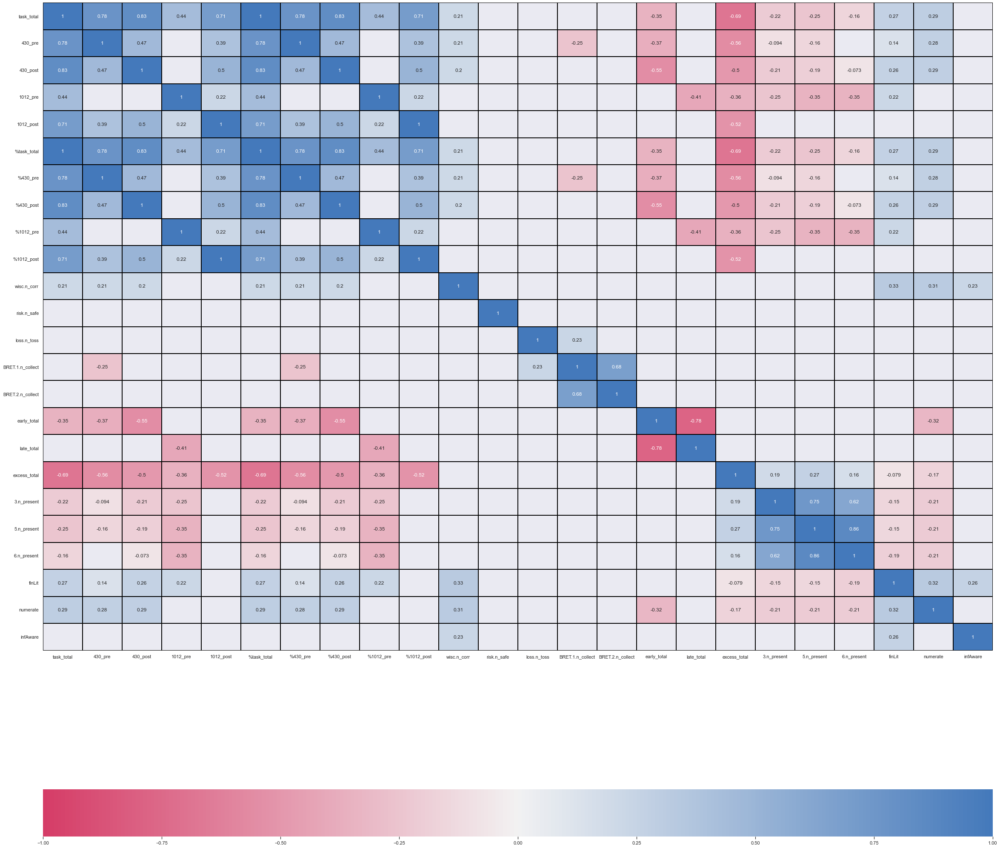

In [154]:
cogn = summary.copy()

# ## Re-code investment preferences, Not applicable = NaN
# cols = ['stocks',
#        'mutualFunds', 'bonds', 'savingsAccounts', 'lifeInsurance',
#        'retirementAccounts', 'crypto', 'invP_1', 'responseTime_1',
#        'invP_2_assurance', 'responseTime_2_assurance', 'invP_2_logement',
#        'responseTime_2_logement', 'invP_2_livret', 'responseTime_2_livret',
#        'invP_2_fonds', 'responseTime_2_fonds', 'invP_2_actions',
#        'responseTime_2_actions', 'invP_3', 'responseTime_3',
#        ]
# for i in range(len(cogn)):
#     for c in cols:
#         cogn[c].iloc[i] = np.nan if cogn[c].iloc[i] == 9 else cogn[c].iloc[i]

cols = [
    # 'participant.label',
        'task_total', 
        '430_pre', '430_post', '1012_pre', '1012_post',
        # 'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre', 'opp_cost_430_post', 
        # 'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 'exces_430_post', 
        # 'precoce_1012_pre', 'precoce_1012_post', 'precoce_430_pre', 'precoce_430_post', 
        # 'retard_1012_pre', 'retard_1012_post', 'retard_430_pre', 'retard_430_post',
        '%task_total', '%430_pre', '%430_post', '%1012_pre', '%1012_post', 
        
        # '%exces_1012_pre', '%exces_1012_post', '%exces_430_pre', '%exces_430_post', 
        # '%precoce_1012_pre', '%precoce_1012_post', '%precoce_430_pre', '%precoce_430_post', 
        # '%retard_1012_pre', '%retard_1012_post', '%retard_430_pre', '%retard_430_post', 
        # '%opp_cost_1012_pre', '%opp_cost_1012_post', '%opp_cost_430_pre',
        # 'lateOpt_1012_pre', 'lateOpt_1012_post', 'lateOpt_430_pre', 'lateOpt_430_post',
        'wisc.n_corr', 'risk.n_safe', 'loss.n_toss',
        'BRET.1.n_collect', 'BRET.2.n_collect',  
        'early_total', 'late_total','excess_total', 
        '3.n_present', '5.n_present', '6.n_present',
        # 'stocks', 'mutualFunds', 'bonds', 'savingsAccounts', 'lifeInsurance',
        # 'retirementAccounts', 'crypto', 
        # 'invP_1', 'responseTime_1',
        # 'invP_2_assurance', 'responseTime_2_assurance', 'invP_2_logement',
        # 'responseTime_2_logement', 'invP_2_livret', 'responseTime_2_livret',
        # 'invP_2_fonds', 'responseTime_2_fonds', 'invP_2_actions',
        # 'responseTime_2_actions', 'invP_3', 'responseTime_3',
        'finLit', 'numerate', 'infAware',]

df = cogn[cols]

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})

print('shape before dropna', df.shape)
# cols = df.columns.to_list()
# corr = corr.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)
print('shape after dropna', df.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(corr)                     # get p-Value
print(corr)
mask = np.invert(p_values<0.05)    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 
print(p_values)

In [155]:
print(cogn.columns.to_list())
cogn[cogn.isna().any(axis=1)]

['participant.label', 'participant.intervention', 'wisc.n_corr', 'wisc.n_cat', 'wisc.n_PE', 'wisc.n_SE', 'risk.n_safe', 'loss.n_toss', 'loss.n_switch', 'BRET.1.n_collect', 'BRET.2.n_collect', '3.n_present', '5.n_present', '6.n_present', '3.n_switches', '5.n_switches', '6.n_switches', '430_pre', '430_post', '1012_pre', '1012_post', 'task_total', 'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 'retard_1012_post', 'retard_430_pre', 'retard_430_post', 'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre', 'opp_cost_430_post', 're/(ex+pr)_430_pre', 're/(ex+pr)_430_post', 're/(ex+pr)_1012_pre', 're/(ex+pr)_1012_post', 'excess_pre', 'excess_post', 'excess_total', 'early_pre', 'early_post', 'early_total', 'late_pre', 'late_post', 'late_total', 'inf_9_cheaper', 'inf_9_lessInflated', 'inf_9_quantity', 'inf_9_stockMaintained', 'inf_9_leisure', 'inf_9_subscription', 'i

,participant.label,participant.intervention,wisc.n_corr,wisc.n_cat,wisc.n_PE,wisc.n_SE,risk.n_safe,loss.n_toss,loss.n_switch,BRET.1.n_collect,BRET.2.n_collect,3.n_present,5.n_present,6.n_present,3.n_switches,5.n_switches,6.n_switches,430_pre,430_post,1012_pre,1012_post,task_total,exces_1012_pre,exces_1012_post,exces_430_pre,exces_430_post,precoce_1012_pre,precoce_1012_post,precoce_430_pre,precoce_430_post,retard_1012_pre,retard_1012_post,retard_430_pre,retard_430_post,opp_cost_1012_pre,opp_cost_1012_post,opp_cost_430_pre,opp_cost_430_post,re/(ex+pr)_430_pre,re/(ex+pr)_430_post,re/(ex+pr)_1012_pre,re/(ex+pr)_1012_post,excess_pre,excess_post,excess_total,early_pre,early_post,early_total,late_pre,late_post,late_total,inf_9_cheaper,inf_9_lessInflated,inf_9_quantity,inf_9_stockMaintained,inf_9_leisure,inf_9_subscription,inf_9_insurance,inf_9_realEstate,inf_9_livret,inf_9_mutualFunds,inf_9_stocks,inf_9_indexedBonds,inf_9_checkingAccount,inf_9_move,inf_9_income,inf_9_job,inf_9_energy,inf_9_transportation,inf_10,inf_11,inf_12,finLit_2,finLit_4,numeracy_2,numeracy_4,numeracy2_2,numeracy2_4,inflation_2,inflation_4,demo_1,avg_acrcy,finLit,numerate,numerate2,infAware,lateOpt_1012_pre,mean_realPos_1012_pre,mean_realNeg_1012_pre,mean_increase_1012_pre,mean_decrease_1012_pre,lateOpt_1012_post,mean_realPos_1012_post,mean_realNeg_1012_post,mean_increase_1012_post,mean_decrease_1012_post,lateOpt_430_pre,mean_realPos_430_pre,mean_realNeg_430_pre,mean_increase_430_pre,mean_decrease_430_pre,mean_low_430_pre,mean_high_430_pre,lateOpt_430_post,mean_realPos_430_post,mean_realNeg_430_post,mean_increase_430_post,mean_decrease_430_post,mean_low_430_post,mean_high_430_post,mean_percep_life_2,mean_percep_life_4,expect_life_2,expect_life_4,stocks,mutualFunds,bonds,savingsAccounts,lifeInsurance,retirementAccounts,crypto,invP_1,responseTime_1,invP_2_assurance,responseTime_2_assurance,invP_2_logement,responseTime_2_logement,invP_2_livret,responseTime_2_livret,invP_2_fonds,responseTime_2_fonds,invP_2_actions,responseTime_2_actions,invP_3,responseTime_3,%430_pre,%430_post,%1012_pre,%1012_post,%task_total,%exces_1012_pre,%exces_1012_post,%exces_430_pre,%exces_430_post,%precoce_1012_pre,%precoce_1012_post,%precoce_430_pre,%precoce_430_post,%retard_1012_pre,%retard_1012_post,%retard_430_pre,%retard_430_post,%opp_cost_1012_pre,%opp_cost_1012_post,%opp_cost_430_pre,%opp_cost_430_post,excess_1012_pre,excess_1012_post,excess_430_pre,excess_430_post,excess_general,early_1012_pre,early_1012_post,early_430_pre,early_430_post,early_general,late_1012_pre,late_1012_post,late_430_pre,late_430_post,late_general,1012_pre_accuracy_1,430_pre_accuracy_1,1012_post_accuracy_1,430_post_accuracy_1,1012_pre_accuracy_2,430_pre_accuracy_2,1012_post_accuracy_2,430_post_accuracy_2,1012_pre_accuracy_3,430_pre_accuracy_3,1012_post_accuracy_3,430_post_accuracy_3,1012_pre_accuracy_4,430_pre_accuracy_4,1012_post_accuracy_4,430_post_accuracy_4,1012_pre_accuracy_5,430_pre_accuracy_5,1012_post_accuracy_5,430_post_accuracy_5
34,fSvLcK9,1.0,22.0,3.0,6,0,5.0,1.0,1.0,32.0,41.0,4.0,7.0,8.0,0.0,0.0,0.0,3739.76,4119.40,540.77,2417.19,10817.12,0.0,0.0,0.000000,0.0,12.684279,0.000000,0.000000,0.000000,1867.267304,0.000000,380.004071,0.000000,1879.951583,0.000000,380.004071,0.000000,1.000000,NaN,0.986596,NaN,0.000000,0.0,0.0,12.684279,0.000000,12.684279,2247.271375,0.000000,2247.271375,0.0,0.0,0.0,0.0,-2.0,-2.0,0.0,-2.0,-1.0,-2.0,-2.0,-2.0,-2.0,-2.0,1.0,0.0,0.0,-2.0,2.0,10.0,18.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2400.0,11.866338,1,0,0,1,0.979911,0.440155,-0.028668,-0.024590,0.152921,0.000000,1.039811,0.112557,-0.018359,0.067196,0.280677,0.880914,0.077105,-0.021174,0.012560,0.031314,0.000511,0.000000,1.749848,-0.889895,-0.040479,0.029744,0.129036,-0.029257,0.277778,-0.042017,10.3,15.3,0.0,0.0,0.0,1.0,1.0,0.0,0.0,4.0,18559.0,0.0,18643.0,0.0,4789.0,0.0,2796.0,9.0,2912.0,9.0,8774.0,3.0,10227.0,0.907865,1.000027,0.223372,0.998451,0.826968,0.0,0.0,0.000000,0.0,0.005239,0.000000,0.000000,0.000000,0.771298,0.000000

# Correlation matrix with late cost optimality

(107, 20)
(104, 20)
(104, 20)


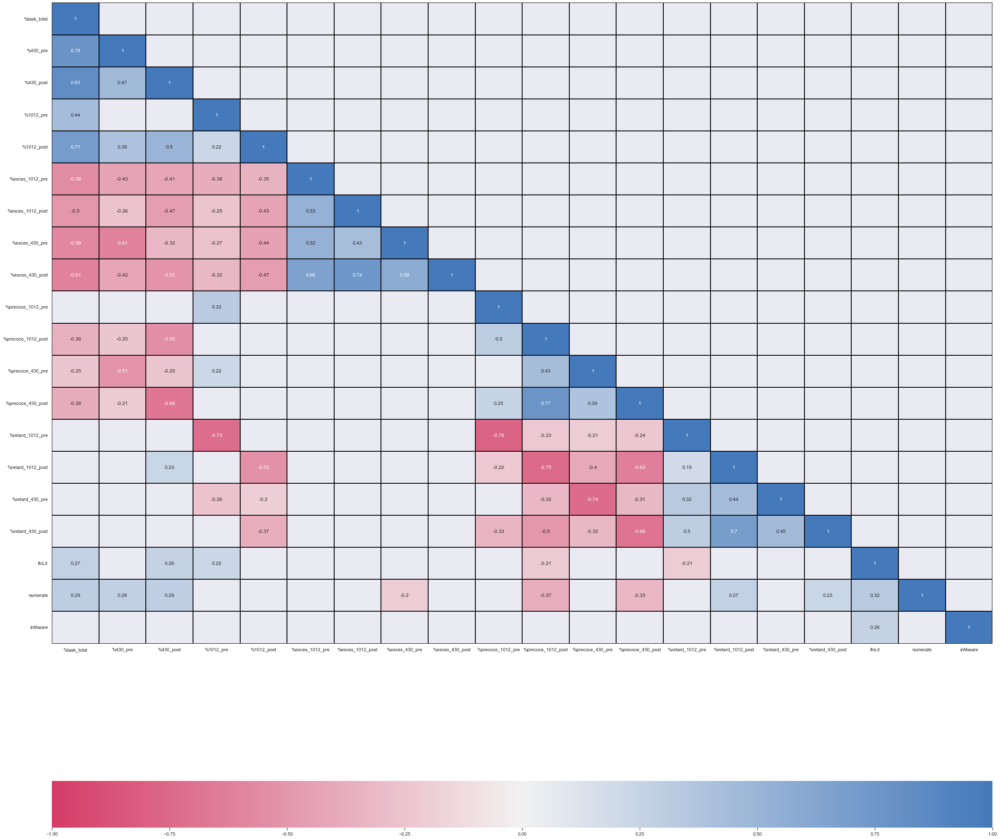

In [156]:


cols = [
    # 'participant.intervention',
        '%task_total', '%430_pre', '%430_post', '%1012_pre', '%1012_post', 
        '%exces_1012_pre', '%exces_1012_post', '%exces_430_pre', '%exces_430_post', 
        '%precoce_1012_pre', '%precoce_1012_post', '%precoce_430_pre', '%precoce_430_post', 
        '%retard_1012_pre', '%retard_1012_post', '%retard_430_pre', '%retard_430_post', 
    #     '%opp_cost_1012_pre', '%opp_cost_1012_post', '%opp_cost_430_pre', '%opp_cost_430_post',
    # #     '430_pre', '430_post', '1012_pre', '1012_post',
    # #    'task_total', 'exces_1012_pre', 'exces_1012_post', 'exces_430_pre',
    # #    'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post',
    # #    'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre',
    # #    'retard_1012_post', 'retard_430_pre', 'retard_430_post','lateOpt_1012_pre',
    #    'lateOpt_1012_post', 'lateOpt_430_pre', 'lateOpt_430_post',
    #    'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre',
    #    'opp_cost_430_post', 'wisc.n_corr','risk.n_safe', 'loss.n_toss',
    #    'BRET.1.n_collect', 'BRET.2.n_collect', '3.n_present',
    #    '5.n_present', '6.n_present','inf_9_cheaper',
    #    'inf_9_lessInflated', 'inf_9_quantity', 'inf_9_stockMaintained',
    #    'inf_9_leisure', 'inf_9_subscription', 'inf_9_insurance',
    #    'inf_9_realEstate', 'inf_9_livret', 'inf_9_mutualFunds', 'inf_9_stocks',
    #    'inf_9_indexedBonds', 'inf_9_checkingAccount', 'inf_9_move',
    #    'inf_9_income', 'inf_9_job', 'inf_9_energy', 'inf_9_transportation',
    #    'inf_10', 'inf_11', 'inf_12', 'finLit_2', 'finLit_4', 'numeracy_2',
    #    'numeracy_4', 'inflation_2', 'inflation_4', 'demo_1', 'avg_acrcy',
       'finLit', 'numerate', 'infAware',]

summaryCopy = summary[cols].copy()

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from scipy import stats

def corr_sig(summaryCopy=None):
    p_matrix = np.zeros(shape=(summaryCopy.shape[1],summaryCopy.shape[1]))
    for col in summaryCopy.columns:
        for col2 in summaryCopy.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(summaryCopy[col],summaryCopy[col2])
            p_matrix[summaryCopy.columns.to_list().index(col),summaryCopy.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


# cols = summaryCopy.columns.to_list()
# print(cols)
# del cols[0]
# print(cols)
summaryCopy = summaryCopy
print(summaryCopy.shape)
summaryCopy.dtypes
# summaryCopy = summaryCopy.replace([np.inf, -np.inf], 1000)
summaryCopy = summaryCopy.dropna(axis=0)
summaryCopy = summaryCopy[cols]
print(summaryCopy.shape)
# summaryCopy = summaryCopy.replace([np.inf, -np.inf], 1)
summaryCopy = summaryCopy.dropna(axis=0)
print(summaryCopy.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = summaryCopy.corr()                            # get correlation
p_values = corr_sig(summaryCopy)                     # get p-Value
mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap)  

# Correlation matrix with inf divergence

In [157]:
cols = summary.columns.to_list()

summary['age'] = np.nan

## Add participant age
for i in range(len(demo)):
    summary['age'].loc[
        summary['participant.label'] == demo['participant.label'].iloc[i]
    ] = demo['age'].iloc[i]


In [158]:
cols = [
    'Inflation.1.player.responseTime_CI1_pre',
    'Inflation.1.player.responseTime_CI1_post', 
    'Inflation.1.player.responseTime_CI2_pre', 
    'Inflation.1.player.responseTime_CI2_post', 
    'Inflation.1.player.responseTime_CI3_pre', 
    'Inflation.1.player.responseTime_CI3_post', 
    'Inflation.1.player.responseTime_CI4_pre', 
    'Inflation.1.player.responseTime_CI4_post', 
    'infCI_1_accuracy_pre', 
    'infCI_1_accuracy_post', 
    'infCI_4_accuracy_pre', 
    'infCI_4_accuracy_post', 
    'CI_1_correct_pre', 
    'CI_1_correct_post', 
    'CI_2_correct_pre', 
    'CI_2_correct_post', 
    'CI_3_correct_pre', 
    'CI_3_correct_post', 
    'CI_4_correct_pre', 
    'CI_4_correct_post',
]

for c in cols:
    summary[c] = np.nan

for i in range(len(summary_compInt)):
    for c in cols:
        summary[c].loc[
            summary['participant.label'] == summary_compInt['participant.label'].iloc[i]
        ] = summary_compInt[c].iloc[i]

# Add RTs

In [159]:
print(summary.shape)
summary = pd.merge(summary, summRTs)
print(summary.shape)
cols = summary.columns.to_list()
cols = [c for c in cols if 'avgRT' in c]
for c in cols:
    summary[c] = summary[c].astype(float)

(107, 212)
(107, 240)


In [160]:

print([f'430_avgRT_{n}_{day}' for n in range(1,5) for day in ['pre','post']])
print([f'1012_avgRT_{n}_{day}' for n in range(1,11) for day in ['pre','post']])

['430_avgRT_1_pre', '430_avgRT_1_post', '430_avgRT_2_pre', '430_avgRT_2_post', '430_avgRT_3_pre', '430_avgRT_3_post', '430_avgRT_4_pre', '430_avgRT_4_post']
['1012_avgRT_1_pre', '1012_avgRT_1_post', '1012_avgRT_2_pre', '1012_avgRT_2_post', '1012_avgRT_3_pre', '1012_avgRT_3_post', '1012_avgRT_4_pre', '1012_avgRT_4_post', '1012_avgRT_5_pre', '1012_avgRT_5_post', '1012_avgRT_6_pre', '1012_avgRT_6_post', '1012_avgRT_7_pre', '1012_avgRT_7_post', '1012_avgRT_8_pre', '1012_avgRT_8_post', '1012_avgRT_9_pre', '1012_avgRT_9_post', '1012_avgRT_10_pre', '1012_avgRT_10_post']


shape before dropna (107, 34)
shape after dropna (105, 34)


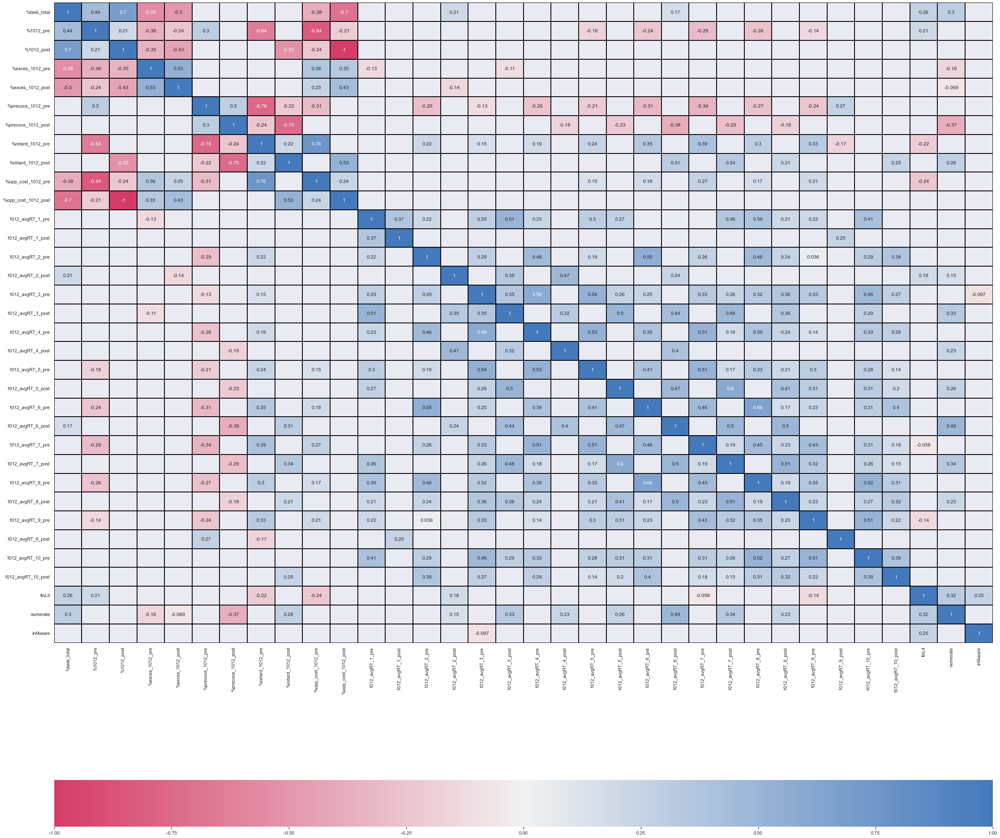

In [161]:
df = summary.copy()

# ## Re-code investment preferences, Not applicable = NaN
# cols = ['stocks',
#        'mutualFunds', 'bonds', 'savingsAccounts', 'lifeInsurance',
#        'retirementAccounts', 'crypto', 'invP_1', 'responseTime_1',
#        'invP_2_assurance', 'responseTime_2_assurance', 'invP_2_logement',
#        'responseTime_2_logement', 'invP_2_livret', 'responseTime_2_livret',
#        'invP_2_fonds', 'responseTime_2_fonds', 'invP_2_actions',
#        'responseTime_2_actions', 'invP_3', 'responseTime_3',
#        ]
# for i in range(len(cogn)):
#     for c in cols:
#         cogn[c].iloc[i] = np.nan if cogn[c].iloc[i] == 9 else cogn[c].iloc[i]

cols = [
        '%task_total', 
        # '%430_pre', '%430_post', 
        '%1012_pre', '%1012_post', 
        '%exces_1012_pre', '%exces_1012_post', 
        # '%exces_430_pre', '%exces_430_post', 
        '%precoce_1012_pre', '%precoce_1012_post', 
        # '%precoce_430_pre', '%precoce_430_post', 
        '%retard_1012_pre', '%retard_1012_post', 
        # '%retard_430_pre', '%retard_430_post', 
        '%opp_cost_1012_pre', '%opp_cost_1012_post', 
        # '%opp_cost_430_pre', '%opp_cost_430_post',
        # '430_pre', '430_post', '1012_pre', '1012_post', 
        #             'task_total',
        #             'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 
        #             'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 
        #             'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 
        #             'retard_1012_post', 'retard_430_pre', 'retard_430_post', 
                    # 'lateOpt_1012_pre',
                    # 'lateOpt_1012_post', 
        #             'lateOpt_430_pre', 'lateOpt_430_post',
        # '430_avgRT_1_pre', '430_avgRT_1_post', '430_avgRT_2_pre', '430_avgRT_2_post', 
        # '430_avgRT_3_pre', '430_avgRT_3_post', '430_avgRT_4_pre', '430_avgRT_4_post',
        '1012_avgRT_1_pre', '1012_avgRT_1_post', '1012_avgRT_2_pre', '1012_avgRT_2_post', 
        '1012_avgRT_3_pre', '1012_avgRT_3_post', '1012_avgRT_4_pre', '1012_avgRT_4_post', 
        '1012_avgRT_5_pre', '1012_avgRT_5_post', '1012_avgRT_6_pre', '1012_avgRT_6_post', 
        '1012_avgRT_7_pre', '1012_avgRT_7_post', '1012_avgRT_8_pre', '1012_avgRT_8_post', 
        '1012_avgRT_9_pre', '1012_avgRT_9_post', '1012_avgRT_10_pre', '1012_avgRT_10_post',
                    'finLit', 'numerate', 'infAware',
                    # 'inf_9_cheaper',
                    # 'inf_9_lessInflated',
                    # 'inf_9_quantity',
                    # 'inf_9_stockMaintained',
                    # 'inf_9_leisure',
                    # 'inf_9_subscription',
                    # 'inf_9_insurance',
                    # 'inf_9_realEstate',
                    # 'inf_9_livret',
                    # 'inf_9_mutualFunds',
                    # 'inf_9_stocks',
                    # 'inf_9_indexedBonds',
                    # 'inf_9_checkingAccount',
                    # 'inf_9_move',
                    # 'inf_9_income',
                    # 'inf_9_job',
                    # 'inf_9_energy',
                    # 'inf_9_transportation',
                    # 'inf_10',
                    # 'inf_11',
                    # 'inf_12',
                    # 'demo_1',
    #                 'mean_percep_life_2', 'mean_percep_life_4', 
    #    'expect_life_2', 'expect_life_4', 
    #    'mean_realPos_1012_pre', 'mean_realNeg_1012_pre', 
    #    'mean_realPos_1012_post', 
    #    'mean_realNeg_1012_post',
    #    'mean_realPos_430_pre', 'mean_realNeg_430_pre', 
    #    'mean_realPos_430_post', 'mean_realNeg_430_post', 
    #    'mean_increase_1012_pre', 'mean_decrease_1012_pre', 
    #    'mean_increase_1012_post', 'mean_decrease_1012_post',  'mean_increase_430_pre', 
    #    'mean_decrease_430_pre',
    #    'mean_increase_430_post', 
    #    'mean_decrease_430_post', 'mean_low_430_pre', 'mean_high_430_pre', 
    #    'mean_low_430_post', 'mean_high_430_post',
    #    'Inflation.1.player.responseTime_CI1_pre',
    #    'Inflation.1.player.responseTime_CI1_post', 
    #    'Inflation.1.player.responseTime_CI2_pre', 
    #    'Inflation.1.player.responseTime_CI2_post', 
    #    'Inflation.1.player.responseTime_CI3_pre', 
    #    'Inflation.1.player.responseTime_CI3_post', 
    #    'Inflation.1.player.responseTime_CI4_pre', 
    #    'Inflation.1.player.responseTime_CI4_post', 
    #    'infCI_1_accuracy_pre', 
    #    'infCI_1_accuracy_post', 
    #    'infCI_4_accuracy_pre', 
    #    'infCI_4_accuracy_post', 
    #    'CI_1_correct_pre', 
    #    'CI_1_correct_post', 
    #    'CI_2_correct_pre', 
    #    'CI_2_correct_post', 
    #    'CI_3_correct_pre', 
    #    'CI_3_correct_post', 
    #    'CI_4_correct_pre', 
    #    'CI_4_correct_post',
    # 'age',
]

df = df[cols]

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})

print('shape before dropna', df.shape)
# cols = df.columns.to_list()
# corr = corr.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)
print('shape after dropna', df.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(corr)                     # get p-Value
mask = np.invert(p_values<0.05)    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 

# Add `Wisconsin` RTs 

In [162]:
print(summary.shape)
summary = pd.merge(summary, wiscrt)
print(summary.shape)
cols = summary.columns.to_list()
cols = [c for c in cols if '_RT' in c]
for c in cols:
    summary[c] = summary[c].astype(float)

(107, 240)
(107, 270)


# Add task_total for `pre` and `post`

In [163]:
summary['total_pre'] = summary['430_pre'] + summary['1012_pre']
summary['total_post'] = summary['430_post'] + summary['1012_post']
summary['%total_pre'] = summary['total_pre'] / (4119.29 + 2420.94)
summary['%total_post'] = summary['total_post'] / (4119.29 + 2420.94)

(107, 52)
(107, 52)
(104, 52)


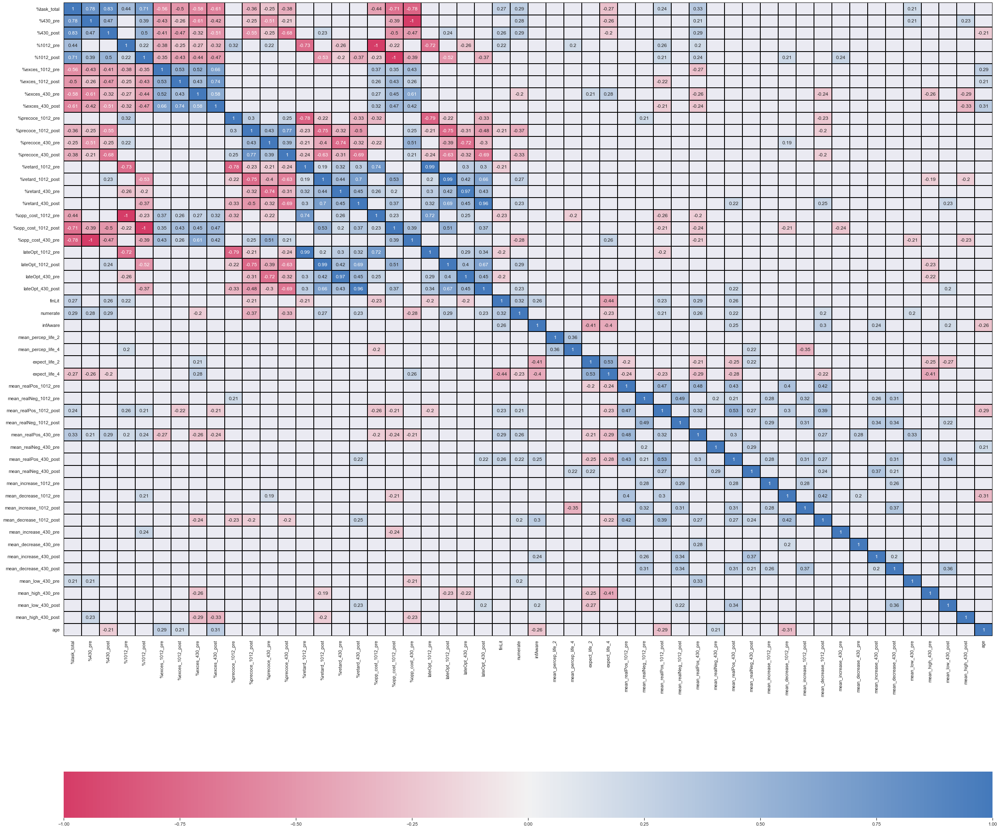

In [164]:
summaryInflation = summary.copy()

df = summaryInflation[[
        '%task_total', '%430_pre', '%430_post', '%1012_pre', '%1012_post', 
        '%exces_1012_pre', '%exces_1012_post', '%exces_430_pre', '%exces_430_post', 
        '%precoce_1012_pre', '%precoce_1012_post', '%precoce_430_pre', '%precoce_430_post', 
        '%retard_1012_pre', '%retard_1012_post', '%retard_430_pre', '%retard_430_post', 
        '%opp_cost_1012_pre', '%opp_cost_1012_post', '%opp_cost_430_pre',
        # '430_pre', '430_post', '1012_pre', '1012_post', 
        #             'task_total',
        #             'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 
        #             'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 
        #             'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 
        #             'retard_1012_post', 'retard_430_pre', 'retard_430_post', 
                    'lateOpt_1012_pre',
                    'lateOpt_1012_post', 'lateOpt_430_pre', 'lateOpt_430_post',
                    'finLit', 'numerate', 'infAware',
                    # 'inf_9_cheaper',
                    # 'inf_9_lessInflated',
                    # 'inf_9_quantity',
                    # 'inf_9_stockMaintained',
                    # 'inf_9_leisure',
                    # 'inf_9_subscription',
                    # 'inf_9_insurance',
                    # 'inf_9_realEstate',
                    # 'inf_9_livret',
                    # 'inf_9_mutualFunds',
                    # 'inf_9_stocks',
                    # 'inf_9_indexedBonds',
                    # 'inf_9_checkingAccount',
                    # 'inf_9_move',
                    # 'inf_9_income',
                    # 'inf_9_job',
                    # 'inf_9_energy',
                    # 'inf_9_transportation',
                    # 'inf_10',
                    # 'inf_11',
                    # 'inf_12',
                    # 'demo_1',
                    'mean_percep_life_2', 'mean_percep_life_4', 
       'expect_life_2', 'expect_life_4', 
       'mean_realPos_1012_pre', 'mean_realNeg_1012_pre', 
       'mean_realPos_1012_post', 
       'mean_realNeg_1012_post',
       'mean_realPos_430_pre', 'mean_realNeg_430_pre', 
       'mean_realPos_430_post', 'mean_realNeg_430_post', 
       'mean_increase_1012_pre', 'mean_decrease_1012_pre', 
       'mean_increase_1012_post', 'mean_decrease_1012_post',  'mean_increase_430_pre', 
       'mean_decrease_430_pre',
       'mean_increase_430_post', 
       'mean_decrease_430_post', 'mean_low_430_pre', 'mean_high_430_pre', 
       'mean_low_430_post', 'mean_high_430_post',
    #    'Inflation.1.player.responseTime_CI1_pre',
    #    'Inflation.1.player.responseTime_CI1_post', 
    #    'Inflation.1.player.responseTime_CI2_pre', 
    #    'Inflation.1.player.responseTime_CI2_post', 
    #    'Inflation.1.player.responseTime_CI3_pre', 
    #    'Inflation.1.player.responseTime_CI3_post', 
    #    'Inflation.1.player.responseTime_CI4_pre', 
    #    'Inflation.1.player.responseTime_CI4_post', 
    #    'infCI_1_accuracy_pre', 
    #    'infCI_1_accuracy_post', 
    #    'infCI_4_accuracy_pre', 
    #    'infCI_4_accuracy_post', 
    #    'CI_1_correct_pre', 
    #    'CI_1_correct_post', 
    #    'CI_2_correct_pre', 
    #    'CI_2_correct_post', 
    #    'CI_3_correct_pre', 
    #    'CI_3_correct_post', 
    #    'CI_4_correct_pre', 
    #    'CI_4_correct_post',
    'age',
       ]].copy()

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


cols = df.columns.to_list()
# print(cols)
# del cols[0]
# print(cols)
print(df.shape)
df = df[cols]
print(df.shape)
# df = df.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)
print(df.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(df)                     # get p-Value
# ## Triangular
# mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
## Full
mask = np.invert((p_values<0.05))    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 

# Correlation matrix: Inflation perceptions/expectations vs behaviors

## Re-code behavior responses

In [165]:
for i in tqdm(range(len(summaryInflation['inf_10'])), desc='inf_10'):
    if summaryInflation['inf_10'].iloc[i] == 0:
        summaryInflation['inf_10'].iloc[i] = -1

for i in tqdm(range(len(summaryInflation['inf_11'])), desc='inf_11'):
    if summaryInflation['inf_11'].iloc[i] == 0:
        summaryInflation['inf_11'].iloc[i] = -1
    if summaryInflation['inf_11'].iloc[i] == 9:
        summaryInflation['inf_11'].iloc[i] = 0

for i in tqdm(range(len(summaryInflation['inf_12'])), desc='inf_12'):
    if summaryInflation['inf_12'].iloc[i] == 5:
        summaryInflation['inf_12'].iloc[i] = -1
    if summaryInflation['inf_12'].iloc[i] == 4:
        summaryInflation['inf_12'].iloc[i] = 1
    if summaryInflation['inf_12'].iloc[i] == 3:
        summaryInflation['inf_12'].iloc[i] = 2
    if summaryInflation['inf_12'].iloc[i] == 2:
        summaryInflation['inf_12'].iloc[i] = 4
    if summaryInflation['inf_12'].iloc[i] == 9:
        summaryInflation['inf_12'].iloc[i] = np.nan

inf_10:   0%|          | 0/107 [00:00<?, ?it/s]

inf_11:   0%|          | 0/107 [00:00<?, ?it/s]

inf_12:   0%|          | 0/107 [00:00<?, ?it/s]

before dropna (107, 42)
after dropna (104, 42)
                     %task_total  %430_pre  %430_post  %1012_pre  %1012_post  \
%task_total             1.000000  0.776203   0.829640   0.437545    0.707850   
%430_pre                0.776203  1.000000   0.468231   0.157991    0.393035   
%430_post               0.829640  0.468231   1.000000   0.149587    0.504509   
%1012_pre               0.437545  0.157991   0.149587   1.000000    0.224104   
%1012_post              0.707850  0.393035   0.504509   0.224104    1.000000   
%exces_1012_pre        -0.555816 -0.433624  -0.414746  -0.375174   -0.348008   
%exces_1012_post       -0.500473 -0.264576  -0.466832  -0.254182   -0.429767   
%exces_430_pre         -0.581975 -0.610173  -0.316839  -0.268718   -0.444975   
%exces_430_post        -0.610318 -0.419805  -0.509715  -0.318684   -0.465244   
%precoce_1012_pre       0.112967  0.041610   0.020213   0.315064    0.035534   
%precoce_1012_post     -0.355039 -0.248262  -0.546358   0.062127   -0.037

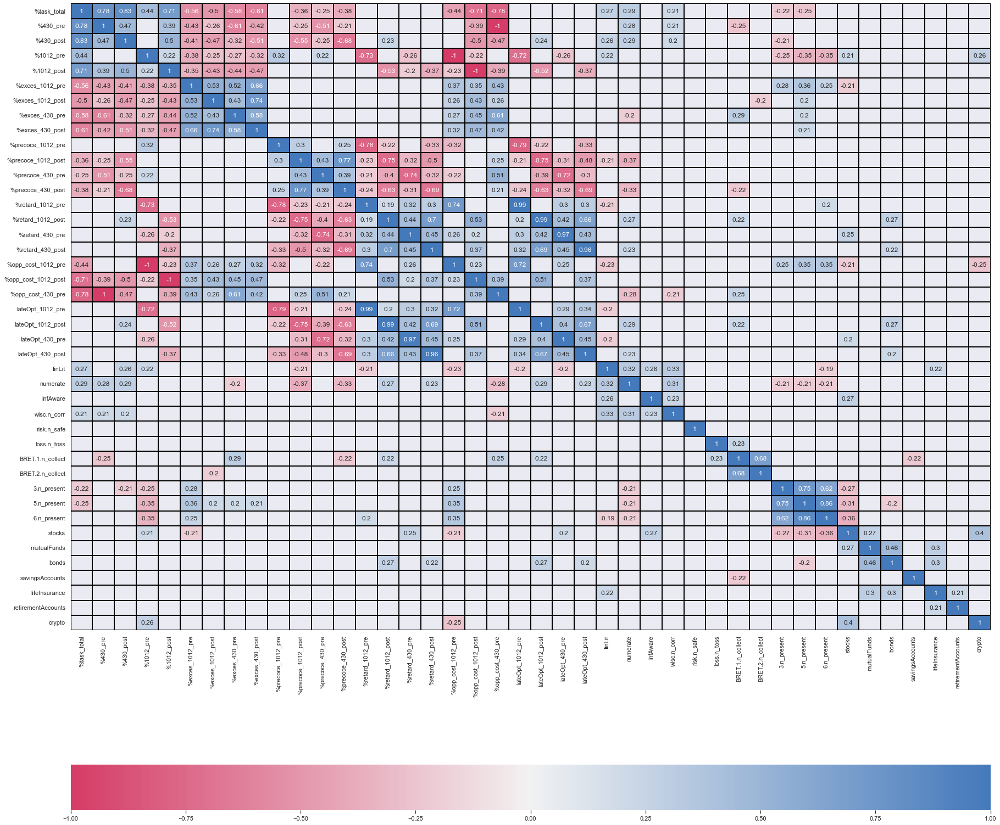

In [166]:
df = summaryInflation.copy()
cols = [
    # 'participant.label',
        '%task_total', '%430_pre', '%430_post', '%1012_pre', '%1012_post', 
        '%exces_1012_pre', '%exces_1012_post', '%exces_430_pre', '%exces_430_post', 
        '%precoce_1012_pre', '%precoce_1012_post', '%precoce_430_pre', '%precoce_430_post', 
        '%retard_1012_pre', '%retard_1012_post', '%retard_430_pre', '%retard_430_post', 
        '%opp_cost_1012_pre', '%opp_cost_1012_post', '%opp_cost_430_pre',
        # '430_pre', '430_post', '1012_pre', '1012_post', 
        #             'task_total',
        #             'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 
        #             'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 
        #             'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 
        #             'retard_1012_post', 'retard_430_pre', 'retard_430_post', 
        'lateOpt_1012_pre', 'lateOpt_1012_post', 'lateOpt_430_pre', 'lateOpt_430_post',
                    'finLit', 'numerate', 'infAware', 
                    'wisc.n_corr',
                    'risk.n_safe',
                    'loss.n_toss',
                    'BRET.1.n_collect', 'BRET.2.n_collect',
                    '3.n_present', '5.n_present', '6.n_present',
        'stocks', 'mutualFunds', 'bonds', 'savingsAccounts', 'lifeInsurance',
        'retirementAccounts', 'crypto',
                    # 'inf_9_cheaper',
                    # 'inf_9_lessInflated',
                    # 'inf_9_quantity',
                    # 'inf_9_stockMaintained',
                    # 'inf_9_leisure',
                    # 'inf_9_subscription',
                    # 'inf_9_insurance',
                    # 'inf_9_realEstate',
                    # 'inf_9_livret',
                    # 'inf_9_mutualFunds',
                    # 'inf_9_stocks',
                    # 'inf_9_indexedBonds',
                    # 'inf_9_checkingAccount',
                    # 'inf_9_move',
                    # 'inf_9_income',
                    # 'inf_9_job',
                    # 'inf_9_energy',
                    # 'inf_9_transportation',
                    # 'inf_10',
                    # 'inf_11',
                    # 'inf_12',
                    # 'demo_1',
    #                 'mean_percep_life_2', 'mean_percep_life_4', 
    #    'expect_life_2', 'expect_life_4', 
    # 'trial_1_RT', 'trial_2_RT', 'trial_3_RT',
    # 'trial_4_RT', 'trial_5_RT', 'trial_6_RT', 'trial_7_RT', 'trial_8_RT',
    # 'trial_9_RT', 'trial_10_RT', 'trial_11_RT', 'trial_12_RT',
    # 'trial_13_RT', 'trial_14_RT', 'trial_15_RT', 'trial_16_RT',
    # 'trial_17_RT', 'trial_18_RT', 'trial_19_RT', 'trial_20_RT',
    # 'trial_21_RT', 'trial_22_RT', 'trial_23_RT', 'trial_24_RT',
    # 'trial_25_RT', 'trial_26_RT', 'trial_27_RT', 'trial_28_RT',
    # 'trial_29_RT', 'trial_30_RT'
    #    'mean_realPos_1012_pre', 'mean_realNeg_1012_pre', 
    #    'mean_realPos_1012_post', 
    #    'mean_realNeg_1012_post',
    #    'mean_realPos_430_pre', 'mean_realNeg_430_pre', 
    #    'mean_realPos_430_post', 'mean_realNeg_430_post', 
    #    'mean_increase_1012_pre', 'mean_decrease_1012_pre', 
    #    'mean_increase_1012_post', 'mean_decrease_1012_post',  'mean_increase_430_pre', 
    #    'mean_decrease_430_pre',
    #    'mean_increase_430_post', 
    #    'mean_decrease_430_post', 'mean_low_430_pre', 'mean_high_430_pre', 
    #    'mean_low_430_post', 'mean_high_430_post',
    #    'Inflation.1.player.responseTime_CI1_pre',
    #    'Inflation.1.player.responseTime_CI1_post', 
    #    'Inflation.1.player.responseTime_CI2_pre', 
    #    'Inflation.1.player.responseTime_CI2_post', 
    #    'Inflation.1.player.responseTime_CI3_pre', 
    #    'Inflation.1.player.responseTime_CI3_post', 
    #    'Inflation.1.player.responseTime_CI4_pre', 
    #    'Inflation.1.player.responseTime_CI4_post', 
    #    'infCI_1_accuracy_pre', 
    #    'infCI_1_accuracy_post', 
    #    'infCI_4_accuracy_pre', 
    #    'infCI_4_accuracy_post', 
    #    'CI_1_correct_pre', 
    #    'CI_1_correct_post', 
    #    'CI_2_correct_pre', 
    #    'CI_2_correct_post', 
    #    'CI_3_correct_pre', 
    #    'CI_3_correct_post', 
    #    'CI_4_correct_pre', 
    #    'CI_4_correct_post',
    #    'age', 
       ]

df = df[cols]

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(30,30))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})


print('before dropna', df.shape)
# df = df.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)
print('after dropna', df.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(df)                     # get p-Value
# ## Triangular
# mask = np.invert(np.tril(p_values<0.05))    # mask - only get significant corr
## Full
mask = np.invert((p_values<0.05))    # mask - only get significant corr
print(corr)
plot_cor_matrix(corr,mask, cmap) 
print(p_values)

# Inflation behavior versus stock in task

In [167]:

inflation = final_df_dict['Inflation'].copy()

print(summary.shape, inflation.shape)

c = 'inf_9_livret'

summary[f'{c}_2'] = np.nan
summary['inf_10_2'] = np.nan
# cols = summary.columns.to_list()
# cols.insert(2, cols.pop(-1))
# summary = summary[cols]

# summary.loc[(summary['participant.label'] == inflation['participant.label']) & \
#     (summary['participant.day'] == inflation['participant.day'])]

for i in range(len(inflation)):
    summary[f'{c}_2'].loc[
        (summary['participant.label'] == inflation['participant.label'].iloc[i]) & \
            (inflation['participant.day'].iloc[i] == 2)
    ] = inflation[f'Inflation.1.player.{c}'].iloc[i]
    summary['inf_10_2'].loc[
        (summary['participant.label'] == inflation['participant.label'].iloc[i]) & \
            (inflation['participant.day'].iloc[i] == 2)
    ] = inflation[f'Inflation.1.player.inf_10'].iloc[i]
    #     summary[c].loc[
    #         (summary['participant.label'] == inflation['participant.label'].iloc[i]) & \
    #             (summary['participant.day'] == 2)
    #     ] = inflation[f'Inflation.1.player.{c}'].iloc[i]
    # if inflation['participant.day'].iloc[i] >= 3:
    #     summary[c].loc[
    #         (summary['participant.label'] == inflation['participant.label'].iloc[i]) & \
    #             (summary['participant.day'] == 3)
    #     ] = inflation[f'Inflation.1.player.{c}'].iloc[i]
    #     summary[c].loc[
    #         (summary['participant.label'] == inflation['participant.label'].iloc[i]) & \
    #             (summary['participant.day'] == 4)
    #     ] = inflation[f'Inflation.1.player.{c}'].iloc[i]
    # elif inflation[c].iloc[i] > 0:
    #     print('nay')
    #     summary[c].loc[
    #         summary['participant.label'] == inflation['participant.label'].iloc[i] &\
    #             summary['participant.day'] == inflation['participant.day'].iloc[i]
    #     ] = 1
    # else:
    #     print('hi')
    #     summary[c].loc[
    #         summary['participant.label'] == inflation['participant.label'].iloc[i] &\
    #             summary['participant.day'] == inflation['participant.day'].iloc[i]
    #     ] = -1

# summary.sort_values(['participant.label','participant.day'])

print('before drop',summary.shape)
summary.loc[summary.isnull().any(axis=1)]
summary.dropna(inplace=True)
print('after drop',summary.shape)
# summary.groupby('inf_9_summaryMaintained').describe().T
# summary[c].describe()
summary.to_excel('summary_inf.xlsx')

# import numpy as np
# from scipy.stats import normaltest, kstest, ttest_ind

# # v = df_numerate[['task_total','excess_total', 'early_total', 'late_total', 'numerate2']]
# v1 = summary[['task_total','excess_total', 'early_total', 'late_total']][df_numerate['numerate2'] == 1]
# v1 = summary[['task_total','excess_total', 'early_total', 'late_total']][df_numerate['numerate2'] == 0]

# print('ttest', ttest_ind(v1, v2, equal_var=True))

# print('normaltest', normaltest(v))
# # print(kstest(v, 'cdf'))

(107, 274) (214, 62)
before drop (107, 276)
after drop (100, 276)


# Average inflation perceptions

In [168]:
# summary = summary.copy()
print('before',summary.shape)

summary['avgPerceptions'] = summary[['mean_realPos_1012_pre', 'mean_realNeg_1012_pre', 
'mean_realPos_1012_post', 'mean_realNeg_1012_post', 
'mean_realPos_430_pre', 'mean_realNeg_430_pre',
'mean_realPos_430_post', 'mean_realNeg_430_post',]].apply(lambda row: np.nanmean(row), axis=1)

before (100, 276)


# Average inflaton expectations

In [169]:
print('before',summary.shape)
summary['avgExpectations'] = summary[['mean_increase_1012_pre', 'mean_decrease_1012_pre', 
'mean_increase_1012_post', 'mean_decrease_1012_post', 'mean_increase_430_pre', 
'mean_decrease_430_pre', 'mean_low_430_pre', 'mean_high_430_pre',
'mean_increase_430_post', 'mean_decrease_430_post', 'mean_low_430_post', 
'mean_high_430_post',]].apply(lambda row: np.nanmean(row), axis=1)

print('after',summary.shape)
summary[['mean_increase_1012_pre', 'mean_decrease_1012_pre', 
'mean_increase_1012_post', 'mean_decrease_1012_post', 'mean_increase_430_pre', 
'mean_decrease_430_pre', 'mean_low_430_pre', 'mean_high_430_pre',
'mean_increase_430_post', 'mean_decrease_430_post', 'mean_low_430_post', 
'mean_high_430_post','avgExpectations']].head()

before (100, 277)
after (100, 278)


,mean_increase_1012_pre,mean_decrease_1012_pre,mean_increase_1012_post,mean_decrease_1012_post,mean_increase_430_pre,mean_decrease_430_pre,mean_low_430_pre,mean_high_430_pre,mean_increase_430_post,mean_decrease_430_post,mean_low_430_post,mean_high_430_post,avgExpectations
0,-0.023206,0.048789,-0.023056,0.032029,-0.041695,0.025240,0.142571,-0.019594,-0.046547,0.019755,0.224612,-0.047168,0.024311
1,-0.021676,0.073191,-0.037580,0.046043,-0.005993,0.013770,-1.057915,0.008047,-0.164090,0.064020,0.107348,-0.021996,-0.083069
2,-0.017522,0.491042,-0.017318,0.475565,-0.046677,0.033761,0.060013,-0.021038,-0.032008,0.381679,0.339272,-0.019752,0.135585
3,-0.017516,0.465665,-0.017548,0.296069,-0.033335,0.177936,0.180832,-0.017043,-0.030675,0.381679,0.283286,-0.016767,0.137715
4,-0.016627,-0.639677,-0.026711,0.165801,-0.045008,-0.724638,0.073613,-0.016757,0.147374,0.056754,0.339272,-0.020229,-0.058903


# Histograms

## FinLit

finLit                           0                   1          
participant.intervention       0.0       1.0       0.0       1.0
%430_pre                  0.487032  0.368494  0.475310  0.507364
%430_post                 0.490628  0.352986  0.517701  0.584326
%1012_pre                 0.319277  0.273139  0.388472  0.379844
%1012_post                0.400014  0.339563  0.407361  0.432253
%total_pre                0.424936  0.333197  0.443166  0.460161
%total_post               0.457086  0.348017  0.476857  0.528034
%task_total               0.441011  0.340607  0.460012  0.494097

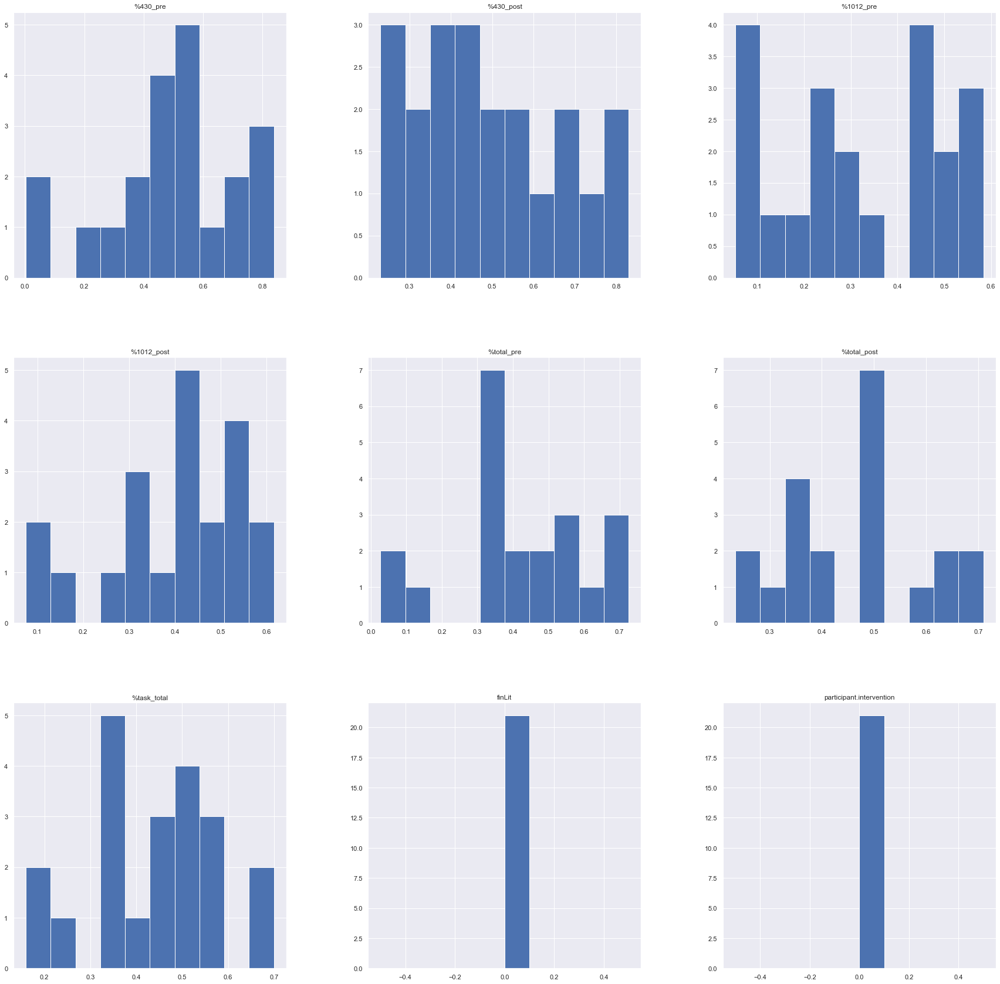

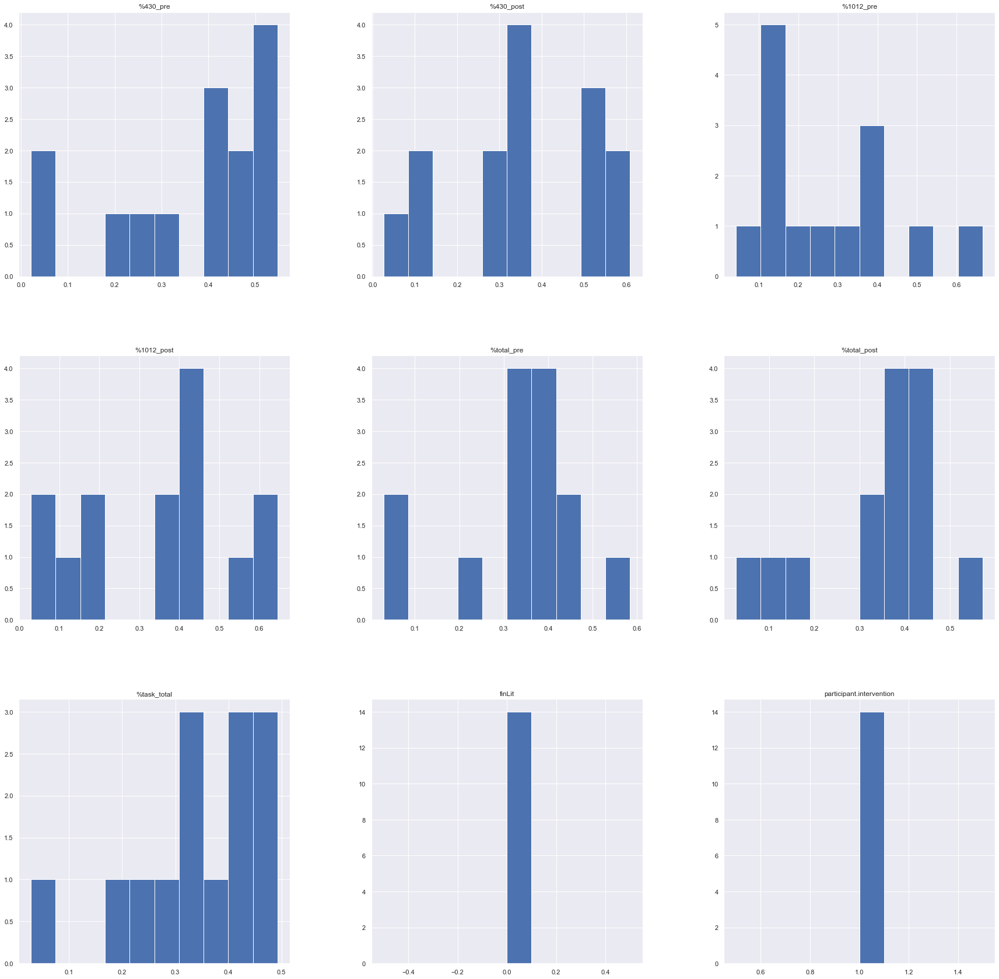

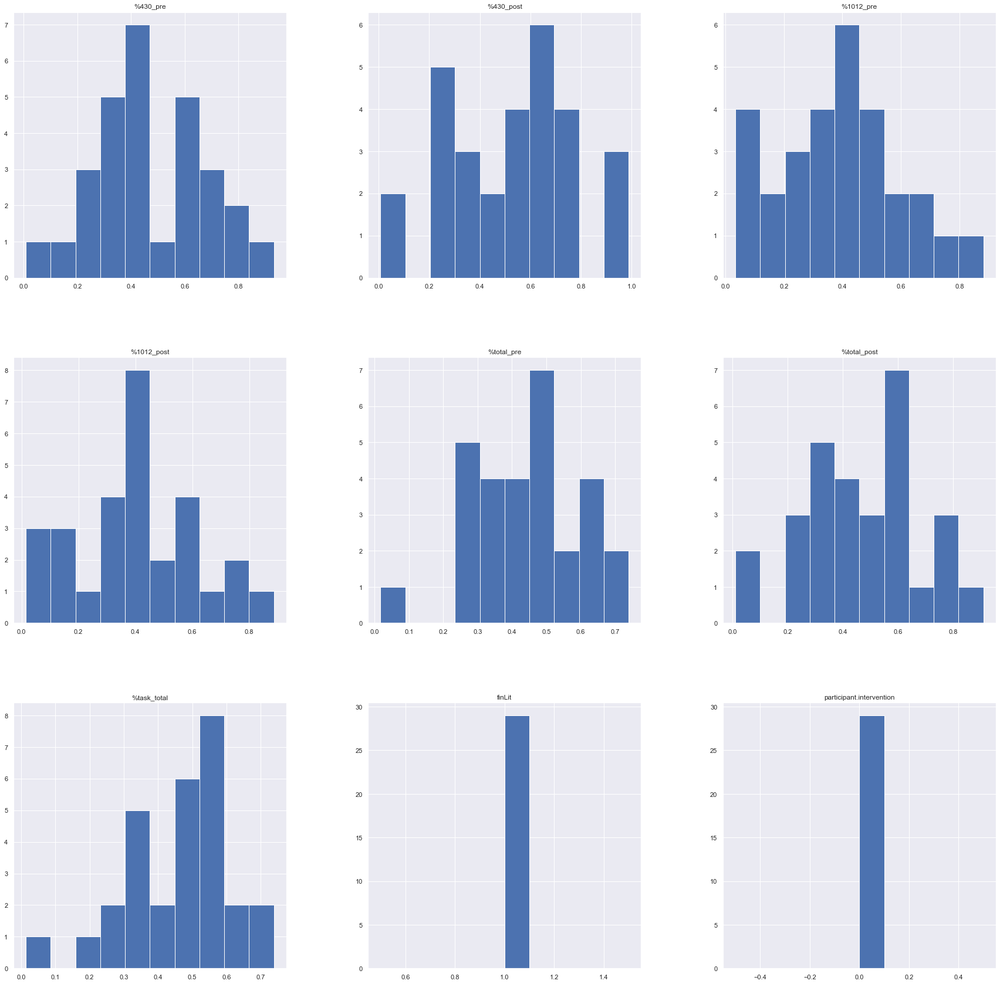

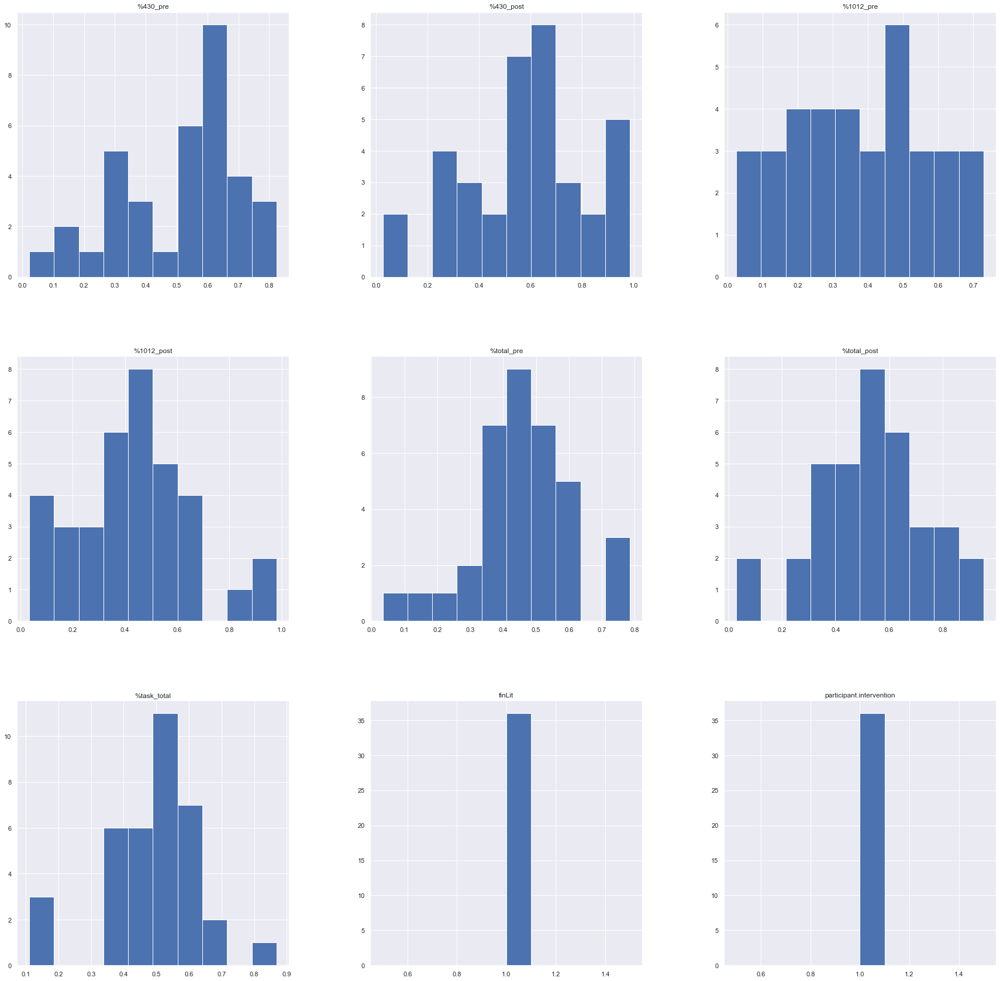

In [170]:
summary[['%430_pre', '%430_post', '%1012_pre', '%1012_post', '%total_pre','%total_post', '%task_total','finLit','participant.intervention']].groupby(['finLit','participant.intervention']).hist(figsize=(30,30))
summary[['%430_pre', '%430_post', '%1012_pre', '%1012_post', '%total_pre','%total_post', '%task_total','finLit','participant.intervention']].groupby(['finLit','participant.intervention']).mean().T

df_finlit (100, 278)
df_finlit (100, 278)
nn_ttmean 5243.2937142857145
nn_exmean 1041.8564936065713
nn_ertmean 3533.277756033457
nn_lamean 3265.1530699074283
nn_ttstd 1885.7690461579764
nn_exstd 1657.296610513313
nn_ertstd 2254.432964044847
nn_lastd 2119.7028010164063
num_ttmean 6264.100461538462
num_exmean 753.6022685446154
num_ertmean 3170.708623468077
num_lamean 2891.657511192046
num_ttstd 2027.6519824420923
num_exstd 1575.2542852992533
num_ertstd 2418.1539815073384
num_lastd 1979.3139901956492


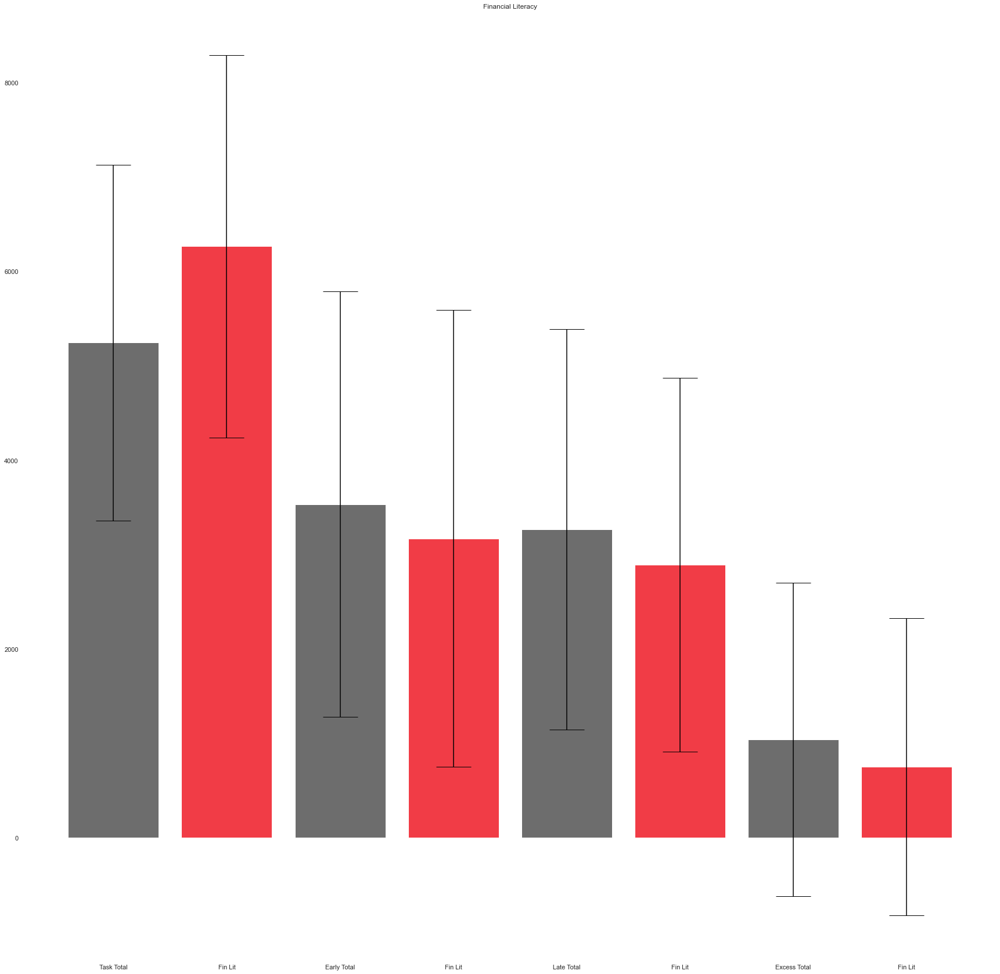

In [171]:
df_finlit = summary.copy()
print('df_finlit', df_finlit.shape)
df_finlit.drop_duplicates(inplace=True)
print('df_finlit', df_finlit.shape)

# summary[['%total_pre','%total_post', '%task_total','finLit']].groupby(['finLit',]).describe().T
df_finlit[['task_total','excess_total', 'early_total', 'late_total', 'finLit']].groupby(['finLit',]).mean()

nn_ttmean = df_finlit[['task_total','finLit']].groupby(['finLit',]).mean().iloc[0,0]
print('nn_ttmean', nn_ttmean)
nn_exmean = df_finlit[['excess_total','finLit']].groupby(['finLit',]).mean().iloc[0,0]
print('nn_exmean', nn_exmean)
nn_ertmean = df_finlit[['early_total','finLit']].groupby(['finLit',]).mean().iloc[0,0]
print('nn_ertmean', nn_ertmean)
nn_lamean = df_finlit[['late_total','finLit']].groupby(['finLit',]).mean().iloc[0,0]
print('nn_lamean', nn_lamean)
nn_ttstd = df_finlit[['task_total','finLit']].groupby(['finLit',]).std().iloc[0,0]
print('nn_ttstd', nn_ttstd)
nn_exstd = df_finlit[['excess_total','finLit']].groupby(['finLit',]).std().iloc[0,0]
print('nn_exstd', nn_exstd)
nn_ertstd = df_finlit[['early_total','finLit']].groupby(['finLit',]).std().iloc[0,0]
print('nn_ertstd', nn_ertstd)
nn_lastd = df_finlit[['late_total','finLit']].groupby(['finLit',]).std().iloc[0,0]
print('nn_lastd', nn_lastd)

num_ttmean = df_finlit[['task_total','finLit']].groupby(['finLit',]).mean().iloc[1,0]
print('num_ttmean', num_ttmean)
num_exmean = df_finlit[['excess_total','finLit']].groupby(['finLit',]).mean().iloc[1,0]
print('num_exmean', num_exmean)
num_ertmean = df_finlit[['early_total','finLit']].groupby(['finLit',]).mean().iloc[1,0]
print('num_ertmean', num_ertmean)
num_lamean = df_finlit[['late_total','finLit']].groupby(['finLit',]).mean().iloc[1,0]
print('num_lamean', num_lamean)
num_ttstd = df_finlit[['task_total','finLit']].groupby(['finLit',]).std().iloc[1,0]
print('num_ttstd', num_ttstd)
num_exstd = df_finlit[['excess_total','finLit']].groupby(['finLit',]).std().iloc[1,0]
print('num_exstd', num_exstd)
num_ertstd = df_finlit[['early_total','finLit']].groupby(['finLit',]).std().iloc[1,0]
print('num_ertstd', num_ertstd)
num_lastd = df_finlit[['late_total','finLit']].groupby(['finLit',]).std().iloc[1,0]
print('num_lastd', num_lastd)



## Define labels, positions, bar heights and error bar heights
labels = [
    'Task Total', 
    'Fin Lit', 
    'Early Total', 
    'Fin Lit', 
    'Late Total',  
    'Fin Lit', 
    'Excess Total',
    'Fin Lit', 
]
x_pos = np.arange(len(labels))
data = [nn_ttmean, num_ttmean, nn_ertmean, num_ertmean, nn_lamean, num_lamean, nn_exmean, num_exmean]
error = [nn_ttstd, num_ttstd, nn_ertstd, num_ertstd, nn_lastd, num_lastd, nn_exstd, num_exstd]

# Build the plot
fig, ax = plt.subplots(figsize=(30,30))
colors = ['#6d6d6d','#f13c46','#6d6d6d','#f13c46','#6d6d6d','#f13c46','#6d6d6d','#f13c46',]
datalist = ax.bar(x_pos, data,
       yerr=error,
       align='center',
       color=colors,
       alpha=1,
       ecolor='black',
       capsize=30)

ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_title('Financial Literacy')
ax.yaxis.grid(True)
ax.set_facecolor('w')
params = {'axes.titlesize':'40',
          'xtick.labelsize':'32',
          'ytick.labelsize':'32'}
plt.rcParams.update(params)
plt.rcParams.update({"axes.grid" : True, "grid.color": "#929294"})

# Save the figure and show
# plt.tight_layout()
# plt.savefig('comparison.png')
plt.show()

### P values

In [172]:
import numpy as np
from scipy.stats import normaltest, kstest, ttest_ind

v = df_finlit[['task_total','excess_total', 'early_total', 'late_total', 'finLit']]
v1 = df_finlit[['task_total','excess_total', 'early_total', 'late_total']][df_finlit['finLit'] == 1]
v2 = df_finlit[['task_total','excess_total', 'early_total', 'late_total']][df_finlit['finLit'] == 0]

print('ttest', ttest_ind(v1, v2, equal_var=True))

print('normaltest', normaltest(v))

ttest Ttest_indResult(statistic=array([ 2.45958168, -0.85705693, -0.73195481, -0.87794681]), pvalue=array([0.01566187, 0.39350443, 0.46594297, 0.38211995]))
normaltest NormaltestResult(statistic=array([   4.76685798,   68.27498541,   12.35235852,    6.76763877,
       1919.83822949]), pvalue=array([9.22337662e-02, 1.49374097e-15, 2.07835355e-03, 3.39176624e-02,
       0.00000000e+00]))


## Numerate

In [173]:
# summary[['%total_pre','%total_post', '%task_total','numerate','numerate2']].groupby(['numerate',]).hist(figsize=(30,30))
summary[['%total_pre','%total_post', '%task_total','numerate']].groupby(['numerate',]).mean().T
# summary[['%430_pre', '%430_post', '%1012_pre', '%1012_post','%total_pre','%total_post', '%task_total','numerate','participant.intervention']].groupby(['numerate','participant.intervention']).hist(figsize=(30,30))
# summary[['%430_pre', '%430_post', '%1012_pre', '%1012_post','%total_pre','%total_post', '%task_total','numerate','participant.intervention']].groupby(['numerate','participant.intervention']).mean().T

numerate,0,1
%total_pre,0.404361,0.511441
%total_post,0.446093,0.558587
%task_total,0.425227,0.535014


df_numerate (100, 278)
df_numerate (100, 278)
nn_ttmean 5562.162105263158
nn_exmean 1008.5061093578948
nn_ertmean 3747.787762803395
nn_lamean 2763.101916674776
nn_ttstd 2094.409352066156
nn_exstd 1709.3958701123968
nn_ertstd 2291.197407006301
nn_lastd 2009.5389553795274
num_ttmean 6998.228749999999
num_exmean 366.7775175179167
num_ertmean 1872.0380005640834
num_lamean 3843.4312502899998
num_ttstd 1337.3437979111482
num_exstd 1091.926546935607
num_ertstd 2001.4921473842735
num_lastd 1894.1041603810327


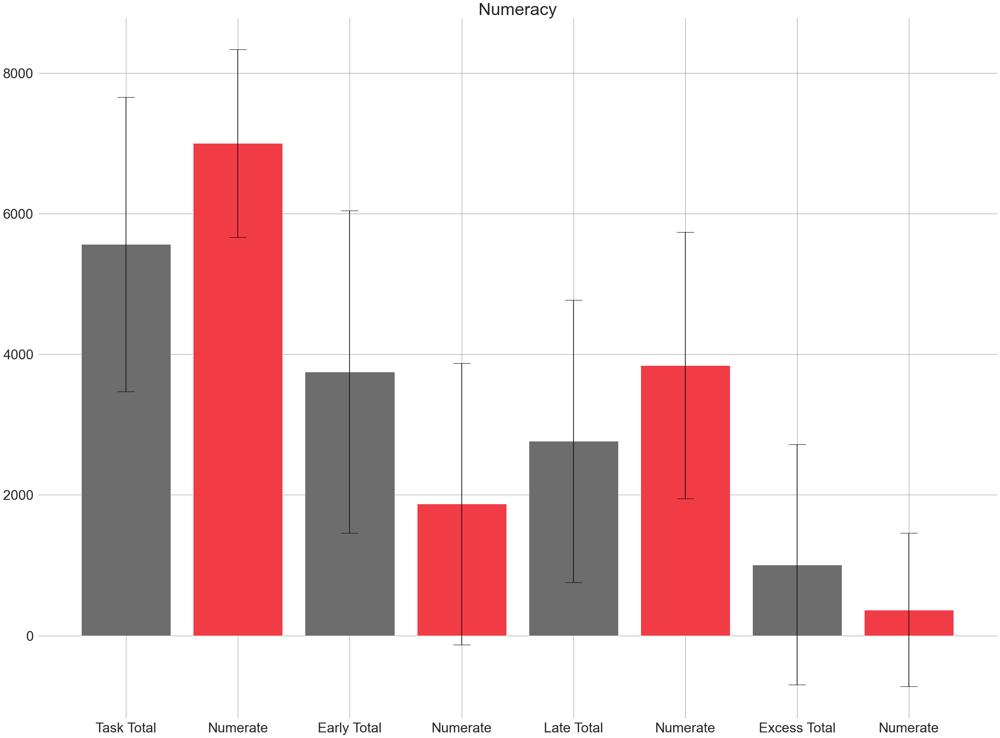

In [174]:
df_numerate = summary.copy()
print('df_numerate', df_numerate.shape)
df_numerate.drop_duplicates(inplace=True)
print('df_numerate', df_numerate.shape)

# summary[['%total_pre','%total_post', '%task_total','numerate']].groupby(['numerate',]).describe().T
df_numerate[['task_total','excess_total', 'early_total', 'late_total', 'numerate']].groupby(['numerate',]).mean()

## Not Numerate
nn_ttmean = df_numerate[['task_total','numerate']].groupby(['numerate',]).mean().iloc[0,0]
print('nn_ttmean', nn_ttmean)
nn_exmean = df_numerate[['excess_total','numerate']].groupby(['numerate',]).mean().iloc[0,0]
print('nn_exmean', nn_exmean)
nn_ertmean = df_numerate[['early_total','numerate']].groupby(['numerate',]).mean().iloc[0,0]
print('nn_ertmean', nn_ertmean)
nn_lamean = df_numerate[['late_total','numerate']].groupby(['numerate',]).mean().iloc[0,0]
print('nn_lamean', nn_lamean)
nn_ttstd = df_numerate[['task_total','numerate']].groupby(['numerate',]).std().iloc[0,0]
print('nn_ttstd', nn_ttstd)
nn_exstd = df_numerate[['excess_total','numerate']].groupby(['numerate',]).std().iloc[0,0]
print('nn_exstd', nn_exstd)
nn_ertstd = df_numerate[['early_total','numerate']].groupby(['numerate',]).std().iloc[0,0]
print('nn_ertstd', nn_ertstd)
nn_lastd = df_numerate[['late_total','numerate']].groupby(['numerate',]).std().iloc[0,0]
print('nn_lastd', nn_lastd)

## Numerate
num_ttmean = df_numerate[['task_total','numerate']].groupby(['numerate',]).mean().iloc[1,0]
print('num_ttmean', num_ttmean)
num_exmean = df_numerate[['excess_total','numerate']].groupby(['numerate',]).mean().iloc[1,0]
print('num_exmean', num_exmean)
num_ertmean = df_numerate[['early_total','numerate']].groupby(['numerate',]).mean().iloc[1,0]
print('num_ertmean', num_ertmean)
num_lamean = df_numerate[['late_total','numerate']].groupby(['numerate',]).mean().iloc[1,0]
print('num_lamean', num_lamean)
num_ttstd = df_numerate[['task_total','numerate']].groupby(['numerate',]).std().iloc[1,0]
print('num_ttstd', num_ttstd)
num_exstd = df_numerate[['excess_total','numerate']].groupby(['numerate',]).std().iloc[1,0]
print('num_exstd', num_exstd)
num_ertstd = df_numerate[['early_total','numerate']].groupby(['numerate',]).std().iloc[1,0]
print('num_ertstd', num_ertstd)
num_lastd = df_numerate[['late_total','numerate']].groupby(['numerate',]).std().iloc[1,0]
print('num_lastd', num_lastd)



## Define labels, positions, bar heights and error bar heights
labels = [
    'Task Total', 
    'Numerate', 
    'Early Total', 
    'Numerate', 
    'Late Total',  
    'Numerate', 
    'Excess Total',
    'Numerate', 
]
x_pos = np.arange(len(labels))
data = [nn_ttmean, num_ttmean, nn_ertmean, num_ertmean, nn_lamean, num_lamean, nn_exmean, num_exmean]
error = [nn_ttstd, num_ttstd, nn_ertstd, num_ertstd, nn_lastd, num_lastd, nn_exstd, num_exstd]

# Build the plot
fig, ax = plt.subplots(figsize=(40,30))
colors = ['#6d6d6d','#f13c46','#6d6d6d','#f13c46','#6d6d6d','#f13c46','#6d6d6d','#f13c46',]
datalist = ax.bar(x_pos, data,
       yerr=error,
       align='center',
       color=colors,
       alpha=1,
       ecolor='black',
       capsize=20)

ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_title('Numeracy')
ax.yaxis.grid(True)
ax.set_facecolor('w')
params = {'axes.titlesize':'40',
          'xtick.labelsize':'32',
          'ytick.labelsize':'32'}
plt.rcParams.update(params)
plt.rcParams.update({"axes.grid" : True, "grid.color": "#929294"})

# Save the figure and show
# plt.tight_layout()
plt.savefig('numerate_comparison.png')
plt.show()

In [175]:

df_numerate[['task_total','excess_total', 'early_total', 'late_total', 'numerate']].groupby(['numerate',]).describe().T

numerate                       0            1
task_total   count     76.000000    24.000000
             mean    5562.162105  6998.228750
             std     2094.409352  1337.343798
             min      181.470000  2454.480000
             25%     4488.192500  6464.335000
             50%     5506.115000  7137.440000
             75%     7110.332500  7735.890000
             max    11363.210000  9153.830000
excess_total count     76.000000    24.000000
             mean    1008.506109   366.777518
             std     1709.395870  1091.926547
             min        0.000000     0.000000
             25%        0.000000     0.000000
             50%      255.554908     0.000000
             75%      894.505429   133.015701
             max     8450.239395  5136.221763
early_total  count     76.000000    24.000000
             mean    3747.787763  1872.038001
             std     2291.197407  2001.492147
             min        0.000000     0.000000
             25%     2053.013043   207.425702
             50%     3671.307658  1529.369645
             75%     5568.813828  2748.897086
             max     8465.991294  7970.467861
late_total   count     76.000000    24.000000
             mean    2763.101917  3843.431250
             std     2009.538955  1894.104160
             min       16.954221   229.052232
             25%     1358.589861  2319.465906
             50%     2234.273798  3608.820247
             75%     3745.379972  5740.669317
             max     8091.379293  6639.148328

In [176]:
import numpy as np
from scipy.stats import normaltest, kstest, ttest_ind

v = df_numerate[['task_total','excess_total', 'early_total', 'late_total', 'numerate']]
v1 = df_numerate[['task_total','excess_total', 'early_total', 'late_total']][df_numerate['numerate'] == 1]
v2 = df_numerate[['task_total','excess_total', 'early_total', 'late_total']][df_numerate['numerate'] == 0]

print('ttest', ttest_ind(v1, v2, equal_var=True))

print('normaltest', normaltest(v))
# print(kstest(v, 'cdf'))

ttest Ttest_indResult(statistic=array([ 3.15591244, -1.7278333 , -3.59787822,  2.32666992]), pvalue=array([0.00212574, 0.08716808, 0.000505  , 0.02204193]))
normaltest NormaltestResult(statistic=array([ 4.76685798, 68.27498541, 12.35235852,  6.76763877, 20.24938528]), pvalue=array([9.22337662e-02, 1.49374097e-15, 2.07835355e-03, 3.39176624e-02,
       4.00776138e-05]))


In [177]:
def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

print(df_numerate.shape)
df_numerate = df_numerate.dropna(axis=0)
print(df_numerate.shape)

corr_sig(df_numerate[['task_total','excess_total', 'early_total', 'late_total', 'numerate']])

(100, 278)
(100, 278)


array([[0.00000000e+00, 1.95734413e-16, 8.73725939e-04, 5.39135440e-01,
        2.12573806e-03],
       [1.95734413e-16, 0.00000000e+00, 5.99439520e-01, 8.44321985e-01,
        8.71680795e-02],
       [8.73725939e-04, 5.99439520e-01, 0.00000000e+00, 8.89653428e-23,
        5.05002079e-04],
       [5.39135440e-01, 8.44321985e-01, 8.89653428e-23, 0.00000000e+00,
        2.20419336e-02],
       [2.12573806e-03, 8.71680795e-02, 5.05002079e-04, 2.20419336e-02,
        0.00000000e+00]])

shape before dropna (100, 5)
shape after dropna (100, 5)
              task_total  excess_total  early_total  late_total  numerate
task_total      1.000000     -0.707261    -0.327711   -0.062134  0.303734
excess_total   -0.707261      1.000000    -0.053152   -0.019885 -0.171938
early_total    -0.327711     -0.053152     1.000000   -0.792586 -0.341581
late_total     -0.062134     -0.019885    -0.792586    1.000000  0.228795
numerate        0.303734     -0.171938    -0.341581    0.228795  1.000000
[[0.         0.03758239 0.5369309  0.84523666 0.30626959]
 [0.03758239 0.         0.84342346 0.99714171 0.46915987]
 [0.5369309  0.84342346 0.         0.02279422 0.27628131]
 [0.84523666 0.99714171 0.02279422 0.         0.41561604]
 [0.30626959 0.46915987 0.27628131 0.41561604 0.        ]]


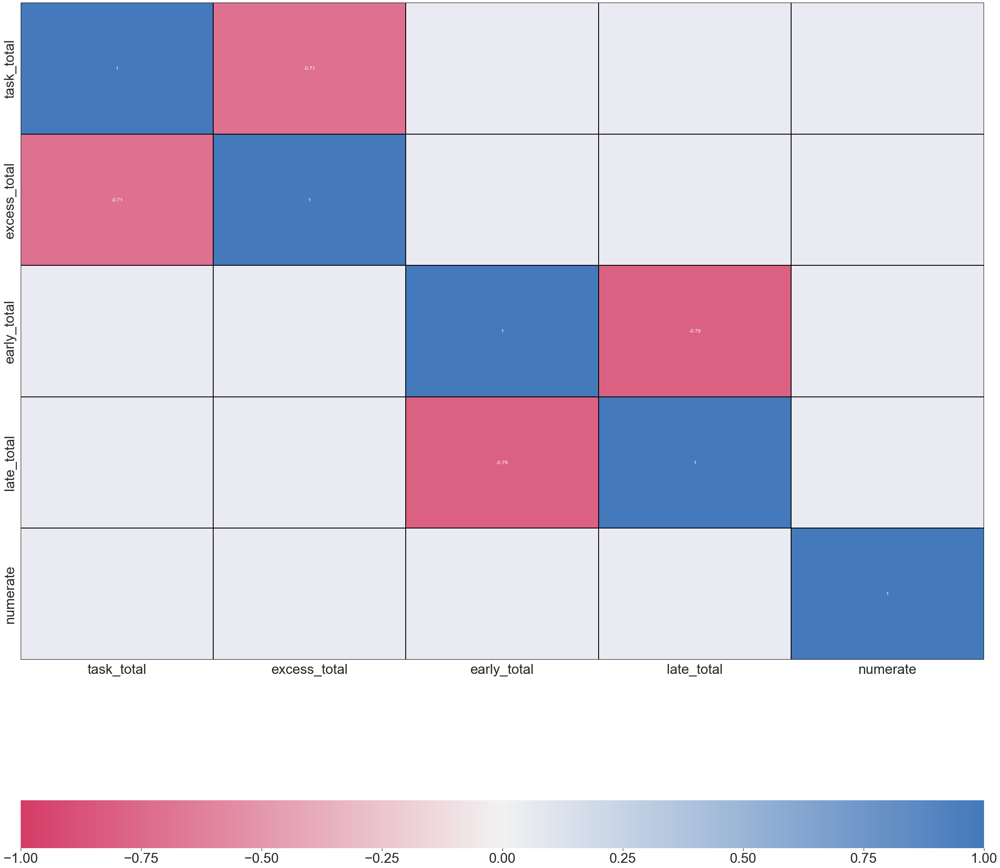

In [178]:

df = df_numerate[['task_total','excess_total', 'early_total', 'late_total', 'numerate']]

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(40,40))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})

print('shape before dropna', df.shape)
# cols = df.columns.to_list()
# corr = corr.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)
print('shape after dropna', df.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(corr)                     # get p-Value
print(corr)
mask = np.invert(p_values<0.05)    # mask - only get significant corr
plot_cor_matrix(corr,mask, cmap) 
print(p_values)

In [179]:
summary[[c for c in summary.columns.to_list() if 'numer' in c]].describe().T

,count,mean,std,min,25%,50%,75%,max
numeracy_2,100.0,0.18,0.386123,0.0,0.0,0.0,0.0,1.0
numeracy_4,100.0,0.22,0.416333,0.0,0.0,0.0,0.0,1.0
numeracy2_2,100.0,0.32,0.468826,0.0,0.0,0.0,1.0,1.0
numeracy2_4,100.0,0.38,0.487832,0.0,0.0,0.0,1.0,1.0
numerate,100.0,0.24,0.429235,0.0,0.0,0.0,0.0,1.0
numerate2,100.0,0.41,0.494311,0.0,0.0,0.0,1.0,1.0


## Inflation aware

infAware                         0                   1          
participant.intervention       0.0       1.0       0.0       1.0
%430_pre                  0.493285  0.414662  0.460656  0.522298
%430_post                 0.485301  0.490598  0.537874  0.548503
%1012_pre                 0.338825  0.373946  0.390287  0.325987
%1012_post                0.443867  0.414003  0.344887  0.398596
%total_pre                0.436110  0.399590  0.434608  0.449631
%total_post               0.469963  0.462246  0.466438  0.493013
%task_total               0.453037  0.430918  0.450523  0.471322

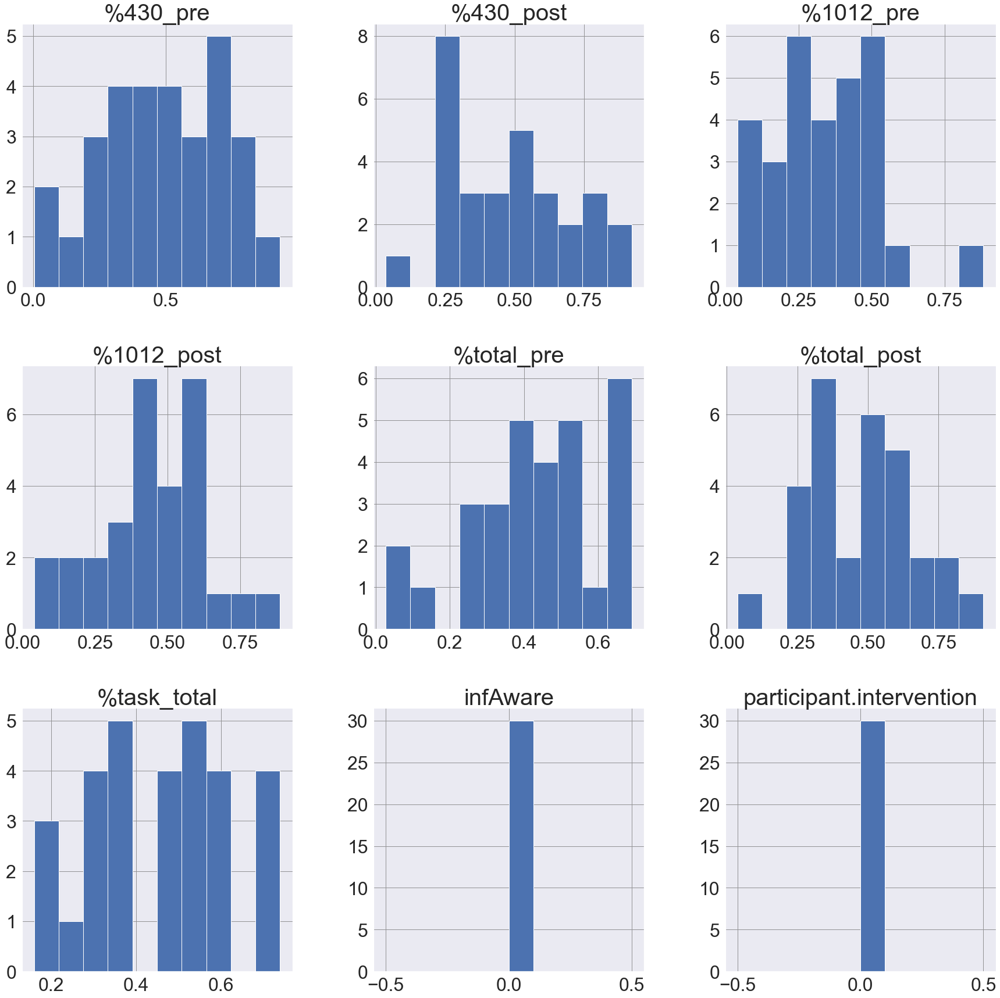

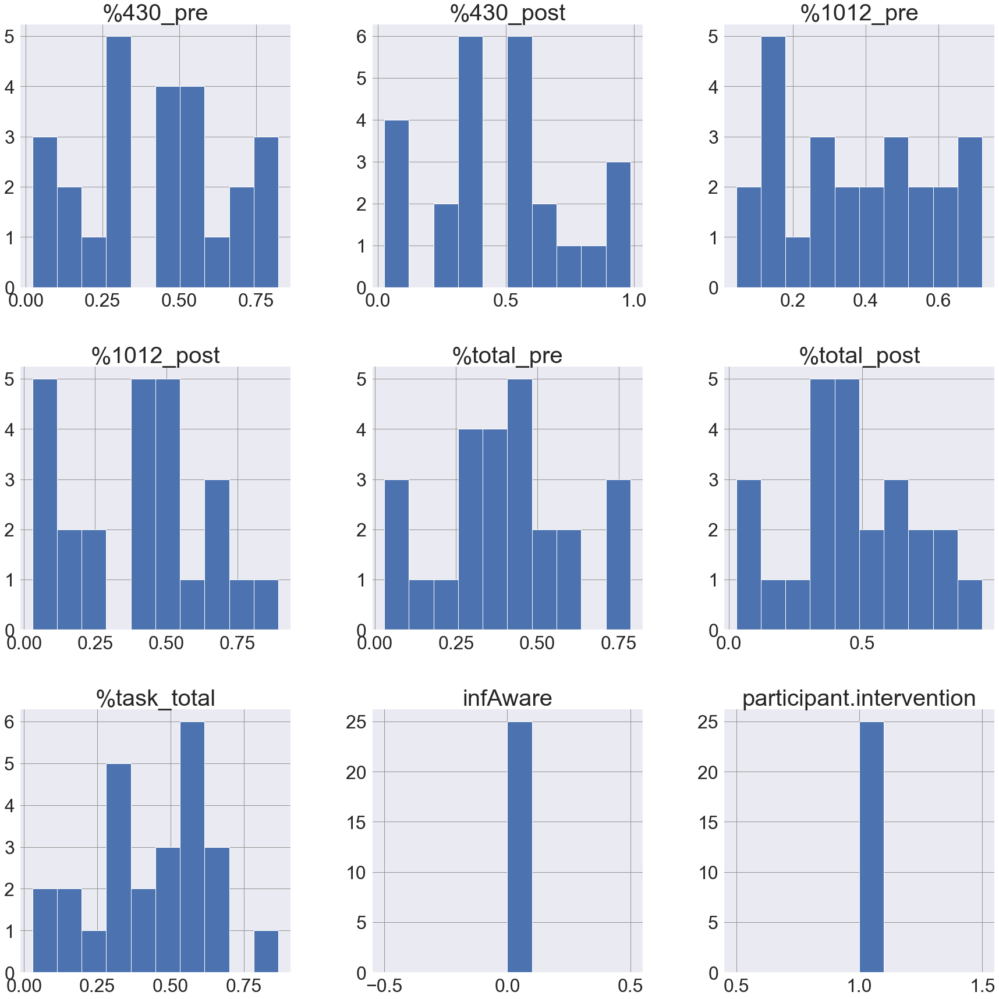

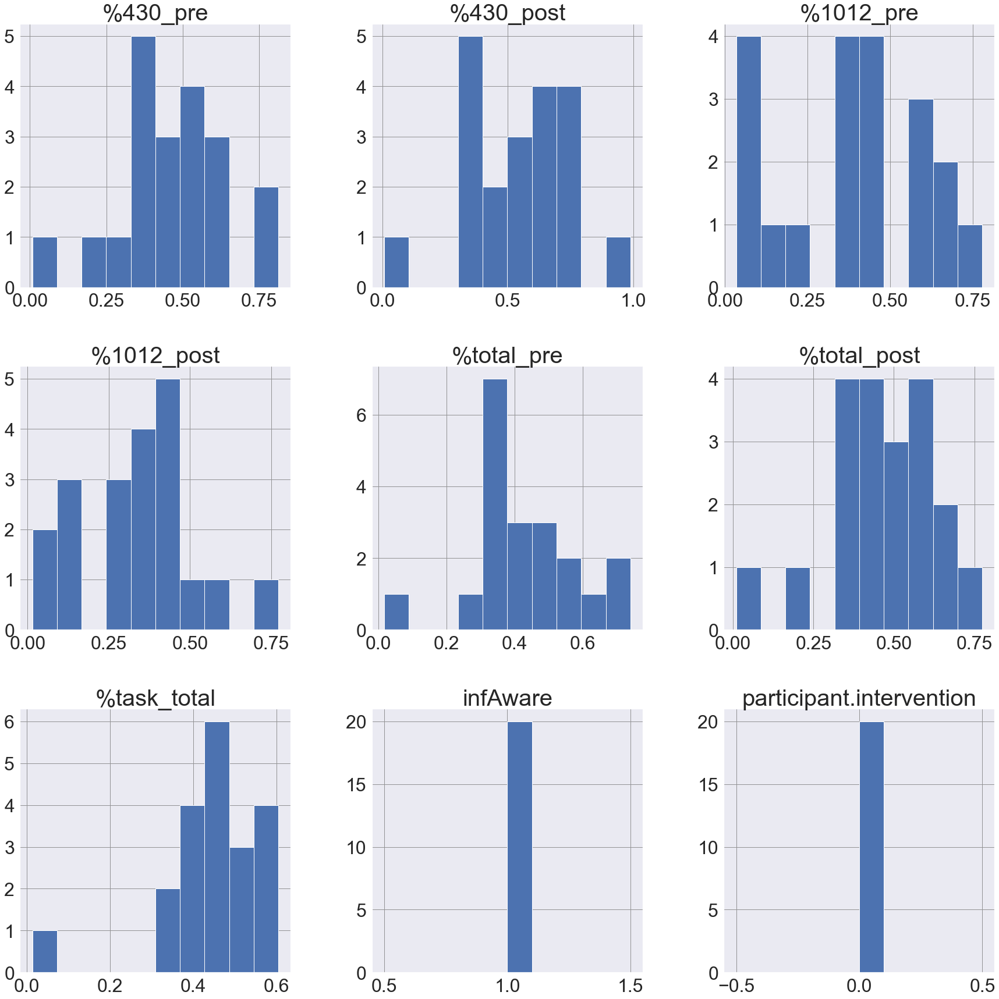

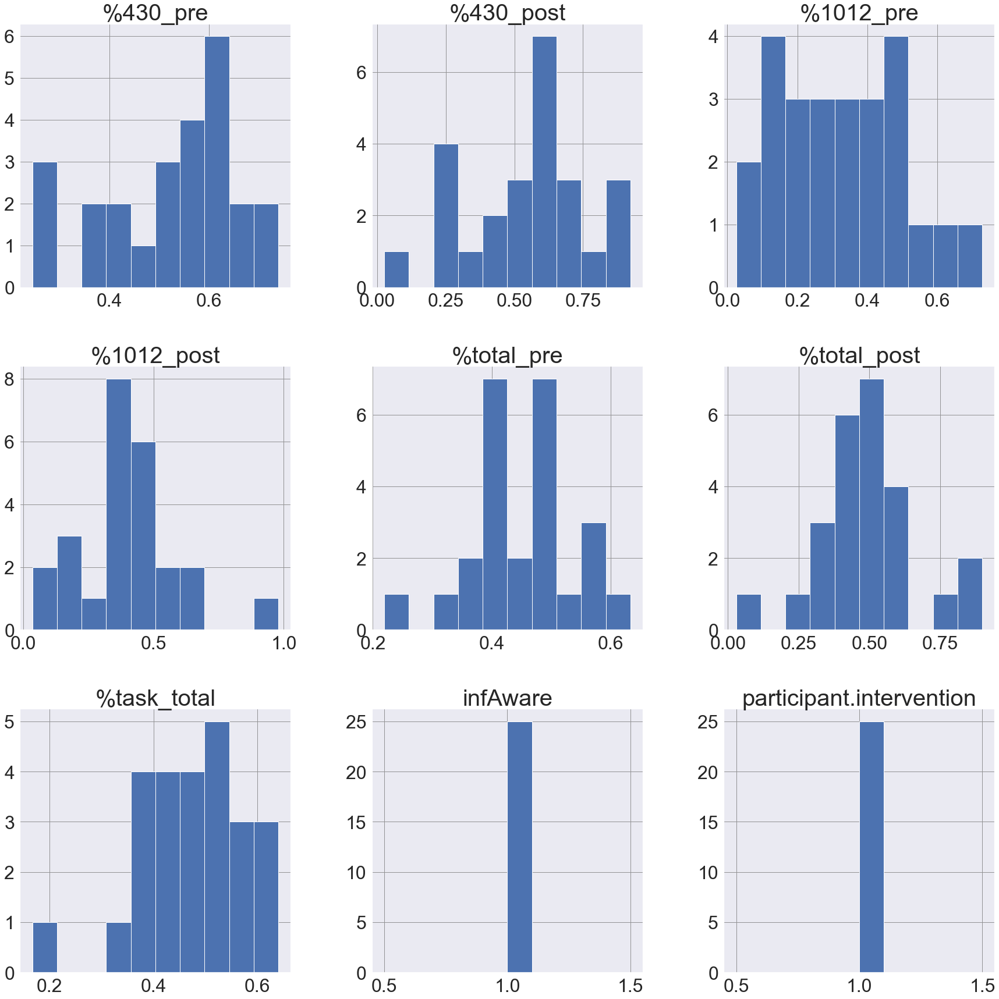

In [180]:
summary[['%430_pre', '%430_post', '%1012_pre', '%1012_post','%total_pre','%total_post', '%task_total','infAware','participant.intervention']].groupby(['infAware','participant.intervention']).hist(figsize=(30,30))
summary[['%430_pre', '%430_post', '%1012_pre', '%1012_post','%total_pre','%total_post', '%task_total','infAware','participant.intervention']].groupby(['infAware','participant.intervention']).mean().T

## Intervention

participant.intervention,0.0,1.0
%430_pre,0.480233,0.468480
%430_post,0.506330,0.519550
%1012_pre,0.359410,0.349967
%1012_post,0.404275,0.406300
%total_pre,0.435509,0.424611
%total_post,0.468553,0.477629
%task_total,0.452031,0.451120
%retard_1012_pre,0.407575,0.457169
%retard_1012_post,0.310071,0.348282
%retard_430_pre,0.145369,0.174443


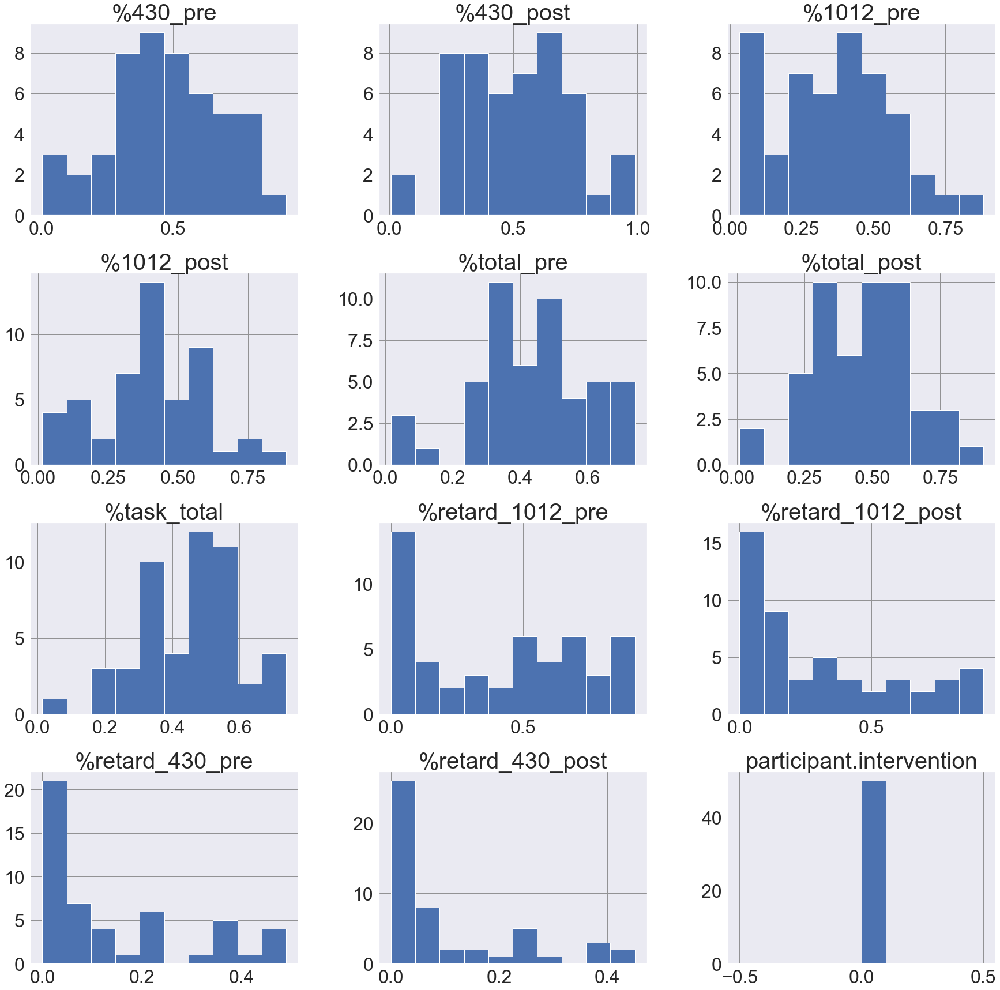

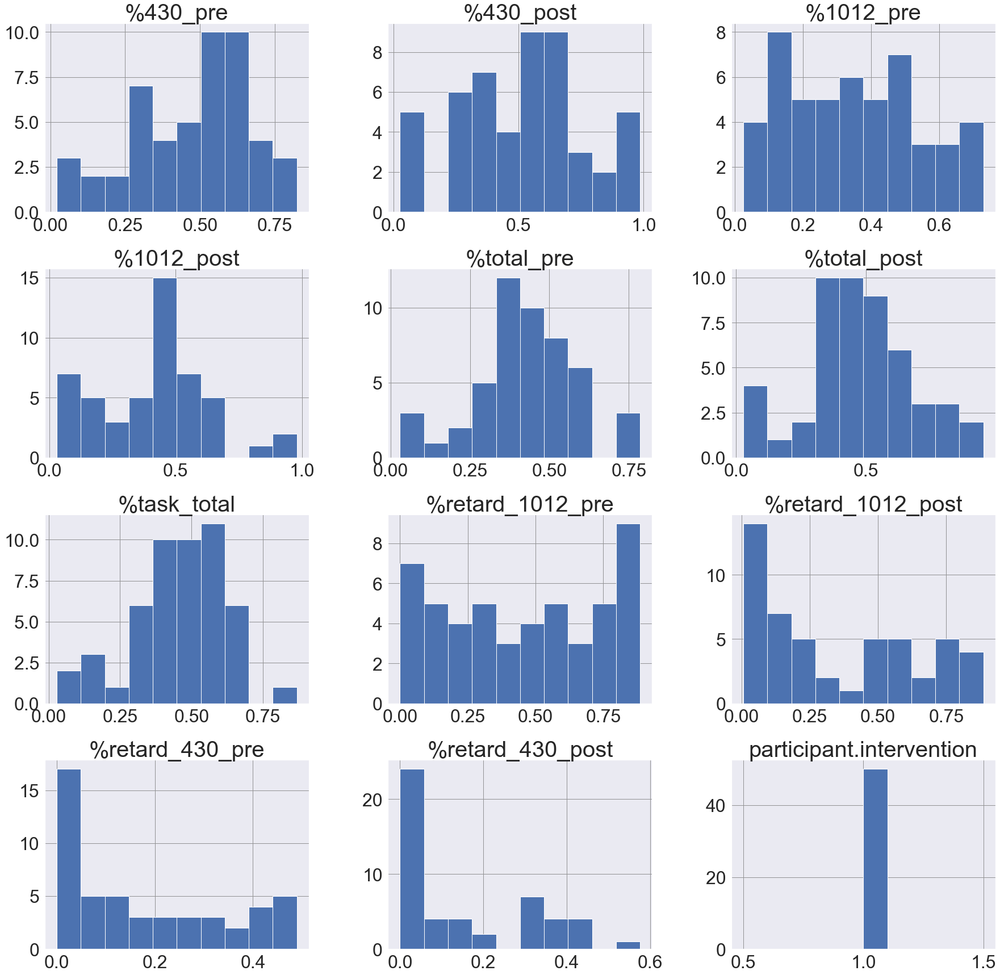

In [181]:
summary[['%430_pre', '%430_post', '%1012_pre', '%1012_post','%total_pre','%total_post', '%task_total','%retard_1012_pre', '%retard_1012_post', '%retard_430_pre', '%retard_430_post', 'participant.intervention']].groupby(['participant.intervention']).hist(figsize=(30,30))
summary[['%430_pre', '%430_post', '%1012_pre', '%1012_post','%total_pre','%total_post', '%task_total','%retard_1012_pre', '%retard_1012_post', '%retard_430_pre', '%retard_430_post', 'participant.intervention']].groupby(['participant.intervention']).mean().T

## Triumvirate

In [182]:
# summary[[
#     '%430_pre', '%430_post', '%1012_pre', '%1012_post', '%total_pre',
#     '%total_post','%task_total','finLit','numerate','infAware',
#     'participant.intervention'
#     ]].groupby([
#         'finLit','numerate','infAware','participant.intervention'
#         ]).hist(figsize=(30,30))
summary[[
    '%430_pre', '%430_post', '%1012_pre', '%1012_post', '%total_pre',
    '%total_post','%task_total','finLit','numerate','infAware',
    'participant.intervention'
    ]].groupby([
        'finLit','numerate','infAware','participant.intervention'
        ]).mean().T

finLit                           0                                          \
numerate                         0                                       1   
infAware                         0                   1                   0   
participant.intervention       0.0       1.0       0.0       1.0       0.0   
%430_pre                  0.444913  0.335914  0.535131  0.487953  0.806583   
%430_post                 0.473358  0.303391  0.420733  0.534834  0.829728   
%1012_pre                 0.341208  0.287109  0.264735  0.221915  0.491156   
%1012_post                0.411983  0.351541  0.358757  0.295641  0.505725   
%total_pre                0.406526  0.317848  0.435041  0.389476  0.689824   
%total_post               0.450639  0.321214  0.397792  0.446294  0.709795   
%task_total               0.428582  0.319531  0.416416  0.417885  0.699809   

finLit                                     1                                \
numerate                                   0                                 
infAware                         1         0                   1             
participant.intervention       0.0       0.0       1.0       0.0       1.0   
%430_pre                  0.516662  0.500426  0.385466  0.398428  0.491335   
%430_post                 0.742778  0.486413  0.584447  0.556269  0.466042   
%1012_pre                 0.113068  0.335181  0.385192  0.486019  0.315539   
%1012_post                0.333015  0.473298  0.459708  0.358301  0.407777   
%total_pre                0.367267  0.439259  0.385365  0.430851  0.426262   
%total_post               0.591100  0.481558  0.538274  0.482989  0.444475   
%task_total               0.479183  0.460408  0.461819  0.456920  0.435368   

finLit                                                            
numerate                         1                                
infAware                         0                   1            
participant.intervention       0.0       1.0       0.0       1.0  
%430_pre                  0.564625  0.597961  0.619835  0.569758  
%430_post                 0.437935  0.708680  0.617907  0.651556  
%1012_pre                 0.302423  0.518154  0.268387  0.369747  
%1012_post                0.459061  0.467577  0.235663  0.418465  
%total_pre                0.467568  0.568419  0.489743  0.495721  
%total_post               0.445755  0.619433  0.476415  0.565275  
%task_total               0.456662  0.593926  0.483079  0.530498

## Inflation perceptions

C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/1679327284.py:15: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  inf[[c for c in cols if 'infK' in c ]].hist(ax=ax,color='#f13c46',bins=20)


,count,mean,std,min,25%,50%,75%,max
infK_1,214.0,16.957477,17.455537,-34.9,7.725,11.40,17.400,100.0
infK_2,214.0,0.177570,12.843722,-85.3,-0.175,0.60,1.900,95.6
infK_3,214.0,11.064486,14.335420,-32.8,5.725,7.10,10.075,91.0
infK_4,214.0,9.453738,11.689177,0.0,5.600,6.50,8.200,96.1
infK_5,214.0,15.571963,16.796519,-2.8,6.900,10.30,17.650,100.0
infK_6,214.0,14.095327,16.235930,0.0,5.300,9.25,15.000,98.2


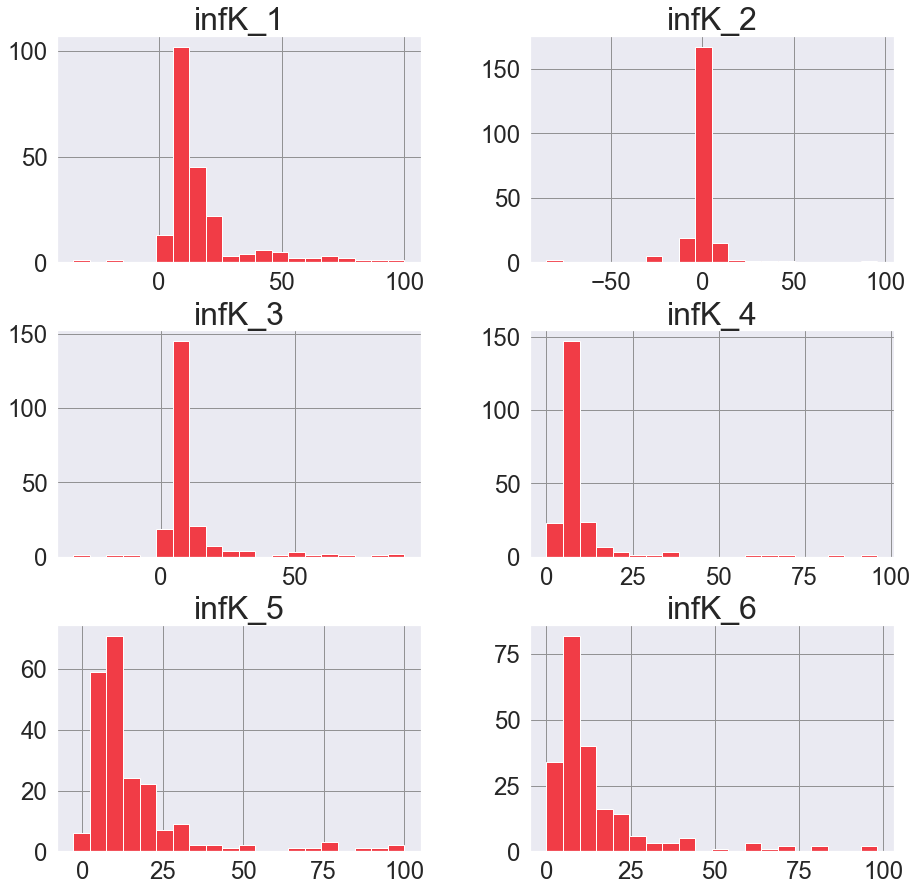

In [183]:
inf = final_df_dict['Inflation'].copy()

cols = inf.columns.to_list()
cols = [c.replace('Inflation.1.player.','') for c in cols]
inf.columns = cols

params = {'axes.titlesize':'32',
          'xtick.labelsize':'24',
          'ytick.labelsize':'24'}
plt.rcParams.update(params)
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
# inf[cols2].hist(ax=ax,color='#f13c46')

inf[[c for c in cols if 'infK' in c ]].hist(ax=ax,color='#f13c46',bins=20)
inf[[c for c in cols if 'infK' in c ]].describe().T

C:\Users\nlawrenc\AppData\Local\Temp/ipykernel_6116/3970412206.py:15: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  inf[[c for c in cols if 'infCI' in c ]].hist(ax=ax,color='#f13c46',bins=20)


,count,mean,std,min,25%,50%,75%,max
infCI_1,214.0,1136.686916,627.700461,100.0,1100.0,1100.0,1100.0,9990.0
infCI_2,214.0,1.897196,0.572197,1.0,2.0,2.0,2.0,3.0
infCI_3,214.0,1.883178,0.565351,1.0,2.0,2.0,2.0,3.0
infCI_4,214.0,22558.093458,12721.527872,0.0,6000.0,32000.0,32000.0,50000.0


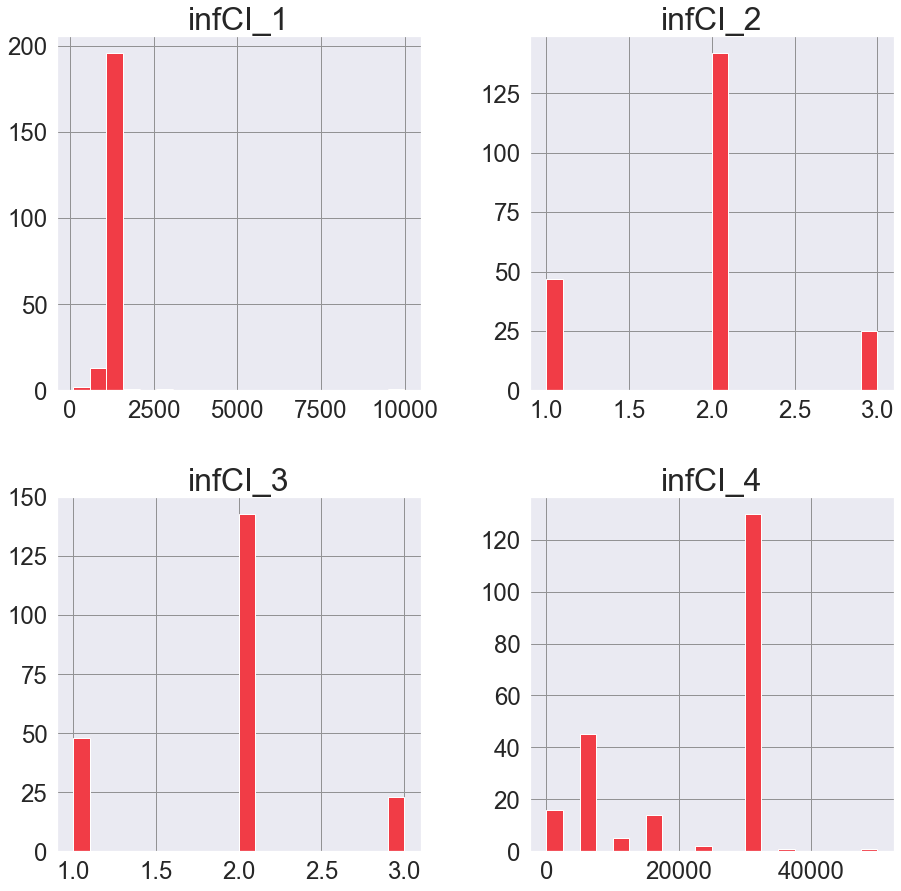

In [184]:
inf = final_df_dict['Inflation'].copy()

cols = inf.columns.to_list()
cols = [c.replace('Inflation.1.player.','') for c in cols]
inf.columns = cols

params = {'axes.titlesize':'32',
          'xtick.labelsize':'24',
          'ytick.labelsize':'24'}
plt.rcParams.update(params)
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
# inf[cols2].hist(ax=ax,color='#f13c46')

inf[[c for c in cols if 'infCI' in c ]].hist(ax=ax,color='#f13c46',bins=20)
inf[[c for c in cols if 'infCI' in c ]].describe().T

## Compound interest calculations

In [185]:
# summary[['task_total','excess_total', 'early_total', 'late_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).hist(figsize=(30,30))
summary[['task_total','excess_total', 'early_total', 'late_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().T

CI_4_correct_post,0.0,1.0
task_total,4795.076341,6679.384407
excess_total,1361.596627,502.095984
early_total,4076.822790,2756.119451
late_total,2849.371655,3142.607759


df_CI_4_correct_post (100, 278)
df_CI_4_correct_post (100, 278)
nn_ttmean 4795.076341463415
nn_exmean 1361.5966268256097
nn_ertmean 4076.8227899682192
nn_lamean 2849.371655492268
nn_ttstd 2004.1333801056708
nn_exstd 2047.4979759768703
nn_ertstd 2511.3009711756167
nn_lastd 1966.6211757805731
num_ttmean 6679.384406779661
num_exmean 502.09598358949154
num_ertmean 2756.1194508118474
num_lamean 3142.607759306102
num_ttstd 1667.080866493441
num_exstd 1086.9682204178853
num_ertstd 2099.1527541984133
num_lastd 2075.672462003074


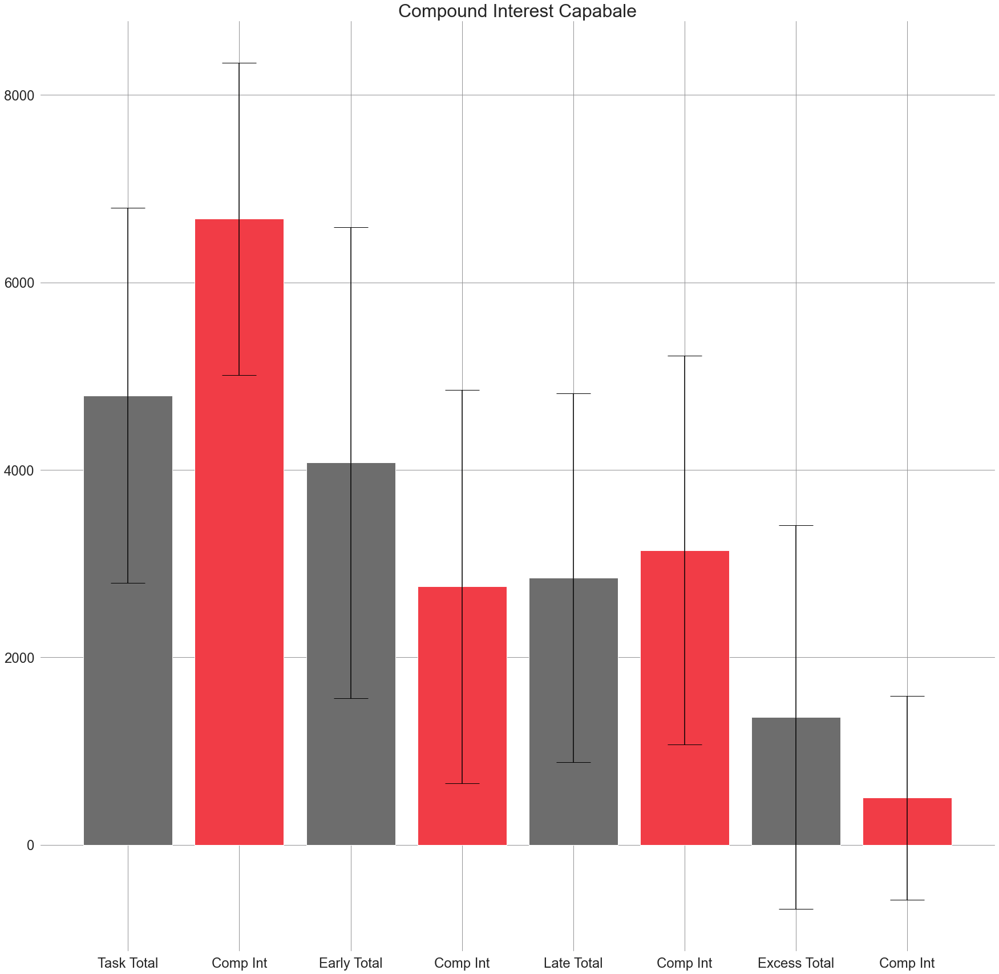

In [186]:
df_CI_4_correct_post = summary.copy()
print('df_CI_4_correct_post', df_CI_4_correct_post.shape)
df_CI_4_correct_post.drop_duplicates(inplace=True)
print('df_CI_4_correct_post', df_CI_4_correct_post.shape)

# summary[['%total_pre','%total_post', '%task_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).describe().T
df_CI_4_correct_post[['task_total','excess_total', 'early_total', 'late_total', 'CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean()

nn_ttmean = df_CI_4_correct_post[['task_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().iloc[0,0]
print('nn_ttmean', nn_ttmean)
nn_exmean = df_CI_4_correct_post[['excess_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().iloc[0,0]
print('nn_exmean', nn_exmean)
nn_ertmean = df_CI_4_correct_post[['early_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().iloc[0,0]
print('nn_ertmean', nn_ertmean)
nn_lamean = df_CI_4_correct_post[['late_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().iloc[0,0]
print('nn_lamean', nn_lamean)
nn_ttstd = df_CI_4_correct_post[['task_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).std().iloc[0,0]
print('nn_ttstd', nn_ttstd)
nn_exstd = df_CI_4_correct_post[['excess_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).std().iloc[0,0]
print('nn_exstd', nn_exstd)
nn_ertstd = df_CI_4_correct_post[['early_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).std().iloc[0,0]
print('nn_ertstd', nn_ertstd)
nn_lastd = df_CI_4_correct_post[['late_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).std().iloc[0,0]
print('nn_lastd', nn_lastd)

num_ttmean = df_CI_4_correct_post[['task_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().iloc[1,0]
print('num_ttmean', num_ttmean)
num_exmean = df_CI_4_correct_post[['excess_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().iloc[1,0]
print('num_exmean', num_exmean)
num_ertmean = df_CI_4_correct_post[['early_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().iloc[1,0]
print('num_ertmean', num_ertmean)
num_lamean = df_CI_4_correct_post[['late_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).mean().iloc[1,0]
print('num_lamean', num_lamean)
num_ttstd = df_CI_4_correct_post[['task_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).std().iloc[1,0]
print('num_ttstd', num_ttstd)
num_exstd = df_CI_4_correct_post[['excess_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).std().iloc[1,0]
print('num_exstd', num_exstd)
num_ertstd = df_CI_4_correct_post[['early_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).std().iloc[1,0]
print('num_ertstd', num_ertstd)
num_lastd = df_CI_4_correct_post[['late_total','CI_4_correct_post']].groupby(['CI_4_correct_post',]).std().iloc[1,0]
print('num_lastd', num_lastd)



## Define labels, positions, bar heights and error bar heights
labels = [
    'Task Total', 
    'Comp Int', 
    'Early Total', 
    'Comp Int', 
    'Late Total',  
    'Comp Int', 
    'Excess Total',
    'Comp Int', 
]
x_pos = np.arange(len(labels))
data = [nn_ttmean, num_ttmean, nn_ertmean, num_ertmean, nn_lamean, num_lamean, nn_exmean, num_exmean]
error = [nn_ttstd, num_ttstd, nn_ertstd, num_ertstd, nn_lastd, num_lastd, nn_exstd, num_exstd]

# Build the plot
fig, ax = plt.subplots(figsize=(30,30))
colors = ['#6d6d6d','#f13c46','#6d6d6d','#f13c46','#6d6d6d','#f13c46','#6d6d6d','#f13c46',]
datalist = ax.bar(x_pos, data,
       yerr=error,
       align='center',
       color=colors,
       alpha=1,
       ecolor='black',
       capsize=30)

ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_title('Compound Interest Capabale')
ax.yaxis.grid(True)
ax.set_facecolor('w')
params = {'axes.titlesize':'40',
          'xtick.labelsize':'32',
          'ytick.labelsize':'32'}
plt.rcParams.update(params)
plt.rcParams.update({"axes.grid" : True, "grid.color": "#929294"})

# Save the figure and show
# plt.tight_layout()
# plt.savefig('comparison.png')
plt.show()

### P values

In [187]:
import numpy as np
from scipy.stats import normaltest, kstest, ttest_ind

v = df_CI_4_correct_post[['task_total','excess_total', 'early_total', 'late_total', 'CI_4_correct_post']]
v1 = df_CI_4_correct_post[['task_total','excess_total', 'early_total', 'late_total']][df_CI_4_correct_post['CI_4_correct_post'] == 1]
v2 = df_CI_4_correct_post[['task_total','excess_total', 'early_total', 'late_total']][df_CI_4_correct_post['CI_4_correct_post'] == 0]

print('ttest', ttest_ind(v1, v2, equal_var=True))

print('normaltest', normaltest(v))

ttest Ttest_indResult(statistic=array([ 5.1139202 , -2.72283725, -2.85346955,  0.70980608]), pvalue=array([1.56588101e-06, 7.66274394e-03, 5.27652275e-03, 4.79509912e-01]))
normaltest NormaltestResult(statistic=array([  4.76685798,  68.27498541,  12.35235852,   6.76763877,
       961.72210289]), pvalue=array([9.22337662e-002, 1.49374097e-015, 2.07835355e-003, 3.39176624e-002,
       1.46116343e-209]))


# Correlations

# Intervention differences

## p values

In [188]:
import numpy as np
from scipy.stats import normaltest, kstest, ttest_ind

diff = summary.copy()
diff['diff_1012_total'] = diff['1012_post'] - diff['1012_pre']
diff['diff_1012_excess'] = diff['exces_1012_post'] - diff['exces_1012_pre']
diff['diff_1012_early'] = diff['precoce_1012_post'] - diff['precoce_1012_pre']
diff['diff_1012_late'] = diff['retard_1012_post'] - diff['retard_1012_pre']
diff['diff_430_total'] = diff['430_post'] - diff['430_pre']
diff['diff_430_excess'] = diff['exces_430_post'] - diff['exces_430_pre']
diff['diff_430_early'] = diff['precoce_430_post'] - diff['precoce_430_pre']
diff['diff_430_late'] = diff['retard_430_post'] - diff['retard_430_pre']
diff['diff_total'] = diff['total_post'] - diff['total_pre']
diff['diff_excess'] = diff['excess_post'] - diff['excess_pre']
diff['diff_early'] = diff['early_post'] - diff['early_pre']
diff['diff_late'] = diff['late_post'] - diff['late_pre']

diff[['participant.intervention',
'diff_1012_total',
'diff_1012_excess',
'diff_1012_early',
'diff_1012_late',
'diff_430_total',
'diff_430_excess',
'diff_430_early',
'diff_430_late',
'diff_total',
'diff_excess',
'diff_early',
'diff_late']]

v = diff[['participant.intervention',
'diff_1012_total',
'diff_1012_excess',
'diff_1012_early',
'diff_1012_late',
'diff_430_total',
'diff_430_excess',
'diff_430_early',
'diff_430_late',
'diff_total',
'diff_excess',
'diff_early',
'diff_late']]

v1 = diff[[
'diff_1012_total',
'diff_1012_excess',
'diff_1012_early',
'diff_1012_late',
'diff_430_total',
'diff_430_excess',
'diff_430_early',
'diff_430_late',
'diff_total',
'diff_excess',
'diff_early',
'diff_late']][diff['participant.intervention'] == 1]

v2 = diff[[
'diff_1012_total',
'diff_1012_excess',
'diff_1012_early',
'diff_1012_late',
'diff_430_total',
'diff_430_excess',
'diff_430_early',
'diff_430_late',
'diff_total',
'diff_excess',
'diff_early',
'diff_late']][diff['participant.intervention'] == 0]

print('ttest', ttest_ind(v1, v2, equal_var=True))

print('normaltest', normaltest(v))

from scipy.stats import chi2_contingency

contingency_table = (
    v
    .assign(placeholder=1)
    .pivot_table(index="participant.intervention", columns="diff_total", values="placeholder", aggfunc="sum")
    .values
)

_, p, _, _ = chi2_contingency(contingency_table, lambda_="log-likelihood")

# p-value
p

ttest Ttest_indResult(statistic=array([ 0.22576834,  0.71784738, -0.36065519, -0.15187072,  0.52948999,
       -1.13632876, -0.24577151,  0.72048803,  0.53626051, -0.68684485,
       -0.3547596 ,  0.29164721]), pvalue=array([0.82185177, 0.47455916, 0.71913345, 0.87960112, 0.59766303,
       0.25859011, 0.8063731 , 0.47293964, 0.5929937 , 0.49380259,
       0.72353199, 0.77117282]))
normaltest NormaltestResult(statistic=array([8.02577826e+02, 4.37099965e+00, 2.00764950e+01, 1.17128154e+00,
       1.84272010e+00, 6.33171664e+00, 4.08275429e+01, 1.56585012e+00,
       1.07013543e+01, 6.11019238e+00, 3.08898676e+01, 2.60406635e-01,
       1.20966069e+01]), pvalue=array([5.27763731e-175, 1.12421528e-001, 4.36962840e-005, 5.56748999e-001,
       3.97977403e-001, 4.21779242e-002, 1.36273595e-009, 4.57067106e-001,
       4.74493678e-003, 4.71181883e-002, 1.96042611e-007, 8.77916917e-001,
       2.36186560e-003]))


nan

## Histogram

df (100, 5)
df (100, 5)
nn_ttmean 216.11419999999998
nn_exmean -94.74408011599999
nn_ertmean 302.75744905612004
nn_lamean -424.3658253086601
nn_ttstd 1197.8484421135408
nn_exstd 699.524826868996
nn_ertstd 1313.6376232758482
nn_lastd 1217.9242798428909
num_ttmean 346.7524000000001
num_exmean -195.8840256818
num_ertmean 199.83189928271995
num_lamean -352.65643764699996
num_ttstd 1237.9178632598353
num_exstd 771.2567105978932
num_ertstd 1575.771959923044
num_lastd 1240.741460237428


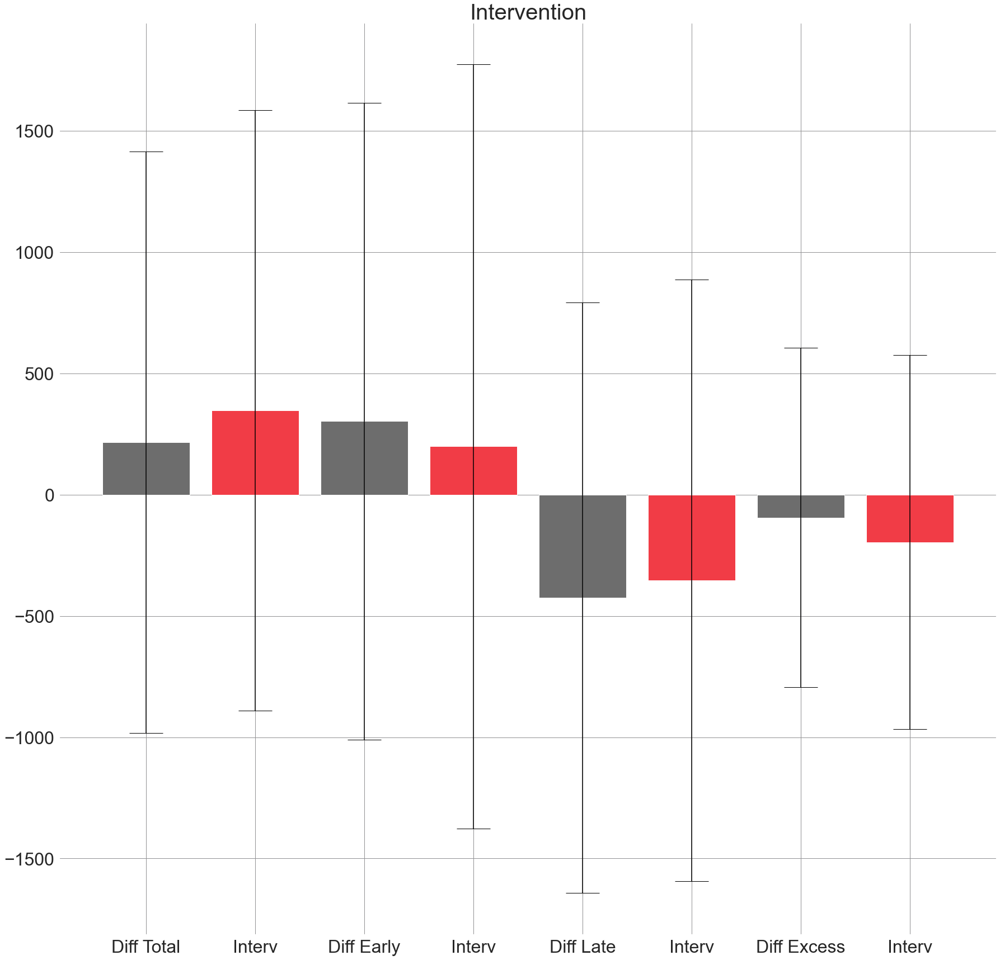

In [189]:
df = diff[['participant.intervention',
'diff_total',
'diff_excess',
'diff_early',
'diff_late']]

print('df', df.shape)
df.drop_duplicates(inplace=True)
print('df', df.shape)

# summary[['%total_pre','%total_post', '%diff_total','participant.intervention']].groupby(['participant.intervention',]).describe().T
df[['diff_total','diff_excess', 'diff_early', 'diff_late', 'participant.intervention']].groupby(['participant.intervention',]).mean()

nn_ttmean = df[['diff_total','participant.intervention']].groupby(['participant.intervention',]).mean().iloc[0,0]
print('nn_ttmean', nn_ttmean)
nn_exmean = df[['diff_excess','participant.intervention']].groupby(['participant.intervention',]).mean().iloc[0,0]
print('nn_exmean', nn_exmean)
nn_ertmean = df[['diff_early','participant.intervention']].groupby(['participant.intervention',]).mean().iloc[0,0]
print('nn_ertmean', nn_ertmean)
nn_lamean = df[['diff_late','participant.intervention']].groupby(['participant.intervention',]).mean().iloc[0,0]
print('nn_lamean', nn_lamean)
nn_ttstd = df[['diff_total','participant.intervention']].groupby(['participant.intervention',]).std().iloc[0,0]
print('nn_ttstd', nn_ttstd)
nn_exstd = df[['diff_excess','participant.intervention']].groupby(['participant.intervention',]).std().iloc[0,0]
print('nn_exstd', nn_exstd)
nn_ertstd = df[['diff_early','participant.intervention']].groupby(['participant.intervention',]).std().iloc[0,0]
print('nn_ertstd', nn_ertstd)
nn_lastd = df[['diff_late','participant.intervention']].groupby(['participant.intervention',]).std().iloc[0,0]
print('nn_lastd', nn_lastd)

num_ttmean = df[['diff_total','participant.intervention']].groupby(['participant.intervention',]).mean().iloc[1,0]
print('num_ttmean', num_ttmean)
num_exmean = df[['diff_excess','participant.intervention']].groupby(['participant.intervention',]).mean().iloc[1,0]
print('num_exmean', num_exmean)
num_ertmean = df[['diff_early','participant.intervention']].groupby(['participant.intervention',]).mean().iloc[1,0]
print('num_ertmean', num_ertmean)
num_lamean = df[['diff_late','participant.intervention']].groupby(['participant.intervention',]).mean().iloc[1,0]
print('num_lamean', num_lamean)
num_ttstd = df[['diff_total','participant.intervention']].groupby(['participant.intervention',]).std().iloc[1,0]
print('num_ttstd', num_ttstd)
num_exstd = df[['diff_excess','participant.intervention']].groupby(['participant.intervention',]).std().iloc[1,0]
print('num_exstd', num_exstd)
num_ertstd = df[['diff_early','participant.intervention']].groupby(['participant.intervention',]).std().iloc[1,0]
print('num_ertstd', num_ertstd)
num_lastd = df[['diff_late','participant.intervention']].groupby(['participant.intervention',]).std().iloc[1,0]
print('num_lastd', num_lastd)



## Define labels, positions, bar heights and error bar heights
labels = [
    'Diff Total', 
    'Interv', 
    'Diff Early', 
    'Interv', 
    'Diff Late',  
    'Interv', 
    'Diff Excess',
    'Interv', 
]
x_pos = np.arange(len(labels))
data = [nn_ttmean, num_ttmean, nn_ertmean, num_ertmean, nn_lamean, num_lamean, nn_exmean, num_exmean]
error = [nn_ttstd, num_ttstd, nn_ertstd, num_ertstd, nn_lastd, num_lastd, nn_exstd, num_exstd]

# Build the plot
fig, ax = plt.subplots(figsize=(30,30))
colors = ['#6d6d6d','#f13c46','#6d6d6d','#f13c46','#6d6d6d','#f13c46','#6d6d6d','#f13c46',]
datalist = ax.bar(x_pos, data,
       yerr=error,
       align='center',
       color=colors,
       alpha=1,
       ecolor='black',
       capsize=30)

ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_title('Intervention')
ax.yaxis.grid(True)
ax.set_facecolor('w')
params = {'axes.titlesize':'40',
          'xtick.labelsize':'32',
          'ytick.labelsize':'32'}
plt.rcParams.update(params)
plt.rcParams.update({"axes.grid" : True, "grid.color": "#929294"})

# Save the figure and show
# plt.tight_layout()
# plt.savefig('comparison.png')
plt.show()

In [190]:
import numpy as np
from scipy.stats import normaltest, kstest, ttest_ind

v = df[['participant.intervention',
'diff_total',
'diff_excess',
'diff_early',
'diff_late']]
v1 = df[['diff_total','diff_early', 'diff_late', 'diff_excess']][df['participant.intervention'] == 1]
v2 = df[['diff_total','diff_early', 'diff_late', 'diff_excess']][df['participant.intervention'] == 0]

print('ttest', ttest_ind(v1, v2, equal_var=True))

print('normaltest', normaltest(v))

ttest Ttest_indResult(statistic=array([ 0.53626051, -0.3547596 ,  0.29164721, -0.68684485]), pvalue=array([0.5929937 , 0.72353199, 0.77117282, 0.49380259]))
normaltest NormaltestResult(statistic=array([8.02577826e+02, 6.11019238e+00, 3.08898676e+01, 2.60406635e-01,
       1.20966069e+01]), pvalue=array([5.27763731e-175, 4.71181883e-002, 1.96042611e-007, 8.77916917e-001,
       2.36186560e-003]))


In [191]:
diff[['participant.intervention',
'diff_total',
'diff_excess',
'diff_early',
'diff_late']].groupby('participant.intervention').describe().T

participant.intervention          0.0          1.0
diff_total  count           50.000000    50.000000
            mean           216.114200   346.752400
            std           1197.848442  1237.917863
            min          -2379.180000 -2391.510000
            25%           -314.207500  -140.905000
            50%            150.775000   174.785000
            75%            822.327500   918.715000
            max           2937.640000  4446.760000
diff_excess count           50.000000    50.000000
            mean           -94.744080  -195.884026
            std            699.524827   771.256711
            min          -2390.968074 -3041.804854
            25%           -137.427210  -323.621119
            50%              0.000000     0.000000
            75%              0.000000     1.798508
            max           3588.796231  2033.568519
diff_early  count           50.000000    50.000000
            mean           302.757449   199.831899
            std           1313.637623  1575.771960
            min          -2136.377343 -3149.356538
            25%           -598.569879  -545.012852
            50%            113.686112     0.000000
            75%           1377.698448   931.711238
            max           3108.224117  3568.951833
diff_late   count           50.000000    50.000000
            mean          -424.365825  -352.656438
            std           1217.924280  1240.741460
            min          -2757.524406 -2773.855110
            25%          -1153.958060 -1237.364400
            50%           -444.445966  -370.824085
            75%             55.515949   124.271230
            max           3501.439137  3621.061886

# Generator: Correlation matrices

In [192]:
print(summary.columns.to_list())

['participant.label', 'participant.intervention', 'wisc.n_corr', 'wisc.n_cat', 'wisc.n_PE', 'wisc.n_SE', 'risk.n_safe', 'loss.n_toss', 'loss.n_switch', 'BRET.1.n_collect', 'BRET.2.n_collect', '3.n_present', '5.n_present', '6.n_present', '3.n_switches', '5.n_switches', '6.n_switches', '430_pre', '430_post', '1012_pre', '1012_post', 'task_total', 'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 'retard_1012_post', 'retard_430_pre', 'retard_430_post', 'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre', 'opp_cost_430_post', 're/(ex+pr)_430_pre', 're/(ex+pr)_430_post', 're/(ex+pr)_1012_pre', 're/(ex+pr)_1012_post', 'excess_pre', 'excess_post', 'excess_total', 'early_pre', 'early_post', 'early_total', 'late_pre', 'late_post', 'late_total', 'inf_9_cheaper', 'inf_9_lessInflated', 'inf_9_quantity', 'inf_9_stockMaintained', 'inf_9_leisure', 'inf_9_subscription', 'i

shape before dropna (100, 36)
shape after dropna (100, 36)


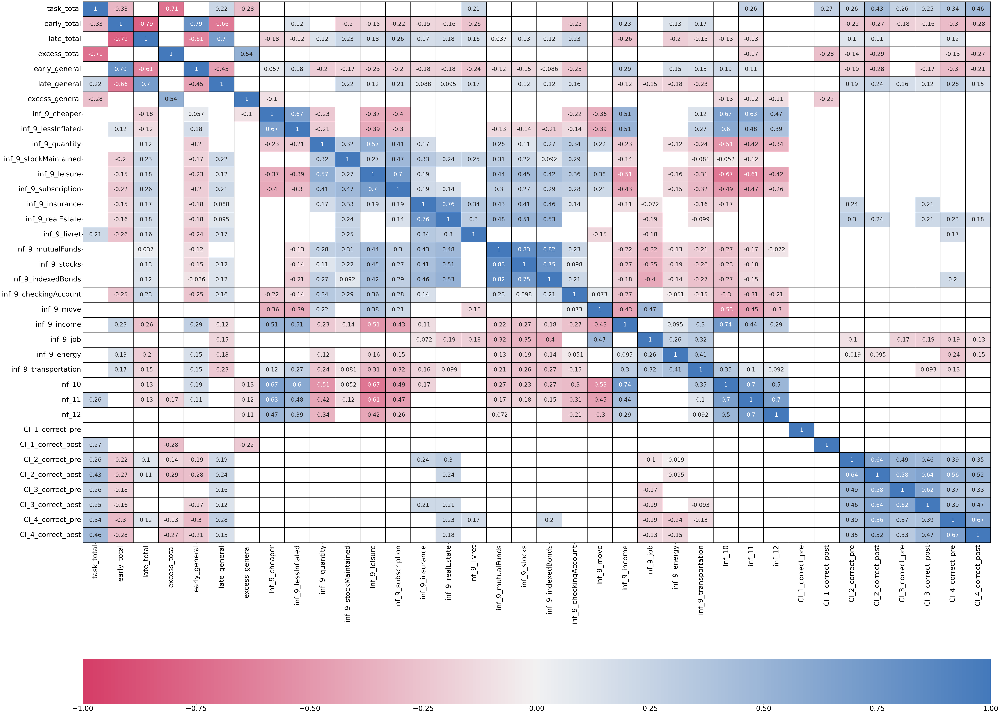

In [193]:
import matplotlib.pyplot as plt
plt.rcParams.update(plt.rcParamsDefault)

cogn2 = summary.copy()

# ## Re-code investment preferences, Not applicable = NaN
# cols = ['stocks',
#        'mutualFunds', 'bonds', 'savingsAccounts', 'lifeInsurance',
#        'retirementAccounts', 'crypto', 'invP_1', 'responseTime_1',
#        'invP_2_assurance', 'responseTime_2_assurance', 'invP_2_logement',
#        'responseTime_2_logement', 'invP_2_livret', 'responseTime_2_livret',
#        'invP_2_fonds', 'responseTime_2_fonds', 'invP_2_actions',
#        'responseTime_2_actions', 'invP_3', 'responseTime_3',
#        ]
# for i in range(len(cogn2)):
#     for c in cols:
#         cogn2[c].iloc[i] = np.nan if cogn2[c].iloc[i] == 9 else cogn2[c].iloc[i]

cols = [
    # 'participant.label',
        # '%task_total', '%total_pre', '%total_post',
        # '%430_pre', '%430_post', '%1012_pre', '%1012_post', 
        # '%exces_1012_pre', '%exces_1012_post', '%exces_430_pre', '%exces_430_post', 
        # '%precoce_1012_pre', '%precoce_1012_post', '%precoce_430_pre', '%precoce_430_post', 
        # '%retard_1012_pre', '%retard_1012_post', '%retard_430_pre', '%retard_430_post', 
        # '%opp_cost_1012_pre', '%opp_cost_1012_post', '%opp_cost_430_pre',
        # '430_pre', '430_post', '1012_pre', '1012_post', 
                    'task_total',
                    'early_total', 'late_total','excess_total',
    # 'early_1012_pre', 'early_1012_post', 'early_430_pre', 'early_430_post', 
    'early_general',
    # 'late_1012_pre', 'late_1012_post', 'late_430_pre', 'late_430_post', 
    'late_general', 
    # 'excess_1012_pre', 'excess_1012_post', 'excess_430_pre', 'excess_430_post', 
    'excess_general',
        #             'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 
        #             'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 
        #             'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 
        #             'retard_1012_post', 'retard_430_pre', 'retard_430_post', 
    #     'lateOpt_1012_pre', 'lateOpt_1012_post', 'lateOpt_430_pre', 'lateOpt_430_post',
    # 'trial_1_RT', 'trial_2_RT', 'trial_3_RT',
    # 'trial_4_RT', 'trial_5_RT', 'trial_6_RT', 'trial_7_RT', 'trial_8_RT',
    # 'trial_9_RT', 'trial_10_RT', 'trial_11_RT', 'trial_12_RT',
    # 'trial_13_RT', 'trial_14_RT', 'trial_15_RT', 'trial_16_RT',
    # 'trial_17_RT', 'trial_18_RT', 'trial_19_RT', 'trial_20_RT',
    # 'trial_21_RT', 'trial_22_RT', 'trial_23_RT', 'trial_24_RT',
    # 'trial_25_RT', 'trial_26_RT', 'trial_27_RT', 'trial_28_RT',
    # 'trial_29_RT', 'trial_30_RT'
    #    'mean_realPos_1012_pre', 'mean_realNeg_1012_pre', 
    #    'mean_realPos_1012_post', 
    #    'mean_realNeg_1012_post',
    #    'mean_realPos_430_pre', 'mean_realNeg_430_pre', 
    #    'mean_realPos_430_post', 'mean_realNeg_430_post', 
    #    'mean_increase_1012_pre', 'mean_decrease_1012_pre', 
    #    'mean_increase_1012_post', 'mean_decrease_1012_post',  'mean_increase_430_pre', 
    #    'mean_decrease_430_pre',
    #    'mean_increase_430_post', 
    #    'mean_decrease_430_post', 'mean_low_430_pre', 'mean_high_430_pre', 
    #    'mean_low_430_post', 'mean_high_430_post',
    #    'Inflation.1.player.responseTime_CI1_pre',
    #    'Inflation.1.player.responseTime_CI1_post', 
    #    'Inflation.1.player.responseTime_CI2_pre', 
    #    'Inflation.1.player.responseTime_CI2_post', 
    #    'Inflation.1.player.responseTime_CI3_pre', 
    #    'Inflation.1.player.responseTime_CI3_post', 
    #    'Inflation.1.player.responseTime_CI4_pre', 
    #    'Inflation.1.player.responseTime_CI4_post', 
    #    'infCI_1_accuracy_pre', 
    #    'infCI_1_accuracy_post', 
    #    'infCI_4_accuracy_pre', 
    #    'infCI_4_accuracy_post', 
    #                 'finLit', 'numerate', 
    #                 'numerate2',
    #                 'infAware',
    #                 'wisc.n_corr',
    #                 'risk.n_safe',
    #                 'loss.n_toss',
    #                 'BRET.1.n_collect', 'BRET.2.n_collect',
    #                 '3.n_present', '5.n_present', '6.n_present',
    # 'age',
    #     'stocks', 'mutualFunds', 'bonds', 'savingsAccounts', 'lifeInsurance',
    #     'retirementAccounts', 'crypto',
                    # 'demo_1',
    #    'mean_realPos_1012_pre', 'mean_realNeg_1012_pre', 
    #    'mean_realPos_1012_post', 
    #    'mean_realNeg_1012_post',
    #    'mean_realPos_430_pre', 'mean_realNeg_430_pre', 
    #    'mean_realPos_430_post', 'mean_realNeg_430_post', 
    #    'mean_increase_1012_pre', 'mean_decrease_1012_pre', 
    #    'mean_increase_1012_post', 'mean_decrease_1012_post',  'mean_increase_430_pre', 
    #    'mean_decrease_430_pre',
    #    'mean_increase_430_post', 
    #    'mean_decrease_430_post', 'mean_low_430_pre', 'mean_high_430_pre', 
    #    'mean_low_430_post', 'mean_high_430_post',
    #    'expect_life_2', 'expect_life_4', 
    #                 'mean_percep_life_2', 'mean_percep_life_4', 
    #     'avgExpectations', 'avgPerceptions',
                    'inf_9_cheaper',
                    'inf_9_lessInflated',
                    'inf_9_quantity',
                    'inf_9_stockMaintained',
                    'inf_9_leisure',
                    'inf_9_subscription',
                    'inf_9_insurance',
                    'inf_9_realEstate',
                    'inf_9_livret',
                    'inf_9_mutualFunds',
                    'inf_9_stocks',
                    'inf_9_indexedBonds',
                    'inf_9_checkingAccount',
                    'inf_9_move',
                    'inf_9_income',
                    'inf_9_job',
                    'inf_9_energy',
                    'inf_9_transportation',
                    'inf_10',
                    'inf_11',
                    'inf_12',
       'CI_1_correct_pre', 
       'CI_1_correct_post', 
       'CI_2_correct_pre', 
       'CI_2_correct_post', 
       'CI_3_correct_pre', 
       'CI_3_correct_post', 
       'CI_4_correct_pre', 
       'CI_4_correct_post',
        # 'age', 
        # '1012_pre_accuracy_1', '1012_pre_accuracy_2', '1012_pre_accuracy_3', '1012_pre_accuracy_4', '1012_pre_accuracy_5', 
        # '1012_post_accuracy_1', '1012_post_accuracy_2', '1012_post_accuracy_3', '1012_post_accuracy_4', '1012_post_accuracy_5', 
        # '430_pre_accuracy_1', '430_pre_accuracy_2', '430_pre_accuracy_3', '430_pre_accuracy_4', '430_pre_accuracy_5', 
        # '430_post_accuracy_1','430_post_accuracy_2','430_post_accuracy_3','430_post_accuracy_4','430_post_accuracy_5',
       ]

df = cogn2[cols]

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.pearsonr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None, cmap=None):
    f, ax = plt.subplots(figsize=(70,60))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                # cosmetics
                annot=True, vmin=-1, vmax=1, center=0,
                cmap=cmap, linewidths=2, linecolor='black', cbar_kws={'orientation': 'horizontal'})

print('shape before dropna', df.shape)
# cols = df.columns.to_list()
# corr = corr.replace([np.inf, -np.inf], 1)
df = df.dropna(axis=0)
print('shape after dropna', df.shape)

# Plotting with significance filter
cmap = sns.diverging_palette(1, 250, n=2, as_cmap=True)
corr = df.corr()                            # get correlation
p_values = corr_sig(corr)                     # get p-Value
# print(corr)
mask = np.invert(p_values<0.05)    # mask - only get significant corr


params = {'axes.titlesize':'24',
          'xtick.labelsize':'30',
          'ytick.labelsize':'30',
          'font.size':'24'}
plt.rcParams.update(params)

plot_cor_matrix(corr,mask, cmap) 
# print(p_values)

In [194]:
df[df.isna().any(axis=1)]

,task_total,early_total,late_total,excess_total,early_general,late_general,excess_general,inf_9_cheaper,inf_9_lessInflated,inf_9_quantity,inf_9_stockMaintained,inf_9_leisure,inf_9_subscription,inf_9_insurance,inf_9_realEstate,inf_9_livret,inf_9_mutualFunds,inf_9_stocks,inf_9_indexedBonds,inf_9_checkingAccount,inf_9_move,inf_9_income,inf_9_job,inf_9_energy,inf_9_transportation,inf_10,inf_11,inf_12,CI_1_correct_pre,CI_1_correct_post,CI_2_correct_pre,CI_2_correct_post,CI_3_correct_pre,CI_3_correct_post,CI_4_correct_pre,CI_4_correct_post


In [195]:
print(summary.shape)
summary[summary.isna().any(axis=1)]
# summary[['participant.label','mean_percep_life_2','mean_percep_life_4','expect_life_2','expect_life_4']].sort_values('participant.label')

(100, 278)


,participant.label,participant.intervention,wisc.n_corr,wisc.n_cat,wisc.n_PE,wisc.n_SE,risk.n_safe,loss.n_toss,loss.n_switch,BRET.1.n_collect,BRET.2.n_collect,3.n_present,5.n_present,6.n_present,3.n_switches,5.n_switches,6.n_switches,430_pre,430_post,1012_pre,1012_post,task_total,exces_1012_pre,exces_1012_post,exces_430_pre,exces_430_post,precoce_1012_pre,precoce_1012_post,precoce_430_pre,precoce_430_post,retard_1012_pre,retard_1012_post,retard_430_pre,retard_430_post,opp_cost_1012_pre,opp_cost_1012_post,opp_cost_430_pre,opp_cost_430_post,re/(ex+pr)_430_pre,re/(ex+pr)_430_post,re/(ex+pr)_1012_pre,re/(ex+pr)_1012_post,excess_pre,excess_post,excess_total,early_pre,early_post,early_total,late_pre,late_post,late_total,inf_9_cheaper,inf_9_lessInflated,inf_9_quantity,inf_9_stockMaintained,inf_9_leisure,inf_9_subscription,inf_9_insurance,inf_9_realEstate,inf_9_livret,inf_9_mutualFunds,inf_9_stocks,inf_9_indexedBonds,inf_9_checkingAccount,inf_9_move,inf_9_income,inf_9_job,inf_9_energy,inf_9_transportation,inf_10,inf_11,inf_12,finLit_2,finLit_4,numeracy_2,numeracy_4,numeracy2_2,numeracy2_4,inflation_2,inflation_4,demo_1,avg_acrcy,finLit,numerate,numerate2,infAware,lateOpt_1012_pre,mean_realPos_1012_pre,mean_realNeg_1012_pre,mean_increase_1012_pre,mean_decrease_1012_pre,lateOpt_1012_post,mean_realPos_1012_post,mean_realNeg_1012_post,mean_increase_1012_post,mean_decrease_1012_post,lateOpt_430_pre,mean_realPos_430_pre,mean_realNeg_430_pre,mean_increase_430_pre,mean_decrease_430_pre,mean_low_430_pre,mean_high_430_pre,lateOpt_430_post,mean_realPos_430_post,mean_realNeg_430_post,mean_increase_430_post,mean_decrease_430_post,mean_low_430_post,mean_high_430_post,mean_percep_life_2,mean_percep_life_4,expect_life_2,expect_life_4,stocks,mutualFunds,bonds,savingsAccounts,lifeInsurance,retirementAccounts,crypto,invP_1,responseTime_1,invP_2_assurance,responseTime_2_assurance,invP_2_logement,responseTime_2_logement,invP_2_livret,responseTime_2_livret,invP_2_fonds,responseTime_2_fonds,invP_2_actions,responseTime_2_actions,invP_3,responseTime_3,%430_pre,%430_post,%1012_pre,%1012_post,%task_total,%exces_1012_pre,%exces_1012_post,%exces_430_pre,%exces_430_post,%precoce_1012_pre,%precoce_1012_post,%precoce_430_pre,%precoce_430_post,%retard_1012_pre,%retard_1012_post,%retard_430_pre,%retard_430_post,%opp_cost_1012_pre,%opp_cost_1012_post,%opp_cost_430_pre,%opp_cost_430_post,excess_1012_pre,excess_1012_post,excess_430_pre,excess_430_post,excess_general,early_1012_pre,early_1012_post,early_430_pre,early_430_post,early_general,late_1012_pre,late_1012_post,late_430_pre,late_430_post,late_general,1012_pre_accuracy_1,430_pre_accuracy_1,1012_post_accuracy_1,430_post_accuracy_1,1012_pre_accuracy_2,430_pre_accuracy_2,1012_post_accuracy_2,430_post_accuracy_2,1012_pre_accuracy_3,430_pre_accuracy_3,1012_post_accuracy_3,430_post_accuracy_3,1012_pre_accuracy_4,430_pre_accuracy_4,1012_post_accuracy_4,430_post_accuracy_4,1012_pre_accuracy_5,430_pre_accuracy_5,1012_post_accuracy_5,430_post_accuracy_5,age,Inflation.1.player.responseTime_CI1_pre,Inflation.1.player.responseTime_CI1_post,Inflation.1.player.responseTime_CI2_pre,Inflation.1.player.responseTime_CI2_post,Inflation.1.player.responseTime_CI3_pre,Inflation.1.player.responseTime_CI3_post,Inflation.1.player.responseTime_CI4_pre,Inflation.1.player.responseTime_CI4_post,infCI_1_accuracy_pre,infCI_1_accuracy_post,infCI_4_accuracy_pre,infCI_4_accuracy_post,CI_1_correct_pre,CI_1_correct_post,CI_2_correct_pre,CI_2_correct_post,CI_3_correct_pre,CI_3_correct_post,CI_4_correct_pre,CI_4_correct_post,430_avgRT_1_pre,430_avgRT_1_post,430_avgRT_2_pre,430_avgRT_2_post,430_avgRT_3_pre,430_avgRT_3_post,430_avgRT_4_pre,430_avgRT_4_post,1012_avgRT_1_pre,1012_avgRT_1_post,1012_avgRT_2_pre,1012_avgRT_2_post,1012_avgRT_3_pre,1012_avgRT_3_post,1012_avgRT_4_pre,1012_avgRT_4_post,1012_avgRT_5_pre,1012_avgRT_5_post,1012_avgRT_6_pre,1012_avgRT_6_post,1012_avgRT_7_pre,1012_avgRT_7_post,1012_avgRT_8_pre,1012_avgRT_8_post,1012_avgRT_9_pre,1012_avg

In [196]:
print(cogn2.shape)
cogn2[cogn2.isna().any(axis=1)]

(100, 278)


,participant.label,participant.intervention,wisc.n_corr,wisc.n_cat,wisc.n_PE,wisc.n_SE,risk.n_safe,loss.n_toss,loss.n_switch,BRET.1.n_collect,BRET.2.n_collect,3.n_present,5.n_present,6.n_present,3.n_switches,5.n_switches,6.n_switches,430_pre,430_post,1012_pre,1012_post,task_total,exces_1012_pre,exces_1012_post,exces_430_pre,exces_430_post,precoce_1012_pre,precoce_1012_post,precoce_430_pre,precoce_430_post,retard_1012_pre,retard_1012_post,retard_430_pre,retard_430_post,opp_cost_1012_pre,opp_cost_1012_post,opp_cost_430_pre,opp_cost_430_post,re/(ex+pr)_430_pre,re/(ex+pr)_430_post,re/(ex+pr)_1012_pre,re/(ex+pr)_1012_post,excess_pre,excess_post,excess_total,early_pre,early_post,early_total,late_pre,late_post,late_total,inf_9_cheaper,inf_9_lessInflated,inf_9_quantity,inf_9_stockMaintained,inf_9_leisure,inf_9_subscription,inf_9_insurance,inf_9_realEstate,inf_9_livret,inf_9_mutualFunds,inf_9_stocks,inf_9_indexedBonds,inf_9_checkingAccount,inf_9_move,inf_9_income,inf_9_job,inf_9_energy,inf_9_transportation,inf_10,inf_11,inf_12,finLit_2,finLit_4,numeracy_2,numeracy_4,numeracy2_2,numeracy2_4,inflation_2,inflation_4,demo_1,avg_acrcy,finLit,numerate,numerate2,infAware,lateOpt_1012_pre,mean_realPos_1012_pre,mean_realNeg_1012_pre,mean_increase_1012_pre,mean_decrease_1012_pre,lateOpt_1012_post,mean_realPos_1012_post,mean_realNeg_1012_post,mean_increase_1012_post,mean_decrease_1012_post,lateOpt_430_pre,mean_realPos_430_pre,mean_realNeg_430_pre,mean_increase_430_pre,mean_decrease_430_pre,mean_low_430_pre,mean_high_430_pre,lateOpt_430_post,mean_realPos_430_post,mean_realNeg_430_post,mean_increase_430_post,mean_decrease_430_post,mean_low_430_post,mean_high_430_post,mean_percep_life_2,mean_percep_life_4,expect_life_2,expect_life_4,stocks,mutualFunds,bonds,savingsAccounts,lifeInsurance,retirementAccounts,crypto,invP_1,responseTime_1,invP_2_assurance,responseTime_2_assurance,invP_2_logement,responseTime_2_logement,invP_2_livret,responseTime_2_livret,invP_2_fonds,responseTime_2_fonds,invP_2_actions,responseTime_2_actions,invP_3,responseTime_3,%430_pre,%430_post,%1012_pre,%1012_post,%task_total,%exces_1012_pre,%exces_1012_post,%exces_430_pre,%exces_430_post,%precoce_1012_pre,%precoce_1012_post,%precoce_430_pre,%precoce_430_post,%retard_1012_pre,%retard_1012_post,%retard_430_pre,%retard_430_post,%opp_cost_1012_pre,%opp_cost_1012_post,%opp_cost_430_pre,%opp_cost_430_post,excess_1012_pre,excess_1012_post,excess_430_pre,excess_430_post,excess_general,early_1012_pre,early_1012_post,early_430_pre,early_430_post,early_general,late_1012_pre,late_1012_post,late_430_pre,late_430_post,late_general,1012_pre_accuracy_1,430_pre_accuracy_1,1012_post_accuracy_1,430_post_accuracy_1,1012_pre_accuracy_2,430_pre_accuracy_2,1012_post_accuracy_2,430_post_accuracy_2,1012_pre_accuracy_3,430_pre_accuracy_3,1012_post_accuracy_3,430_post_accuracy_3,1012_pre_accuracy_4,430_pre_accuracy_4,1012_post_accuracy_4,430_post_accuracy_4,1012_pre_accuracy_5,430_pre_accuracy_5,1012_post_accuracy_5,430_post_accuracy_5,age,Inflation.1.player.responseTime_CI1_pre,Inflation.1.player.responseTime_CI1_post,Inflation.1.player.responseTime_CI2_pre,Inflation.1.player.responseTime_CI2_post,Inflation.1.player.responseTime_CI3_pre,Inflation.1.player.responseTime_CI3_post,Inflation.1.player.responseTime_CI4_pre,Inflation.1.player.responseTime_CI4_post,infCI_1_accuracy_pre,infCI_1_accuracy_post,infCI_4_accuracy_pre,infCI_4_accuracy_post,CI_1_correct_pre,CI_1_correct_post,CI_2_correct_pre,CI_2_correct_post,CI_3_correct_pre,CI_3_correct_post,CI_4_correct_pre,CI_4_correct_post,430_avgRT_1_pre,430_avgRT_1_post,430_avgRT_2_pre,430_avgRT_2_post,430_avgRT_3_pre,430_avgRT_3_post,430_avgRT_4_pre,430_avgRT_4_post,1012_avgRT_1_pre,1012_avgRT_1_post,1012_avgRT_2_pre,1012_avgRT_2_post,1012_avgRT_3_pre,1012_avgRT_3_post,1012_avgRT_4_pre,1012_avgRT_4_post,1012_avgRT_5_pre,1012_avgRT_5_post,1012_avgRT_6_pre,1012_avgRT_6_post,1012_avgRT_7_pre,1012_avgRT_7_post,1012_avgRT_8_pre,1012_avgRT_8_post,1012_avgRT_9_pre,1012_avg

In [197]:
print(summaryInflation.shape)
summaryInflation[summaryInflation.isna().any(axis=1)]

(107, 274)


,participant.label,participant.intervention,wisc.n_corr,wisc.n_cat,wisc.n_PE,wisc.n_SE,risk.n_safe,loss.n_toss,loss.n_switch,BRET.1.n_collect,BRET.2.n_collect,3.n_present,5.n_present,6.n_present,3.n_switches,5.n_switches,6.n_switches,430_pre,430_post,1012_pre,1012_post,task_total,exces_1012_pre,exces_1012_post,exces_430_pre,exces_430_post,precoce_1012_pre,precoce_1012_post,precoce_430_pre,precoce_430_post,retard_1012_pre,retard_1012_post,retard_430_pre,retard_430_post,opp_cost_1012_pre,opp_cost_1012_post,opp_cost_430_pre,opp_cost_430_post,re/(ex+pr)_430_pre,re/(ex+pr)_430_post,re/(ex+pr)_1012_pre,re/(ex+pr)_1012_post,excess_pre,excess_post,excess_total,early_pre,early_post,early_total,late_pre,late_post,late_total,inf_9_cheaper,inf_9_lessInflated,inf_9_quantity,inf_9_stockMaintained,inf_9_leisure,inf_9_subscription,inf_9_insurance,inf_9_realEstate,inf_9_livret,inf_9_mutualFunds,inf_9_stocks,inf_9_indexedBonds,inf_9_checkingAccount,inf_9_move,inf_9_income,inf_9_job,inf_9_energy,inf_9_transportation,inf_10,inf_11,inf_12,finLit_2,finLit_4,numeracy_2,numeracy_4,numeracy2_2,numeracy2_4,inflation_2,inflation_4,demo_1,avg_acrcy,finLit,numerate,numerate2,infAware,lateOpt_1012_pre,mean_realPos_1012_pre,mean_realNeg_1012_pre,mean_increase_1012_pre,mean_decrease_1012_pre,lateOpt_1012_post,mean_realPos_1012_post,mean_realNeg_1012_post,mean_increase_1012_post,mean_decrease_1012_post,lateOpt_430_pre,mean_realPos_430_pre,mean_realNeg_430_pre,mean_increase_430_pre,mean_decrease_430_pre,mean_low_430_pre,mean_high_430_pre,lateOpt_430_post,mean_realPos_430_post,mean_realNeg_430_post,mean_increase_430_post,mean_decrease_430_post,mean_low_430_post,mean_high_430_post,mean_percep_life_2,mean_percep_life_4,expect_life_2,expect_life_4,stocks,mutualFunds,bonds,savingsAccounts,lifeInsurance,retirementAccounts,crypto,invP_1,responseTime_1,invP_2_assurance,responseTime_2_assurance,invP_2_logement,responseTime_2_logement,invP_2_livret,responseTime_2_livret,invP_2_fonds,responseTime_2_fonds,invP_2_actions,responseTime_2_actions,invP_3,responseTime_3,%430_pre,%430_post,%1012_pre,%1012_post,%task_total,%exces_1012_pre,%exces_1012_post,%exces_430_pre,%exces_430_post,%precoce_1012_pre,%precoce_1012_post,%precoce_430_pre,%precoce_430_post,%retard_1012_pre,%retard_1012_post,%retard_430_pre,%retard_430_post,%opp_cost_1012_pre,%opp_cost_1012_post,%opp_cost_430_pre,%opp_cost_430_post,excess_1012_pre,excess_1012_post,excess_430_pre,excess_430_post,excess_general,early_1012_pre,early_1012_post,early_430_pre,early_430_post,early_general,late_1012_pre,late_1012_post,late_430_pre,late_430_post,late_general,1012_pre_accuracy_1,430_pre_accuracy_1,1012_post_accuracy_1,430_post_accuracy_1,1012_pre_accuracy_2,430_pre_accuracy_2,1012_post_accuracy_2,430_post_accuracy_2,1012_pre_accuracy_3,430_pre_accuracy_3,1012_post_accuracy_3,430_post_accuracy_3,1012_pre_accuracy_4,430_pre_accuracy_4,1012_post_accuracy_4,430_post_accuracy_4,1012_pre_accuracy_5,430_pre_accuracy_5,1012_post_accuracy_5,430_post_accuracy_5,age,Inflation.1.player.responseTime_CI1_pre,Inflation.1.player.responseTime_CI1_post,Inflation.1.player.responseTime_CI2_pre,Inflation.1.player.responseTime_CI2_post,Inflation.1.player.responseTime_CI3_pre,Inflation.1.player.responseTime_CI3_post,Inflation.1.player.responseTime_CI4_pre,Inflation.1.player.responseTime_CI4_post,infCI_1_accuracy_pre,infCI_1_accuracy_post,infCI_4_accuracy_pre,infCI_4_accuracy_post,CI_1_correct_pre,CI_1_correct_post,CI_2_correct_pre,CI_2_correct_post,CI_3_correct_pre,CI_3_correct_post,CI_4_correct_pre,CI_4_correct_post,430_avgRT_1_pre,430_avgRT_1_post,430_avgRT_2_pre,430_avgRT_2_post,430_avgRT_3_pre,430_avgRT_3_post,430_avgRT_4_pre,430_avgRT_4_post,1012_avgRT_1_pre,1012_avgRT_1_post,1012_avgRT_2_pre,1012_avgRT_2_post,1012_avgRT_3_pre,1012_avgRT_3_post,1012_avgRT_4_pre,1012_avgRT_4_post,1012_avgRT_5_pre,1012_avgRT_5_post,1012_avgRT_6_pre,1012_avgRT_6_post,1012_avgRT_7_pre,1012_avgRT_7_post,1012_avgRT_8_pre,1012_avgRT_8_post,1012_avgRT_9_pre,1012_avg

In [198]:
print(summary.columns.to_list())

['participant.label', 'participant.intervention', 'wisc.n_corr', 'wisc.n_cat', 'wisc.n_PE', 'wisc.n_SE', 'risk.n_safe', 'loss.n_toss', 'loss.n_switch', 'BRET.1.n_collect', 'BRET.2.n_collect', '3.n_present', '5.n_present', '6.n_present', '3.n_switches', '5.n_switches', '6.n_switches', '430_pre', '430_post', '1012_pre', '1012_post', 'task_total', 'exces_1012_pre', 'exces_1012_post', 'exces_430_pre', 'exces_430_post', 'precoce_1012_pre', 'precoce_1012_post', 'precoce_430_pre', 'precoce_430_post', 'retard_1012_pre', 'retard_1012_post', 'retard_430_pre', 'retard_430_post', 'opp_cost_1012_pre', 'opp_cost_1012_post', 'opp_cost_430_pre', 'opp_cost_430_post', 're/(ex+pr)_430_pre', 're/(ex+pr)_430_post', 're/(ex+pr)_1012_pre', 're/(ex+pr)_1012_post', 'excess_pre', 'excess_post', 'excess_total', 'early_pre', 'early_post', 'early_total', 'late_pre', 'late_post', 'late_total', 'inf_9_cheaper', 'inf_9_lessInflated', 'inf_9_quantity', 'inf_9_stockMaintained', 'inf_9_leisure', 'inf_9_subscription', 'i

# Generate Excel file

In [199]:
# import time

# ## Add to list/dict of results for csv
# result = 'combined'
# print(result)
# metrics_list.append(result)
# print('metrics_list: ', metrics_list)
# metrics_dict[result] = combined

# timestr = time.strftime("%Y%m%d-%H%M%S")
# print(timestr)
# new_file = 'stats'
# with pd.ExcelWriter(f'{new_file}_{timestr}.xlsx') as writer:
#     print(f'{time.strftime("%Y-%m-%d, %H:%M:%S")} | Starting to write: {timestr}_{new_file}.xlsx')
#     for result in metrics_list:
#         metrics_dict[result].to_excel(writer, sheet_name=f'{result}')
#         print(f'{time.strftime("%Y-%m-%d, %H:%M:%S")} | Completed sheet for {result}')
#         if (result == 'combined' or result == 'decision_430' or result == 'decision_1012'
#             or result == 'corrParticipants'):
#             pass
#         else:
#             results_dict[f'results_{result}'].to_excel(writer, sheet_name=f'stats_{result}')
#             print(f'{time.strftime("%Y-%m-%d, %H:%M:%S")} | Completed sheet for {result} stats')

# print(f'{time.strftime("%Y-%m-%d, %H:%M:%S")} | done-zies')

## Excel for opp cost optimality

In [200]:
# ## Excel of opportunity cost of late purchase optimality per session

# from tqdm.notebook import tqdm

# import time
# timestr = time.strftime("%Y%m%d-%H%M%S")
# print(timestr)
# with pd.ExcelWriter(f'lateOppCost_{timestr}.xlsx') as writer:
#     participant.to_excel(writer, sheet_name='participant')
#     # final_df_dict['final_payments'].to_excel(writer, sheet_name='final_payments')
#     for df in tqdm(particip_late_dict):
#         particip_late_dict[df].to_excel(writer, sheet_name=f'{df}')
#         # print(f'particip_late_dict[{df}]')

# # print('done')

In [201]:
# with pd.ExcelWriter(f'participants_lateOppCost.xlsx') as writer:
#     summary[cols].to_excel(writer)

In [202]:
# summary.to_csv('summary_23-6-5.csv')